# Anomaly carriers identified by Isolation Forest

In [1]:
import numpy as np
anomalous_indices_carrier = np.array([
    'indiv0027', 
    'indiv0035', 
    'indiv0069', 
    'indiv0086', 
    'indiv0125',
    'indiv0131', 
    'indiv0133', 
    'indiv0169', 
    'indiv0189', 
    'indiv0217',
    'indiv0221', 
    'indiv0227', 
    'indiv0240', 
    'indiv0245', 
    'indiv0249',
    'indiv0254', 
    'indiv0265'
])

# Fig4 in Main Text, and Supplementary Fig S6, S7

In [17]:
#import libraries

import time
import random
import joblib
import pandas as pd

from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import average_precision_score
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV

from cumpute_shap_value_KernelExplainer import cumpute_shap_value_all_data_multiprocess

In [7]:
data = pd.read_csv('all_data_copy.csv', index_col=0)
data = data.replace('Carrier_to_ATL','ATL')
data = data.replace('Carrier_to_HAM','Carrier')

data['target'] = data['type'].map({'Carrier': 0, 'ATL': 1, 'HAM': 2})
data.drop('gag_p19', axis=1, inplace=True)

class_4_data = data.copy()
class_4_data["target"][anomalous_indices_carrier] = 3

class_freq = list( class_4_data["target"] )
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(class_freq), y=class_freq)

/tmp/ipykernel_2084/3154804909.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  class_4_data["target"][anomalous_indices_carrier] = 3
/tmp/ipykernel_2084/3154804909.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

In [8]:
# Separate the features and targets
X = class_4_data.drop(['type', 'target'], axis=1)
y = class_4_data['target']

# Binarize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Binarize target 
y_binarized = label_binarize(y, classes=np.unique(y))

## defining custom functions about GridSearch and nested coss-validation

In [10]:
# Inner & outer loop setup
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=98)

# Define classifiers and param grids
def func_classifiers_and_grids(rs):
    
    classifiers_and_grids = {
        "RandomForest": (Pipeline([
            ('clf', RandomForestClassifier(class_weight={0 : class_weights[0], 1 : class_weights[1], 2 : class_weights[2], 3 : class_weights[3]}, random_state=rs))
        ]), {
            'clf__n_estimators': [200, 400, 600],
            'clf__max_depth': [None, 5, 10],
            'clf__min_samples_split': [2, 5, 10],
            'clf__min_samples_leaf': [1, 2, 4],
            'clf__max_features': ['log2', 'sqrt', None]
        }),
        "XGB": (Pipeline([
            ('clf', XGBClassifier(eval_metric='logloss', random_state=rs))
        ]), {
            'clf__n_estimators': [200, 300, 400],
            'clf__max_depth': [3, 5, 10],
            'clf__learning_rate': [0.01, 0.05, 0.08],
            'clf__subsample': [0.8, 1.0],
            'clf__colsample_bytree': [0.8, 1.0]
        }),
        "ExtraTrees": (Pipeline([
            ('clf', ExtraTreesClassifier(class_weight={0 : class_weights[0], 1 : class_weights[1], 2 : class_weights[2], 3 : class_weights[3]}, random_state=rs))
        ]), {
            'clf__n_estimators': [200, 300, 400],
            'clf__max_depth': [None, 5, 10],
            'clf__min_samples_split': [2, 5, 10],
            'clf__max_features': ['log2', 'sqrt', None]
        }),
        "SVM": (Pipeline([
            ('scaler', StandardScaler()),
            ('clf', SVC(decision_function_shape='ovr', probability=True, class_weight = "balanced", random_state=rs))
        ]), {
            'clf__C': [0.1, 1, 10],
            'clf__kernel': ['linear', 'rbf'],
            'clf__gamma': ['scale', 'auto']
        })
    }

    return classifiers_and_grids

def nested_cv_with_prauc_MC(X, X_scaled, y, y_binarized, classifiers_and_grids, class_weights):

    overall_results = {}
    best_model = {}
    
    for model_name, (pipeline, param_grid) in classifiers_and_grids.items():
        print(f"\nEvaluating {model_name} with Nested Cross-Validation (PRAUC):")
    
        # Store PRAUC results
        overall_prauc_scores = []
        overall_mean_prauc_per_class = []
        prauc_scores = []
    
        for train_idx, test_idx in outer_cv.split(X, y):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            X_scaled_train, X_scaled_test = X_scaled[train_idx, :], X_scaled[test_idx, :]
            y_train, y_test = y[train_idx], y[test_idx]
    
            # Inner loop Gridsearch
            grid_search = GridSearchCV(
                estimator=pipeline,
                param_grid=param_grid,
                cv=inner_cv,
                scoring='average_precision',  
                n_jobs=20
            )
            if model_name == "XGB":
                sw = class_weights
                sample_weight = np.array( [sw[i] for i in y_train.values] )
                grid_search.fit(X_train, y_train, clf__sample_weight = sample_weight)
            else:
                if model_name == "SVM":grid_search.fit(X_scaled_train, y_train)
                else:grid_search.fit(X_train, y_train)
            best_model_inner = grid_search.best_estimator_
            print("best parameters is : ", grid_search.best_params_)
    
            # Outer loop test set predictions
            if model_name == "SVM":y_pred_proba = best_model_inner.predict_proba(X_scaled_test)
            else:y_pred_proba = best_model_inner.predict_proba(X_test)
    
            prauc_scores.append( [average_precision_score(y_binarized[test_idx, :][:, class_idx], y_pred_proba[:, class_idx]) for class_idx in range(len(np.unique(y)))] )
    
        prauc_scores = np.array(prauc_scores)
        for class_idx in range(len(np.unique(y))):
            print(f"{model_name} - Class {class_idx}: Mean PRAUC = {prauc_scores.mean(0)[class_idx]:.3f} ± {prauc_scores.std(0)[class_idx]:.3f}")
    
        # Overall result for the model
        print(f"{model_name} Overall Mean PRAUC (across all classes): {prauc_scores.mean():.3f}")

        best_model[model_name] = {
                "name": model_name,
                "mean_prauc": prauc_scores.mean()
            }

    return best_model

def best_param_MC(X, X_scaled, y, y_binarized, classifiers_and_grids, class_weights):
    best_model = {}
    
    for model_name, (pipeline, param_grid) in classifiers_and_grids.items():
        print(f"\nOptimizing {model_name} for the best hyperparameters:")
    
        # Store PRAUC results
        overall_prauc_scores = []
        overall_mean_prauc_per_class = []
        prauc_scores = []

        # Inner loop Gridsearch
        grid_search = GridSearchCV(
            estimator=pipeline,
            param_grid=param_grid,
            cv=outer_cv,
            scoring='average_precision',  
            n_jobs=20
        )
        if model_name == "XGB":
            sw = class_weights
            sample_weight = np.array( [sw[i] for i in y.values] )
            grid_search.fit(X, y, clf__sample_weight = sample_weight)
        else:
            if model_name == "SVM":grid_search.fit(X_scaled, y)
            else:grid_search.fit(X, y)
                
        print("best parameters is : ", grid_search.best_params_)

        best_model[model_name] = {
                "name": model_name,
                "best_param": grid_search.best_estimator_["clf"].get_params()
            }

    return best_model

## implementing nested cross-validation

In [12]:
# This might take time
rs_number = 20 # Chenging this value to 1000 will regenerate the identical figure in the Manuscript.

rs_best_ml_dict = {}

for rs_idx in range(rs_number):

    print(f"\nindex : {rs_idx}", flush = True)

    classifiers_and_grids = func_classifiers_and_grids(rs_idx)
    
    best_model = nested_cv_with_prauc_MC(X, X_scaled, y, y_binarized, classifiers_and_grids, class_weights)

    rs_best_ml_dict[rs_idx] = best_model


index : 0

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.079
XGB - Class 2: Mean PRAUC = 0.517 ± 0.074
XGB - Class 3: Mean PRAUC = 0.575 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.721 ± 0.263
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.661 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 1

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.026
XGB - Class 1: Mean PRAUC = 0.743 ± 0.072
XGB - Class 2: Mean PRAUC = 0.521 ± 0.085
XGB - Class 3: Mean PRAUC = 0.569 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.115
SVM - Class 3: Mean PRAUC = 0.630 ± 0.206
SVM Overall Mean PRAUC (across all classes): 0.718

index : 2

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.595 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.081
XGB - Class 2: Mean PRAUC = 0.532 ± 0.074
XGB - Class 3: Mean PRAUC = 0.564 ± 0.231
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.670 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.728

index : 3

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.078
XGB - Class 2: Mean PRAUC = 0.504 ± 0.071
XGB - Class 3: Mean PRAUC = 0.532 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.680

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.070
ExtraTrees - Class 3: Mean PRAUC = 0.669 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.104
SVM - Class 3: Mean PRAUC = 0.658 ± 0.207
SVM Overall Mean PRAUC (across all classes): 0.724

index : 4

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.074
XGB - Class 2: Mean PRAUC = 0.503 ± 0.089
XGB - Class 3: Mean PRAUC = 0.571 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.068
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.735 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.777 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.657 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.726

index : 5

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.588 ± 0.134
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.076
XGB - Class 2: Mean PRAUC = 0.511 ± 0.071
XGB - Class 3: Mean PRAUC = 0.563 ± 0.232
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.537 ± 0.112
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.672 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 6

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.085
RandomForest - Class 3: Mean PRAUC = 0.668 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.078
XGB - Class 2: Mean PRAUC = 0.521 ± 0.074
XGB - Class 3: Mean PRAUC = 0.596 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.655 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.725

index : 7

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.279
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.519 ± 0.087
XGB - Class 3: Mean PRAUC = 0.573 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.593 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.105
SVM - Class 3: Mean PRAUC = 0.665 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.727

index : 8

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.026
XGB - Class 1: Mean PRAUC = 0.743 ± 0.067
XGB - Class 2: Mean PRAUC = 0.508 ± 0.078
XGB - Class 3: Mean PRAUC = 0.607 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.931 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.110
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.673 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.730

index : 9

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.675 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.752 ± 0.081
XGB - Class 2: Mean PRAUC = 0.518 ± 0.070
XGB - Class 3: Mean PRAUC = 0.607 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.110
SVM - Class 3: Mean PRAUC = 0.663 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 10

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.750 ± 0.081
XGB - Class 2: Mean PRAUC = 0.520 ± 0.092
XGB - Class 3: Mean PRAUC = 0.614 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.670 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.729

index : 11

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.197
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.511 ± 0.078
XGB - Class 3: Mean PRAUC = 0.615 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.632 ± 0.176
SVM Overall Mean PRAUC (across all classes): 0.718

index : 12

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.738 ± 0.089
XGB - Class 2: Mean PRAUC = 0.507 ± 0.070
XGB - Class 3: Mean PRAUC = 0.629 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.676 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.730

index : 13

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.594 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.739 ± 0.092
XGB - Class 2: Mean PRAUC = 0.510 ± 0.064
XGB - Class 3: Mean PRAUC = 0.593 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.670 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.728

index : 14

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.124
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.516 ± 0.083
XGB - Class 3: Mean PRAUC = 0.613 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.672 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 15

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.515 ± 0.075
XGB - Class 3: Mean PRAUC = 0.567 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.661 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.726

index : 16

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.079
XGB - Class 2: Mean PRAUC = 0.497 ± 0.071
XGB - Class 3: Mean PRAUC = 0.576 ± 0.187
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.727 ± 0.270
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.677 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.730

index : 17

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.526 ± 0.085
XGB - Class 3: Mean PRAUC = 0.571 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.670 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.727

index : 18

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.081
XGB - Class 2: Mean PRAUC = 0.512 ± 0.071
XGB - Class 3: Mean PRAUC = 0.593 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.077
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.770 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.116
SVM - Class 3: Mean PRAUC = 0.673 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.727

index : 19

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.530 ± 0.080
XGB - Class 3: Mean PRAUC = 0.590 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.658 ± 0.207
SVM Overall Mean PRAUC (across all classes): 0.725

index : 20

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.020
XGB - Class 1: Mean PRAUC = 0.738 ± 0.078
XGB - Class 2: Mean PRAUC = 0.510 ± 0.086
XGB - Class 3: Mean PRAUC = 0.616 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.719 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 21

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.927 ± 0.027
XGB - Class 1: Mean PRAUC = 0.734 ± 0.071
XGB - Class 2: Mean PRAUC = 0.515 ± 0.084
XGB - Class 3: Mean PRAUC = 0.624 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.725

index : 22

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.587 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.082
XGB - Class 2: Mean PRAUC = 0.517 ± 0.074
XGB - Class 3: Mean PRAUC = 0.555 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 23

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.506 ± 0.070
XGB - Class 3: Mean PRAUC = 0.550 ± 0.238
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.741 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.670 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 24

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.512 ± 0.066
XGB - Class 3: Mean PRAUC = 0.591 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.092
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.048
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.268
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.653 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.723

index : 25

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.526 ± 0.077
XGB - Class 3: Mean PRAUC = 0.567 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.665 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.727

index : 26


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.675 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.748 ± 0.081
XGB - Class 2: Mean PRAUC = 0.527 ± 0.087
XGB - Class 3: Mean PRAUC = 0.582 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.257
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.686 ± 0.197
SVM Overall Mean PRAUC (across all classes): 0.733

index : 27

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.540 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.081
XGB - Class 2: Mean PRAUC = 0.498 ± 0.076
XGB - Class 3: Mean PRAUC = 0.545 ± 0.179
XGB Overall Mean PRAUC (across all classes): 0.680

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.727

index : 28

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.076
XGB - Class 2: Mean PRAUC = 0.528 ± 0.080
XGB - Class 3: Mean PRAUC = 0.554 ± 0.239
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.589 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 29

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.028
XGB - Class 1: Mean PRAUC = 0.739 ± 0.068
XGB - Class 2: Mean PRAUC = 0.520 ± 0.088
XGB - Class 3: Mean PRAUC = 0.612 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.116
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.653 ± 0.206
SVM Overall Mean PRAUC (across all classes): 0.723

index : 30

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.753 ± 0.082
XGB - Class 2: Mean PRAUC = 0.529 ± 0.093
XGB - Class 3: Mean PRAUC = 0.619 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.709

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.516 ± 0.112
SVM - Class 3: Mean PRAUC = 0.579 ± 0.181
SVM Overall Mean PRAUC (across all classes): 0.704

index : 31

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.650 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.748 ± 0.081
XGB - Class 2: Mean PRAUC = 0.533 ± 0.081
XGB - Class 3: Mean PRAUC = 0.600 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.670 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.661 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 32


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.068
XGB - Class 2: Mean PRAUC = 0.505 ± 0.073
XGB - Class 3: Mean PRAUC = 0.587 ± 0.182
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.671 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.728

index : 33

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.086
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.513 ± 0.086
XGB - Class 3: Mean PRAUC = 0.574 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.664 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.727

index : 34

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.260
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.532 ± 0.086
XGB - Class 3: Mean PRAUC = 0.568 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.675 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.730

index : 35

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.616 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.745 ± 0.076
XGB - Class 2: Mean PRAUC = 0.516 ± 0.091
XGB - Class 3: Mean PRAUC = 0.577 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.550 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.513 ± 0.104
SVM - Class 3: Mean PRAUC = 0.661 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.724

index : 36

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.082
XGB - Class 2: Mean PRAUC = 0.510 ± 0.072
XGB - Class 3: Mean PRAUC = 0.602 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.661 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 37


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.542 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.682 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.500 ± 0.081
XGB - Class 3: Mean PRAUC = 0.587 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.595 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.104
SVM - Class 3: Mean PRAUC = 0.670 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 38


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.276
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.081
XGB - Class 2: Mean PRAUC = 0.498 ± 0.070
XGB - Class 3: Mean PRAUC = 0.550 ± 0.236
XGB Overall Mean PRAUC (across all classes): 0.682

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.653 ± 0.204
SVM Overall Mean PRAUC (across all classes): 0.724

index : 39

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.925 ± 0.029
XGB - Class 1: Mean PRAUC = 0.739 ± 0.072
XGB - Class 2: Mean PRAUC = 0.515 ± 0.093
XGB - Class 3: Mean PRAUC = 0.623 ± 0.182
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.675 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.731

index : 40

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.081
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.590 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.733 ± 0.086
XGB - Class 2: Mean PRAUC = 0.520 ± 0.076
XGB - Class 3: Mean PRAUC = 0.578 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.660 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.724

index : 41

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.607 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.752 ± 0.081
XGB - Class 2: Mean PRAUC = 0.521 ± 0.076
XGB - Class 3: Mean PRAUC = 0.582 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.076
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.665 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.727

index : 42

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.277
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.526 ± 0.099
XGB - Class 3: Mean PRAUC = 0.562 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.675 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.730

index : 43

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.524 ± 0.081
XGB - Class 3: Mean PRAUC = 0.562 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.654 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.724

index : 44

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.586 ± 0.209
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.079
XGB - Class 2: Mean PRAUC = 0.516 ± 0.078
XGB - Class 3: Mean PRAUC = 0.562 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.928 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.089
SVM - Class 2: Mean PRAUC = 0.524 ± 0.113
SVM - Class 3: Mean PRAUC = 0.659 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.726

index : 45

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.948 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.687 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.508 ± 0.079
XGB - Class 3: Mean PRAUC = 0.575 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.259
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.513 ± 0.106
SVM - Class 3: Mean PRAUC = 0.682 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.729

index : 46

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.523 ± 0.083
XGB - Class 3: Mean PRAUC = 0.580 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.673 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.729

index : 47

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.078
XGB - Class 2: Mean PRAUC = 0.505 ± 0.073
XGB - Class 3: Mean PRAUC = 0.605 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.653 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.724

index : 48

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.072
XGB - Class 2: Mean PRAUC = 0.520 ± 0.081
XGB - Class 3: Mean PRAUC = 0.609 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.655 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.730

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.770 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.112
SVM - Class 3: Mean PRAUC = 0.626 ± 0.197
SVM Overall Mean PRAUC (across all classes): 0.716

index : 49

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.068
XGB - Class 2: Mean PRAUC = 0.533 ± 0.082
XGB - Class 3: Mean PRAUC = 0.609 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.705

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.665 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.727

index : 50

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.133
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.179
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.022
XGB - Class 1: Mean PRAUC = 0.747 ± 0.073
XGB - Class 2: Mean PRAUC = 0.516 ± 0.073
XGB - Class 3: Mean PRAUC = 0.597 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.674 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.729

index : 51

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.743 ± 0.072
XGB - Class 2: Mean PRAUC = 0.519 ± 0.092
XGB - Class 3: Mean PRAUC = 0.619 ± 0.182
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.724 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 52

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.589 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.684 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.749

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.743 ± 0.078
XGB - Class 2: Mean PRAUC = 0.511 ± 0.081
XGB - Class 3: Mean PRAUC = 0.591 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.257
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.656 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.724

index : 53

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.213
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.516 ± 0.074
XGB - Class 3: Mean PRAUC = 0.559 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.257
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.111
SVM - Class 3: Mean PRAUC = 0.667 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.726

index : 54

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.077
XGB - Class 3: Mean PRAUC = 0.615 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.664 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.728

index : 55

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.596 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.512 ± 0.068
XGB - Class 3: Mean PRAUC = 0.592 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 56

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.597 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.080
XGB - Class 2: Mean PRAUC = 0.503 ± 0.071
XGB - Class 3: Mean PRAUC = 0.573 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.669 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 57

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.202
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.732 ± 0.064
XGB - Class 2: Mean PRAUC = 0.517 ± 0.089
XGB - Class 3: Mean PRAUC = 0.585 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.663 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 58

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.497 ± 0.078
XGB - Class 3: Mean PRAUC = 0.577 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.736 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.754

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.088
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.727

index : 59

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.601 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.503 ± 0.069
XGB - Class 3: Mean PRAUC = 0.565 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.670 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.729

index : 60

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.752 ± 0.081
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.080
XGB - Class 2: Mean PRAUC = 0.516 ± 0.073
XGB - Class 3: Mean PRAUC = 0.550 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.677 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.729

index : 61

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.734 ± 0.086
XGB - Class 2: Mean PRAUC = 0.506 ± 0.087
XGB - Class 3: Mean PRAUC = 0.607 ± 0.162
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.596 ± 0.152
SVM Overall Mean PRAUC (across all classes): 0.708

index : 62

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.083
XGB - Class 2: Mean PRAUC = 0.504 ± 0.068
XGB - Class 3: Mean PRAUC = 0.584 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.113
SVM - Class 3: Mean PRAUC = 0.659 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 63

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.124
RandomForest - Class 3: Mean PRAUC = 0.590 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.736 ± 0.085
XGB - Class 2: Mean PRAUC = 0.515 ± 0.072
XGB - Class 3: Mean PRAUC = 0.564 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.510 ± 0.094
SVM - Class 3: Mean PRAUC = 0.639 ± 0.161
SVM Overall Mean PRAUC (across all classes): 0.718

index : 64

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.728 ± 0.071
XGB - Class 2: Mean PRAUC = 0.509 ± 0.074
XGB - Class 3: Mean PRAUC = 0.560 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.682

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.103
SVM - Class 3: Mean PRAUC = 0.667 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 65

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.519 ± 0.097
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.727

index : 66

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.519 ± 0.080
XGB - Class 3: Mean PRAUC = 0.592 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.671 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.729

index : 67

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.593 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.731 ± 0.080
XGB - Class 2: Mean PRAUC = 0.500 ± 0.081
XGB - Class 3: Mean PRAUC = 0.556 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.679

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.108
SVM - Class 3: Mean PRAUC = 0.591 ± 0.159
SVM Overall Mean PRAUC (across all classes): 0.708

index : 68

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.583 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.735 ± 0.067
XGB - Class 2: Mean PRAUC = 0.525 ± 0.081
XGB - Class 3: Mean PRAUC = 0.563 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 69

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.580 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.708

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.511 ± 0.069
XGB - Class 3: Mean PRAUC = 0.600 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.670 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.727

index : 70

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.257
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.734 ± 0.073
XGB - Class 2: Mean PRAUC = 0.505 ± 0.091
XGB - Class 3: Mean PRAUC = 0.589 ± 0.163
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.666 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.727

index : 71

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.070
XGB - Class 2: Mean PRAUC = 0.506 ± 0.073
XGB - Class 3: Mean PRAUC = 0.591 ± 0.182
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.008
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.116
SVM - Class 3: Mean PRAUC = 0.661 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.725

index : 72

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.611 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.517 ± 0.072
XGB - Class 3: Mean PRAUC = 0.605 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.257
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.666 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 73

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.516 ± 0.079
XGB - Class 3: Mean PRAUC = 0.622 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.667 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.728

index : 74

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.085
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.076
XGB - Class 2: Mean PRAUC = 0.515 ± 0.065
XGB - Class 3: Mean PRAUC = 0.604 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.677 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.730

index : 75

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.592 ± 0.127
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.738 ± 0.090
XGB - Class 2: Mean PRAUC = 0.508 ± 0.074
XGB - Class 3: Mean PRAUC = 0.587 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.726

index : 76

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.083
XGB - Class 3: Mean PRAUC = 0.561 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.523 ± 0.110
SVM - Class 3: Mean PRAUC = 0.640 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.721

index : 77

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.582 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.596 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.939 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.514 ± 0.083
XGB - Class 3: Mean PRAUC = 0.591 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.652 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.723

index : 78

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.510 ± 0.081
XGB - Class 3: Mean PRAUC = 0.580 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.727

index : 79

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.499 ± 0.081
XGB - Class 3: Mean PRAUC = 0.574 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 80

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.588 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.073
XGB - Class 2: Mean PRAUC = 0.512 ± 0.065
XGB - Class 3: Mean PRAUC = 0.600 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.664 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 81

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.678 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.510 ± 0.082
XGB - Class 3: Mean PRAUC = 0.561 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.656 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.723

index : 82

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.514 ± 0.075
XGB - Class 3: Mean PRAUC = 0.575 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.091
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.727

index : 83

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.077
XGB - Class 2: Mean PRAUC = 0.523 ± 0.082
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.553 ± 0.114
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.777 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.104
SVM - Class 3: Mean PRAUC = 0.673 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.729

index : 84

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.077
XGB - Class 2: Mean PRAUC = 0.504 ± 0.071
XGB - Class 3: Mean PRAUC = 0.603 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.656 ± 0.250
SVM Overall Mean PRAUC (across all classes): 0.723

index : 85

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.018
XGB - Class 1: Mean PRAUC = 0.750 ± 0.082
XGB - Class 2: Mean PRAUC = 0.509 ± 0.077
XGB - Class 3: Mean PRAUC = 0.563 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.594 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.109
SVM - Class 3: Mean PRAUC = 0.669 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.728

index : 86

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.507 ± 0.088
XGB - Class 3: Mean PRAUC = 0.603 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.211
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.647 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.721

index : 87

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.199
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.502 ± 0.075
XGB - Class 3: Mean PRAUC = 0.572 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.661 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 88

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.507 ± 0.073
XGB - Class 3: Mean PRAUC = 0.584 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.103
SVM - Class 3: Mean PRAUC = 0.662 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.726

index : 89

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.507 ± 0.072
XGB - Class 3: Mean PRAUC = 0.567 ± 0.231
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.595 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.653 ± 0.251
SVM Overall Mean PRAUC (across all classes): 0.724

index : 90

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.085
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.514 ± 0.076
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.116
SVM - Class 3: Mean PRAUC = 0.667 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 91

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/cor

best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.512 ± 0.080
XGB - Class 3: Mean PRAUC = 0.605 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.727

index : 92

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.523 ± 0.084
XGB - Class 3: Mean PRAUC = 0.595 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.725

index : 93

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.785 ± 0.051
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.079
XGB - Class 2: Mean PRAUC = 0.516 ± 0.067
XGB - Class 3: Mean PRAUC = 0.569 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.726

index : 94

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.519 ± 0.074
XGB - Class 3: Mean PRAUC = 0.569 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.654 ± 0.193
SVM Overall Mean PRAUC (across all classes): 0.724

index : 95

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.599 ± 0.133
RandomForest - Class 3: Mean PRAUC = 0.650 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.072
XGB - Class 3: Mean PRAUC = 0.566 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.656 ± 0.203
SVM Overall Mean PRAUC (across all classes): 0.725

index : 96

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.728 ± 0.084
XGB - Class 2: Mean PRAUC = 0.519 ± 0.076
XGB - Class 3: Mean PRAUC = 0.563 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.931 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.644 ± 0.193
SVM Overall Mean PRAUC (across all classes): 0.721

index : 97

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.538 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.634 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.735 ± 0.069
XGB - Class 2: Mean PRAUC = 0.507 ± 0.091
XGB - Class 3: Mean PRAUC = 0.558 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.667 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 98

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.734 ± 0.068
XGB - Class 2: Mean PRAUC = 0.512 ± 0.075
XGB - Class 3: Mean PRAUC = 0.574 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.651 ± 0.202
SVM Overall Mean PRAUC (across all classes): 0.724

index : 99

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.509 ± 0.069
XGB - Class 3: Mean PRAUC = 0.598 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.655 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.723

index : 100

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.601 ± 0.172
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.079
XGB - Class 2: Mean PRAUC = 0.520 ± 0.067
XGB - Class 3: Mean PRAUC = 0.581 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.742 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.669 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 101

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.747 ± 0.078
XGB - Class 2: Mean PRAUC = 0.507 ± 0.072
XGB - Class 3: Mean PRAUC = 0.577 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.112
SVM - Class 3: Mean PRAUC = 0.670 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 102

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.515 ± 0.092
XGB - Class 3: Mean PRAUC = 0.563 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.551 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.671 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.095
SVM - Class 2: Mean PRAUC = 0.513 ± 0.104
SVM - Class 3: Mean PRAUC = 0.658 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.723

index : 103

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.588 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.523 ± 0.078
XGB - Class 3: Mean PRAUC = 0.599 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.526 ± 0.111
SVM - Class 3: Mean PRAUC = 0.669 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.729

index : 104

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.510 ± 0.071
XGB - Class 3: Mean PRAUC = 0.610 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.728

index : 105

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.517 ± 0.080
XGB - Class 3: Mean PRAUC = 0.569 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.112
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.654 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.723

index : 106

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.530 ± 0.085
XGB - Class 3: Mean PRAUC = 0.592 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.186
SVM Overall Mean PRAUC (across all classes): 0.727

index : 107

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.737 ± 0.069
XGB - Class 2: Mean PRAUC = 0.514 ± 0.090
XGB - Class 3: Mean PRAUC = 0.614 ± 0.164
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 108

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.126
RandomForest - Class 3: Mean PRAUC = 0.601 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.733 ± 0.064
XGB - Class 2: Mean PRAUC = 0.514 ± 0.084
XGB - Class 3: Mean PRAUC = 0.578 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.670 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.729

index : 109

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.518 ± 0.080
XGB - Class 3: Mean PRAUC = 0.583 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.123
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.725

index : 110

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.081
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.513 ± 0.086
XGB - Class 3: Mean PRAUC = 0.609 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.674 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 111

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.279
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.508 ± 0.068
XGB - Class 3: Mean PRAUC = 0.597 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.662 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 112

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.076
XGB - Class 2: Mean PRAUC = 0.506 ± 0.074
XGB - Class 3: Mean PRAUC = 0.620 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.088
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.662 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.726

index : 113

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.675 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.079
XGB - Class 2: Mean PRAUC = 0.522 ± 0.075
XGB - Class 3: Mean PRAUC = 0.562 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.671 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.729

index : 114

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.510 ± 0.091
XGB - Class 3: Mean PRAUC = 0.578 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.665 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 115

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.209
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.517 ± 0.080
XGB - Class 3: Mean PRAUC = 0.577 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.663 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 116

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.606 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.530 ± 0.082
XGB - Class 3: Mean PRAUC = 0.559 ± 0.234
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 117

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.081
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.080
XGB - Class 2: Mean PRAUC = 0.513 ± 0.076
XGB - Class 3: Mean PRAUC = 0.576 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.096
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.655 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.724

index : 118

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.080
RandomForest - Class 3: Mean PRAUC = 0.585 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.739 ± 0.068
XGB - Class 2: Mean PRAUC = 0.512 ± 0.080
XGB - Class 3: Mean PRAUC = 0.615 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.668 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.728

index : 119

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.068
XGB - Class 2: Mean PRAUC = 0.503 ± 0.079
XGB - Class 3: Mean PRAUC = 0.613 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.720 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.104
SVM - Class 3: Mean PRAUC = 0.656 ± 0.200
SVM Overall Mean PRAUC (across all classes): 0.723

index : 120

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.083
XGB - Class 3: Mean PRAUC = 0.580 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.512 ± 0.106
SVM - Class 3: Mean PRAUC = 0.664 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.724

index : 121

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.023
XGB - Class 1: Mean PRAUC = 0.731 ± 0.083
XGB - Class 2: Mean PRAUC = 0.505 ± 0.074
XGB - Class 3: Mean PRAUC = 0.591 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.740 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.661 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 122

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.739 ± 0.069
XGB - Class 2: Mean PRAUC = 0.498 ± 0.079
XGB - Class 3: Mean PRAUC = 0.613 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.674 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 123

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.678 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.736 ± 0.068
XGB - Class 2: Mean PRAUC = 0.499 ± 0.081
XGB - Class 3: Mean PRAUC = 0.585 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.658 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.724

index : 124

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.686 ± 0.190
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.513 ± 0.083
XGB - Class 3: Mean PRAUC = 0.574 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.675 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.730

index : 125

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.052
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.212
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.524 ± 0.064
XGB - Class 3: Mean PRAUC = 0.549 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.670 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 126

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.520 ± 0.070
XGB - Class 3: Mean PRAUC = 0.567 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.723 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.666 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 127

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.740 ± 0.079
XGB - Class 2: Mean PRAUC = 0.511 ± 0.074
XGB - Class 3: Mean PRAUC = 0.575 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.667 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 128

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.752 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.228
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.023
XGB - Class 1: Mean PRAUC = 0.741 ± 0.070
XGB - Class 2: Mean PRAUC = 0.517 ± 0.082
XGB - Class 3: Mean PRAUC = 0.564 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.666 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.727

index : 129

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.081
XGB - Class 2: Mean PRAUC = 0.533 ± 0.084
XGB - Class 3: Mean PRAUC = 0.593 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.671 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.727

index : 130


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.785 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.496 ± 0.071
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 131

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.686 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.068
XGB - Class 3: Mean PRAUC = 0.604 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.089
SVM - Class 2: Mean PRAUC = 0.520 ± 0.108
SVM - Class 3: Mean PRAUC = 0.677 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.729

index : 132

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.084
RandomForest - Class 3: Mean PRAUC = 0.588 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.079
XGB - Class 2: Mean PRAUC = 0.512 ± 0.063
XGB - Class 3: Mean PRAUC = 0.581 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.674 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.730

index : 133

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.270
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.080
XGB - Class 2: Mean PRAUC = 0.516 ± 0.076
XGB - Class 3: Mean PRAUC = 0.559 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.068
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.669 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 134

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.750 ± 0.080
XGB - Class 2: Mean PRAUC = 0.514 ± 0.078
XGB - Class 3: Mean PRAUC = 0.583 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.666 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 135

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.588 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.511 ± 0.078
XGB - Class 3: Mean PRAUC = 0.590 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.585 ± 0.175
SVM Overall Mean PRAUC (across all classes): 0.706

index : 136

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.684 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.026
XGB - Class 1: Mean PRAUC = 0.739 ± 0.069
XGB - Class 2: Mean PRAUC = 0.517 ± 0.082
XGB - Class 3: Mean PRAUC = 0.585 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.022
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.726

index : 137

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.080
XGB - Class 2: Mean PRAUC = 0.517 ± 0.072
XGB - Class 3: Mean PRAUC = 0.601 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.512 ± 0.105
SVM - Class 3: Mean PRAUC = 0.658 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.723

index : 138

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.075
XGB - Class 2: Mean PRAUC = 0.495 ± 0.090
XGB - Class 3: Mean PRAUC = 0.590 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.662 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.726

index : 139


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.592 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.514 ± 0.072
XGB - Class 3: Mean PRAUC = 0.573 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.653 ± 0.252
SVM Overall Mean PRAUC (across all classes): 0.724

index : 140

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.124
RandomForest - Class 3: Mean PRAUC = 0.582 ± 0.182
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.508 ± 0.067
XGB - Class 3: Mean PRAUC = 0.593 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.250
SVM Overall Mean PRAUC (across all classes): 0.725

index : 141

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.075
XGB - Class 2: Mean PRAUC = 0.527 ± 0.086
XGB - Class 3: Mean PRAUC = 0.595 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.659 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.724

index : 142

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.597 ± 0.212
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.748 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.088
XGB - Class 3: Mean PRAUC = 0.589 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.110
SVM - Class 3: Mean PRAUC = 0.677 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.731

index : 143

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.515 ± 0.074
XGB - Class 3: Mean PRAUC = 0.564 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.664 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.728

index : 144

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.683 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.731 ± 0.085
XGB - Class 2: Mean PRAUC = 0.507 ± 0.079
XGB - Class 3: Mean PRAUC = 0.607 ± 0.176
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.729 ± 0.261
ExtraTrees Overall Mean PRAUC (across all classes): 0.756

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.100
SVM - Class 3: Mean PRAUC = 0.672 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.729

index : 145

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.593 ± 0.187
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.077
XGB - Class 2: Mean PRAUC = 0.525 ± 0.076
XGB - Class 3: Mean PRAUC = 0.559 ± 0.234
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.671 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.729

index : 146

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.752 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.081
XGB - Class 2: Mean PRAUC = 0.511 ± 0.070
XGB - Class 3: Mean PRAUC = 0.585 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.659 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 147

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.687 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.517 ± 0.075
XGB - Class 3: Mean PRAUC = 0.564 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.660 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 148

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.529 ± 0.068
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.093
SVM - Class 2: Mean PRAUC = 0.515 ± 0.113
SVM - Class 3: Mean PRAUC = 0.591 ± 0.169
SVM Overall Mean PRAUC (across all classes): 0.707

index : 149

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.543 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.022
XGB - Class 1: Mean PRAUC = 0.744 ± 0.071
XGB - Class 2: Mean PRAUC = 0.512 ± 0.093
XGB - Class 3: Mean PRAUC = 0.603 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.727

index : 150

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.675 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.081
XGB - Class 2: Mean PRAUC = 0.529 ± 0.082
XGB - Class 3: Mean PRAUC = 0.563 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.669 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.727

index : 151

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.506 ± 0.083
XGB - Class 3: Mean PRAUC = 0.581 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.547 ± 0.129
ExtraTrees - Class 3: Mean PRAUC = 0.726 ± 0.265
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.513 ± 0.107
SVM - Class 3: Mean PRAUC = 0.660 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.723

index : 152

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.941 ± 0.018
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.523 ± 0.079
XGB - Class 3: Mean PRAUC = 0.615 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.727

index : 153

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.187
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.519 ± 0.071
XGB - Class 3: Mean PRAUC = 0.568 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.644 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.721

index : 154

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.199
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.078
XGB - Class 2: Mean PRAUC = 0.519 ± 0.080
XGB - Class 3: Mean PRAUC = 0.598 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.725

index : 155

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.580 ± 0.080
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.074
XGB - Class 2: Mean PRAUC = 0.512 ± 0.074
XGB - Class 3: Mean PRAUC = 0.590 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.217
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.662 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.725

index : 156

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.939 ± 0.017
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.507 ± 0.068
XGB - Class 3: Mean PRAUC = 0.591 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.677 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.731

index : 157

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.085
XGB - Class 2: Mean PRAUC = 0.506 ± 0.081
XGB - Class 3: Mean PRAUC = 0.565 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.930 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.551 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 158

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.202
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.069
XGB - Class 2: Mean PRAUC = 0.529 ± 0.079
XGB - Class 3: Mean PRAUC = 0.629 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.708

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.075
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.679 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.730

index : 159

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.750 ± 0.081
XGB - Class 2: Mean PRAUC = 0.518 ± 0.085
XGB - Class 3: Mean PRAUC = 0.583 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.595 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.658 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.726

index : 160

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.676 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.941 ± 0.017
XGB - Class 1: Mean PRAUC = 0.746 ± 0.088
XGB - Class 2: Mean PRAUC = 0.525 ± 0.076
XGB - Class 3: Mean PRAUC = 0.602 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.671 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.109
SVM - Class 3: Mean PRAUC = 0.658 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.724

index : 161

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.650 ± 0.274
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.748 ± 0.081
XGB - Class 2: Mean PRAUC = 0.515 ± 0.074
XGB - Class 3: Mean PRAUC = 0.588 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.494 ± 0.072
SVM - Class 3: Mean PRAUC = 0.616 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.707

index : 162

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.616 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.734 ± 0.083
XGB - Class 2: Mean PRAUC = 0.506 ± 0.078
XGB - Class 3: Mean PRAUC = 0.592 ± 0.172
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.066
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.123
SVM - Class 3: Mean PRAUC = 0.671 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.728

index : 163

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.074
XGB - Class 2: Mean PRAUC = 0.515 ± 0.071
XGB - Class 3: Mean PRAUC = 0.543 ± 0.244
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.661 ± 0.252
SVM Overall Mean PRAUC (across all classes): 0.727

index : 164

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.747 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.673 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.068
XGB - Class 2: Mean PRAUC = 0.512 ± 0.083
XGB - Class 3: Mean PRAUC = 0.618 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.516 ± 0.106
SVM - Class 3: Mean PRAUC = 0.656 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.724

index : 165

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.667 ± 0.274
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.509 ± 0.086
XGB - Class 3: Mean PRAUC = 0.599 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.588 ± 0.168
SVM Overall Mean PRAUC (across all classes): 0.707

index : 166

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.676 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.076
XGB - Class 2: Mean PRAUC = 0.515 ± 0.080
XGB - Class 3: Mean PRAUC = 0.573 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.727

index : 167

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.643 ± 0.228
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.736 ± 0.090
XGB - Class 2: Mean PRAUC = 0.520 ± 0.074
XGB - Class 3: Mean PRAUC = 0.588 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.512 ± 0.105
SVM - Class 3: Mean PRAUC = 0.654 ± 0.208
SVM Overall Mean PRAUC (across all classes): 0.721

index : 168

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.617 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.499 ± 0.078
XGB - Class 3: Mean PRAUC = 0.580 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.554 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.592 ± 0.164
SVM Overall Mean PRAUC (across all classes): 0.707

index : 169

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.543 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.577 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.705

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.081
XGB - Class 2: Mean PRAUC = 0.522 ± 0.075
XGB - Class 3: Mean PRAUC = 0.574 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.516 ± 0.105
SVM - Class 3: Mean PRAUC = 0.686 ± 0.212
SVM Overall Mean PRAUC (across all classes): 0.731

index : 170

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.554 ± 0.223
RandomForest Overall Mean PRAUC (across all classes): 0.703

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.518 ± 0.081
XGB - Class 3: Mean PRAUC = 0.569 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.093
ExtraTrees - Class 2: Mean PRAUC = 0.537 ± 0.119
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.108
SVM - Class 3: Mean PRAUC = 0.673 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.729

index : 171

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.607 ± 0.260
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.741 ± 0.071
XGB - Class 2: Mean PRAUC = 0.505 ± 0.078
XGB - Class 3: Mean PRAUC = 0.582 ± 0.177
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.095
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.677 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.729

index : 172

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.282
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.739 ± 0.072
XGB - Class 2: Mean PRAUC = 0.519 ± 0.083
XGB - Class 3: Mean PRAUC = 0.575 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.088
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.677 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.729

index : 173

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.199
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.523 ± 0.087
XGB - Class 3: Mean PRAUC = 0.577 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.095
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.669 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.727

index : 174

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.513 ± 0.079
XGB - Class 3: Mean PRAUC = 0.573 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.022
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.067
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.667 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 175

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.095
XGB - Class 2: Mean PRAUC = 0.508 ± 0.069
XGB - Class 3: Mean PRAUC = 0.591 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.634 ± 0.195
SVM Overall Mean PRAUC (across all classes): 0.719

index : 176

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.077
XGB - Class 2: Mean PRAUC = 0.501 ± 0.073
XGB - Class 3: Mean PRAUC = 0.569 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.776 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.672 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 177

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.221
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.078
XGB - Class 2: Mean PRAUC = 0.509 ± 0.075
XGB - Class 3: Mean PRAUC = 0.599 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.662 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 178

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.587 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.075
XGB - Class 2: Mean PRAUC = 0.517 ± 0.078
XGB - Class 3: Mean PRAUC = 0.581 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.526 ± 0.107
SVM - Class 3: Mean PRAUC = 0.659 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.727

index : 179

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.510 ± 0.077
XGB - Class 3: Mean PRAUC = 0.594 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.068
ExtraTrees - Class 2: Mean PRAUC = 0.543 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.729

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.599 ± 0.163
SVM Overall Mean PRAUC (across all classes): 0.710

index : 180

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.643 ± 0.198
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.736 ± 0.070
XGB - Class 2: Mean PRAUC = 0.504 ± 0.085
XGB - Class 3: Mean PRAUC = 0.576 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.785 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 181

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.684 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.075
XGB - Class 2: Mean PRAUC = 0.508 ± 0.071
XGB - Class 3: Mean PRAUC = 0.558 ± 0.232
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.595 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.217
ExtraTrees Overall Mean PRAUC (across all classes): 0.753

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.670 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 182

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.519 ± 0.074
XGB - Class 3: Mean PRAUC = 0.581 ± 0.175
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.670 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 183

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.510 ± 0.082
XGB - Class 3: Mean PRAUC = 0.555 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.523 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.727

index : 184

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.787 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.512 ± 0.079
XGB - Class 3: Mean PRAUC = 0.602 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.214
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.105
SVM - Class 3: Mean PRAUC = 0.665 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 185

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.734 ± 0.068
XGB - Class 2: Mean PRAUC = 0.514 ± 0.077
XGB - Class 3: Mean PRAUC = 0.604 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.106
SVM - Class 3: Mean PRAUC = 0.655 ± 0.208
SVM Overall Mean PRAUC (across all classes): 0.725

index : 186

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.618 ± 0.276
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.512 ± 0.082
XGB - Class 3: Mean PRAUC = 0.593 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.511 ± 0.105
SVM - Class 3: Mean PRAUC = 0.662 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.723

index : 187

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.514 ± 0.082
XGB - Class 3: Mean PRAUC = 0.619 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.667 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.649 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.723

index : 188

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.678 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.755 ± 0.081
XGB - Class 2: Mean PRAUC = 0.524 ± 0.077
XGB - Class 3: Mean PRAUC = 0.566 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.643 ± 0.212
SVM Overall Mean PRAUC (across all classes): 0.721

index : 189

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.510 ± 0.088
XGB - Class 3: Mean PRAUC = 0.611 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.596 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 190

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.594 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.074
XGB - Class 2: Mean PRAUC = 0.526 ± 0.083
XGB - Class 3: Mean PRAUC = 0.609 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.511 ± 0.105
SVM - Class 3: Mean PRAUC = 0.680 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.727

index : 191

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.189
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.505 ± 0.078
XGB - Class 3: Mean PRAUC = 0.606 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.656 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.725

index : 192

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.748 ± 0.082
XGB - Class 2: Mean PRAUC = 0.506 ± 0.068
XGB - Class 3: Mean PRAUC = 0.571 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.109
SVM - Class 3: Mean PRAUC = 0.664 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 193

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.509 ± 0.074
XGB - Class 3: Mean PRAUC = 0.567 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.589 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.670 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.727

index : 194

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.075
XGB - Class 2: Mean PRAUC = 0.516 ± 0.078
XGB - Class 3: Mean PRAUC = 0.608 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.666 ± 0.250
SVM Overall Mean PRAUC (across all classes): 0.727

index : 195

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.617 ± 0.270
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.737 ± 0.067
XGB - Class 2: Mean PRAUC = 0.504 ± 0.078
XGB - Class 3: Mean PRAUC = 0.570 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 196

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.267
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.734 ± 0.067
XGB - Class 2: Mean PRAUC = 0.520 ± 0.081
XGB - Class 3: Mean PRAUC = 0.570 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.116
SVM - Class 3: Mean PRAUC = 0.639 ± 0.177
SVM Overall Mean PRAUC (across all classes): 0.719

index : 197

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.746 ± 0.086
XGB - Class 2: Mean PRAUC = 0.511 ± 0.083
XGB - Class 3: Mean PRAUC = 0.564 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 198

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.077
XGB - Class 2: Mean PRAUC = 0.505 ± 0.076
XGB - Class 3: Mean PRAUC = 0.565 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 199

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.593 ± 0.197
RandomForest Overall Mean PRAUC (across all classes): 0.709

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.067
XGB - Class 2: Mean PRAUC = 0.513 ± 0.076
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.073
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.661 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.725

index : 200

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.734 ± 0.067
XGB - Class 2: Mean PRAUC = 0.504 ± 0.083
XGB - Class 3: Mean PRAUC = 0.616 ± 0.186
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.514 ± 0.103
SVM - Class 3: Mean PRAUC = 0.586 ± 0.169
SVM Overall Mean PRAUC (across all classes): 0.705

index : 201

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.752 ± 0.080
XGB - Class 2: Mean PRAUC = 0.538 ± 0.077
XGB - Class 3: Mean PRAUC = 0.554 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 202

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.068
XGB - Class 2: Mean PRAUC = 0.502 ± 0.078
XGB - Class 3: Mean PRAUC = 0.615 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.664 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 203

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.606 ± 0.276
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.524 ± 0.080
XGB - Class 3: Mean PRAUC = 0.583 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.023
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.106
SVM - Class 3: Mean PRAUC = 0.669 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 204

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.600 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.732 ± 0.068
XGB - Class 2: Mean PRAUC = 0.515 ± 0.081
XGB - Class 3: Mean PRAUC = 0.618 ± 0.179
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.768 ± 0.095
SVM - Class 2: Mean PRAUC = 0.514 ± 0.105
SVM - Class 3: Mean PRAUC = 0.671 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.725

index : 205


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.065
XGB - Class 2: Mean PRAUC = 0.516 ± 0.082
XGB - Class 3: Mean PRAUC = 0.612 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.667 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 206

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.737 ± 0.066
XGB - Class 2: Mean PRAUC = 0.505 ± 0.087
XGB - Class 3: Mean PRAUC = 0.617 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.747 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.680 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.732

index : 207

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.502 ± 0.085
XGB - Class 3: Mean PRAUC = 0.607 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 208

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.277
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.497 ± 0.076
XGB - Class 3: Mean PRAUC = 0.572 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.588 ± 0.166
SVM Overall Mean PRAUC (across all classes): 0.707

index : 209

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.025
XGB - Class 1: Mean PRAUC = 0.741 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.090
XGB - Class 3: Mean PRAUC = 0.570 ± 0.152
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.103
SVM - Class 3: Mean PRAUC = 0.667 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.726

index : 210

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.580 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.730 ± 0.069
XGB - Class 2: Mean PRAUC = 0.522 ± 0.083
XGB - Class 3: Mean PRAUC = 0.614 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.550 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.659 ± 0.207
SVM Overall Mean PRAUC (across all classes): 0.725

index : 211

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.667 ± 0.266
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.069
XGB - Class 2: Mean PRAUC = 0.508 ± 0.074
XGB - Class 3: Mean PRAUC = 0.600 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.072
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.491 ± 0.075
SVM - Class 3: Mean PRAUC = 0.586 ± 0.271
SVM Overall Mean PRAUC (across all classes): 0.700

index : 212

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.601 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.089
XGB - Class 2: Mean PRAUC = 0.521 ± 0.079
XGB - Class 3: Mean PRAUC = 0.548 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.685 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.732

index : 213

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.585 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.512 ± 0.072
XGB - Class 3: Mean PRAUC = 0.564 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.664 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.727

index : 214

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.538 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.176
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.735 ± 0.068
XGB - Class 2: Mean PRAUC = 0.514 ± 0.088
XGB - Class 3: Mean PRAUC = 0.611 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.654 ± 0.199
SVM Overall Mean PRAUC (across all classes): 0.724

index : 215

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.541 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.269
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.735 ± 0.069
XGB - Class 2: Mean PRAUC = 0.515 ± 0.080
XGB - Class 3: Mean PRAUC = 0.612 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.065
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.754

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.651 ± 0.251
SVM Overall Mean PRAUC (across all classes): 0.723

index : 216

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.212
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.071
XGB - Class 2: Mean PRAUC = 0.519 ± 0.084
XGB - Class 3: Mean PRAUC = 0.615 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 217

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.513 ± 0.085
XGB - Class 3: Mean PRAUC = 0.582 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.676 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.730

index : 218

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.522 ± 0.078
XGB - Class 3: Mean PRAUC = 0.610 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.729 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.672 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 219

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.746

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.081
XGB - Class 2: Mean PRAUC = 0.524 ± 0.077
XGB - Class 3: Mean PRAUC = 0.567 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.651 ± 0.203
SVM Overall Mean PRAUC (across all classes): 0.722

index : 220

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.695 ± 0.221
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.022
XGB - Class 1: Mean PRAUC = 0.743 ± 0.072
XGB - Class 2: Mean PRAUC = 0.507 ± 0.083
XGB - Class 3: Mean PRAUC = 0.623 ± 0.182
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.673 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 221

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.079
XGB - Class 3: Mean PRAUC = 0.613 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.930 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.514 ± 0.106
SVM - Class 3: Mean PRAUC = 0.670 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.726

index : 222

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.589 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.750 ± 0.082
XGB - Class 2: Mean PRAUC = 0.516 ± 0.069
XGB - Class 3: Mean PRAUC = 0.602 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.087
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.641 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.720

index : 223

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.500 ± 0.073
XGB - Class 3: Mean PRAUC = 0.580 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.022
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.092
ExtraTrees - Class 2: Mean PRAUC = 0.550 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.664 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.725

index : 224

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.696 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.746

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.077
XGB - Class 2: Mean PRAUC = 0.514 ± 0.070
XGB - Class 3: Mean PRAUC = 0.599 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.656 ± 0.196
SVM Overall Mean PRAUC (across all classes): 0.725

index : 225

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.076
XGB - Class 2: Mean PRAUC = 0.495 ± 0.069
XGB - Class 3: Mean PRAUC = 0.573 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.100
SVM - Class 3: Mean PRAUC = 0.657 ± 0.195
SVM Overall Mean PRAUC (across all classes): 0.724

index : 226

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.728 ± 0.081
XGB - Class 2: Mean PRAUC = 0.507 ± 0.077
XGB - Class 3: Mean PRAUC = 0.607 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.117
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.603 ± 0.160
SVM Overall Mean PRAUC (across all classes): 0.711

index : 227

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.752 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.271
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.503 ± 0.080
XGB - Class 3: Mean PRAUC = 0.609 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.216
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.727

index : 228

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.546 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.517 ± 0.076
XGB - Class 3: Mean PRAUC = 0.560 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.720 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.668 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.727

index : 229

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.692 ± 0.179
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.522 ± 0.088
XGB - Class 3: Mean PRAUC = 0.618 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.111
SVM - Class 3: Mean PRAUC = 0.592 ± 0.173
SVM Overall Mean PRAUC (across all classes): 0.707

index : 230

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.073
XGB - Class 2: Mean PRAUC = 0.513 ± 0.075
XGB - Class 3: Mean PRAUC = 0.564 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.113
SVM - Class 3: Mean PRAUC = 0.645 ± 0.213
SVM Overall Mean PRAUC (across all classes): 0.722

index : 231

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.511 ± 0.079
XGB - Class 3: Mean PRAUC = 0.591 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.108
SVM - Class 3: Mean PRAUC = 0.663 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 232

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.672 ± 0.172
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.520 ± 0.075
XGB - Class 3: Mean PRAUC = 0.589 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.661 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.725

index : 233

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.643 ± 0.221
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.503 ± 0.078
XGB - Class 3: Mean PRAUC = 0.562 ± 0.178
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.095
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.724

index : 234

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.069
XGB - Class 2: Mean PRAUC = 0.505 ± 0.085
XGB - Class 3: Mean PRAUC = 0.571 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.595 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.509 ± 0.111
SVM - Class 3: Mean PRAUC = 0.597 ± 0.152
SVM Overall Mean PRAUC (across all classes): 0.707

index : 235

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.511 ± 0.082
XGB - Class 3: Mean PRAUC = 0.575 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.526 ± 0.112
SVM - Class 3: Mean PRAUC = 0.661 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 236

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.524 ± 0.074
XGB - Class 3: Mean PRAUC = 0.607 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.595 ± 0.151
SVM Overall Mean PRAUC (across all classes): 0.709

index : 237

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.739 ± 0.068
XGB - Class 2: Mean PRAUC = 0.525 ± 0.095
XGB - Class 3: Mean PRAUC = 0.606 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.771 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.670 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.727

index : 238

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.080
XGB - Class 2: Mean PRAUC = 0.512 ± 0.071
XGB - Class 3: Mean PRAUC = 0.594 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.262
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.657 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.725

index : 239

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.070
XGB - Class 2: Mean PRAUC = 0.508 ± 0.084
XGB - Class 3: Mean PRAUC = 0.611 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.223
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.088
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.663 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.725

index : 240

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.587 ± 0.189
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.734 ± 0.067
XGB - Class 2: Mean PRAUC = 0.505 ± 0.077
XGB - Class 3: Mean PRAUC = 0.629 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 241

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.540 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.731 ± 0.069
XGB - Class 2: Mean PRAUC = 0.508 ± 0.078
XGB - Class 3: Mean PRAUC = 0.562 ± 0.167
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 242

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.515 ± 0.093
XGB - Class 3: Mean PRAUC = 0.583 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.660 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 243

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.542 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.279
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.522 ± 0.087
XGB - Class 3: Mean PRAUC = 0.564 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.526 ± 0.112
SVM - Class 3: Mean PRAUC = 0.665 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 244

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.084
RandomForest - Class 3: Mean PRAUC = 0.696 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.519 ± 0.081
XGB - Class 3: Mean PRAUC = 0.571 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.109
SVM - Class 3: Mean PRAUC = 0.663 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 245

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.750 ± 0.080
XGB - Class 2: Mean PRAUC = 0.516 ± 0.074
XGB - Class 3: Mean PRAUC = 0.543 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.673 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.730

index : 246

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.517 ± 0.083
XGB - Class 3: Mean PRAUC = 0.573 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.676 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.729

index : 247

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.681 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.734 ± 0.074
XGB - Class 2: Mean PRAUC = 0.502 ± 0.077
XGB - Class 3: Mean PRAUC = 0.560 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.682

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.061
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.525 ± 0.109
SVM - Class 3: Mean PRAUC = 0.667 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 248

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.022
XGB - Class 1: Mean PRAUC = 0.728 ± 0.070
XGB - Class 2: Mean PRAUC = 0.512 ± 0.075
XGB - Class 3: Mean PRAUC = 0.550 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.680

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.649 ± 0.254
SVM Overall Mean PRAUC (across all classes): 0.722

index : 249

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.672 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.737 ± 0.069
XGB - Class 2: Mean PRAUC = 0.511 ± 0.082
XGB - Class 3: Mean PRAUC = 0.628 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.682 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.731

index : 250

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.678 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.079
XGB - Class 2: Mean PRAUC = 0.527 ± 0.085
XGB - Class 3: Mean PRAUC = 0.568 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.727

index : 251

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.197
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.525 ± 0.076
XGB - Class 3: Mean PRAUC = 0.600 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.662 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 252

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.522 ± 0.081
XGB - Class 3: Mean PRAUC = 0.569 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.668 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.728

index : 253

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.525 ± 0.083
XGB - Class 3: Mean PRAUC = 0.595 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.106
SVM - Class 3: Mean PRAUC = 0.667 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 254

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.618 ± 0.273
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.512 ± 0.083
XGB - Class 3: Mean PRAUC = 0.568 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.072
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 255

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.079
XGB - Class 2: Mean PRAUC = 0.516 ± 0.083
XGB - Class 3: Mean PRAUC = 0.569 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.662 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.727

index : 256

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.510 ± 0.084
XGB - Class 3: Mean PRAUC = 0.622 ± 0.178
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.776 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.725 ± 0.268
ExtraTrees Overall Mean PRAUC (across all classes): 0.753

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.678 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.731

index : 257

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.526 ± 0.091
XGB - Class 3: Mean PRAUC = 0.588 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.664 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.727

index : 258

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.078
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.022
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.533 ± 0.082
XGB - Class 3: Mean PRAUC = 0.577 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.719 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.668 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.727

index : 259

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.581 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.074
XGB - Class 2: Mean PRAUC = 0.509 ± 0.066
XGB - Class 3: Mean PRAUC = 0.562 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.675 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.729

index : 260

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.948 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.079
XGB - Class 2: Mean PRAUC = 0.530 ± 0.080
XGB - Class 3: Mean PRAUC = 0.582 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.671 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.728

index : 261

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.588 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.520 ± 0.075
XGB - Class 3: Mean PRAUC = 0.567 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 262

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.519 ± 0.083
XGB - Class 3: Mean PRAUC = 0.601 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.669 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 263

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.023
XGB - Class 1: Mean PRAUC = 0.741 ± 0.069
XGB - Class 2: Mean PRAUC = 0.514 ± 0.089
XGB - Class 3: Mean PRAUC = 0.618 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.114
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.668 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.728

index : 264

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.643 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.025
XGB - Class 1: Mean PRAUC = 0.747 ± 0.075
XGB - Class 2: Mean PRAUC = 0.510 ± 0.084
XGB - Class 3: Mean PRAUC = 0.566 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.089
SVM - Class 2: Mean PRAUC = 0.515 ± 0.114
SVM - Class 3: Mean PRAUC = 0.606 ± 0.130
SVM Overall Mean PRAUC (across all classes): 0.711

index : 265

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.693 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.745

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.505 ± 0.070
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 266

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.599 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.511 ± 0.072
XGB - Class 3: Mean PRAUC = 0.604 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.116
SVM - Class 3: Mean PRAUC = 0.664 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 267

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.741 ± 0.070
XGB - Class 2: Mean PRAUC = 0.521 ± 0.092
XGB - Class 3: Mean PRAUC = 0.579 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.503 ± 0.087
SVM - Class 3: Mean PRAUC = 0.645 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.717

index : 268

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.753 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.737 ± 0.071
XGB - Class 2: Mean PRAUC = 0.519 ± 0.087
XGB - Class 3: Mean PRAUC = 0.602 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.777 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 269

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.277
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.082
XGB - Class 2: Mean PRAUC = 0.520 ± 0.074
XGB - Class 3: Mean PRAUC = 0.553 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.111
SVM - Class 3: Mean PRAUC = 0.598 ± 0.147
SVM Overall Mean PRAUC (across all classes): 0.709

index : 270

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.090
XGB - Class 2: Mean PRAUC = 0.519 ± 0.065
XGB - Class 3: Mean PRAUC = 0.603 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.077
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.586 ± 0.165
SVM Overall Mean PRAUC (across all classes): 0.707

index : 271

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.514 ± 0.078
XGB - Class 3: Mean PRAUC = 0.564 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.637 ± 0.178
SVM Overall Mean PRAUC (across all classes): 0.719

index : 272

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.589 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.520 ± 0.074
XGB - Class 3: Mean PRAUC = 0.551 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.654 ± 0.201
SVM Overall Mean PRAUC (across all classes): 0.723

index : 273


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.634 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.520 ± 0.072
XGB - Class 3: Mean PRAUC = 0.557 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.672 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 274

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.672 ± 0.257
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.065
XGB - Class 2: Mean PRAUC = 0.517 ± 0.077
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.664 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.727

index : 275

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.581 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.750 ± 0.080
XGB - Class 2: Mean PRAUC = 0.515 ± 0.095
XGB - Class 3: Mean PRAUC = 0.585 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.677 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.730

index : 276

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.070
XGB - Class 2: Mean PRAUC = 0.521 ± 0.079
XGB - Class 3: Mean PRAUC = 0.570 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 277

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.611 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.518 ± 0.073
XGB - Class 3: Mean PRAUC = 0.588 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.103
SVM - Class 3: Mean PRAUC = 0.676 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.729

index : 278

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.611 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.735 ± 0.072
XGB - Class 2: Mean PRAUC = 0.515 ± 0.077
XGB - Class 3: Mean PRAUC = 0.578 ± 0.171
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.770 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.638 ± 0.177
SVM Overall Mean PRAUC (across all classes): 0.718

index : 279

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.683 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.082
XGB - Class 2: Mean PRAUC = 0.523 ± 0.072
XGB - Class 3: Mean PRAUC = 0.575 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.676 ± 0.211
SVM Overall Mean PRAUC (across all classes): 0.730

index : 280

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.181
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.072
XGB - Class 2: Mean PRAUC = 0.518 ± 0.081
XGB - Class 3: Mean PRAUC = 0.602 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.641 ± 0.169
SVM Overall Mean PRAUC (across all classes): 0.720

index : 281

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.607 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.515 ± 0.076
XGB - Class 3: Mean PRAUC = 0.567 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.540 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.727

index : 282

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.634 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.079
XGB - Class 2: Mean PRAUC = 0.524 ± 0.077
XGB - Class 3: Mean PRAUC = 0.606 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.675 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.729

index : 283

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.593 ± 0.270
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.506 ± 0.076
XGB - Class 3: Mean PRAUC = 0.570 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.100
SVM - Class 3: Mean PRAUC = 0.643 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.721

index : 284

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.525 ± 0.084
XGB - Class 3: Mean PRAUC = 0.565 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.068
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.102
SVM - Class 3: Mean PRAUC = 0.655 ± 0.205
SVM Overall Mean PRAUC (across all classes): 0.723

index : 285

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.515 ± 0.076
XGB - Class 3: Mean PRAUC = 0.587 ± 0.181
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.748 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.771 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.659 ± 0.213
SVM Overall Mean PRAUC (across all classes): 0.723

index : 286

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.271
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.026
XGB - Class 1: Mean PRAUC = 0.736 ± 0.073
XGB - Class 2: Mean PRAUC = 0.514 ± 0.078
XGB - Class 3: Mean PRAUC = 0.588 ± 0.153
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.103
SVM - Class 3: Mean PRAUC = 0.655 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.723

index : 287

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.078
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.522 ± 0.078
XGB - Class 3: Mean PRAUC = 0.599 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.263
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.655 ± 0.250
SVM Overall Mean PRAUC (across all classes): 0.725

index : 288

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.502 ± 0.077
XGB - Class 3: Mean PRAUC = 0.574 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.637 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.718

index : 289

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.599 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.082
XGB - Class 2: Mean PRAUC = 0.515 ± 0.072
XGB - Class 3: Mean PRAUC = 0.589 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.091
ExtraTrees - Class 2: Mean PRAUC = 0.604 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.754

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.655 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.726

index : 290

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.573 ± 0.194
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.078
XGB - Class 2: Mean PRAUC = 0.509 ± 0.087
XGB - Class 3: Mean PRAUC = 0.582 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.677 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.730

index : 291

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.747 ± 0.075
XGB - Class 2: Mean PRAUC = 0.522 ± 0.083
XGB - Class 3: Mean PRAUC = 0.572 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.778 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.102
SVM - Class 3: Mean PRAUC = 0.657 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 292

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.516 ± 0.072
XGB - Class 3: Mean PRAUC = 0.583 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.683 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.732

index : 293

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.082
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.612 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.023
XGB - Class 1: Mean PRAUC = 0.730 ± 0.076
XGB - Class 2: Mean PRAUC = 0.518 ± 0.078
XGB - Class 3: Mean PRAUC = 0.594 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.748 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.651 ± 0.205
SVM Overall Mean PRAUC (across all classes): 0.723

index : 294

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.617 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.080
XGB - Class 2: Mean PRAUC = 0.517 ± 0.070
XGB - Class 3: Mean PRAUC = 0.574 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.529 ± 0.105
SVM - Class 3: Mean PRAUC = 0.673 ± 0.212
SVM Overall Mean PRAUC (across all classes): 0.730

index : 295

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.752 ± 0.086
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.183
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.070
XGB - Class 2: Mean PRAUC = 0.509 ± 0.094
XGB - Class 3: Mean PRAUC = 0.580 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.603 ± 0.162
SVM Overall Mean PRAUC (across all classes): 0.711

index : 296

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.784 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.189
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.505 ± 0.073
XGB - Class 3: Mean PRAUC = 0.577 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.639 ± 0.199
SVM Overall Mean PRAUC (across all classes): 0.720

index : 297

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.073
XGB - Class 2: Mean PRAUC = 0.526 ± 0.094
XGB - Class 3: Mean PRAUC = 0.583 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.726

index : 298

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.686 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.018
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.503 ± 0.090
XGB - Class 3: Mean PRAUC = 0.579 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.096
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.649 ± 0.206
SVM Overall Mean PRAUC (across all classes): 0.722

index : 299

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.070
XGB - Class 2: Mean PRAUC = 0.510 ± 0.078
XGB - Class 3: Mean PRAUC = 0.579 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.072
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.212
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.109
SVM - Class 3: Mean PRAUC = 0.618 ± 0.189
SVM Overall Mean PRAUC (across all classes): 0.714

index : 300

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.942 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.076
XGB - Class 2: Mean PRAUC = 0.530 ± 0.088
XGB - Class 3: Mean PRAUC = 0.622 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.710

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.513 ± 0.102
SVM - Class 3: Mean PRAUC = 0.589 ± 0.169
SVM Overall Mean PRAUC (across all classes): 0.706

index : 301

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.783 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.514 ± 0.089
XGB - Class 3: Mean PRAUC = 0.580 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.770 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.655 ± 0.201
SVM Overall Mean PRAUC (across all classes): 0.723

index : 302

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.747 ± 0.079
XGB - Class 2: Mean PRAUC = 0.514 ± 0.069
XGB - Class 3: Mean PRAUC = 0.560 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.550 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.514 ± 0.104
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.724

index : 303

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.594 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.519 ± 0.071
XGB - Class 3: Mean PRAUC = 0.607 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.548 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.112
SVM - Class 3: Mean PRAUC = 0.672 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 304

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.582 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.509 ± 0.075
XGB - Class 3: Mean PRAUC = 0.570 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.088
SVM - Class 2: Mean PRAUC = 0.516 ± 0.116
SVM - Class 3: Mean PRAUC = 0.658 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.723

index : 305

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.589 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.073
XGB - Class 2: Mean PRAUC = 0.499 ± 0.083
XGB - Class 3: Mean PRAUC = 0.585 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.589 ± 0.067
ExtraTrees - Class 3: Mean PRAUC = 0.723 ± 0.273
ExtraTrees Overall Mean PRAUC (across all classes): 0.753

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.110
SVM - Class 3: Mean PRAUC = 0.670 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.729

index : 306

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.195
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.082
XGB - Class 2: Mean PRAUC = 0.511 ± 0.084
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.514 ± 0.104
SVM - Class 3: Mean PRAUC = 0.674 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 307

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.223
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.528 ± 0.095
XGB - Class 3: Mean PRAUC = 0.586 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.667 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.729

index : 308

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.069
XGB - Class 2: Mean PRAUC = 0.511 ± 0.087
XGB - Class 3: Mean PRAUC = 0.597 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.514 ± 0.114
SVM - Class 3: Mean PRAUC = 0.652 ± 0.203
SVM Overall Mean PRAUC (across all classes): 0.722

index : 309

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.602 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.510 ± 0.079
XGB - Class 3: Mean PRAUC = 0.600 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.093
SVM - Class 2: Mean PRAUC = 0.515 ± 0.105
SVM - Class 3: Mean PRAUC = 0.656 ± 0.197
SVM Overall Mean PRAUC (across all classes): 0.723

index : 310

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.013
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.673 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.075
XGB - Class 2: Mean PRAUC = 0.503 ± 0.068
XGB - Class 3: Mean PRAUC = 0.574 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.515 ± 0.114
SVM - Class 3: Mean PRAUC = 0.595 ± 0.169
SVM Overall Mean PRAUC (across all classes): 0.707

index : 311

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.750 ± 0.082
XGB - Class 2: Mean PRAUC = 0.522 ± 0.078
XGB - Class 3: Mean PRAUC = 0.569 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.089
SVM - Class 2: Mean PRAUC = 0.513 ± 0.105
SVM - Class 3: Mean PRAUC = 0.662 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.724

index : 312

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.509 ± 0.079
XGB - Class 3: Mean PRAUC = 0.619 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.109
SVM - Class 3: Mean PRAUC = 0.646 ± 0.188
SVM Overall Mean PRAUC (across all classes): 0.721

index : 313

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.687 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.746

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.513 ± 0.095
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.644 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.722

index : 314

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.283
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.728 ± 0.077
XGB - Class 2: Mean PRAUC = 0.503 ± 0.072
XGB - Class 3: Mean PRAUC = 0.586 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.931 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.649 ± 0.179
SVM Overall Mean PRAUC (across all classes): 0.723

index : 315

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.076
XGB - Class 2: Mean PRAUC = 0.521 ± 0.078
XGB - Class 3: Mean PRAUC = 0.557 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.675 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.729

index : 316

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.130
RandomForest - Class 3: Mean PRAUC = 0.616 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.070
XGB - Class 2: Mean PRAUC = 0.511 ± 0.075
XGB - Class 3: Mean PRAUC = 0.608 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.547 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.672 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 317

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.747 ± 0.083
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.199
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.939 ± 0.018
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.517 ± 0.076
XGB - Class 3: Mean PRAUC = 0.574 ± 0.248
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.110
SVM - Class 3: Mean PRAUC = 0.592 ± 0.159
SVM Overall Mean PRAUC (across all classes): 0.709

index : 318

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.079
XGB - Class 2: Mean PRAUC = 0.520 ± 0.072
XGB - Class 3: Mean PRAUC = 0.600 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.007
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.527 ± 0.110
SVM - Class 3: Mean PRAUC = 0.655 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 319

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.505 ± 0.081
XGB - Class 3: Mean PRAUC = 0.618 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.665 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.770 ± 0.088
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 320

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.506 ± 0.066
XGB - Class 3: Mean PRAUC = 0.553 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.728

index : 321

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.194
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.737 ± 0.069
XGB - Class 2: Mean PRAUC = 0.502 ± 0.081
XGB - Class 3: Mean PRAUC = 0.583 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.723 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.728

index : 322

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.585 ± 0.128
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.736 ± 0.069
XGB - Class 2: Mean PRAUC = 0.513 ± 0.092
XGB - Class 3: Mean PRAUC = 0.573 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.547 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.726

index : 323

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.750 ± 0.078
XGB - Class 2: Mean PRAUC = 0.511 ± 0.089
XGB - Class 3: Mean PRAUC = 0.579 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.547 ± 0.119
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.526 ± 0.111
SVM - Class 3: Mean PRAUC = 0.665 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 324

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.066
XGB - Class 2: Mean PRAUC = 0.512 ± 0.075
XGB - Class 3: Mean PRAUC = 0.586 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.670 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 325

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.750 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.521 ± 0.077
XGB - Class 3: Mean PRAUC = 0.554 ± 0.236
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.672 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.729

index : 326

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.266
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.079
XGB - Class 2: Mean PRAUC = 0.514 ± 0.075
XGB - Class 3: Mean PRAUC = 0.553 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.545 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.513 ± 0.101
SVM - Class 3: Mean PRAUC = 0.645 ± 0.209
SVM Overall Mean PRAUC (across all classes): 0.720

index : 327

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.541 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.750 ± 0.081
XGB - Class 2: Mean PRAUC = 0.514 ± 0.069
XGB - Class 3: Mean PRAUC = 0.611 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.680 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.730

index : 328

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.590 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.080
XGB - Class 2: Mean PRAUC = 0.520 ± 0.077
XGB - Class 3: Mean PRAUC = 0.599 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.067
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.105
SVM - Class 3: Mean PRAUC = 0.662 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.724

index : 329

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.067
XGB - Class 2: Mean PRAUC = 0.516 ± 0.085
XGB - Class 3: Mean PRAUC = 0.611 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.672 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 330

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.522 ± 0.076
XGB - Class 3: Mean PRAUC = 0.604 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.594 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.656 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.724

index : 331

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.732 ± 0.071
XGB - Class 2: Mean PRAUC = 0.503 ± 0.072
XGB - Class 3: Mean PRAUC = 0.586 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.677 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.730

index : 332

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.673 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.732 ± 0.081
XGB - Class 2: Mean PRAUC = 0.510 ± 0.068
XGB - Class 3: Mean PRAUC = 0.555 ± 0.237
XGB Overall Mean PRAUC (across all classes): 0.682

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 333

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.607 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.748 ± 0.078
XGB - Class 2: Mean PRAUC = 0.514 ± 0.072
XGB - Class 3: Mean PRAUC = 0.563 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.511 ± 0.104
SVM - Class 3: Mean PRAUC = 0.672 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.725

index : 334

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.735 ± 0.070
XGB - Class 2: Mean PRAUC = 0.506 ± 0.085
XGB - Class 3: Mean PRAUC = 0.578 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.065
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.658 ± 0.191
SVM Overall Mean PRAUC (across all classes): 0.725

index : 335

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.509 ± 0.088
XGB - Class 3: Mean PRAUC = 0.609 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.649 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.728

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.606 ± 0.155
SVM Overall Mean PRAUC (across all classes): 0.712

index : 336

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.599 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.747

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.517 ± 0.071
XGB - Class 3: Mean PRAUC = 0.570 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.665 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 337

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.668 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.078
XGB - Class 2: Mean PRAUC = 0.517 ± 0.067
XGB - Class 3: Mean PRAUC = 0.574 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.106
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.656 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.725

index : 338

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.744 ± 0.091
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.735 ± 0.081
XGB - Class 2: Mean PRAUC = 0.505 ± 0.071
XGB - Class 3: Mean PRAUC = 0.538 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.677

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.652 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.723

index : 339

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.199
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.752 ± 0.083
XGB - Class 2: Mean PRAUC = 0.526 ± 0.078
XGB - Class 3: Mean PRAUC = 0.586 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.099
SVM - Class 3: Mean PRAUC = 0.661 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 340

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.661 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.523 ± 0.078
XGB - Class 3: Mean PRAUC = 0.604 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.654 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.724

index : 341

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.744 ± 0.080
XGB - Class 2: Mean PRAUC = 0.523 ± 0.080
XGB - Class 3: Mean PRAUC = 0.602 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.644 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.723

index : 342

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.072
XGB - Class 2: Mean PRAUC = 0.508 ± 0.073
XGB - Class 3: Mean PRAUC = 0.551 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.589 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.105
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 343

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.606 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.083
XGB - Class 2: Mean PRAUC = 0.511 ± 0.072
XGB - Class 3: Mean PRAUC = 0.593 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.652 ± 0.252
SVM Overall Mean PRAUC (across all classes): 0.723

index : 344


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.587 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.751 ± 0.082
XGB - Class 2: Mean PRAUC = 0.511 ± 0.086
XGB - Class 3: Mean PRAUC = 0.588 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.659 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 345

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.753 ± 0.080
XGB - Class 2: Mean PRAUC = 0.506 ± 0.084
XGB - Class 3: Mean PRAUC = 0.581 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.110
SVM - Class 3: Mean PRAUC = 0.631 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.719

index : 346

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.618 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.069
XGB - Class 3: Mean PRAUC = 0.559 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.729

index : 347

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.069
XGB - Class 2: Mean PRAUC = 0.520 ± 0.079
XGB - Class 3: Mean PRAUC = 0.600 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.106
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.639 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.721

index : 348

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.580 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.071
XGB - Class 2: Mean PRAUC = 0.496 ± 0.077
XGB - Class 3: Mean PRAUC = 0.611 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 349

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.082
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.223
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.521 ± 0.097
XGB - Class 3: Mean PRAUC = 0.604 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 350

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.737 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.087
XGB - Class 3: Mean PRAUC = 0.589 ± 0.171
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.664 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 351

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.507 ± 0.081
XGB - Class 3: Mean PRAUC = 0.574 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.674 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.729

index : 352

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.070
XGB - Class 2: Mean PRAUC = 0.515 ± 0.084
XGB - Class 3: Mean PRAUC = 0.584 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.779 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.526 ± 0.111
SVM - Class 3: Mean PRAUC = 0.638 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.721

index : 353

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.580 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.753 ± 0.079
XGB - Class 2: Mean PRAUC = 0.514 ± 0.090
XGB - Class 3: Mean PRAUC = 0.588 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.533 ± 0.131
SVM - Class 3: Mean PRAUC = 0.669 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.731

index : 354

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.071
XGB - Class 2: Mean PRAUC = 0.507 ± 0.091
XGB - Class 3: Mean PRAUC = 0.579 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.723 ± 0.217
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.658 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 355

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.076
XGB - Class 2: Mean PRAUC = 0.518 ± 0.076
XGB - Class 3: Mean PRAUC = 0.607 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.111
SVM - Class 3: Mean PRAUC = 0.570 ± 0.149
SVM Overall Mean PRAUC (across all classes): 0.703

index : 356

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.506 ± 0.087
XGB - Class 3: Mean PRAUC = 0.612 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.109
SVM - Class 3: Mean PRAUC = 0.663 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.726

index : 357

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.580 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.500 ± 0.082
XGB - Class 3: Mean PRAUC = 0.587 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.546 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.021
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.649 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.724

index : 358

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.531 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.209
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.517 ± 0.079
XGB - Class 3: Mean PRAUC = 0.570 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.111
SVM - Class 3: Mean PRAUC = 0.593 ± 0.160
SVM Overall Mean PRAUC (across all classes): 0.708

index : 359

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.078
XGB - Class 2: Mean PRAUC = 0.514 ± 0.071
XGB - Class 3: Mean PRAUC = 0.599 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.669 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 360

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.072
XGB - Class 2: Mean PRAUC = 0.519 ± 0.085
XGB - Class 3: Mean PRAUC = 0.600 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.725

index : 361

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.745

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.069
XGB - Class 2: Mean PRAUC = 0.513 ± 0.075
XGB - Class 3: Mean PRAUC = 0.563 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.093
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.658 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.725

index : 362

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.607 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.735 ± 0.069
XGB - Class 2: Mean PRAUC = 0.514 ± 0.086
XGB - Class 3: Mean PRAUC = 0.571 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.661 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.725

index : 363

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.678 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.753 ± 0.082
XGB - Class 2: Mean PRAUC = 0.507 ± 0.081
XGB - Class 3: Mean PRAUC = 0.580 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.067
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.674 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.729

index : 364


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.539 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.192
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.514 ± 0.078
XGB - Class 3: Mean PRAUC = 0.588 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.667 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.110
SVM - Class 3: Mean PRAUC = 0.677 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.730

index : 365

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.505 ± 0.078
XGB - Class 3: Mean PRAUC = 0.602 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.667 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 366

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.783 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.187
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.736 ± 0.069
XGB - Class 2: Mean PRAUC = 0.505 ± 0.071
XGB - Class 3: Mean PRAUC = 0.604 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.008
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.659 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.725

index : 367

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.783 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.735 ± 0.066
XGB - Class 2: Mean PRAUC = 0.517 ± 0.078
XGB - Class 3: Mean PRAUC = 0.559 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.725

index : 368

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.083
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.643 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.078
XGB - Class 2: Mean PRAUC = 0.527 ± 0.089
XGB - Class 3: Mean PRAUC = 0.574 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.734 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.754

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 369

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.546 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.069
XGB - Class 2: Mean PRAUC = 0.519 ± 0.083
XGB - Class 3: Mean PRAUC = 0.580 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.112
SVM - Class 3: Mean PRAUC = 0.586 ± 0.167
SVM Overall Mean PRAUC (across all classes): 0.707

index : 370

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.070
XGB - Class 2: Mean PRAUC = 0.506 ± 0.078
XGB - Class 3: Mean PRAUC = 0.615 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.670 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.730

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.514 ± 0.109
SVM - Class 3: Mean PRAUC = 0.644 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.720

index : 371

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.526 ± 0.086
XGB - Class 3: Mean PRAUC = 0.561 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.068
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.516 ± 0.113
SVM - Class 3: Mean PRAUC = 0.673 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 372

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.682 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.500 ± 0.073
XGB - Class 3: Mean PRAUC = 0.565 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.638 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.720

index : 373

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.512 ± 0.075
XGB - Class 3: Mean PRAUC = 0.573 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.665 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 374

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.781 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.076
XGB - Class 2: Mean PRAUC = 0.521 ± 0.082
XGB - Class 3: Mean PRAUC = 0.602 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.118
SVM - Class 3: Mean PRAUC = 0.653 ± 0.256
SVM Overall Mean PRAUC (across all classes): 0.724

index : 375

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.734 ± 0.087
XGB - Class 2: Mean PRAUC = 0.520 ± 0.078
XGB - Class 3: Mean PRAUC = 0.618 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.074
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.651 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.724

index : 376

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.511 ± 0.098
XGB - Class 3: Mean PRAUC = 0.611 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.728

index : 377

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.610 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.074
XGB - Class 2: Mean PRAUC = 0.506 ± 0.075
XGB - Class 3: Mean PRAUC = 0.596 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.676 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.730

index : 378

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.069
XGB - Class 2: Mean PRAUC = 0.515 ± 0.081
XGB - Class 3: Mean PRAUC = 0.617 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.771 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.658 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.724

index : 379

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.188
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.508 ± 0.084
XGB - Class 3: Mean PRAUC = 0.609 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.213
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.646 ± 0.206
SVM Overall Mean PRAUC (across all classes): 0.721

index : 380

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.503 ± 0.073
XGB - Class 3: Mean PRAUC = 0.579 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.100
SVM - Class 3: Mean PRAUC = 0.663 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.725

index : 381

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.752 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.742 ± 0.080
XGB - Class 2: Mean PRAUC = 0.512 ± 0.094
XGB - Class 3: Mean PRAUC = 0.584 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.115
SVM - Class 3: Mean PRAUC = 0.667 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.727

index : 382

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.596 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.513 ± 0.086
XGB - Class 3: Mean PRAUC = 0.632 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.705

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.674 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.728

index : 383

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.542 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.271
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.071
XGB - Class 2: Mean PRAUC = 0.511 ± 0.084
XGB - Class 3: Mean PRAUC = 0.578 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 384

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.025
XGB - Class 1: Mean PRAUC = 0.743 ± 0.071
XGB - Class 2: Mean PRAUC = 0.504 ± 0.080
XGB - Class 3: Mean PRAUC = 0.592 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.117
SVM - Class 3: Mean PRAUC = 0.665 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.726

index : 385

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.013
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.743 ± 0.073
XGB - Class 2: Mean PRAUC = 0.517 ± 0.081
XGB - Class 3: Mean PRAUC = 0.636 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.707

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.589 ± 0.110
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.212
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.525 ± 0.108
SVM - Class 3: Mean PRAUC = 0.674 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.730

index : 386

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.683 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.514 ± 0.079
XGB - Class 3: Mean PRAUC = 0.567 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 387

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.593 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.499 ± 0.067
XGB - Class 3: Mean PRAUC = 0.579 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.111
SVM - Class 3: Mean PRAUC = 0.677 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.730

index : 388

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.750 ± 0.083
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.505 ± 0.069
XGB - Class 3: Mean PRAUC = 0.592 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.669 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.729

index : 389

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.278
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.084
XGB - Class 3: Mean PRAUC = 0.604 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.093
ExtraTrees - Class 2: Mean PRAUC = 0.554 ± 0.118
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.088
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.667 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.727

index : 390

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.076
XGB - Class 2: Mean PRAUC = 0.518 ± 0.082
XGB - Class 3: Mean PRAUC = 0.599 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.543 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.675 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.729

index : 391

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.750 ± 0.077
XGB - Class 2: Mean PRAUC = 0.520 ± 0.080
XGB - Class 3: Mean PRAUC = 0.602 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.063
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 392

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.279
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.080
XGB - Class 2: Mean PRAUC = 0.509 ± 0.072
XGB - Class 3: Mean PRAUC = 0.548 ± 0.239
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.669 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.727

index : 393

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.273
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.025
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.511 ± 0.085
XGB - Class 3: Mean PRAUC = 0.588 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.116
SVM - Class 3: Mean PRAUC = 0.670 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.727

index : 394

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.785 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.072
XGB - Class 2: Mean PRAUC = 0.510 ± 0.077
XGB - Class 3: Mean PRAUC = 0.570 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.076
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.728

index : 395

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.202
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.521 ± 0.074
XGB - Class 3: Mean PRAUC = 0.567 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.515 ± 0.106
SVM - Class 3: Mean PRAUC = 0.666 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.725

index : 396

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.078
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.527 ± 0.078
XGB - Class 3: Mean PRAUC = 0.600 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.724

index : 397

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.618 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.747 ± 0.075
XGB - Class 2: Mean PRAUC = 0.511 ± 0.071
XGB - Class 3: Mean PRAUC = 0.573 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.671 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.108
SVM - Class 3: Mean PRAUC = 0.675 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.729

index : 398

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.503 ± 0.081
XGB - Class 3: Mean PRAUC = 0.620 ± 0.186
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.022
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.526 ± 0.108
SVM - Class 3: Mean PRAUC = 0.658 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 399

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.018
XGB - Class 1: Mean PRAUC = 0.750 ± 0.078
XGB - Class 2: Mean PRAUC = 0.509 ± 0.073
XGB - Class 3: Mean PRAUC = 0.555 ± 0.240
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.109
SVM - Class 3: Mean PRAUC = 0.659 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.725

index : 400

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.681 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.737 ± 0.069
XGB - Class 2: Mean PRAUC = 0.512 ± 0.087
XGB - Class 3: Mean PRAUC = 0.605 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.551 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.513 ± 0.116
SVM - Class 3: Mean PRAUC = 0.680 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.728

index : 401

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.013
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.750 ± 0.079
XGB - Class 2: Mean PRAUC = 0.508 ± 0.070
XGB - Class 3: Mean PRAUC = 0.568 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.110
SVM - Class 3: Mean PRAUC = 0.664 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.726

index : 402

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.616 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.080
XGB - Class 2: Mean PRAUC = 0.512 ± 0.084
XGB - Class 3: Mean PRAUC = 0.577 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.666 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.729

index : 403

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.689 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.736 ± 0.088
XGB - Class 2: Mean PRAUC = 0.509 ± 0.079
XGB - Class 3: Mean PRAUC = 0.569 ± 0.172
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.776 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.673 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.730

index : 404

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.260
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.732 ± 0.076
XGB - Class 2: Mean PRAUC = 0.500 ± 0.086
XGB - Class 3: Mean PRAUC = 0.590 ± 0.187
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.661 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.727

index : 405

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.750 ± 0.080
XGB - Class 2: Mean PRAUC = 0.515 ± 0.077
XGB - Class 3: Mean PRAUC = 0.566 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.724 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.665 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.726

index : 406

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.221
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.750 ± 0.088
XGB - Class 2: Mean PRAUC = 0.520 ± 0.073
XGB - Class 3: Mean PRAUC = 0.567 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 407

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.540 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.508 ± 0.083
XGB - Class 3: Mean PRAUC = 0.607 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 408

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.661 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.510 ± 0.087
XGB - Class 3: Mean PRAUC = 0.578 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.494 ± 0.071
SVM - Class 3: Mean PRAUC = 0.584 ± 0.272
SVM Overall Mean PRAUC (across all classes): 0.700

index : 409

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.683 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.080
XGB - Class 2: Mean PRAUC = 0.528 ± 0.076
XGB - Class 3: Mean PRAUC = 0.562 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.665 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.726

index : 410

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.127
RandomForest - Class 3: Mean PRAUC = 0.697 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.068
XGB - Class 2: Mean PRAUC = 0.503 ± 0.080
XGB - Class 3: Mean PRAUC = 0.596 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.670 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 411

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.517 ± 0.078
XGB - Class 3: Mean PRAUC = 0.596 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.110
SVM - Class 3: Mean PRAUC = 0.672 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 412

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.582 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.068
XGB - Class 2: Mean PRAUC = 0.507 ± 0.084
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.770 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.646 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.720

index : 413

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.026
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.520 ± 0.062
XGB - Class 3: Mean PRAUC = 0.567 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.674 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 414

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.497 ± 0.084
XGB - Class 3: Mean PRAUC = 0.615 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.672 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.729

index : 415

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.586 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.026
XGB - Class 1: Mean PRAUC = 0.737 ± 0.068
XGB - Class 2: Mean PRAUC = 0.516 ± 0.089
XGB - Class 3: Mean PRAUC = 0.578 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.530 ± 0.132
SVM - Class 3: Mean PRAUC = 0.655 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 416

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.516 ± 0.079
XGB - Class 3: Mean PRAUC = 0.549 ± 0.237
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.544 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.677 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.729

index : 417

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.679 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.739 ± 0.072
XGB - Class 2: Mean PRAUC = 0.505 ± 0.087
XGB - Class 3: Mean PRAUC = 0.571 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 418

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.612 ± 0.281
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.735 ± 0.068
XGB - Class 2: Mean PRAUC = 0.521 ± 0.091
XGB - Class 3: Mean PRAUC = 0.585 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.728

index : 419

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.783 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.074
XGB - Class 2: Mean PRAUC = 0.512 ± 0.069
XGB - Class 3: Mean PRAUC = 0.561 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.669 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.727

index : 420

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.786 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.502 ± 0.071
XGB - Class 3: Mean PRAUC = 0.565 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.655 ± 0.201
SVM Overall Mean PRAUC (across all classes): 0.724

index : 421

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.077
XGB - Class 2: Mean PRAUC = 0.530 ± 0.079
XGB - Class 3: Mean PRAUC = 0.556 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.728

index : 422

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.026
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.504 ± 0.086
XGB - Class 3: Mean PRAUC = 0.565 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.516 ± 0.101
SVM - Class 3: Mean PRAUC = 0.598 ± 0.146
SVM Overall Mean PRAUC (across all classes): 0.709

index : 423

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.519 ± 0.075
XGB - Class 3: Mean PRAUC = 0.575 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.257
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.515 ± 0.105
SVM - Class 3: Mean PRAUC = 0.672 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.727

index : 424

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.681 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.512 ± 0.085
XGB - Class 3: Mean PRAUC = 0.617 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.117
SVM - Class 3: Mean PRAUC = 0.661 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 425

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.668 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.513 ± 0.078
XGB - Class 3: Mean PRAUC = 0.552 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.595 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.677 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.730

index : 426

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.514 ± 0.079
XGB - Class 3: Mean PRAUC = 0.595 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.665 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.726

index : 427

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.071
XGB - Class 2: Mean PRAUC = 0.514 ± 0.079
XGB - Class 3: Mean PRAUC = 0.621 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.527 ± 0.119
SVM - Class 3: Mean PRAUC = 0.660 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.728

index : 428

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.691 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.516 ± 0.096
XGB - Class 3: Mean PRAUC = 0.574 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.092
ExtraTrees - Class 2: Mean PRAUC = 0.554 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.650 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.728

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.110
SVM - Class 3: Mean PRAUC = 0.664 ± 0.202
SVM Overall Mean PRAUC (across all classes): 0.725

index : 429

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.072
XGB - Class 3: Mean PRAUC = 0.601 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.512 ± 0.105
SVM - Class 3: Mean PRAUC = 0.667 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.725

index : 430

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.661 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.078
XGB - Class 2: Mean PRAUC = 0.518 ± 0.078
XGB - Class 3: Mean PRAUC = 0.560 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.725

index : 431

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.675 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.501 ± 0.081
XGB - Class 3: Mean PRAUC = 0.574 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.667 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 432

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.176
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.519 ± 0.079
XGB - Class 3: Mean PRAUC = 0.581 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.112
SVM - Class 3: Mean PRAUC = 0.648 ± 0.201
SVM Overall Mean PRAUC (across all classes): 0.723

index : 433

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.223
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.519 ± 0.075
XGB - Class 3: Mean PRAUC = 0.557 ± 0.232
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.725

index : 434

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.076
XGB - Class 2: Mean PRAUC = 0.515 ± 0.077
XGB - Class 3: Mean PRAUC = 0.621 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.675 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.730

index : 435

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.523 ± 0.076
XGB - Class 3: Mean PRAUC = 0.597 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.728

index : 436

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.505 ± 0.070
XGB - Class 3: Mean PRAUC = 0.554 ± 0.236
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.067
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.667 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.727

index : 437

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.078
XGB - Class 2: Mean PRAUC = 0.520 ± 0.072
XGB - Class 3: Mean PRAUC = 0.542 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 438

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.600 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.510 ± 0.087
XGB - Class 3: Mean PRAUC = 0.605 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.112
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.515 ± 0.111
SVM - Class 3: Mean PRAUC = 0.665 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.725

index : 439

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.601 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.520 ± 0.075
XGB - Class 3: Mean PRAUC = 0.602 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.059
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.777 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.588 ± 0.168
SVM Overall Mean PRAUC (across all classes): 0.707

index : 440

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.070
XGB - Class 2: Mean PRAUC = 0.497 ± 0.086
XGB - Class 3: Mean PRAUC = 0.606 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.667 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.726

index : 441

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.749 ± 0.085
XGB - Class 2: Mean PRAUC = 0.513 ± 0.076
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.947 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.545 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.513 ± 0.104
SVM - Class 3: Mean PRAUC = 0.673 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 442

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.601 ± 0.184
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.517 ± 0.075
XGB - Class 3: Mean PRAUC = 0.576 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.656 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.724

index : 443

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.180
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.512 ± 0.071
XGB - Class 3: Mean PRAUC = 0.606 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.947 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.096
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.728

index : 444

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.542 ± 0.084
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.724 ± 0.078
XGB - Class 2: Mean PRAUC = 0.502 ± 0.079
XGB - Class 3: Mean PRAUC = 0.581 ± 0.180
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.721 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.728

index : 445

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.504 ± 0.074
XGB - Class 3: Mean PRAUC = 0.568 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.745 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 446

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.024
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.590 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.076
XGB - Class 3: Mean PRAUC = 0.559 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.260
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.726

index : 447

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.533 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.080
XGB - Class 2: Mean PRAUC = 0.504 ± 0.089
XGB - Class 3: Mean PRAUC = 0.587 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.112
SVM - Class 3: Mean PRAUC = 0.591 ± 0.156
SVM Overall Mean PRAUC (across all classes): 0.708

index : 448

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.751 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.617 ± 0.284
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.079
XGB - Class 2: Mean PRAUC = 0.523 ± 0.076
XGB - Class 3: Mean PRAUC = 0.564 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.117
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.657 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.725

index : 449

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.518 ± 0.089
XGB - Class 3: Mean PRAUC = 0.610 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.110
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.113
SVM - Class 3: Mean PRAUC = 0.674 ± 0.213
SVM Overall Mean PRAUC (across all classes): 0.730

index : 450

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.508 ± 0.085
XGB - Class 3: Mean PRAUC = 0.597 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.747 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.516 ± 0.115
SVM - Class 3: Mean PRAUC = 0.657 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.723

index : 451

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.071
XGB - Class 2: Mean PRAUC = 0.517 ± 0.081
XGB - Class 3: Mean PRAUC = 0.620 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.091
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.110
SVM - Class 3: Mean PRAUC = 0.669 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.727

index : 452

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.522 ± 0.081
XGB - Class 3: Mean PRAUC = 0.596 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.261
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.661 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 453

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.074
XGB - Class 2: Mean PRAUC = 0.518 ± 0.078
XGB - Class 3: Mean PRAUC = 0.570 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.588 ± 0.167
SVM Overall Mean PRAUC (across all classes): 0.707

index : 454

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.568 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.709

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.071
XGB - Class 2: Mean PRAUC = 0.510 ± 0.082
XGB - Class 3: Mean PRAUC = 0.594 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.110
SVM - Class 3: Mean PRAUC = 0.660 ± 0.198
SVM Overall Mean PRAUC (across all classes): 0.726

index : 455

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.522 ± 0.081
XGB - Class 3: Mean PRAUC = 0.600 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.087
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.666 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.726

index : 456

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.571 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.091
XGB - Class 2: Mean PRAUC = 0.506 ± 0.076
XGB - Class 3: Mean PRAUC = 0.573 ± 0.180
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.110
SVM - Class 3: Mean PRAUC = 0.664 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.727

index : 457


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.084
XGB - Class 2: Mean PRAUC = 0.522 ± 0.078
XGB - Class 3: Mean PRAUC = 0.543 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.528 ± 0.108
SVM - Class 3: Mean PRAUC = 0.666 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.729

index : 458

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.082
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.743 ± 0.072
XGB - Class 2: Mean PRAUC = 0.514 ± 0.086
XGB - Class 3: Mean PRAUC = 0.577 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.747 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.645 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.721

index : 459

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.519 ± 0.079
XGB - Class 3: Mean PRAUC = 0.559 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.668 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.729

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 460

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.070
XGB - Class 3: Mean PRAUC = 0.597 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.087
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.667 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.725

index : 461

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.080
XGB - Class 2: Mean PRAUC = 0.496 ± 0.082
XGB - Class 3: Mean PRAUC = 0.579 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.112
SVM - Class 3: Mean PRAUC = 0.659 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.724

index : 462

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.260
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.018
XGB - Class 1: Mean PRAUC = 0.748 ± 0.081
XGB - Class 2: Mean PRAUC = 0.515 ± 0.074
XGB - Class 3: Mean PRAUC = 0.584 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.659 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.725

index : 463

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.193
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.075
XGB - Class 2: Mean PRAUC = 0.523 ± 0.077
XGB - Class 3: Mean PRAUC = 0.606 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.095
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.677 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.731

index : 464

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.750 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.501 ± 0.091
XGB - Class 3: Mean PRAUC = 0.622 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.672 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 465

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.081
RandomForest - Class 3: Mean PRAUC = 0.684 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.750 ± 0.078
XGB - Class 2: Mean PRAUC = 0.502 ± 0.067
XGB - Class 3: Mean PRAUC = 0.564 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.104
SVM - Class 3: Mean PRAUC = 0.660 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 466

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.634 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.750 ± 0.079
XGB - Class 2: Mean PRAUC = 0.509 ± 0.074
XGB - Class 3: Mean PRAUC = 0.576 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.668 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 467

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.704 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.514 ± 0.071
XGB - Class 3: Mean PRAUC = 0.560 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.259
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.102
SVM - Class 3: Mean PRAUC = 0.669 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 468


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.650 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.071
XGB - Class 2: Mean PRAUC = 0.512 ± 0.075
XGB - Class 3: Mean PRAUC = 0.608 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.589 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.093
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.685 ± 0.199
SVM Overall Mean PRAUC (across all classes): 0.733

index : 469

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.580 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.736 ± 0.070
XGB - Class 2: Mean PRAUC = 0.505 ± 0.079
XGB - Class 3: Mean PRAUC = 0.628 ± 0.168
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.669 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 470

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.529 ± 0.074
XGB - Class 3: Mean PRAUC = 0.602 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.776 ± 0.065
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.216
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 471

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.083
XGB - Class 3: Mean PRAUC = 0.577 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.670 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.514 ± 0.106
SVM - Class 3: Mean PRAUC = 0.654 ± 0.205
SVM Overall Mean PRAUC (across all classes): 0.722

index : 472

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.080
XGB - Class 2: Mean PRAUC = 0.524 ± 0.080
XGB - Class 3: Mean PRAUC = 0.564 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.591 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.730 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.755

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.674 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.729

index : 473

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.606 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.526 ± 0.078
XGB - Class 3: Mean PRAUC = 0.562 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.734 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.516 ± 0.103
SVM - Class 3: Mean PRAUC = 0.668 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.727

index : 474

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.271
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.077
XGB - Class 2: Mean PRAUC = 0.512 ± 0.072
XGB - Class 3: Mean PRAUC = 0.601 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.662 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 475

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.067
XGB - Class 2: Mean PRAUC = 0.496 ± 0.083
XGB - Class 3: Mean PRAUC = 0.608 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.633 ± 0.205
SVM Overall Mean PRAUC (across all classes): 0.719

index : 476

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.737 ± 0.069
XGB - Class 2: Mean PRAUC = 0.516 ± 0.086
XGB - Class 3: Mean PRAUC = 0.614 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.525 ± 0.110
SVM - Class 3: Mean PRAUC = 0.659 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.727

index : 477

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.543 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.074
XGB - Class 2: Mean PRAUC = 0.516 ± 0.093
XGB - Class 3: Mean PRAUC = 0.579 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.663 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.729

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.655 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.725

index : 478

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.732 ± 0.081
XGB - Class 2: Mean PRAUC = 0.504 ± 0.086
XGB - Class 3: Mean PRAUC = 0.556 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.681

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.770 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.725

index : 479

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.599 ± 0.273
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.068
XGB - Class 2: Mean PRAUC = 0.519 ± 0.079
XGB - Class 3: Mean PRAUC = 0.603 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.651 ± 0.251
SVM Overall Mean PRAUC (across all classes): 0.723

index : 480

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.516 ± 0.065
XGB - Class 3: Mean PRAUC = 0.605 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.074
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.657 ± 0.209
SVM Overall Mean PRAUC (across all classes): 0.724

index : 481

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.024
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.510 ± 0.089
XGB - Class 3: Mean PRAUC = 0.590 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.718 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.515 ± 0.105
SVM - Class 3: Mean PRAUC = 0.670 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.727

index : 482

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.076
XGB - Class 2: Mean PRAUC = 0.517 ± 0.086
XGB - Class 3: Mean PRAUC = 0.600 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.726

index : 483

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.507 ± 0.077
XGB - Class 3: Mean PRAUC = 0.567 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.671 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 484

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.611 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.735 ± 0.076
XGB - Class 2: Mean PRAUC = 0.519 ± 0.086
XGB - Class 3: Mean PRAUC = 0.612 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.545 ± 0.119
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.527 ± 0.110
SVM - Class 3: Mean PRAUC = 0.666 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.729

index : 485

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.751 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.505 ± 0.083
XGB - Class 3: Mean PRAUC = 0.615 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.671 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.728

index : 486

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.634 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.081
XGB - Class 2: Mean PRAUC = 0.504 ± 0.074
XGB - Class 3: Mean PRAUC = 0.549 ± 0.187
XGB Overall Mean PRAUC (across all classes): 0.681

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.553 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 487

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.516 ± 0.087
XGB - Class 3: Mean PRAUC = 0.581 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.095
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.669 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 488

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.501 ± 0.090
XGB - Class 3: Mean PRAUC = 0.619 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 489

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.027
XGB - Class 1: Mean PRAUC = 0.749 ± 0.075
XGB - Class 2: Mean PRAUC = 0.529 ± 0.101
XGB - Class 3: Mean PRAUC = 0.593 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.780 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.671 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.728

index : 490

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.672 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.075
XGB - Class 3: Mean PRAUC = 0.576 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.088
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.726

index : 491

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.075
XGB - Class 2: Mean PRAUC = 0.511 ± 0.072
XGB - Class 3: Mean PRAUC = 0.570 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.118
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.728

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 492

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.070
XGB - Class 3: Mean PRAUC = 0.598 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.664 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.728

index : 493

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.082
XGB - Class 2: Mean PRAUC = 0.529 ± 0.072
XGB - Class 3: Mean PRAUC = 0.602 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.674 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.728

index : 494

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.792 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.074
XGB - Class 2: Mean PRAUC = 0.506 ± 0.090
XGB - Class 3: Mean PRAUC = 0.578 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.611 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.754

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.640 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.721

index : 495

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.067
XGB - Class 2: Mean PRAUC = 0.510 ± 0.076
XGB - Class 3: Mean PRAUC = 0.604 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.065
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.726

index : 496

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.734 ± 0.066
XGB - Class 2: Mean PRAUC = 0.524 ± 0.086
XGB - Class 3: Mean PRAUC = 0.613 ± 0.182
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.068
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.527 ± 0.121
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 497

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.495 ± 0.081
XGB - Class 3: Mean PRAUC = 0.572 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 498

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.273
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.077
XGB - Class 2: Mean PRAUC = 0.514 ± 0.072
XGB - Class 3: Mean PRAUC = 0.574 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.675 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.729

index : 499

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.527 ± 0.080
XGB - Class 3: Mean PRAUC = 0.561 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.719 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.641 ± 0.209
SVM Overall Mean PRAUC (across all classes): 0.722

index : 500

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.195
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.076
XGB - Class 2: Mean PRAUC = 0.512 ± 0.066
XGB - Class 3: Mean PRAUC = 0.567 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.022
ExtraTrees - Class 1: Mean PRAUC = 0.781 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.544 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.512 ± 0.105
SVM - Class 3: Mean PRAUC = 0.670 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 501

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.193
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.026
XGB - Class 1: Mean PRAUC = 0.737 ± 0.070
XGB - Class 2: Mean PRAUC = 0.510 ± 0.077
XGB - Class 3: Mean PRAUC = 0.575 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.595 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 502

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.634 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.519 ± 0.073
XGB - Class 3: Mean PRAUC = 0.563 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.008
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.637 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.720

index : 503

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.749 ± 0.085
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.273
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.073
XGB - Class 2: Mean PRAUC = 0.513 ± 0.081
XGB - Class 3: Mean PRAUC = 0.611 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.776 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.659 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.726

index : 504

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.529 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.267
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.516 ± 0.081
XGB - Class 3: Mean PRAUC = 0.607 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.113
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.662 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 505

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.085
XGB - Class 2: Mean PRAUC = 0.512 ± 0.078
XGB - Class 3: Mean PRAUC = 0.560 ± 0.173
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.554 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.658 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.724

index : 506

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.072
XGB - Class 2: Mean PRAUC = 0.519 ± 0.085
XGB - Class 3: Mean PRAUC = 0.581 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.725

index : 507

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.519 ± 0.078
XGB - Class 3: Mean PRAUC = 0.600 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.512 ± 0.105
SVM - Class 3: Mean PRAUC = 0.654 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.721

index : 508

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.052
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.683 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.080
XGB - Class 2: Mean PRAUC = 0.510 ± 0.071
XGB - Class 3: Mean PRAUC = 0.592 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.109
SVM - Class 3: Mean PRAUC = 0.654 ± 0.192
SVM Overall Mean PRAUC (across all classes): 0.723

index : 509

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.507 ± 0.075
XGB - Class 3: Mean PRAUC = 0.610 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.661 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 510

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.125
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.269
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.755 ± 0.084
XGB - Class 2: Mean PRAUC = 0.516 ± 0.074
XGB - Class 3: Mean PRAUC = 0.570 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.727

index : 511

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.787 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.079
XGB - Class 2: Mean PRAUC = 0.524 ± 0.076
XGB - Class 3: Mean PRAUC = 0.593 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 512

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.177
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.735 ± 0.090
XGB - Class 2: Mean PRAUC = 0.502 ± 0.074
XGB - Class 3: Mean PRAUC = 0.562 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.675 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.729

index : 513

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.180
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.751 ± 0.080
XGB - Class 2: Mean PRAUC = 0.519 ± 0.068
XGB - Class 3: Mean PRAUC = 0.584 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.110
SVM - Class 3: Mean PRAUC = 0.674 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.730

index : 514

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.078
RandomForest - Class 2: Mean PRAUC = 0.546 ± 0.086
RandomForest - Class 3: Mean PRAUC = 0.618 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.511 ± 0.068
XGB - Class 3: Mean PRAUC = 0.552 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.516 ± 0.102
SVM - Class 3: Mean PRAUC = 0.676 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.728

index : 515

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.634 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.067
XGB - Class 2: Mean PRAUC = 0.508 ± 0.084
XGB - Class 3: Mean PRAUC = 0.575 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.605 ± 0.254
SVM Overall Mean PRAUC (across all classes): 0.712

index : 516

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.131
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.747 ± 0.080
XGB - Class 2: Mean PRAUC = 0.518 ± 0.071
XGB - Class 3: Mean PRAUC = 0.567 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.675 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.730

index : 517

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.586 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.018
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.507 ± 0.080
XGB - Class 3: Mean PRAUC = 0.570 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.072
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.725

index : 518

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.734 ± 0.069
XGB - Class 2: Mean PRAUC = 0.510 ± 0.081
XGB - Class 3: Mean PRAUC = 0.578 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.095
SVM - Class 2: Mean PRAUC = 0.522 ± 0.110
SVM - Class 3: Mean PRAUC = 0.670 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.728

index : 519

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.523 ± 0.080
XGB - Class 3: Mean PRAUC = 0.596 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.720 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.109
SVM - Class 3: Mean PRAUC = 0.595 ± 0.149
SVM Overall Mean PRAUC (across all classes): 0.709

index : 520

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.737 ± 0.068
XGB - Class 2: Mean PRAUC = 0.510 ± 0.074
XGB - Class 3: Mean PRAUC = 0.614 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.608 ± 0.153
SVM Overall Mean PRAUC (across all classes): 0.711

index : 521

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.502 ± 0.094
XGB - Class 3: Mean PRAUC = 0.571 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.659 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.725

index : 522

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.790 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.074
XGB - Class 2: Mean PRAUC = 0.516 ± 0.098
XGB - Class 3: Mean PRAUC = 0.568 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.074
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.088
SVM - Class 2: Mean PRAUC = 0.526 ± 0.109
SVM - Class 3: Mean PRAUC = 0.662 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.727

index : 523

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.076
RandomForest - Class 3: Mean PRAUC = 0.667 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.081
XGB - Class 2: Mean PRAUC = 0.502 ± 0.075
XGB - Class 3: Mean PRAUC = 0.606 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.719 ± 0.213
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.665 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.727

index : 524

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.546 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.511 ± 0.076
XGB - Class 3: Mean PRAUC = 0.575 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.527 ± 0.110
SVM - Class 3: Mean PRAUC = 0.656 ± 0.192
SVM Overall Mean PRAUC (across all classes): 0.726

index : 525

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.529 ± 0.080
XGB - Class 3: Mean PRAUC = 0.603 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.110
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.670 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.729

index : 526

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.082
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.027
XGB - Class 1: Mean PRAUC = 0.734 ± 0.067
XGB - Class 2: Mean PRAUC = 0.501 ± 0.080
XGB - Class 3: Mean PRAUC = 0.584 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.730 ± 0.263
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.663 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 527

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.505 ± 0.070
XGB - Class 3: Mean PRAUC = 0.593 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.074
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.666 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 528

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.753 ± 0.085
RandomForest - Class 2: Mean PRAUC = 0.593 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.687 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.085
XGB - Class 2: Mean PRAUC = 0.519 ± 0.077
XGB - Class 3: Mean PRAUC = 0.595 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.108
SVM - Class 3: Mean PRAUC = 0.658 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 529

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.539 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.191
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.512 ± 0.090
XGB - Class 3: Mean PRAUC = 0.600 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.665 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 530

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.667 ± 0.209
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.080
XGB - Class 2: Mean PRAUC = 0.517 ± 0.077
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.513 ± 0.093
SVM - Class 3: Mean PRAUC = 0.662 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.724

index : 531

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.675 ± 0.182
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.516 ± 0.068
XGB - Class 3: Mean PRAUC = 0.555 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.667 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.727

index : 532

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.087
XGB - Class 2: Mean PRAUC = 0.519 ± 0.077
XGB - Class 3: Mean PRAUC = 0.589 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.667 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 533

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.260
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.503 ± 0.087
XGB - Class 3: Mean PRAUC = 0.565 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.210
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.657 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.724

index : 534

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.078
XGB - Class 2: Mean PRAUC = 0.522 ± 0.082
XGB - Class 3: Mean PRAUC = 0.563 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.663 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.726

index : 535

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.580 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.752 ± 0.081
XGB - Class 2: Mean PRAUC = 0.516 ± 0.092
XGB - Class 3: Mean PRAUC = 0.609 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 536

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.590 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.697 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.749

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.507 ± 0.072
XGB - Class 3: Mean PRAUC = 0.597 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.726

index : 537

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.741 ± 0.070
XGB - Class 2: Mean PRAUC = 0.507 ± 0.080
XGB - Class 3: Mean PRAUC = 0.582 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.593 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.671 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.729

index : 538

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.940 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.076
XGB - Class 2: Mean PRAUC = 0.540 ± 0.079
XGB - Class 3: Mean PRAUC = 0.627 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.713

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.583 ± 0.179
SVM Overall Mean PRAUC (across all classes): 0.705

index : 539

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.783 ± 0.046
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.080
XGB - Class 2: Mean PRAUC = 0.516 ± 0.079
XGB - Class 3: Mean PRAUC = 0.561 ± 0.231
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.091
ExtraTrees - Class 2: Mean PRAUC = 0.553 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.100
SVM - Class 3: Mean PRAUC = 0.613 ± 0.201
SVM Overall Mean PRAUC (across all classes): 0.712

index : 540

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.736 ± 0.067
XGB - Class 2: Mean PRAUC = 0.517 ± 0.093
XGB - Class 3: Mean PRAUC = 0.608 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.077
ExtraTrees - Class 3: Mean PRAUC = 0.721 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.753

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.671 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.727

index : 541

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.084
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.500 ± 0.088
XGB - Class 3: Mean PRAUC = 0.570 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.008
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.223
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.513 ± 0.102
SVM - Class 3: Mean PRAUC = 0.672 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.726

index : 542

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.753 ± 0.085
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.941 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.079
XGB - Class 2: Mean PRAUC = 0.514 ± 0.075
XGB - Class 3: Mean PRAUC = 0.627 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.708

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 543

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.077
XGB - Class 2: Mean PRAUC = 0.516 ± 0.075
XGB - Class 3: Mean PRAUC = 0.597 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.768 ± 0.088
SVM - Class 2: Mean PRAUC = 0.521 ± 0.110
SVM - Class 3: Mean PRAUC = 0.599 ± 0.152
SVM Overall Mean PRAUC (across all classes): 0.709

index : 544

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.512 ± 0.082
XGB - Class 3: Mean PRAUC = 0.559 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.675 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.730

index : 545

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.616 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.069
XGB - Class 2: Mean PRAUC = 0.514 ± 0.073
XGB - Class 3: Mean PRAUC = 0.578 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.658 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.724

index : 546

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.083
RandomForest - Class 3: Mean PRAUC = 0.587 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.526 ± 0.082
XGB - Class 3: Mean PRAUC = 0.584 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 547

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.608 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.080
XGB - Class 2: Mean PRAUC = 0.518 ± 0.069
XGB - Class 3: Mean PRAUC = 0.563 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.674 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 548

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.201
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.522 ± 0.096
XGB - Class 3: Mean PRAUC = 0.576 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.676 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.729

index : 549

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.083
XGB - Class 2: Mean PRAUC = 0.501 ± 0.065
XGB - Class 3: Mean PRAUC = 0.544 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.680

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.516 ± 0.106
SVM - Class 3: Mean PRAUC = 0.671 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.727

index : 550

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.592 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.502 ± 0.081
XGB - Class 3: Mean PRAUC = 0.590 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.653 ± 0.254
SVM Overall Mean PRAUC (across all classes): 0.724

index : 551

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.132
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.732 ± 0.075
XGB - Class 2: Mean PRAUC = 0.507 ± 0.084
XGB - Class 3: Mean PRAUC = 0.560 ± 0.170
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 552

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.589 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.066
XGB - Class 2: Mean PRAUC = 0.506 ± 0.079
XGB - Class 3: Mean PRAUC = 0.617 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.655 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 553

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.610 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.530 ± 0.085
XGB - Class 3: Mean PRAUC = 0.590 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.729

index : 554

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.681 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.070
XGB - Class 2: Mean PRAUC = 0.517 ± 0.085
XGB - Class 3: Mean PRAUC = 0.601 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.669 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 555

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.661 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.068
XGB - Class 2: Mean PRAUC = 0.516 ± 0.080
XGB - Class 3: Mean PRAUC = 0.603 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.549 ± 0.114
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.671 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.729

index : 556

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.013
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.704 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.746

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.735 ± 0.087
XGB - Class 2: Mean PRAUC = 0.501 ± 0.077
XGB - Class 3: Mean PRAUC = 0.559 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.678 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.730

index : 557

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.085
XGB - Class 2: Mean PRAUC = 0.524 ± 0.082
XGB - Class 3: Mean PRAUC = 0.608 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.516 ± 0.113
SVM - Class 3: Mean PRAUC = 0.587 ± 0.170
SVM Overall Mean PRAUC (across all classes): 0.706

index : 558

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.736 ± 0.067
XGB - Class 2: Mean PRAUC = 0.513 ± 0.078
XGB - Class 3: Mean PRAUC = 0.570 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.523 ± 0.111
SVM - Class 3: Mean PRAUC = 0.661 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.726

index : 559

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.083
RandomForest - Class 2: Mean PRAUC = 0.585 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.223
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.747 ± 0.079
XGB - Class 2: Mean PRAUC = 0.536 ± 0.080
XGB - Class 3: Mean PRAUC = 0.615 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.708

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 560

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.271
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.515 ± 0.073
XGB - Class 3: Mean PRAUC = 0.609 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.074
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.664 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 561

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.702 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.747

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.519 ± 0.078
XGB - Class 3: Mean PRAUC = 0.566 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.648 ± 0.250
SVM Overall Mean PRAUC (across all classes): 0.724

index : 562

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.734 ± 0.070
XGB - Class 2: Mean PRAUC = 0.517 ± 0.094
XGB - Class 3: Mean PRAUC = 0.632 ± 0.186
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.007
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.664 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.726

index : 563

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.213
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.737 ± 0.075
XGB - Class 2: Mean PRAUC = 0.517 ± 0.081
XGB - Class 3: Mean PRAUC = 0.581 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.687 ± 0.212
SVM Overall Mean PRAUC (across all classes): 0.733

index : 564

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.586 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.748

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.081
XGB - Class 2: Mean PRAUC = 0.521 ± 0.077
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.657 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.725

index : 565

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.201
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.505 ± 0.078
XGB - Class 3: Mean PRAUC = 0.617 ± 0.186
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.665 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.728

index : 566

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.610 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.510 ± 0.090
XGB - Class 3: Mean PRAUC = 0.609 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.604 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.754

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.104
SVM - Class 3: Mean PRAUC = 0.646 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.720

index : 567


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.508 ± 0.086
XGB - Class 3: Mean PRAUC = 0.589 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.106
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.677 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.730

index : 568

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.927 ± 0.026
XGB - Class 1: Mean PRAUC = 0.736 ± 0.069
XGB - Class 2: Mean PRAUC = 0.512 ± 0.081
XGB - Class 3: Mean PRAUC = 0.606 ± 0.177
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.516 ± 0.104
SVM - Class 3: Mean PRAUC = 0.670 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 569


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.643 ± 0.274
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.070
XGB - Class 2: Mean PRAUC = 0.505 ± 0.087
XGB - Class 3: Mean PRAUC = 0.601 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.784 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.512 ± 0.099
SVM - Class 3: Mean PRAUC = 0.646 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.720

index : 570

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.672 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.522 ± 0.076
XGB - Class 3: Mean PRAUC = 0.571 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.591 ± 0.169
SVM Overall Mean PRAUC (across all classes): 0.707

index : 571


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.194
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.502 ± 0.071
XGB - Class 3: Mean PRAUC = 0.601 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.657 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.724

index : 572

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.750 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.739 ± 0.076
XGB - Class 2: Mean PRAUC = 0.516 ± 0.081
XGB - Class 3: Mean PRAUC = 0.576 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.656 ± 0.252
SVM Overall Mean PRAUC (across all classes): 0.724

index : 573

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.078
XGB - Class 2: Mean PRAUC = 0.519 ± 0.074
XGB - Class 3: Mean PRAUC = 0.575 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.666 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.730

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.664 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.726

index : 574

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.067
XGB - Class 2: Mean PRAUC = 0.519 ± 0.088
XGB - Class 3: Mean PRAUC = 0.606 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.668 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 575

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.546 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.193
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.740 ± 0.070
XGB - Class 2: Mean PRAUC = 0.513 ± 0.076
XGB - Class 3: Mean PRAUC = 0.586 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.727

index : 576

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.228
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.080
XGB - Class 2: Mean PRAUC = 0.522 ± 0.076
XGB - Class 3: Mean PRAUC = 0.605 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.213
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.103
SVM - Class 3: Mean PRAUC = 0.666 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 577

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.081
XGB - Class 2: Mean PRAUC = 0.515 ± 0.077
XGB - Class 3: Mean PRAUC = 0.563 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.673 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.729

index : 578

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.072
XGB - Class 2: Mean PRAUC = 0.523 ± 0.084
XGB - Class 3: Mean PRAUC = 0.561 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.512 ± 0.103
SVM - Class 3: Mean PRAUC = 0.669 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.725

index : 579

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.751 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.927 ± 0.028
XGB - Class 1: Mean PRAUC = 0.735 ± 0.072
XGB - Class 2: Mean PRAUC = 0.504 ± 0.076
XGB - Class 3: Mean PRAUC = 0.609 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.515 ± 0.114
SVM - Class 3: Mean PRAUC = 0.671 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.727

index : 580

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.754 ± 0.086
XGB - Class 2: Mean PRAUC = 0.523 ± 0.076
XGB - Class 3: Mean PRAUC = 0.615 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.707

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.549 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.515 ± 0.106
SVM - Class 3: Mean PRAUC = 0.680 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.729

index : 581

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.598 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.072
XGB - Class 2: Mean PRAUC = 0.510 ± 0.084
XGB - Class 3: Mean PRAUC = 0.580 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.089
SVM - Class 2: Mean PRAUC = 0.516 ± 0.114
SVM - Class 3: Mean PRAUC = 0.628 ± 0.179
SVM Overall Mean PRAUC (across all classes): 0.716

index : 582

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.086
RandomForest - Class 3: Mean PRAUC = 0.596 ± 0.223
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.504 ± 0.083
XGB - Class 3: Mean PRAUC = 0.593 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.008
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.075
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.674 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.729

index : 583

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.513 ± 0.076
XGB - Class 3: Mean PRAUC = 0.585 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.109
SVM - Class 3: Mean PRAUC = 0.675 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.730

index : 584

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.221
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.518 ± 0.068
XGB - Class 3: Mean PRAUC = 0.569 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.607 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.107
SVM - Class 3: Mean PRAUC = 0.662 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.724

index : 585

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.504 ± 0.081
XGB - Class 3: Mean PRAUC = 0.577 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.742 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.769 ± 0.089
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.663 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.724

index : 586

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.132
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.082
XGB - Class 2: Mean PRAUC = 0.521 ± 0.082
XGB - Class 3: Mean PRAUC = 0.606 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.611 ± 0.115
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.667 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.728

index : 587

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.517 ± 0.091
XGB - Class 3: Mean PRAUC = 0.591 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.669 ± 0.210
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.511 ± 0.105
SVM - Class 3: Mean PRAUC = 0.628 ± 0.196
SVM Overall Mean PRAUC (across all classes): 0.714

index : 588

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.576 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.710

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.738 ± 0.073
XGB - Class 2: Mean PRAUC = 0.518 ± 0.078
XGB - Class 3: Mean PRAUC = 0.562 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.665 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.727

index : 589

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.735 ± 0.084
XGB - Class 2: Mean PRAUC = 0.512 ± 0.068
XGB - Class 3: Mean PRAUC = 0.580 ± 0.173
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.067
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.673 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 590

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.738 ± 0.069
XGB - Class 2: Mean PRAUC = 0.511 ± 0.078
XGB - Class 3: Mean PRAUC = 0.577 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.102
SVM - Class 3: Mean PRAUC = 0.672 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.727

index : 591

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.072
XGB - Class 2: Mean PRAUC = 0.511 ± 0.079
XGB - Class 3: Mean PRAUC = 0.564 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.661 ± 0.197
SVM Overall Mean PRAUC (across all classes): 0.727

index : 592

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.617 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.080
XGB - Class 2: Mean PRAUC = 0.516 ± 0.078
XGB - Class 3: Mean PRAUC = 0.597 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.526 ± 0.121
SVM - Class 3: Mean PRAUC = 0.679 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.731

index : 593

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.212
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.506 ± 0.082
XGB - Class 3: Mean PRAUC = 0.571 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.671 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.729

index : 594

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.284
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.026
XGB - Class 1: Mean PRAUC = 0.737 ± 0.067
XGB - Class 2: Mean PRAUC = 0.516 ± 0.080
XGB - Class 3: Mean PRAUC = 0.581 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.075
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.102
SVM - Class 3: Mean PRAUC = 0.678 ± 0.211
SVM Overall Mean PRAUC (across all classes): 0.729

index : 595

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.606 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.750 ± 0.082
XGB - Class 2: Mean PRAUC = 0.506 ± 0.087
XGB - Class 3: Mean PRAUC = 0.583 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.534 ± 0.121
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.514 ± 0.103
SVM - Class 3: Mean PRAUC = 0.678 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 596

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.683 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.524 ± 0.082
XGB - Class 3: Mean PRAUC = 0.591 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.089
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.662 ± 0.198
SVM Overall Mean PRAUC (across all classes): 0.725

index : 597

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.026
XGB - Class 1: Mean PRAUC = 0.736 ± 0.067
XGB - Class 2: Mean PRAUC = 0.512 ± 0.092
XGB - Class 3: Mean PRAUC = 0.616 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.629 ± 0.165
SVM Overall Mean PRAUC (across all classes): 0.717

index : 598


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.538 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.174
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.519 ± 0.079
XGB - Class 3: Mean PRAUC = 0.600 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 599

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.079
XGB - Class 2: Mean PRAUC = 0.502 ± 0.070
XGB - Class 3: Mean PRAUC = 0.577 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.104
SVM - Class 3: Mean PRAUC = 0.663 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 600

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.127
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.269
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.078
XGB - Class 2: Mean PRAUC = 0.515 ± 0.071
XGB - Class 3: Mean PRAUC = 0.563 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.076
ExtraTrees - Class 3: Mean PRAUC = 0.669 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.662 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.725

index : 601

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.678 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.516 ± 0.092
XGB - Class 3: Mean PRAUC = 0.625 ± 0.179
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.680 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.731

index : 602

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.508 ± 0.074
XGB - Class 3: Mean PRAUC = 0.563 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.112
SVM - Class 3: Mean PRAUC = 0.676 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.730

index : 603

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.546 ± 0.084
RandomForest - Class 3: Mean PRAUC = 0.667 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.521 ± 0.080
XGB - Class 3: Mean PRAUC = 0.571 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.770 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.651 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.722

index : 604

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.537 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.518 ± 0.072
XGB - Class 3: Mean PRAUC = 0.596 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.675 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.730

index : 605

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.510 ± 0.099
XGB - Class 3: Mean PRAUC = 0.588 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.527 ± 0.110
SVM - Class 3: Mean PRAUC = 0.683 ± 0.213
SVM Overall Mean PRAUC (across all classes): 0.733

index : 606

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.737 ± 0.065
XGB - Class 2: Mean PRAUC = 0.505 ± 0.084
XGB - Class 3: Mean PRAUC = 0.565 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.593 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.514 ± 0.105
SVM - Class 3: Mean PRAUC = 0.663 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.725

index : 607

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.750 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.082
XGB - Class 3: Mean PRAUC = 0.587 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 608

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.069
XGB - Class 2: Mean PRAUC = 0.506 ± 0.087
XGB - Class 3: Mean PRAUC = 0.622 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.658 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 609

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.932 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.753 ± 0.081
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.182
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.747 ± 0.078
XGB - Class 2: Mean PRAUC = 0.505 ± 0.081
XGB - Class 3: Mean PRAUC = 0.623 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.732 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.753

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.109
SVM - Class 3: Mean PRAUC = 0.661 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.725

index : 610

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.729 ± 0.083
XGB - Class 2: Mean PRAUC = 0.504 ± 0.072
XGB - Class 3: Mean PRAUC = 0.592 ± 0.159
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.721 ± 0.264
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.654 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.724

index : 611

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.068
XGB - Class 2: Mean PRAUC = 0.521 ± 0.095
XGB - Class 3: Mean PRAUC = 0.578 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.777 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.658 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.725

index : 612

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.501 ± 0.081
XGB - Class 3: Mean PRAUC = 0.613 ± 0.186
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.591 ± 0.158
SVM Overall Mean PRAUC (across all classes): 0.708

index : 613

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.508 ± 0.082
XGB - Class 3: Mean PRAUC = 0.621 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.214
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.651 ± 0.252
SVM Overall Mean PRAUC (across all classes): 0.724

index : 614

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.022
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.498 ± 0.082
XGB - Class 3: Mean PRAUC = 0.599 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.551 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.728

index : 615

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.580 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.071
XGB - Class 2: Mean PRAUC = 0.513 ± 0.070
XGB - Class 3: Mean PRAUC = 0.596 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.115
SVM - Class 3: Mean PRAUC = 0.669 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 616


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.575 ± 0.191
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.750 ± 0.081
XGB - Class 2: Mean PRAUC = 0.527 ± 0.077
XGB - Class 3: Mean PRAUC = 0.570 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.214
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.770 ± 0.093
SVM - Class 2: Mean PRAUC = 0.513 ± 0.107
SVM - Class 3: Mean PRAUC = 0.667 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.724

index : 617

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.582 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.709

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.527 ± 0.084
XGB - Class 3: Mean PRAUC = 0.612 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.213
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.661 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.727

index : 618

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.075
XGB - Class 2: Mean PRAUC = 0.499 ± 0.072
XGB - Class 3: Mean PRAUC = 0.562 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.682

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.680 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.731

index : 619

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.587 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.681 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.507 ± 0.087
XGB - Class 3: Mean PRAUC = 0.631 ± 0.187
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.512 ± 0.103
SVM - Class 3: Mean PRAUC = 0.669 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.726

index : 620

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.510 ± 0.072
XGB - Class 3: Mean PRAUC = 0.596 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.523 ± 0.121
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 621

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.755 ± 0.089
XGB - Class 2: Mean PRAUC = 0.526 ± 0.080
XGB - Class 3: Mean PRAUC = 0.572 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.661 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 622

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.787 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.188
RandomForest Overall Mean PRAUC (across all classes): 0.744

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.090
XGB - Class 2: Mean PRAUC = 0.514 ± 0.080
XGB - Class 3: Mean PRAUC = 0.545 ± 0.174
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 623

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.940 ± 0.019
XGB - Class 1: Mean PRAUC = 0.750 ± 0.083
XGB - Class 2: Mean PRAUC = 0.528 ± 0.071
XGB - Class 3: Mean PRAUC = 0.581 ± 0.245
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.639 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.719

index : 624

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.504 ± 0.072
XGB - Class 3: Mean PRAUC = 0.596 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.665 ± 0.195
SVM Overall Mean PRAUC (across all classes): 0.728

index : 625

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.068
XGB - Class 2: Mean PRAUC = 0.511 ± 0.076
XGB - Class 3: Mean PRAUC = 0.570 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.659 ± 0.189
SVM Overall Mean PRAUC (across all classes): 0.724

index : 626

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.087
XGB - Class 3: Mean PRAUC = 0.576 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.066
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.659 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 627

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.541 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.026
XGB - Class 1: Mean PRAUC = 0.736 ± 0.069
XGB - Class 2: Mean PRAUC = 0.507 ± 0.084
XGB - Class 3: Mean PRAUC = 0.621 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.657 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 628

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.068
XGB - Class 2: Mean PRAUC = 0.506 ± 0.087
XGB - Class 3: Mean PRAUC = 0.568 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 629

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.024
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.073
XGB - Class 3: Mean PRAUC = 0.607 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.076
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.726

index : 630

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.257
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.497 ± 0.086
XGB - Class 3: Mean PRAUC = 0.578 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.776 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.117
SVM - Class 3: Mean PRAUC = 0.663 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 631

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.688 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.526 ± 0.079
XGB - Class 3: Mean PRAUC = 0.575 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.546 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.515 ± 0.105
SVM - Class 3: Mean PRAUC = 0.661 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.724

index : 632

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.080
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.269
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.082
XGB - Class 2: Mean PRAUC = 0.510 ± 0.069
XGB - Class 3: Mean PRAUC = 0.552 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 633

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.504 ± 0.073
XGB - Class 3: Mean PRAUC = 0.580 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.212
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.668 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 634

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.599 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.078
XGB - Class 2: Mean PRAUC = 0.506 ± 0.078
XGB - Class 3: Mean PRAUC = 0.608 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 635

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.507 ± 0.069
XGB - Class 3: Mean PRAUC = 0.604 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.508 ± 0.100
SVM - Class 3: Mean PRAUC = 0.651 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.720

index : 636

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.585 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.080
XGB - Class 2: Mean PRAUC = 0.523 ± 0.074
XGB - Class 3: Mean PRAUC = 0.545 ± 0.243
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.721 ± 0.271
ExtraTrees Overall Mean PRAUC (across all classes): 0.753

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.525 ± 0.123
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 637

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.602 ± 0.202
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.513 ± 0.077
XGB - Class 3: Mean PRAUC = 0.536 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.682

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.215
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.113
SVM - Class 3: Mean PRAUC = 0.597 ± 0.173
SVM Overall Mean PRAUC (across all classes): 0.708

index : 638

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.201
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.524 ± 0.096
XGB - Class 3: Mean PRAUC = 0.596 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.067
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.111
SVM - Class 3: Mean PRAUC = 0.679 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.731

index : 639

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.516 ± 0.072
XGB - Class 3: Mean PRAUC = 0.566 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.594 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.672 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 640

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.674 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.941 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.077
XGB - Class 2: Mean PRAUC = 0.517 ± 0.071
XGB - Class 3: Mean PRAUC = 0.591 ± 0.241
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.097
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.263
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 641

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.013
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.075
XGB - Class 3: Mean PRAUC = 0.559 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.110
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.110
SVM - Class 3: Mean PRAUC = 0.629 ± 0.178
SVM Overall Mean PRAUC (across all classes): 0.718

index : 642

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.743 ± 0.074
XGB - Class 2: Mean PRAUC = 0.505 ± 0.089
XGB - Class 3: Mean PRAUC = 0.578 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.210
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.113
SVM - Class 3: Mean PRAUC = 0.636 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.721

index : 643

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.517 ± 0.070
XGB - Class 3: Mean PRAUC = 0.560 ± 0.233
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.665 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.726

index : 644

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.084
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.506 ± 0.076
XGB - Class 3: Mean PRAUC = 0.587 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.111
SVM - Class 3: Mean PRAUC = 0.594 ± 0.175
SVM Overall Mean PRAUC (across all classes): 0.709

index : 645

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.518 ± 0.076
XGB - Class 3: Mean PRAUC = 0.592 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.108
SVM - Class 3: Mean PRAUC = 0.670 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.728

index : 646

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.024
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.610 ± 0.177
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.079
XGB - Class 2: Mean PRAUC = 0.535 ± 0.083
XGB - Class 3: Mean PRAUC = 0.609 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.706

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.747 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.104
SVM - Class 3: Mean PRAUC = 0.656 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.723

index : 647

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.783 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.075
XGB - Class 2: Mean PRAUC = 0.497 ± 0.086
XGB - Class 3: Mean PRAUC = 0.609 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.526 ± 0.110
SVM - Class 3: Mean PRAUC = 0.673 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.730

index : 648

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.544 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.077
XGB - Class 2: Mean PRAUC = 0.510 ± 0.072
XGB - Class 3: Mean PRAUC = 0.594 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.112
SVM - Class 3: Mean PRAUC = 0.686 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.732

index : 649

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.082
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.228
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.078
XGB - Class 2: Mean PRAUC = 0.517 ± 0.073
XGB - Class 3: Mean PRAUC = 0.573 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.674 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.729

index : 650

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.204
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.757 ± 0.084
XGB - Class 2: Mean PRAUC = 0.527 ± 0.076
XGB - Class 3: Mean PRAUC = 0.557 ± 0.233
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.018
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.118
SVM - Class 3: Mean PRAUC = 0.660 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.725

index : 651

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.027
XGB - Class 1: Mean PRAUC = 0.738 ± 0.069
XGB - Class 2: Mean PRAUC = 0.506 ± 0.082
XGB - Class 3: Mean PRAUC = 0.634 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.124
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.658 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.725

index : 652

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.065
XGB - Class 3: Mean PRAUC = 0.578 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.727

index : 653

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.509 ± 0.066
XGB - Class 3: Mean PRAUC = 0.571 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.726

index : 654

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.610 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.519 ± 0.073
XGB - Class 3: Mean PRAUC = 0.574 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.719 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.661 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 655

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.518 ± 0.078
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.666 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 656

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.789 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.498 ± 0.084
XGB - Class 3: Mean PRAUC = 0.569 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.665 ± 0.195
SVM Overall Mean PRAUC (across all classes): 0.727

index : 657

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.080
XGB - Class 2: Mean PRAUC = 0.514 ± 0.071
XGB - Class 3: Mean PRAUC = 0.554 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.674 ± 0.212
SVM Overall Mean PRAUC (across all classes): 0.729

index : 658

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.581 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.587 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.079
XGB - Class 2: Mean PRAUC = 0.510 ± 0.077
XGB - Class 3: Mean PRAUC = 0.577 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.515 ± 0.113
SVM - Class 3: Mean PRAUC = 0.594 ± 0.155
SVM Overall Mean PRAUC (across all classes): 0.707

index : 659

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.085
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.088
XGB - Class 2: Mean PRAUC = 0.519 ± 0.074
XGB - Class 3: Mean PRAUC = 0.548 ± 0.177
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.744 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.661 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 660

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.085
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.514 ± 0.074
XGB - Class 3: Mean PRAUC = 0.571 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.659 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 661

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.510 ± 0.072
XGB - Class 3: Mean PRAUC = 0.602 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.113
SVM - Class 3: Mean PRAUC = 0.625 ± 0.178
SVM Overall Mean PRAUC (across all classes): 0.716

index : 662

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.681 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.752 ± 0.079
XGB - Class 2: Mean PRAUC = 0.501 ± 0.077
XGB - Class 3: Mean PRAUC = 0.566 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.110
SVM - Class 3: Mean PRAUC = 0.677 ± 0.211
SVM Overall Mean PRAUC (across all classes): 0.730

index : 663

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.676 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.927 ± 0.027
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.497 ± 0.083
XGB - Class 3: Mean PRAUC = 0.616 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.116
SVM - Class 3: Mean PRAUC = 0.669 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.726

index : 664

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.692 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.733 ± 0.068
XGB - Class 2: Mean PRAUC = 0.507 ± 0.081
XGB - Class 3: Mean PRAUC = 0.561 ± 0.180
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.729 ± 0.259
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.115
SVM - Class 3: Mean PRAUC = 0.665 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.726

index : 665

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.668 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.509 ± 0.072
XGB - Class 3: Mean PRAUC = 0.557 ± 0.231
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.730

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.669 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 666

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.584 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.504 ± 0.075
XGB - Class 3: Mean PRAUC = 0.565 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.667 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.117
SVM - Class 3: Mean PRAUC = 0.667 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.727

index : 667

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.602 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.077
XGB - Class 2: Mean PRAUC = 0.509 ± 0.073
XGB - Class 3: Mean PRAUC = 0.609 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.677 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.730

index : 668

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.049
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.267
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.519 ± 0.094
XGB - Class 3: Mean PRAUC = 0.589 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.666 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.727

index : 669

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.515 ± 0.083
XGB - Class 3: Mean PRAUC = 0.595 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.639 ± 0.203
SVM Overall Mean PRAUC (across all classes): 0.721

index : 670

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.223
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.739 ± 0.085
XGB - Class 2: Mean PRAUC = 0.506 ± 0.074
XGB - Class 3: Mean PRAUC = 0.552 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.123
SVM - Class 3: Mean PRAUC = 0.677 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.730

index : 671

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.790 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.176
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.077
XGB - Class 2: Mean PRAUC = 0.514 ± 0.088
XGB - Class 3: Mean PRAUC = 0.568 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.091
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.673 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.728

index : 672

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.602 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.069
XGB - Class 2: Mean PRAUC = 0.496 ± 0.074
XGB - Class 3: Mean PRAUC = 0.623 ± 0.175
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.213
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.526 ± 0.111
SVM - Class 3: Mean PRAUC = 0.662 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.727

index : 673

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.496 ± 0.087
XGB - Class 3: Mean PRAUC = 0.597 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.655 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.724

index : 674

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.050
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.734 ± 0.068
XGB - Class 2: Mean PRAUC = 0.523 ± 0.087
XGB - Class 3: Mean PRAUC = 0.575 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.023
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.605 ± 0.141
SVM Overall Mean PRAUC (across all classes): 0.711

index : 675

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.657 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.085
XGB - Class 2: Mean PRAUC = 0.519 ± 0.073
XGB - Class 3: Mean PRAUC = 0.557 ± 0.232
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.930 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.088
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.680 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.730

index : 676

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.522 ± 0.065
XGB - Class 3: Mean PRAUC = 0.576 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.719 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.089
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.729

index : 677

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.260
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.504 ± 0.070
XGB - Class 3: Mean PRAUC = 0.557 ± 0.234
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.106
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.089
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.659 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.725

index : 678

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.087
RandomForest - Class 2: Mean PRAUC = 0.589 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.077
XGB - Class 2: Mean PRAUC = 0.514 ± 0.076
XGB - Class 3: Mean PRAUC = 0.594 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.662 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.725

index : 679

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.127
RandomForest - Class 3: Mean PRAUC = 0.580 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.710

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.517 ± 0.077
XGB - Class 3: Mean PRAUC = 0.598 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.674 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.730

index : 680

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.592 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.511 ± 0.072
XGB - Class 3: Mean PRAUC = 0.549 ± 0.241
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.514 ± 0.115
SVM - Class 3: Mean PRAUC = 0.578 ± 0.187
SVM Overall Mean PRAUC (across all classes): 0.703

index : 681

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.266
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.079
XGB - Class 2: Mean PRAUC = 0.509 ± 0.074
XGB - Class 3: Mean PRAUC = 0.594 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.525 ± 0.109
SVM - Class 3: Mean PRAUC = 0.643 ± 0.167
SVM Overall Mean PRAUC (across all classes): 0.722

index : 682

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.077
XGB - Class 2: Mean PRAUC = 0.518 ± 0.068
XGB - Class 3: Mean PRAUC = 0.561 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.594 ± 0.151
SVM Overall Mean PRAUC (across all classes): 0.709

index : 683

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.510 ± 0.075
XGB - Class 3: Mean PRAUC = 0.575 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.674 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.729

index : 684

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.213
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.736 ± 0.075
XGB - Class 2: Mean PRAUC = 0.504 ± 0.078
XGB - Class 3: Mean PRAUC = 0.570 ± 0.159
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.663 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 685

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.781 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.082
RandomForest - Class 3: Mean PRAUC = 0.668 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.504 ± 0.081
XGB - Class 3: Mean PRAUC = 0.580 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.651 ± 0.250
SVM Overall Mean PRAUC (across all classes): 0.724

index : 686

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.074
XGB - Class 2: Mean PRAUC = 0.526 ± 0.080
XGB - Class 3: Mean PRAUC = 0.559 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.660 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 687

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.582 ± 0.126
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.070
XGB - Class 2: Mean PRAUC = 0.504 ± 0.080
XGB - Class 3: Mean PRAUC = 0.612 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.948 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.539 ± 0.122
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.640 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.721

index : 688

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.083
XGB - Class 2: Mean PRAUC = 0.518 ± 0.083
XGB - Class 3: Mean PRAUC = 0.563 ± 0.173
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.718 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.504 ± 0.112
SVM - Class 3: Mean PRAUC = 0.564 ± 0.133
SVM Overall Mean PRAUC (across all classes): 0.698

index : 689

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.601 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.092
XGB - Class 2: Mean PRAUC = 0.503 ± 0.077
XGB - Class 3: Mean PRAUC = 0.586 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.733 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.636 ± 0.203
SVM Overall Mean PRAUC (across all classes): 0.719

index : 690

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.084
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.527 ± 0.080
XGB - Class 3: Mean PRAUC = 0.579 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.769 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.725

index : 691

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.052
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.513 ± 0.088
XGB - Class 3: Mean PRAUC = 0.602 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.650 ± 0.207
SVM Overall Mean PRAUC (across all classes): 0.723

index : 692

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.254
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.926 ± 0.026
XGB - Class 1: Mean PRAUC = 0.735 ± 0.078
XGB - Class 2: Mean PRAUC = 0.499 ± 0.080
XGB - Class 3: Mean PRAUC = 0.565 ± 0.167
XGB Overall Mean PRAUC (across all classes): 0.681

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.672 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.728

index : 693

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.587 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.511 ± 0.068
XGB - Class 3: Mean PRAUC = 0.559 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.214
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.726

index : 694

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.686 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.738 ± 0.074
XGB - Class 2: Mean PRAUC = 0.521 ± 0.091
XGB - Class 3: Mean PRAUC = 0.579 ± 0.180
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.076
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.089
SVM - Class 2: Mean PRAUC = 0.516 ± 0.102
SVM - Class 3: Mean PRAUC = 0.660 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.724

index : 695

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.781 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.209
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.514 ± 0.082
XGB - Class 3: Mean PRAUC = 0.579 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.724 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.608 ± 0.152
SVM Overall Mean PRAUC (across all classes): 0.712

index : 696

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.073
XGB - Class 2: Mean PRAUC = 0.506 ± 0.093
XGB - Class 3: Mean PRAUC = 0.579 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.663 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 697

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.752 ± 0.085
XGB - Class 2: Mean PRAUC = 0.509 ± 0.076
XGB - Class 3: Mean PRAUC = 0.576 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 698

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.193
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.079
XGB - Class 2: Mean PRAUC = 0.530 ± 0.085
XGB - Class 3: Mean PRAUC = 0.563 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.553 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.642 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.721

index : 699

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.228
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.509 ± 0.087
XGB - Class 3: Mean PRAUC = 0.583 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.665 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 700

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.602 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.078
XGB - Class 2: Mean PRAUC = 0.513 ± 0.073
XGB - Class 3: Mean PRAUC = 0.590 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.723 ± 0.257
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.728

index : 701

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.674 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.745

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.498 ± 0.083
XGB - Class 3: Mean PRAUC = 0.607 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.776 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.554 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.665 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.727

index : 702

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.748 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.542 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.512 ± 0.068
XGB - Class 3: Mean PRAUC = 0.567 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.653 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.724

index : 703

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.543 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.672 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.026
XGB - Class 1: Mean PRAUC = 0.741 ± 0.069
XGB - Class 2: Mean PRAUC = 0.506 ± 0.077
XGB - Class 3: Mean PRAUC = 0.575 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.516 ± 0.105
SVM - Class 3: Mean PRAUC = 0.677 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.729

index : 704

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.075
XGB - Class 2: Mean PRAUC = 0.500 ± 0.087
XGB - Class 3: Mean PRAUC = 0.573 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.679 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.513 ± 0.104
SVM - Class 3: Mean PRAUC = 0.665 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.725

index : 705

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.517 ± 0.085
XGB - Class 3: Mean PRAUC = 0.601 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.516 ± 0.116
SVM - Class 3: Mean PRAUC = 0.653 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.723

index : 706

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.743 ± 0.071
XGB - Class 2: Mean PRAUC = 0.509 ± 0.073
XGB - Class 3: Mean PRAUC = 0.574 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.947 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.667 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.727

index : 707

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.753 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.526 ± 0.078
XGB - Class 3: Mean PRAUC = 0.557 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.266
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.656 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.725

index : 708

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.164
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.506 ± 0.072
XGB - Class 3: Mean PRAUC = 0.594 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.590 ± 0.168
SVM Overall Mean PRAUC (across all classes): 0.707

index : 709

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.586 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.741 ± 0.069
XGB - Class 2: Mean PRAUC = 0.500 ± 0.077
XGB - Class 3: Mean PRAUC = 0.605 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.673 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 710

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.087
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.518 ± 0.078
XGB - Class 3: Mean PRAUC = 0.581 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.664 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 711

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.088
XGB - Class 2: Mean PRAUC = 0.511 ± 0.068
XGB - Class 3: Mean PRAUC = 0.585 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.651 ± 0.203
SVM Overall Mean PRAUC (across all classes): 0.724

index : 712

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.270
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.076
XGB - Class 2: Mean PRAUC = 0.503 ± 0.074
XGB - Class 3: Mean PRAUC = 0.604 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.088
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.663 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 713

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.512 ± 0.077
XGB - Class 3: Mean PRAUC = 0.615 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.223
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 714

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.623 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.515 ± 0.099
XGB - Class 3: Mean PRAUC = 0.588 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.654 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.725

index : 715

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.082
XGB - Class 2: Mean PRAUC = 0.502 ± 0.070
XGB - Class 3: Mean PRAUC = 0.562 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.117
SVM - Class 3: Mean PRAUC = 0.647 ± 0.256
SVM Overall Mean PRAUC (across all classes): 0.722

index : 716

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.078
XGB - Class 2: Mean PRAUC = 0.522 ± 0.070
XGB - Class 3: Mean PRAUC = 0.561 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.671 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 717

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.124
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.517 ± 0.085
XGB - Class 3: Mean PRAUC = 0.603 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.665 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.726

index : 718

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.524 ± 0.081
XGB - Class 3: Mean PRAUC = 0.571 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.591 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.650 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.722

index : 719

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.676 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.512 ± 0.077
XGB - Class 3: Mean PRAUC = 0.597 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.744 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.679 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.731

index : 720

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.069
XGB - Class 2: Mean PRAUC = 0.518 ± 0.091
XGB - Class 3: Mean PRAUC = 0.575 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.114
SVM - Class 3: Mean PRAUC = 0.644 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.722

index : 721

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.747 ± 0.082
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.624 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.743 ± 0.073
XGB - Class 2: Mean PRAUC = 0.505 ± 0.078
XGB - Class 3: Mean PRAUC = 0.582 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.727

index : 722

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.674 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.749 ± 0.076
XGB - Class 2: Mean PRAUC = 0.515 ± 0.075
XGB - Class 3: Mean PRAUC = 0.580 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.653 ± 0.200
SVM Overall Mean PRAUC (across all classes): 0.724

index : 723

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.587 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.275
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.736 ± 0.067
XGB - Class 2: Mean PRAUC = 0.517 ± 0.086
XGB - Class 3: Mean PRAUC = 0.580 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.727

index : 724

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.676 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.072
XGB - Class 2: Mean PRAUC = 0.496 ± 0.073
XGB - Class 3: Mean PRAUC = 0.584 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.747 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.533 ± 0.127
SVM - Class 3: Mean PRAUC = 0.668 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.731

index : 725

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.207
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.075
XGB - Class 2: Mean PRAUC = 0.510 ± 0.089
XGB - Class 3: Mean PRAUC = 0.568 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.674 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 726

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.081
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.571 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.707

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.738 ± 0.081
XGB - Class 2: Mean PRAUC = 0.512 ± 0.068
XGB - Class 3: Mean PRAUC = 0.564 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.590 ± 0.167
SVM Overall Mean PRAUC (across all classes): 0.707

index : 727

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.594 ± 0.278
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.070
XGB - Class 2: Mean PRAUC = 0.517 ± 0.082
XGB - Class 3: Mean PRAUC = 0.617 ± 0.186
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.663 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.730

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.664 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 728

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.089
XGB - Class 3: Mean PRAUC = 0.610 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.062
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.090
SVM - Class 2: Mean PRAUC = 0.512 ± 0.104
SVM - Class 3: Mean PRAUC = 0.672 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.725

index : 729

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.086
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.600 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.520 ± 0.076
XGB - Class 3: Mean PRAUC = 0.598 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.110
SVM - Class 3: Mean PRAUC = 0.633 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.719

index : 730

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.584 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.522 ± 0.078
XGB - Class 3: Mean PRAUC = 0.574 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.679 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.730

index : 731

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.781 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.080
XGB - Class 2: Mean PRAUC = 0.516 ± 0.086
XGB - Class 3: Mean PRAUC = 0.575 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.676 ± 0.214
SVM Overall Mean PRAUC (across all classes): 0.729

index : 732

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.784 ± 0.055
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.738 ± 0.075
XGB - Class 2: Mean PRAUC = 0.511 ± 0.085
XGB - Class 3: Mean PRAUC = 0.576 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.513 ± 0.109
SVM - Class 3: Mean PRAUC = 0.588 ± 0.168
SVM Overall Mean PRAUC (across all classes): 0.706

index : 733

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.752 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.518 ± 0.084
XGB - Class 3: Mean PRAUC = 0.580 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.217
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.113
SVM - Class 3: Mean PRAUC = 0.672 ± 0.212
SVM Overall Mean PRAUC (across all classes): 0.729

index : 734

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.600 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.530 ± 0.081
XGB - Class 3: Mean PRAUC = 0.560 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.727

index : 735

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.257
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.522 ± 0.080
XGB - Class 3: Mean PRAUC = 0.604 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.659 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 736

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.592 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.510 ± 0.070
XGB - Class 3: Mean PRAUC = 0.569 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.748 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.771 ± 0.094
SVM - Class 2: Mean PRAUC = 0.515 ± 0.117
SVM - Class 3: Mean PRAUC = 0.662 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.723

index : 737

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.069
XGB - Class 2: Mean PRAUC = 0.504 ± 0.082
XGB - Class 3: Mean PRAUC = 0.597 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.219
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.727

index : 738

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.520 ± 0.082
XGB - Class 3: Mean PRAUC = 0.613 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.107
SVM - Class 3: Mean PRAUC = 0.663 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 739

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.275
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.073
XGB - Class 2: Mean PRAUC = 0.511 ± 0.096
XGB - Class 3: Mean PRAUC = 0.605 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.589 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.658 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.725

index : 740

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.661 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.073
XGB - Class 2: Mean PRAUC = 0.522 ± 0.074
XGB - Class 3: Mean PRAUC = 0.565 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.520 ± 0.113
SVM - Class 3: Mean PRAUC = 0.651 ± 0.179
SVM Overall Mean PRAUC (across all classes): 0.723

index : 741

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.786 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.747 ± 0.082
XGB - Class 2: Mean PRAUC = 0.523 ± 0.071
XGB - Class 3: Mean PRAUC = 0.578 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.656 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.724

index : 742

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.591 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.209
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.072
XGB - Class 2: Mean PRAUC = 0.506 ± 0.089
XGB - Class 3: Mean PRAUC = 0.568 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.743 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.110
SVM - Class 3: Mean PRAUC = 0.648 ± 0.214
SVM Overall Mean PRAUC (across all classes): 0.722

index : 743

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.074
XGB - Class 3: Mean PRAUC = 0.595 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.931 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.529 ± 0.128
SVM - Class 3: Mean PRAUC = 0.665 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.728

index : 744

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.789 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.580 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.687 ± 0.245
RandomForest Overall Mean PRAUC (across all classes): 0.750

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.752 ± 0.085
XGB - Class 2: Mean PRAUC = 0.524 ± 0.082
XGB - Class 3: Mean PRAUC = 0.572 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.676 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.730

index : 745

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.197
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.074
XGB - Class 2: Mean PRAUC = 0.507 ± 0.085
XGB - Class 3: Mean PRAUC = 0.559 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.718 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.665 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 746

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.679 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.519 ± 0.079
XGB - Class 3: Mean PRAUC = 0.602 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.095
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.727

index : 747

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.507 ± 0.077
XGB - Class 3: Mean PRAUC = 0.560 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.512 ± 0.105
SVM - Class 3: Mean PRAUC = 0.665 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.725

index : 748

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.786 ± 0.051
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.194
RandomForest Overall Mean PRAUC (across all classes): 0.740

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.521 ± 0.083
XGB - Class 3: Mean PRAUC = 0.602 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.668 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.727

index : 749

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.067
XGB - Class 2: Mean PRAUC = 0.497 ± 0.080
XGB - Class 3: Mean PRAUC = 0.563 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.682

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.667 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.727

index : 750

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.506 ± 0.069
XGB - Class 3: Mean PRAUC = 0.569 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.607 ± 0.251
SVM Overall Mean PRAUC (across all classes): 0.711

index : 751

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.736 ± 0.090
XGB - Class 2: Mean PRAUC = 0.510 ± 0.068
XGB - Class 3: Mean PRAUC = 0.539 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.680

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.515 ± 0.102
SVM - Class 3: Mean PRAUC = 0.664 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.725

index : 752

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.516 ± 0.084
XGB - Class 3: Mean PRAUC = 0.592 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.655 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.724

index : 753

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.583 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.080
XGB - Class 2: Mean PRAUC = 0.504 ± 0.072
XGB - Class 3: Mean PRAUC = 0.596 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.547 ± 0.111
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.215
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.525 ± 0.104
SVM - Class 3: Mean PRAUC = 0.668 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.729

index : 754

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.610 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.514 ± 0.068
XGB - Class 3: Mean PRAUC = 0.562 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.672 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.730

index : 755

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.079
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.169
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.748 ± 0.078
XGB - Class 2: Mean PRAUC = 0.517 ± 0.078
XGB - Class 3: Mean PRAUC = 0.582 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.257
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 756

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.581 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.707

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.744 ± 0.072
XGB - Class 2: Mean PRAUC = 0.523 ± 0.081
XGB - Class 3: Mean PRAUC = 0.580 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.649 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.722

index : 757

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.078
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.025
XGB - Class 1: Mean PRAUC = 0.748 ± 0.078
XGB - Class 2: Mean PRAUC = 0.521 ± 0.095
XGB - Class 3: Mean PRAUC = 0.592 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.096
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.666 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.726

index : 758

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.589 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.641 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.075
XGB - Class 2: Mean PRAUC = 0.516 ± 0.074
XGB - Class 3: Mean PRAUC = 0.574 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.744 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.725 ± 0.213
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.508 ± 0.111
SVM - Class 3: Mean PRAUC = 0.584 ± 0.156
SVM Overall Mean PRAUC (across all classes): 0.703

index : 759

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.084
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.608 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.521 ± 0.083
XGB - Class 3: Mean PRAUC = 0.599 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.528 ± 0.109
SVM - Class 3: Mean PRAUC = 0.658 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.727

index : 760

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.078
XGB - Class 2: Mean PRAUC = 0.520 ± 0.071
XGB - Class 3: Mean PRAUC = 0.565 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.658 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 761

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.502 ± 0.086
XGB - Class 3: Mean PRAUC = 0.573 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.726 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.103
SVM - Class 3: Mean PRAUC = 0.665 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 762

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.503 ± 0.078
XGB - Class 3: Mean PRAUC = 0.613 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 763

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.068
XGB - Class 3: Mean PRAUC = 0.592 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.727

index : 764

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.574 ± 0.250
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.083
XGB - Class 2: Mean PRAUC = 0.507 ± 0.066
XGB - Class 3: Mean PRAUC = 0.558 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.069
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.666 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.728

index : 765

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.525 ± 0.081
XGB - Class 3: Mean PRAUC = 0.597 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.547 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.526 ± 0.111
SVM - Class 3: Mean PRAUC = 0.665 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 766


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.640 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.742 ± 0.076
XGB - Class 2: Mean PRAUC = 0.521 ± 0.096
XGB - Class 3: Mean PRAUC = 0.569 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.216
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.664 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.727

index : 767

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.581 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.509 ± 0.069
XGB - Class 3: Mean PRAUC = 0.573 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.068
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.673 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.105
SVM - Class 3: Mean PRAUC = 0.668 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.726

index : 768

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.539 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.676 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.518 ± 0.087
XGB - Class 3: Mean PRAUC = 0.571 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.077
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.261
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.655 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.724

index : 769

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.069
XGB - Class 2: Mean PRAUC = 0.509 ± 0.078
XGB - Class 3: Mean PRAUC = 0.582 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.660 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 770

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.686 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.525 ± 0.083
XGB - Class 3: Mean PRAUC = 0.577 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.678 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.732

index : 771

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.610 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.503 ± 0.082
XGB - Class 3: Mean PRAUC = 0.581 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.117
SVM - Class 3: Mean PRAUC = 0.663 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.725

index : 772

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.742 ± 0.069
XGB - Class 2: Mean PRAUC = 0.516 ± 0.090
XGB - Class 3: Mean PRAUC = 0.633 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.706

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.552 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.103
SVM - Class 3: Mean PRAUC = 0.656 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.724

index : 773

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.673 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.018
XGB - Class 1: Mean PRAUC = 0.741 ± 0.078
XGB - Class 2: Mean PRAUC = 0.501 ± 0.092
XGB - Class 3: Mean PRAUC = 0.583 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.665 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.727

index : 774

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.673 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.078
XGB - Class 3: Mean PRAUC = 0.596 ± 0.173
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.511 ± 0.105
SVM - Class 3: Mean PRAUC = 0.664 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.724

index : 775

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.588 ± 0.143
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.073
XGB - Class 2: Mean PRAUC = 0.514 ± 0.078
XGB - Class 3: Mean PRAUC = 0.573 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 776

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.706 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.744

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.528 ± 0.091
XGB - Class 3: Mean PRAUC = 0.572 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.222
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.658 ± 0.209
SVM Overall Mean PRAUC (across all classes): 0.725

index : 777

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.074
XGB - Class 2: Mean PRAUC = 0.509 ± 0.081
XGB - Class 3: Mean PRAUC = 0.581 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.100
SVM - Class 3: Mean PRAUC = 0.657 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.724

index : 778


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.682 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.746 ± 0.086
XGB - Class 2: Mean PRAUC = 0.506 ± 0.072
XGB - Class 3: Mean PRAUC = 0.563 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.669 ± 0.260
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.110
SVM - Class 3: Mean PRAUC = 0.589 ± 0.211
SVM Overall Mean PRAUC (across all classes): 0.708

index : 779

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.749 ± 0.077
XGB - Class 2: Mean PRAUC = 0.508 ± 0.074
XGB - Class 3: Mean PRAUC = 0.596 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.661 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.724

index : 780

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.940 ± 0.018
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.511 ± 0.073
XGB - Class 3: Mean PRAUC = 0.593 ± 0.233
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.661 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 781

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.086
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.500 ± 0.074
XGB - Class 3: Mean PRAUC = 0.569 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.778 ± 0.089
SVM - Class 2: Mean PRAUC = 0.524 ± 0.113
SVM - Class 3: Mean PRAUC = 0.664 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 782

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.213
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.514 ± 0.080
XGB - Class 3: Mean PRAUC = 0.565 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.671 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 783

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.618 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.078
XGB - Class 3: Mean PRAUC = 0.554 ± 0.234
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.554 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.659 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.729

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.106
SVM - Class 3: Mean PRAUC = 0.659 ± 0.252
SVM Overall Mean PRAUC (across all classes): 0.723

index : 784

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.513 ± 0.077
XGB - Class 3: Mean PRAUC = 0.586 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.657 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.725

index : 785

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.079
XGB - Class 2: Mean PRAUC = 0.508 ± 0.071
XGB - Class 3: Mean PRAUC = 0.594 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.113
SVM - Class 3: Mean PRAUC = 0.654 ± 0.199
SVM Overall Mean PRAUC (across all classes): 0.724

index : 786

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.510 ± 0.081
XGB - Class 3: Mean PRAUC = 0.576 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.661 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.726

index : 787

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.736 ± 0.072
XGB - Class 2: Mean PRAUC = 0.499 ± 0.089
XGB - Class 3: Mean PRAUC = 0.605 ± 0.167
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.092
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.672 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 788

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.592 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.515 ± 0.088
XGB - Class 3: Mean PRAUC = 0.623 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.705

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.114
SVM - Class 3: Mean PRAUC = 0.582 ± 0.181
SVM Overall Mean PRAUC (across all classes): 0.705

index : 789

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.198
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.076
XGB - Class 2: Mean PRAUC = 0.514 ± 0.075
XGB - Class 3: Mean PRAUC = 0.587 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.106
SVM - Class 3: Mean PRAUC = 0.670 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.728

index : 790

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.510 ± 0.070
XGB - Class 3: Mean PRAUC = 0.561 ± 0.228
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.675 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.729

index : 791

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.586 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.076
XGB - Class 2: Mean PRAUC = 0.525 ± 0.075
XGB - Class 3: Mean PRAUC = 0.604 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.673 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.728

index : 792

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.025
XGB - Class 1: Mean PRAUC = 0.741 ± 0.072
XGB - Class 2: Mean PRAUC = 0.510 ± 0.082
XGB - Class 3: Mean PRAUC = 0.589 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.656 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.725

index : 793

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.662 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.077
XGB - Class 2: Mean PRAUC = 0.520 ± 0.077
XGB - Class 3: Mean PRAUC = 0.553 ± 0.233
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.948 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.216
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.089
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.671 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.728

index : 794

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.229
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.742 ± 0.070
XGB - Class 2: Mean PRAUC = 0.520 ± 0.083
XGB - Class 3: Mean PRAUC = 0.582 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.212
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.673 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 795


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.735 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.076
XGB - Class 3: Mean PRAUC = 0.564 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.727 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.755

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.115
SVM - Class 3: Mean PRAUC = 0.648 ± 0.201
SVM Overall Mean PRAUC (across all classes): 0.721

index : 796

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.073
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.507 ± 0.074
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.516 ± 0.115
SVM - Class 3: Mean PRAUC = 0.669 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.727

index : 797

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.511 ± 0.072
XGB - Class 3: Mean PRAUC = 0.601 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.073
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.777 ± 0.091
SVM - Class 2: Mean PRAUC = 0.528 ± 0.110
SVM - Class 3: Mean PRAUC = 0.665 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.729

index : 798

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.069
XGB - Class 3: Mean PRAUC = 0.598 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.931 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.071
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.646 ± 0.213
SVM Overall Mean PRAUC (across all classes): 0.721

index : 799

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.201
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.520 ± 0.079
XGB - Class 3: Mean PRAUC = 0.609 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.512 ± 0.108
SVM - Class 3: Mean PRAUC = 0.593 ± 0.186
SVM Overall Mean PRAUC (across all classes): 0.707

index : 800

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.650 ± 0.212
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.064
XGB - Class 2: Mean PRAUC = 0.513 ± 0.079
XGB - Class 3: Mean PRAUC = 0.596 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.217
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.727

index : 801

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.785 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.636 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.520 ± 0.079
XGB - Class 3: Mean PRAUC = 0.577 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.114
SVM - Class 3: Mean PRAUC = 0.678 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.730

index : 802

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.268
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.939 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.080
XGB - Class 2: Mean PRAUC = 0.530 ± 0.082
XGB - Class 3: Mean PRAUC = 0.598 ± 0.233
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.639 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.720

index : 803

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.599 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.507 ± 0.083
XGB - Class 3: Mean PRAUC = 0.590 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.719 ± 0.259
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.675 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.729

index : 804

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.612 ± 0.184
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.023
XGB - Class 1: Mean PRAUC = 0.737 ± 0.074
XGB - Class 2: Mean PRAUC = 0.513 ± 0.073
XGB - Class 3: Mean PRAUC = 0.625 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.663 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.728

index : 805

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.787 ± 0.050
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.026
XGB - Class 1: Mean PRAUC = 0.737 ± 0.072
XGB - Class 2: Mean PRAUC = 0.503 ± 0.084
XGB - Class 3: Mean PRAUC = 0.573 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.672 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.729

index : 806

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.939 ± 0.018
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.517 ± 0.070
XGB - Class 3: Mean PRAUC = 0.581 ± 0.231
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.079
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.109
SVM - Class 3: Mean PRAUC = 0.665 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 807

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.612 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.080
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.551 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.111
SVM - Class 3: Mean PRAUC = 0.667 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.728

index : 808

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.013
RandomForest - Class 1: Mean PRAUC = 0.785 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.501 ± 0.073
XGB - Class 3: Mean PRAUC = 0.599 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.109
SVM - Class 3: Mean PRAUC = 0.678 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.729

index : 809

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.067
XGB - Class 2: Mean PRAUC = 0.515 ± 0.085
XGB - Class 3: Mean PRAUC = 0.560 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.206
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.728

index : 810

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.083
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.616 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.509 ± 0.092
XGB - Class 3: Mean PRAUC = 0.587 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.253
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.111
SVM - Class 3: Mean PRAUC = 0.660 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.725

index : 811

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.675 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.494 ± 0.090
XGB - Class 3: Mean PRAUC = 0.579 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.710 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.102
SVM - Class 3: Mean PRAUC = 0.657 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.725

index : 812

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.522 ± 0.068
XGB - Class 3: Mean PRAUC = 0.592 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.671 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.727

index : 813

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.049
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.509 ± 0.080
XGB - Class 3: Mean PRAUC = 0.616 ± 0.181
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.070
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.527 ± 0.109
SVM - Class 3: Mean PRAUC = 0.659 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.727

index : 814

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.546 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.594 ± 0.266
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.085
XGB - Class 2: Mean PRAUC = 0.515 ± 0.077
XGB - Class 3: Mean PRAUC = 0.566 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.650 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.723

index : 815

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.257
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.514 ± 0.088
XGB - Class 3: Mean PRAUC = 0.574 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.095
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.663 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 816

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.089
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.018
XGB - Class 1: Mean PRAUC = 0.741 ± 0.096
XGB - Class 2: Mean PRAUC = 0.525 ± 0.074
XGB - Class 3: Mean PRAUC = 0.570 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.073
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.532 ± 0.126
SVM - Class 3: Mean PRAUC = 0.648 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.725

index : 817

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.024
XGB - Class 1: Mean PRAUC = 0.744 ± 0.073
XGB - Class 2: Mean PRAUC = 0.524 ± 0.093
XGB - Class 3: Mean PRAUC = 0.579 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.666 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 818

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.071
XGB - Class 2: Mean PRAUC = 0.497 ± 0.089
XGB - Class 3: Mean PRAUC = 0.580 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.008
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.661 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 819

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.687 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.503 ± 0.077
XGB - Class 3: Mean PRAUC = 0.628 ± 0.181
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.663 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.727

index : 820

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.502 ± 0.074
XGB - Class 3: Mean PRAUC = 0.573 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.542 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.657 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.724

index : 821

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.593 ± 0.136
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.228
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.743 ± 0.080
XGB - Class 2: Mean PRAUC = 0.513 ± 0.089
XGB - Class 3: Mean PRAUC = 0.569 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.517 ± 0.105
SVM - Class 3: Mean PRAUC = 0.668 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.727

index : 822

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.592 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.743 ± 0.078
XGB - Class 2: Mean PRAUC = 0.503 ± 0.073
XGB - Class 3: Mean PRAUC = 0.574 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.116
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.725

index : 823

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.747 ± 0.088
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.119
RandomForest - Class 3: Mean PRAUC = 0.678 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.739 ± 0.069
XGB - Class 2: Mean PRAUC = 0.501 ± 0.081
XGB - Class 3: Mean PRAUC = 0.612 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.115
SVM - Class 3: Mean PRAUC = 0.669 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.728

index : 824

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.206
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.749 ± 0.080
XGB - Class 2: Mean PRAUC = 0.499 ± 0.066
XGB - Class 3: Mean PRAUC = 0.567 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.108
SVM - Class 3: Mean PRAUC = 0.592 ± 0.163
SVM Overall Mean PRAUC (across all classes): 0.709

index : 825

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.927 ± 0.028
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.083
XGB - Class 3: Mean PRAUC = 0.620 ± 0.163
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.674 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 826

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.752 ± 0.083
XGB - Class 2: Mean PRAUC = 0.535 ± 0.075
XGB - Class 3: Mean PRAUC = 0.578 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.259
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.676 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.730

index : 827

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.737 ± 0.071
XGB - Class 2: Mean PRAUC = 0.522 ± 0.091
XGB - Class 3: Mean PRAUC = 0.580 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.603 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.650 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.723

index : 828

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.582 ± 0.210
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.524 ± 0.081
XGB - Class 3: Mean PRAUC = 0.562 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.725

index : 829

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.272
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.506 ± 0.075
XGB - Class 3: Mean PRAUC = 0.599 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.724 ± 0.217
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.671 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.729

index : 830

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/cor

best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.584 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.581 ± 0.212
RandomForest Overall Mean PRAUC (across all classes): 0.714

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.495 ± 0.066
XGB - Class 3: Mean PRAUC = 0.569 ± 0.224
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.073
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.527 ± 0.119
SVM - Class 3: Mean PRAUC = 0.674 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.731

index : 831

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.563 ± 0.176
RandomForest Overall Mean PRAUC (across all classes): 0.710

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.511 ± 0.085
XGB - Class 3: Mean PRAUC = 0.585 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.514 ± 0.105
SVM - Class 3: Mean PRAUC = 0.655 ± 0.198
SVM Overall Mean PRAUC (across all classes): 0.722

index : 832

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.789 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.569 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.085
XGB - Class 2: Mean PRAUC = 0.502 ± 0.075
XGB - Class 3: Mean PRAUC = 0.598 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.115
SVM - Class 3: Mean PRAUC = 0.657 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.724

index : 833

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.786 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.568 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.263
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.079
XGB - Class 2: Mean PRAUC = 0.525 ± 0.083
XGB - Class 3: Mean PRAUC = 0.601 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.263
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.724

index : 834

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.948 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.688 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.747

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.523 ± 0.085
XGB - Class 3: Mean PRAUC = 0.567 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.067
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.769 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.663 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.725

index : 835

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.599 ± 0.265
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.737 ± 0.067
XGB - Class 2: Mean PRAUC = 0.510 ± 0.077
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.770 ± 0.089
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.663 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.725

index : 836

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.072
XGB - Class 2: Mean PRAUC = 0.513 ± 0.073
XGB - Class 3: Mean PRAUC = 0.618 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.640 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.722

index : 837

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.511 ± 0.069
XGB - Class 3: Mean PRAUC = 0.565 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.512 ± 0.103
SVM - Class 3: Mean PRAUC = 0.591 ± 0.165
SVM Overall Mean PRAUC (across all classes): 0.706

index : 838

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.601 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.081
XGB - Class 2: Mean PRAUC = 0.513 ± 0.076
XGB - Class 3: Mean PRAUC = 0.553 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.735 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.672 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.728

index : 839

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.221
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.503 ± 0.091
XGB - Class 3: Mean PRAUC = 0.577 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.516 ± 0.115
SVM - Class 3: Mean PRAUC = 0.666 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.726

index : 840

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.746 ± 0.075
XGB - Class 2: Mean PRAUC = 0.511 ± 0.085
XGB - Class 3: Mean PRAUC = 0.608 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.119
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.625 ± 0.185
SVM Overall Mean PRAUC (across all classes): 0.715

index : 841

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.130
RandomForest - Class 3: Mean PRAUC = 0.596 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.514 ± 0.077
XGB - Class 3: Mean PRAUC = 0.574 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.664 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 842

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.752 ± 0.082
XGB - Class 2: Mean PRAUC = 0.520 ± 0.074
XGB - Class 3: Mean PRAUC = 0.568 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.551 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.089
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.667 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.728

index : 843

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.186
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.941 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.077
XGB - Class 2: Mean PRAUC = 0.541 ± 0.083
XGB - Class 3: Mean PRAUC = 0.604 ± 0.238
XGB Overall Mean PRAUC (across all classes): 0.708

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.113
SVM - Class 3: Mean PRAUC = 0.670 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 844

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.779 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.082
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.025
XGB - Class 1: Mean PRAUC = 0.740 ± 0.075
XGB - Class 2: Mean PRAUC = 0.511 ± 0.085
XGB - Class 3: Mean PRAUC = 0.589 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.533 ± 0.120
ExtraTrees - Class 3: Mean PRAUC = 0.675 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.728

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.512 ± 0.102
SVM - Class 3: Mean PRAUC = 0.656 ± 0.202
SVM Overall Mean PRAUC (across all classes): 0.722

index : 845

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.514 ± 0.073
XGB - Class 3: Mean PRAUC = 0.556 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.516 ± 0.113
SVM - Class 3: Mean PRAUC = 0.662 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.725

index : 846

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.751 ± 0.080
XGB - Class 2: Mean PRAUC = 0.537 ± 0.081
XGB - Class 3: Mean PRAUC = 0.606 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.707

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.674 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.729

index : 847

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.077
XGB - Class 2: Mean PRAUC = 0.512 ± 0.071
XGB - Class 3: Mean PRAUC = 0.559 ± 0.231
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.665 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 848

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.608 ± 0.199
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.514 ± 0.089
XGB - Class 3: Mean PRAUC = 0.577 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.656 ± 0.250
SVM Overall Mean PRAUC (across all classes): 0.724

index : 849

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.079
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.607 ± 0.275
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.077
XGB - Class 2: Mean PRAUC = 0.507 ± 0.073
XGB - Class 3: Mean PRAUC = 0.562 ± 0.230
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.119
SVM - Class 3: Mean PRAUC = 0.661 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 850

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.633 ± 0.271
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.522 ± 0.076
XGB - Class 3: Mean PRAUC = 0.562 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.667 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.728

index : 851

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.784 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.684 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.744

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.532 ± 0.085
XGB - Class 3: Mean PRAUC = 0.603 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.550 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.672 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.731

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.660 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 852

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.602 ± 0.195
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.737 ± 0.071
XGB - Class 2: Mean PRAUC = 0.511 ± 0.079
XGB - Class 3: Mean PRAUC = 0.573 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.672 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 853

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.052
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.126
RandomForest - Class 3: Mean PRAUC = 0.607 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.737 ± 0.067
XGB - Class 2: Mean PRAUC = 0.507 ± 0.094
XGB - Class 3: Mean PRAUC = 0.616 ± 0.187
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.519 ± 0.115
SVM - Class 3: Mean PRAUC = 0.673 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 854

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.668 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.081
XGB - Class 2: Mean PRAUC = 0.513 ± 0.078
XGB - Class 3: Mean PRAUC = 0.573 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.720 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.676 ± 0.211
SVM Overall Mean PRAUC (across all classes): 0.729

index : 855

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.661 ± 0.201
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.503 ± 0.079
XGB - Class 3: Mean PRAUC = 0.612 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.726

index : 856

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.736 ± 0.067
XGB - Class 2: Mean PRAUC = 0.513 ± 0.094
XGB - Class 3: Mean PRAUC = 0.626 ± 0.173
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.662 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.724

index : 857

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.195
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.506 ± 0.078
XGB - Class 3: Mean PRAUC = 0.561 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.769 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.109
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.104
SVM - Class 3: Mean PRAUC = 0.675 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 858

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.756 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.069
XGB - Class 2: Mean PRAUC = 0.521 ± 0.080
XGB - Class 3: Mean PRAUC = 0.614 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.671 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.729

index : 859

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.745 ± 0.073
XGB - Class 2: Mean PRAUC = 0.510 ± 0.081
XGB - Class 3: Mean PRAUC = 0.589 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.582 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.729

index : 860

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.027
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.495 ± 0.080
XGB - Class 3: Mean PRAUC = 0.571 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.678 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.530 ± 0.129
SVM - Class 3: Mean PRAUC = 0.669 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.730

index : 861

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.231
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.737 ± 0.068
XGB - Class 2: Mean PRAUC = 0.514 ± 0.077
XGB - Class 3: Mean PRAUC = 0.592 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.105
SVM - Class 3: Mean PRAUC = 0.674 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.728

index : 862

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.667 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.069
XGB - Class 2: Mean PRAUC = 0.509 ± 0.079
XGB - Class 3: Mean PRAUC = 0.583 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.930 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.668 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.726

index : 863

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.782 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.670 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.069
XGB - Class 2: Mean PRAUC = 0.507 ± 0.073
XGB - Class 3: Mean PRAUC = 0.600 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.533 ± 0.134
SVM - Class 3: Mean PRAUC = 0.681 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.734

index : 864

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.078
XGB - Class 2: Mean PRAUC = 0.529 ± 0.079
XGB - Class 3: Mean PRAUC = 0.574 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.077
ExtraTrees - Class 3: Mean PRAUC = 0.722 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.108
SVM - Class 3: Mean PRAUC = 0.654 ± 0.248
SVM Overall Mean PRAUC (across all classes): 0.724

index : 865

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.567 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.704

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.751 ± 0.085
XGB - Class 2: Mean PRAUC = 0.529 ± 0.080
XGB - Class 3: Mean PRAUC = 0.588 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.547 ± 0.110
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.112
SVM - Class 3: Mean PRAUC = 0.673 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.729

index : 866

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.588 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.735 ± 0.075
XGB - Class 2: Mean PRAUC = 0.505 ± 0.080
XGB - Class 3: Mean PRAUC = 0.571 ± 0.190
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.515 ± 0.105
SVM - Class 3: Mean PRAUC = 0.661 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.724

index : 867

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.068
XGB - Class 2: Mean PRAUC = 0.503 ± 0.073
XGB - Class 3: Mean PRAUC = 0.618 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.662 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 868

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.626 ± 0.200
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.024
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.507 ± 0.099
XGB - Class 3: Mean PRAUC = 0.591 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.668 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.659 ± 0.244
SVM Overall Mean PRAUC (across all classes): 0.725

index : 869

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.496 ± 0.066
XGB - Class 3: Mean PRAUC = 0.571 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.626 ± 0.183
SVM Overall Mean PRAUC (across all classes): 0.716

index : 870

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.199
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.078
XGB - Class 2: Mean PRAUC = 0.519 ± 0.067
XGB - Class 3: Mean PRAUC = 0.566 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.518 ± 0.104
SVM - Class 3: Mean PRAUC = 0.660 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.724

index : 871

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.738 ± 0.071
XGB - Class 2: Mean PRAUC = 0.527 ± 0.082
XGB - Class 3: Mean PRAUC = 0.570 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.669 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.100
SVM - Class 3: Mean PRAUC = 0.660 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 872

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.585 ± 0.215
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.927 ± 0.027
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.511 ± 0.084
XGB - Class 3: Mean PRAUC = 0.586 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.676 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.730

index : 873

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.788 ± 0.050
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.681 ± 0.269
RandomForest Overall Mean PRAUC (across all classes): 0.742

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.067
XGB - Class 2: Mean PRAUC = 0.527 ± 0.081
XGB - Class 3: Mean PRAUC = 0.606 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.116
SVM - Class 3: Mean PRAUC = 0.674 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 874

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.069
XGB - Class 2: Mean PRAUC = 0.509 ± 0.078
XGB - Class 3: Mean PRAUC = 0.580 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.526 ± 0.109
SVM - Class 3: Mean PRAUC = 0.672 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.730

index : 875

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.227
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.507 ± 0.071
XGB - Class 3: Mean PRAUC = 0.593 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.113
SVM - Class 3: Mean PRAUC = 0.677 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.729

index : 876

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.598 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.508 ± 0.087
XGB - Class 3: Mean PRAUC = 0.566 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.224
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.531 ± 0.126
SVM - Class 3: Mean PRAUC = 0.663 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.729

index : 877

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.274
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.070
XGB - Class 2: Mean PRAUC = 0.507 ± 0.090
XGB - Class 3: Mean PRAUC = 0.601 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.090
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.682 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.664 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.726

index : 878

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.667 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.073
XGB - Class 2: Mean PRAUC = 0.502 ± 0.085
XGB - Class 3: Mean PRAUC = 0.580 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.561 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.657 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 879

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.197
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.508 ± 0.084
XGB - Class 3: Mean PRAUC = 0.580 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.673 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.729

index : 880

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.269
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.516 ± 0.076
XGB - Class 3: Mean PRAUC = 0.565 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.664 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.668 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 881

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.100
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.082
XGB - Class 2: Mean PRAUC = 0.508 ± 0.071
XGB - Class 3: Mean PRAUC = 0.566 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.588 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.264
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.095
SVM - Class 2: Mean PRAUC = 0.514 ± 0.103
SVM - Class 3: Mean PRAUC = 0.624 ± 0.192
SVM Overall Mean PRAUC (across all classes): 0.715

index : 882

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.071
XGB - Class 2: Mean PRAUC = 0.512 ± 0.073
XGB - Class 3: Mean PRAUC = 0.558 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.092
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.733

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.673 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 883

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.928 ± 0.026
XGB - Class 1: Mean PRAUC = 0.741 ± 0.071
XGB - Class 2: Mean PRAUC = 0.513 ± 0.084
XGB - Class 3: Mean PRAUC = 0.611 ± 0.189
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.545 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.517 ± 0.104
SVM - Class 3: Mean PRAUC = 0.663 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.725

index : 884

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.024
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.190
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.750 ± 0.081
XGB - Class 2: Mean PRAUC = 0.513 ± 0.071
XGB - Class 3: Mean PRAUC = 0.607 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.022
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.665 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.728

index : 885

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.201
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.077
XGB - Class 2: Mean PRAUC = 0.525 ± 0.104
XGB - Class 3: Mean PRAUC = 0.582 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.694 ± 0.233
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.671 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.728

index : 886


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.082
RandomForest - Class 2: Mean PRAUC = 0.545 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.076
XGB - Class 2: Mean PRAUC = 0.519 ± 0.078
XGB - Class 3: Mean PRAUC = 0.551 ± 0.235
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.089
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.660 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.725

index : 887

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.691 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.743

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.020
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.498 ± 0.071
XGB - Class 3: Mean PRAUC = 0.585 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.658 ± 0.206
SVM Overall Mean PRAUC (across all classes): 0.724

index : 888

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.228
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.731 ± 0.086
XGB - Class 2: Mean PRAUC = 0.506 ± 0.088
XGB - Class 3: Mean PRAUC = 0.557 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.703 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.630 ± 0.171
SVM Overall Mean PRAUC (across all classes): 0.717

index : 889

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.722

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.734 ± 0.065
XGB - Class 2: Mean PRAUC = 0.521 ± 0.084
XGB - Class 3: Mean PRAUC = 0.566 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.724 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.665 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.726

index : 890

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.105
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.082
XGB - Class 2: Mean PRAUC = 0.507 ± 0.078
XGB - Class 3: Mean PRAUC = 0.556 ± 0.187
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.551 ± 0.117
ExtraTrees - Class 3: Mean PRAUC = 0.663 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.728

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 891

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.948 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.734 ± 0.070
XGB - Class 2: Mean PRAUC = 0.510 ± 0.082
XGB - Class 3: Mean PRAUC = 0.585 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.560 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.094
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.243
SVM Overall Mean PRAUC (across all classes): 0.728

index : 892

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.202
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.750 ± 0.080
XGB - Class 2: Mean PRAUC = 0.512 ± 0.073
XGB - Class 3: Mean PRAUC = 0.570 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.750 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.674 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.730

index : 893

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.577 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.708

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.747 ± 0.075
XGB - Class 2: Mean PRAUC = 0.506 ± 0.065
XGB - Class 3: Mean PRAUC = 0.570 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.528 ± 0.109
SVM - Class 3: Mean PRAUC = 0.671 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 894

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.753 ± 0.093
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.258
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.746 ± 0.079
XGB - Class 2: Mean PRAUC = 0.517 ± 0.076
XGB - Class 3: Mean PRAUC = 0.568 ± 0.221
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.073
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.722 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.620 ± 0.190
SVM Overall Mean PRAUC (across all classes): 0.714

index : 895

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.510 ± 0.094
XGB - Class 3: Mean PRAUC = 0.580 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.660 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.725

index : 896

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.596 ± 0.124
RandomForest - Class 3: Mean PRAUC = 0.615 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.743 ± 0.075
XGB - Class 2: Mean PRAUC = 0.516 ± 0.079
XGB - Class 3: Mean PRAUC = 0.617 ± 0.185
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.718 ± 0.226
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.517 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.186
SVM Overall Mean PRAUC (across all classes): 0.725

index : 897

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.576 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.659 ± 0.184
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.750 ± 0.076
XGB - Class 2: Mean PRAUC = 0.509 ± 0.086
XGB - Class 3: Mean PRAUC = 0.602 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.112
SVM - Class 3: Mean PRAUC = 0.661 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.725

index : 898

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.650 ± 0.246
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.075
XGB - Class 2: Mean PRAUC = 0.512 ± 0.089
XGB - Class 3: Mean PRAUC = 0.617 ± 0.176
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.697 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.021
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.671 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 899

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.519 ± 0.073
XGB - Class 3: Mean PRAUC = 0.565 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.782 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.545 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.700 ± 0.255
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 900


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.749 ± 0.079
XGB - Class 2: Mean PRAUC = 0.503 ± 0.088
XGB - Class 3: Mean PRAUC = 0.585 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.517 ± 0.104
SVM - Class 3: Mean PRAUC = 0.660 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.725

index : 901

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.648 ± 0.270
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.078
XGB - Class 2: Mean PRAUC = 0.520 ± 0.075
XGB - Class 3: Mean PRAUC = 0.598 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.771 ± 0.069
ExtraTrees - Class 2: Mean PRAUC = 0.550 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.662 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.732

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.652 ± 0.201
SVM Overall Mean PRAUC (across all classes): 0.725

index : 902

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.243
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.081
XGB - Class 2: Mean PRAUC = 0.515 ± 0.072
XGB - Class 3: Mean PRAUC = 0.584 ± 0.173
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.091
ExtraTrees - Class 2: Mean PRAUC = 0.592 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.515 ± 0.106
SVM - Class 3: Mean PRAUC = 0.663 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.725

index : 903

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.602 ± 0.185
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.074
XGB - Class 2: Mean PRAUC = 0.507 ± 0.071
XGB - Class 3: Mean PRAUC = 0.615 ± 0.205
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.122
SVM - Class 3: Mean PRAUC = 0.669 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.728

index : 904

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.774 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.651 ± 0.219
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.074
XGB - Class 2: Mean PRAUC = 0.507 ± 0.085
XGB - Class 3: Mean PRAUC = 0.616 ± 0.182
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.111
SVM - Class 3: Mean PRAUC = 0.684 ± 0.213
SVM Overall Mean PRAUC (across all classes): 0.731

index : 905

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.564 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.743 ± 0.072
XGB - Class 2: Mean PRAUC = 0.512 ± 0.076
XGB - Class 3: Mean PRAUC = 0.595 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.258
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.114
SVM - Class 3: Mean PRAUC = 0.662 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 906

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.225
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.747 ± 0.077
XGB - Class 2: Mean PRAUC = 0.506 ± 0.070
XGB - Class 3: Mean PRAUC = 0.580 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.695 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.523 ± 0.111
SVM - Class 3: Mean PRAUC = 0.677 ± 0.222
SVM Overall Mean PRAUC (across all classes): 0.730

index : 907

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.780 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.548 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.023
XGB - Class 1: Mean PRAUC = 0.734 ± 0.065
XGB - Class 2: Mean PRAUC = 0.514 ± 0.084
XGB - Class 3: Mean PRAUC = 0.576 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.655 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.729

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.645 ± 0.209
SVM Overall Mean PRAUC (across all classes): 0.722

index : 908

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.717

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.077
XGB - Class 2: Mean PRAUC = 0.520 ± 0.072
XGB - Class 3: Mean PRAUC = 0.580 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.555 ± 0.114
ExtraTrees - Class 3: Mean PRAUC = 0.622 ± 0.261
ExtraTrees Overall Mean PRAUC (across all classes): 0.718

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.649 ± 0.208
SVM Overall Mean PRAUC (across all classes): 0.723

index : 909


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.253
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.738 ± 0.078
XGB - Class 2: Mean PRAUC = 0.505 ± 0.086
XGB - Class 3: Mean PRAUC = 0.606 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.653 ± 0.206
SVM Overall Mean PRAUC (across all classes): 0.724

index : 910

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.685 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.738 ± 0.073
XGB - Class 2: Mean PRAUC = 0.510 ± 0.070
XGB - Class 3: Mean PRAUC = 0.594 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.107
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.728

index : 911

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.591 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.737 ± 0.070
XGB - Class 2: Mean PRAUC = 0.504 ± 0.083
XGB - Class 3: Mean PRAUC = 0.608 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.687 ± 0.214
SVM Overall Mean PRAUC (across all classes): 0.733

index : 912

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.547 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.620 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.751 ± 0.080
XGB - Class 2: Mean PRAUC = 0.520 ± 0.079
XGB - Class 3: Mean PRAUC = 0.617 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.706

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.007
ExtraTrees - Class 1: Mean PRAUC = 0.753 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.667 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 913

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.239
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.528 ± 0.075
XGB - Class 3: Mean PRAUC = 0.564 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.765 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.544 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.260
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.945 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.115
SVM - Class 3: Mean PRAUC = 0.669 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.727

index : 914

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.628 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.071
XGB - Class 2: Mean PRAUC = 0.531 ± 0.098
XGB - Class 3: Mean PRAUC = 0.591 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.077
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.087
SVM - Class 2: Mean PRAUC = 0.520 ± 0.117
SVM - Class 3: Mean PRAUC = 0.636 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.719

index : 915

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.026
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.596 ± 0.122
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.074
XGB - Class 2: Mean PRAUC = 0.512 ± 0.071
XGB - Class 3: Mean PRAUC = 0.599 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.713 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.113
SVM - Class 3: Mean PRAUC = 0.659 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.724

index : 916

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.093
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.201
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.751 ± 0.081
XGB - Class 2: Mean PRAUC = 0.518 ± 0.067
XGB - Class 3: Mean PRAUC = 0.579 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.254
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.113
SVM - Class 3: Mean PRAUC = 0.670 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 917

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.189
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.076
XGB - Class 2: Mean PRAUC = 0.524 ± 0.071
XGB - Class 3: Mean PRAUC = 0.614 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.089
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.667 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.728

index : 918


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.078
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.627 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.744 ± 0.079
XGB - Class 2: Mean PRAUC = 0.506 ± 0.066
XGB - Class 3: Mean PRAUC = 0.550 ± 0.236
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.113
SVM - Class 3: Mean PRAUC = 0.648 ± 0.209
SVM Overall Mean PRAUC (across all classes): 0.723

index : 919

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.658 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.071
XGB - Class 2: Mean PRAUC = 0.511 ± 0.078
XGB - Class 3: Mean PRAUC = 0.579 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.932 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.773 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.548 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.660 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.728

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.526 ± 0.110
SVM - Class 3: Mean PRAUC = 0.667 ± 0.240
SVM Overall Mean PRAUC (across all classes): 0.728

index : 920

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.596 ± 0.233
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.019
XGB - Class 1: Mean PRAUC = 0.744 ± 0.074
XGB - Class 2: Mean PRAUC = 0.512 ± 0.075
XGB - Class 3: Mean PRAUC = 0.579 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.086
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.638 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.720

index : 921

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.579 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.625 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.736 ± 0.071
XGB - Class 2: Mean PRAUC = 0.508 ± 0.084
XGB - Class 3: Mean PRAUC = 0.611 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.548 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.693 ± 0.221
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.513 ± 0.106
SVM - Class 3: Mean PRAUC = 0.666 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.725

index : 922

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.591 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.639 ± 0.259
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.084
XGB - Class 3: Mean PRAUC = 0.575 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.946 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.075
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.673 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.730

index : 923

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.554 ± 0.087
RandomForest - Class 3: Mean PRAUC = 0.603 ± 0.196
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.024
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.514 ± 0.074
XGB - Class 3: Mean PRAUC = 0.634 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.706

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.558 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.240
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.672 ± 0.228
SVM Overall Mean PRAUC (across all classes): 0.728

index : 924

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.673 ± 0.266
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.072
XGB - Class 2: Mean PRAUC = 0.506 ± 0.072
XGB - Class 3: Mean PRAUC = 0.596 ± 0.208
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.583 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.711 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.518 ± 0.102
SVM - Class 3: Mean PRAUC = 0.674 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 925

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.108
RandomForest - Class 3: Mean PRAUC = 0.612 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.720

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.503 ± 0.075
XGB - Class 3: Mean PRAUC = 0.586 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.772 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.553 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.097
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.655 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.725

index : 926

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.555 ± 0.094
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.275
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.078
XGB - Class 2: Mean PRAUC = 0.513 ± 0.079
XGB - Class 3: Mean PRAUC = 0.611 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.007
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.578 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.742 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.753

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.514 ± 0.097
SVM - Class 3: Mean PRAUC = 0.670 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.727

index : 927

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.786 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.104
RandomForest - Class 3: Mean PRAUC = 0.613 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.080
XGB - Class 2: Mean PRAUC = 0.515 ± 0.073
XGB - Class 3: Mean PRAUC = 0.565 ± 0.227
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.585 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.750

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.093
SVM - Class 2: Mean PRAUC = 0.516 ± 0.106
SVM - Class 3: Mean PRAUC = 0.667 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.725

index : 928

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.520 ± 0.077
XGB - Class 3: Mean PRAUC = 0.575 ± 0.212
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.659 ± 0.239
SVM Overall Mean PRAUC (across all classes): 0.726

index : 929

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.072
XGB - Class 2: Mean PRAUC = 0.498 ± 0.074
XGB - Class 3: Mean PRAUC = 0.584 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.108
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.092
SVM - Class 2: Mean PRAUC = 0.515 ± 0.114
SVM - Class 3: Mean PRAUC = 0.621 ± 0.192
SVM Overall Mean PRAUC (across all classes): 0.714

index : 930


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.095
RandomForest - Class 3: Mean PRAUC = 0.638 ± 0.232
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.749 ± 0.078
XGB - Class 2: Mean PRAUC = 0.507 ± 0.070
XGB - Class 3: Mean PRAUC = 0.585 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.674 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.729

index : 931

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.751 ± 0.089
RandomForest - Class 2: Mean PRAUC = 0.551 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.715

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.073
XGB - Class 2: Mean PRAUC = 0.514 ± 0.070
XGB - Class 3: Mean PRAUC = 0.595 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.234
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.116
SVM - Class 3: Mean PRAUC = 0.662 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.727

index : 932

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.597 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.753 ± 0.081
XGB - Class 2: Mean PRAUC = 0.512 ± 0.073
XGB - Class 3: Mean PRAUC = 0.579 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.722 ± 0.218
ExtraTrees Overall Mean PRAUC (across all classes): 0.751

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.516 ± 0.114
SVM - Class 3: Mean PRAUC = 0.601 ± 0.159
SVM Overall Mean PRAUC (across all classes): 0.710

index : 933

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.759 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.277
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.022
XGB - Class 1: Mean PRAUC = 0.739 ± 0.069
XGB - Class 2: Mean PRAUC = 0.510 ± 0.078
XGB - Class 3: Mean PRAUC = 0.579 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.074
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.105
ExtraTrees - Class 3: Mean PRAUC = 0.690 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.671 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.729

index : 934

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.676 ± 0.217
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.743 ± 0.070
XGB - Class 2: Mean PRAUC = 0.521 ± 0.087
XGB - Class 3: Mean PRAUC = 0.606 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.554 ± 0.095
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.095
SVM - Class 2: Mean PRAUC = 0.517 ± 0.114
SVM - Class 3: Mean PRAUC = 0.675 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.728

index : 935

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.749 ± 0.081
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.226
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.738 ± 0.067
XGB - Class 2: Mean PRAUC = 0.525 ± 0.082
XGB - Class 3: Mean PRAUC = 0.604 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.556 ± 0.112
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.267
ExtraTrees Overall Mean PRAUC (across all classes): 0.734

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.526 ± 0.110
SVM - Class 3: Mean PRAUC = 0.665 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 936

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.669 ± 0.266
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.093
XGB - Class 2: Mean PRAUC = 0.515 ± 0.074
XGB - Class 3: Mean PRAUC = 0.586 ± 0.198
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.664 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.643 ± 0.215
SVM Overall Mean PRAUC (across all classes): 0.721

index : 937

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.770 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.574 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.073
XGB - Class 2: Mean PRAUC = 0.507 ± 0.092
XGB - Class 3: Mean PRAUC = 0.610 ± 0.195
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.083
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.514 ± 0.107
SVM - Class 3: Mean PRAUC = 0.661 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.725

index : 938

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.674 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.748 ± 0.076
XGB - Class 2: Mean PRAUC = 0.512 ± 0.074
XGB - Class 3: Mean PRAUC = 0.567 ± 0.226
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.751 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.674 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.092
SVM - Class 2: Mean PRAUC = 0.524 ± 0.124
SVM - Class 3: Mean PRAUC = 0.669 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.728

index : 939

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.090
RandomForest - Class 3: Mean PRAUC = 0.661 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.938 ± 0.022
XGB - Class 1: Mean PRAUC = 0.741 ± 0.071
XGB - Class 2: Mean PRAUC = 0.534 ± 0.091
XGB - Class 3: Mean PRAUC = 0.631 ± 0.201
XGB Overall Mean PRAUC (across all classes): 0.711

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.692 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.674 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.729

index : 940

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.088
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.273
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.522 ± 0.086
XGB - Class 3: Mean PRAUC = 0.582 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.581 ± 0.110
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.214
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.093
SVM - Class 2: Mean PRAUC = 0.526 ± 0.110
SVM - Class 3: Mean PRAUC = 0.664 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.728

index : 941

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.609 ± 0.247
RandomForest Overall Mean PRAUC (across all classes): 0.718

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.514 ± 0.080
XGB - Class 3: Mean PRAUC = 0.593 ± 0.181
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.520 ± 0.112
SVM - Class 3: Mean PRAUC = 0.588 ± 0.180
SVM Overall Mean PRAUC (across all classes): 0.707

index : 942

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.617 ± 0.257
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.517 ± 0.072
XGB - Class 3: Mean PRAUC = 0.561 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.111
SVM - Class 3: Mean PRAUC = 0.676 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.730

index : 943

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.769 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.264
RandomForest Overall Mean PRAUC (across all classes): 0.727

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.742 ± 0.074
XGB - Class 2: Mean PRAUC = 0.508 ± 0.071
XGB - Class 3: Mean PRAUC = 0.599 ± 0.220
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.070
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.728

index : 944

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.099
RandomForest - Class 3: Mean PRAUC = 0.689 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.735 ± 0.071
XGB - Class 2: Mean PRAUC = 0.507 ± 0.087
XGB - Class 3: Mean PRAUC = 0.608 ± 0.142
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.709 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.091
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.666 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 945

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.583 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.502 ± 0.086
XGB - Class 3: Mean PRAUC = 0.609 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.093
ExtraTrees - Class 3: Mean PRAUC = 0.734 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.090
SVM - Class 2: Mean PRAUC = 0.521 ± 0.114
SVM - Class 3: Mean PRAUC = 0.655 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.725

index : 946

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.205
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.078
XGB - Class 2: Mean PRAUC = 0.501 ± 0.071
XGB - Class 3: Mean PRAUC = 0.587 ± 0.191
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.714 ± 0.215
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.770 ± 0.094
SVM - Class 2: Mean PRAUC = 0.514 ± 0.114
SVM - Class 3: Mean PRAUC = 0.598 ± 0.158
SVM Overall Mean PRAUC (across all classes): 0.707

index : 947

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.106
RandomForest - Class 3: Mean PRAUC = 0.604 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.719

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.743 ± 0.080
XGB - Class 2: Mean PRAUC = 0.509 ± 0.066
XGB - Class 3: Mean PRAUC = 0.559 ± 0.180
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.017
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.104
ExtraTrees - Class 3: Mean PRAUC = 0.720 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.670 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 948

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.115
RandomForest - Class 3: Mean PRAUC = 0.632 ± 0.181
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.733 ± 0.067
XGB - Class 2: Mean PRAUC = 0.519 ± 0.082
XGB - Class 3: Mean PRAUC = 0.576 ± 0.210
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.550 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.235
SVM Overall Mean PRAUC (across all classes): 0.726

index : 949

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.566 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.614 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.733 ± 0.097
XGB - Class 2: Mean PRAUC = 0.510 ± 0.071
XGB - Class 3: Mean PRAUC = 0.557 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.112
ExtraTrees - Class 3: Mean PRAUC = 0.685 ± 0.228
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.666 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 950

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.787 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.126
RandomForest - Class 3: Mean PRAUC = 0.644 ± 0.256
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.073
XGB - Class 2: Mean PRAUC = 0.520 ± 0.095
XGB - Class 3: Mean PRAUC = 0.622 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.703

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.086
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.068
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.652 ± 0.255
SVM Overall Mean PRAUC (across all classes): 0.723

index : 951

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.935 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.608 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.748 ± 0.076
XGB - Class 2: Mean PRAUC = 0.508 ± 0.074
XGB - Class 3: Mean PRAUC = 0.563 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.088
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.712 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.520 ± 0.116
SVM - Class 3: Mean PRAUC = 0.660 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.725

index : 952


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.933 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.123
RandomForest - Class 3: Mean PRAUC = 0.617 ± 0.216
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.513 ± 0.086
XGB - Class 3: Mean PRAUC = 0.571 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.677 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.021
SVM - Class 1: Mean PRAUC = 0.774 ± 0.090
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.669 ± 0.227
SVM Overall Mean PRAUC (across all classes): 0.728

index : 953

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.785 ± 0.061
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.666 ± 0.266
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.752 ± 0.086
XGB - Class 2: Mean PRAUC = 0.523 ± 0.072
XGB - Class 3: Mean PRAUC = 0.578 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.591 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.516 ± 0.113
SVM - Class 3: Mean PRAUC = 0.593 ± 0.156
SVM Overall Mean PRAUC (across all classes): 0.707

index : 954

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.571 ± 0.113
RandomForest - Class 3: Mean PRAUC = 0.671 ± 0.221
RandomForest Overall Mean PRAUC (across all classes): 0.739

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.519 ± 0.069
XGB - Class 3: Mean PRAUC = 0.567 ± 0.223
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.084
ExtraTrees - Class 3: Mean PRAUC = 0.724 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.665 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.726

index : 955

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.074
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.092
RandomForest - Class 3: Mean PRAUC = 0.635 ± 0.269
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.020
XGB - Class 1: Mean PRAUC = 0.752 ± 0.083
XGB - Class 2: Mean PRAUC = 0.513 ± 0.065
XGB - Class 3: Mean PRAUC = 0.578 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.085
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.238
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.523 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 956

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.056
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.646 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.075
XGB - Class 2: Mean PRAUC = 0.518 ± 0.079
XGB - Class 3: Mean PRAUC = 0.593 ± 0.199
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.747 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.740

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.118
SVM - Class 3: Mean PRAUC = 0.667 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.726

index : 957


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.757 ± 0.075
RandomForest - Class 2: Mean PRAUC = 0.580 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.664 ± 0.261
RandomForest Overall Mean PRAUC (across all classes): 0.735

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.069
XGB - Class 2: Mean PRAUC = 0.512 ± 0.088
XGB - Class 3: Mean PRAUC = 0.589 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.584 ± 0.099
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.220
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.108
SVM - Class 3: Mean PRAUC = 0.651 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.724

index : 958


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.578 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.663 ± 0.282
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.740 ± 0.071
XGB - Class 2: Mean PRAUC = 0.506 ± 0.078
XGB - Class 3: Mean PRAUC = 0.622 ± 0.183
XGB Overall Mean PRAUC (across all classes): 0.700

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.112
SVM - Class 3: Mean PRAUC = 0.668 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 959

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.599 ± 0.262
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.734 ± 0.068
XGB - Class 2: Mean PRAUC = 0.509 ± 0.090
XGB - Class 3: Mean PRAUC = 0.572 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.686

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.754 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.251
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.523 ± 0.111
SVM - Class 3: Mean PRAUC = 0.659 ± 0.237
SVM Overall Mean PRAUC (across all classes): 0.726

index : 960

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.067
RandomForest - Class 2: Mean PRAUC = 0.573 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.645 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.025
XGB - Class 1: Mean PRAUC = 0.742 ± 0.071
XGB - Class 2: Mean PRAUC = 0.510 ± 0.080
XGB - Class 3: Mean PRAUC = 0.613 ± 0.197
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.019
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.564 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.688 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.657 ± 0.249
SVM Overall Mean PRAUC (across all classes): 0.725

index : 961


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]



Evaluating RandomForest with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.077
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.214
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.494 ± 0.083
XGB - Class 3: Mean PRAUC = 0.590 ± 0.196
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.091
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.656 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.724

index : 962

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.586 ± 0.116
RandomForest - Class 3: Mean PRAUC = 0.660 ± 0.220
RandomForest Overall Mean PRAUC (across all classes): 0.738

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.743 ± 0.079
XGB - Class 2: Mean PRAUC = 0.525 ± 0.080
XGB - Class 3: Mean PRAUC = 0.570 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.084
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.716 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.650 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.724

index : 963

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.631 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.022
XGB - Class 1: Mean PRAUC = 0.737 ± 0.070
XGB - Class 2: Mean PRAUC = 0.509 ± 0.087
XGB - Class 3: Mean PRAUC = 0.580 ± 0.179
XGB Overall Mean PRAUC (across all classes): 0.689

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.549 ± 0.112
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.770 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.665 ± 0.233
SVM Overall Mean PRAUC (across all classes): 0.726

index : 964

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.249
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.520 ± 0.071
XGB - Class 3: Mean PRAUC = 0.592 ± 0.214
XGB Overall Mean PRAUC (across all classes): 0.698

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.083
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.708 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.523 ± 0.113
SVM - Class 3: Mean PRAUC = 0.677 ± 0.216
SVM Overall Mean PRAUC (across all classes): 0.731

index : 965

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.668 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.929 ± 0.024
XGB - Class 1: Mean PRAUC = 0.727 ± 0.095
XGB - Class 2: Mean PRAUC = 0.508 ± 0.083
XGB - Class 3: Mean PRAUC = 0.584 ± 0.192
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.687 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.669 ± 0.241
SVM Overall Mean PRAUC (across all classes): 0.728

index : 966

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.121
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.222
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.742 ± 0.079
XGB - Class 2: Mean PRAUC = 0.510 ± 0.074
XGB - Class 3: Mean PRAUC = 0.552 ± 0.200
XGB Overall Mean PRAUC (across all classes): 0.685

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.072
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.670 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.728

index : 967

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.064
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.619 ± 0.279
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.018
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.498 ± 0.079
XGB - Class 3: Mean PRAUC = 0.582 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.097
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.248
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.671 ± 0.223
SVM Overall Mean PRAUC (across all classes): 0.729

index : 968

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.014
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.557 ± 0.091
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.747 ± 0.079
XGB - Class 2: Mean PRAUC = 0.523 ± 0.080
XGB - Class 3: Mean PRAUC = 0.579 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.586 ± 0.103
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.225
ExtraTrees Overall Mean PRAUC (across all classes): 0.742

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.516 ± 0.113
SVM - Class 3: Mean PRAUC = 0.604 ± 0.169
SVM Overall Mean PRAUC (across all classes): 0.711

index : 969

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.022
RandomForest - Class 1: Mean PRAUC = 0.773 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.126
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.198
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.022
XGB - Class 1: Mean PRAUC = 0.738 ± 0.068
XGB - Class 2: Mean PRAUC = 0.521 ± 0.087
XGB - Class 3: Mean PRAUC = 0.574 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.692

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.230
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.021
SVM - Class 1: Mean PRAUC = 0.774 ± 0.093
SVM - Class 2: Mean PRAUC = 0.519 ± 0.112
SVM - Class 3: Mean PRAUC = 0.684 ± 0.220
SVM Overall Mean PRAUC (across all classes): 0.731

index : 970

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.755 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.694 ± 0.208
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.078
XGB - Class 2: Mean PRAUC = 0.517 ± 0.078
XGB - Class 3: Mean PRAUC = 0.582 ± 0.209
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.011
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.075
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.706 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.752

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.658 ± 0.247
SVM Overall Mean PRAUC (across all classes): 0.725

index : 971

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.934 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.754 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.562 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.680 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.026
XGB - Class 1: Mean PRAUC = 0.741 ± 0.076
XGB - Class 2: Mean PRAUC = 0.507 ± 0.082
XGB - Class 3: Mean PRAUC = 0.625 ± 0.188
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.067
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.683 ± 0.256
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.652 ± 0.251
SVM Overall Mean PRAUC (across all classes): 0.724

index : 972

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.753 ± 0.076
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.110
RandomForest - Class 3: Mean PRAUC = 0.612 ± 0.277
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.500 ± 0.082
XGB - Class 3: Mean PRAUC = 0.574 ± 0.217
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.089
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.516 ± 0.105
SVM - Class 3: Mean PRAUC = 0.659 ± 0.242
SVM Overall Mean PRAUC (across all classes): 0.724

index : 973

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.777 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.102
RandomForest - Class 3: Mean PRAUC = 0.637 ± 0.255
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.739 ± 0.074
XGB - Class 2: Mean PRAUC = 0.507 ± 0.075
XGB - Class 3: Mean PRAUC = 0.604 ± 0.204
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.768 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.575 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.259
ExtraTrees Overall Mean PRAUC (across all classes): 0.747

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.108
SVM - Class 3: Mean PRAUC = 0.646 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.721

index : 974

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.945 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.665 ± 0.235
RandomForest Overall Mean PRAUC (across all classes): 0.732

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.746 ± 0.077
XGB - Class 2: Mean PRAUC = 0.521 ± 0.079
XGB - Class 3: Mean PRAUC = 0.569 ± 0.218
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.671 ± 0.243
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.018
SVM - Class 1: Mean PRAUC = 0.773 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.660 ± 0.236
SVM Overall Mean PRAUC (across all classes): 0.726

index : 975

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.947 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.070
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.241
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.754 ± 0.088
XGB - Class 2: Mean PRAUC = 0.518 ± 0.077
XGB - Class 3: Mean PRAUC = 0.601 ± 0.216
XGB Overall Mean PRAUC (across all classes): 0.702

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.764 ± 0.089
ExtraTrees - Class 2: Mean PRAUC = 0.579 ± 0.100
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.250
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.519 ± 0.111
SVM - Class 3: Mean PRAUC = 0.591 ± 0.154
SVM Overall Mean PRAUC (across all classes): 0.708

index : 976

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.559 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.597 ± 0.191
RandomForest Overall Mean PRAUC (across all classes): 0.716

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.932 ± 0.022
XGB - Class 1: Mean PRAUC = 0.747 ± 0.080
XGB - Class 2: Mean PRAUC = 0.513 ± 0.078
XGB - Class 3: Mean PRAUC = 0.580 ± 0.211
XGB Overall Mean PRAUC (across all classes): 0.693

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.770 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.562 ± 0.101
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.526 ± 0.111
SVM - Class 3: Mean PRAUC = 0.668 ± 0.226
SVM Overall Mean PRAUC (across all classes): 0.728

index : 977

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.762 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.098
RandomForest - Class 3: Mean PRAUC = 0.622 ± 0.252
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.022
XGB - Class 1: Mean PRAUC = 0.747 ± 0.076
XGB - Class 2: Mean PRAUC = 0.530 ± 0.084
XGB - Class 3: Mean PRAUC = 0.575 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.945 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.576 ± 0.094
ExtraTrees - Class 3: Mean PRAUC = 0.691 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.522 ± 0.113
SVM - Class 3: Mean PRAUC = 0.661 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.726

index : 978

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.080
RandomForest - Class 2: Mean PRAUC = 0.550 ± 0.117
RandomForest - Class 3: Mean PRAUC = 0.598 ± 0.185
RandomForest Overall Mean PRAUC (across all classes): 0.711

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.024
XGB - Class 1: Mean PRAUC = 0.735 ± 0.069
XGB - Class 2: Mean PRAUC = 0.520 ± 0.079
XGB - Class 3: Mean PRAUC = 0.604 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.749 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.567 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.227
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.094
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.676 ± 0.214
SVM Overall Mean PRAUC (across all classes): 0.729

index : 979

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.768 ± 0.060
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.114
RandomForest - Class 3: Mean PRAUC = 0.674 ± 0.237
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.076
XGB - Class 2: Mean PRAUC = 0.505 ± 0.076
XGB - Class 3: Mean PRAUC = 0.597 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.756 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.715 ± 0.246
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.091
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.675 ± 0.217
SVM Overall Mean PRAUC (across all classes): 0.729

index : 980

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.071
RandomForest - Class 2: Mean PRAUC = 0.556 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.642 ± 0.248
RandomForest Overall Mean PRAUC (across all classes): 0.724

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.741 ± 0.077
XGB - Class 2: Mean PRAUC = 0.522 ± 0.069
XGB - Class 3: Mean PRAUC = 0.565 ± 0.229
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.941 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.571 ± 0.078
ExtraTrees - Class 3: Mean PRAUC = 0.704 ± 0.229
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.091
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.664 ± 0.234
SVM Overall Mean PRAUC (across all classes): 0.727

index : 981

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.058
RandomForest - Class 2: Mean PRAUC = 0.570 ± 0.097
RandomForest - Class 3: Mean PRAUC = 0.684 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.756 ± 0.086
XGB - Class 2: Mean PRAUC = 0.528 ± 0.085
XGB - Class 3: Mean PRAUC = 0.607 ± 0.219
XGB Overall Mean PRAUC (across all classes): 0.707

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.767 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.689 ± 0.242
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.096
SVM - Class 2: Mean PRAUC = 0.517 ± 0.112
SVM - Class 3: Mean PRAUC = 0.656 ± 0.246
SVM Overall Mean PRAUC (across all classes): 0.723

index : 982

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.747 ± 0.083
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.120
RandomForest - Class 3: Mean PRAUC = 0.643 ± 0.234
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.934 ± 0.019
XGB - Class 1: Mean PRAUC = 0.745 ± 0.079
XGB - Class 2: Mean PRAUC = 0.510 ± 0.074
XGB - Class 3: Mean PRAUC = 0.560 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.766 ± 0.071
ExtraTrees - Class 2: Mean PRAUC = 0.577 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.236
ExtraTrees Overall Mean PRAUC (across all classes): 0.746

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.524 ± 0.109
SVM - Class 3: Mean PRAUC = 0.670 ± 0.219
SVM Overall Mean PRAUC (across all classes): 0.729

index : 983

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.062
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.655 ± 0.271
RandomForest Overall Mean PRAUC (across all classes): 0.737

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.744 ± 0.077
XGB - Class 2: Mean PRAUC = 0.500 ± 0.071
XGB - Class 3: Mean PRAUC = 0.572 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.939 ± 0.012
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.085
ExtraTrees - Class 2: Mean PRAUC = 0.580 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.111
SVM - Class 3: Mean PRAUC = 0.625 ± 0.182
SVM Overall Mean PRAUC (across all classes): 0.717

index : 984

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.023
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.575 ± 0.112
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.733

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.741 ± 0.073
XGB - Class 2: Mean PRAUC = 0.509 ± 0.082
XGB - Class 3: Mean PRAUC = 0.616 ± 0.187
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.934 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.774 ± 0.096
ExtraTrees - Class 2: Mean PRAUC = 0.590 ± 0.096
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.247
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.115
SVM - Class 3: Mean PRAUC = 0.673 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 985

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.767 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.560 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.656 ± 0.240
RandomForest Overall Mean PRAUC (across all classes): 0.731

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.744 ± 0.075
XGB - Class 2: Mean PRAUC = 0.509 ± 0.072
XGB - Class 3: Mean PRAUC = 0.594 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.696

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.933 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.566 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.705 ± 0.252
ExtraTrees Overall Mean PRAUC (across all classes): 0.741

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.091
SVM - Class 2: Mean PRAUC = 0.517 ± 0.109
SVM - Class 3: Mean PRAUC = 0.661 ± 0.238
SVM Overall Mean PRAUC (across all classes): 0.725

index : 986

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.937 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.558 ± 0.111
RandomForest - Class 3: Mean PRAUC = 0.586 ± 0.218
RandomForest Overall Mean PRAUC (across all classes): 0.713

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.018
XGB - Class 1: Mean PRAUC = 0.748 ± 0.080
XGB - Class 2: Mean PRAUC = 0.517 ± 0.072
XGB - Class 3: Mean PRAUC = 0.564 ± 0.225
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.775 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.559 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.666 ± 0.244
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.517 ± 0.111
SVM - Class 3: Mean PRAUC = 0.622 ± 0.196
SVM Overall Mean PRAUC (across all classes): 0.715

index : 987

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.765 ± 0.054
RandomForest - Class 2: Mean PRAUC = 0.577 ± 0.124
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.187
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.930 ± 0.025
XGB - Class 1: Mean PRAUC = 0.740 ± 0.074
XGB - Class 2: Mean PRAUC = 0.522 ± 0.087
XGB - Class 3: Mean PRAUC = 0.571 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.944 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.079
ExtraTrees - Class 2: Mean PRAUC = 0.563 ± 0.092
ExtraTrees - Class 3: Mean PRAUC = 0.676 ± 0.249
ExtraTrees Overall Mean PRAUC (across all classes): 0.736

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.089
SVM - Class 2: Mean PRAUC = 0.524 ± 0.112
SVM - Class 3: Mean PRAUC = 0.669 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.728

index : 988

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.946 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.778 ± 0.059
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.080
RandomForest - Class 3: Mean PRAUC = 0.652 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.736

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.021
XGB - Class 1: Mean PRAUC = 0.740 ± 0.072
XGB - Class 2: Mean PRAUC = 0.502 ± 0.085
XGB - Class 3: Mean PRAUC = 0.593 ± 0.194
XGB Overall Mean PRAUC (across all classes): 0.691

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.761 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.569 ± 0.080
ExtraTrees - Class 3: Mean PRAUC = 0.699 ± 0.215
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.772 ± 0.093
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.230
SVM Overall Mean PRAUC (across all classes): 0.727

index : 989

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.024
RandomForest - Class 1: Mean PRAUC = 0.772 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.605 ± 0.211
RandomForest Overall Mean PRAUC (across all classes): 0.721

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.750 ± 0.082
XGB - Class 2: Mean PRAUC = 0.511 ± 0.073
XGB - Class 3: Mean PRAUC = 0.584 ± 0.213
XGB Overall Mean PRAUC (across all classes): 0.695

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.018
ExtraTrees - Class 1: Mean PRAUC = 0.760 ± 0.077
ExtraTrees - Class 2: Mean PRAUC = 0.587 ± 0.098
ExtraTrees - Class 3: Mean PRAUC = 0.696 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.745

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.771 ± 0.094
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.657 ± 0.212
SVM Overall Mean PRAUC (across all classes): 0.724

index : 990

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.936 ± 0.021
RandomForest - Class 1: Mean PRAUC = 0.763 ± 0.053
RandomForest - Class 2: Mean PRAUC = 0.582 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.654 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.734

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.019
XGB - Class 1: Mean PRAUC = 0.741 ± 0.078
XGB - Class 2: Mean PRAUC = 0.495 ± 0.082
XGB - Class 3: Mean PRAUC = 0.562 ± 0.184
XGB Overall Mean PRAUC (across all classes): 0.683

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.758 ± 0.078
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.707 ± 0.232
ExtraTrees Overall Mean PRAUC (across all classes): 0.744

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.020
SVM - Class 1: Mean PRAUC = 0.773 ± 0.095
SVM - Class 2: Mean PRAUC = 0.521 ± 0.115
SVM - Class 3: Mean PRAUC = 0.668 ± 0.225
SVM Overall Mean PRAUC (across all classes): 0.727

index : 991

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.016
RandomForest - Class 1: Mean PRAUC = 0.764 ± 0.078
RandomForest - Class 2: Mean PRAUC = 0.553 ± 0.093
RandomForest - Class 3: Mean PRAUC = 0.653 ± 0.242
RandomForest Overall Mean PRAUC (across all classes): 0.728

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.933 ± 0.023
XGB - Class 1: Mean PRAUC = 0.736 ± 0.096
XGB - Class 2: Mean PRAUC = 0.535 ± 0.086
XGB - Class 3: Mean PRAUC = 0.611 ± 0.215
XGB Overall Mean PRAUC (across all classes): 0.704

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.940 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.701 ± 0.217
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.525 ± 0.112
SVM - Class 3: Mean PRAUC = 0.661 ± 0.251
SVM Overall Mean PRAUC (across all classes): 0.727

index : 992

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.938 ± 0.018
RandomForest - Class 1: Mean PRAUC = 0.760 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.569 ± 0.103
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.251
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.020
XGB - Class 1: Mean PRAUC = 0.745 ± 0.074
XGB - Class 2: Mean PRAUC = 0.516 ± 0.075
XGB - Class 3: Mean PRAUC = 0.605 ± 0.202
XGB Overall Mean PRAUC (across all classes): 0.701

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.943 ± 0.015
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.557 ± 0.081
ExtraTrees - Class 3: Mean PRAUC = 0.686 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.773 ± 0.090
SVM - Class 2: Mean PRAUC = 0.522 ± 0.114
SVM - Class 3: Mean PRAUC = 0.665 ± 0.245
SVM Overall Mean PRAUC (across all classes): 0.727

index : 993

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.776 ± 0.068
RandomForest - Class 2: Mean PRAUC = 0.549 ± 0.101
RandomForest - Class 3: Mean PRAUC = 0.630 ± 0.203
RandomForest Overall Mean PRAUC (across all classes): 0.725

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.021
XGB - Class 1: Mean PRAUC = 0.739 ± 0.074
XGB - Class 2: Mean PRAUC = 0.505 ± 0.067
XGB - Class 3: Mean PRAUC = 0.608 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.697

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.020
ExtraTrees - Class 1: Mean PRAUC = 0.763 ± 0.087
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.680 ± 0.235
ExtraTrees Overall Mean PRAUC (across all classes): 0.738

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.948 ± 0.019
SVM - Class 1: Mean PRAUC = 0.775 ± 0.091
SVM - Class 2: Mean PRAUC = 0.526 ± 0.120
SVM - Class 3: Mean PRAUC = 0.666 ± 0.221
SVM Overall Mean PRAUC (across all classes): 0.729

index : 994

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.943 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.057
RandomForest - Class 2: Mean PRAUC = 0.567 ± 0.089
RandomForest - Class 3: Mean PRAUC = 0.677 ± 0.238
RandomForest Overall Mean PRAUC (across all classes): 0.741

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 400, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.018
XGB - Class 1: Mean PRAUC = 0.745 ± 0.075
XGB - Class 2: Mean PRAUC = 0.487 ± 0.069
XGB - Class 3: Mean PRAUC = 0.567 ± 0.222
XGB Overall Mean PRAUC (across all classes): 0.684

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.935 ± 0.014
ExtraTrees - Class 1: Mean PRAUC = 0.752 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.568 ± 0.087
ExtraTrees - Class 3: Mean PRAUC = 0.684 ± 0.239
ExtraTrees Overall Mean PRAUC (across all classes): 0.735

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.020
SVM - Class 1: Mean PRAUC = 0.777 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.116
SVM - Class 3: Mean PRAUC = 0.667 ± 0.224
SVM Overall Mean PRAUC (across all classes): 0.728

index : 995

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}
RandomForest - Class 0: Mean PRAUC = 0.939 ± 0.020
RandomForest - Class 1: Mean PRAUC = 0.761 ± 0.065
RandomForest - Class 2: Mean PRAUC = 0.563 ± 0.118
RandomForest - Class 3: Mean PRAUC = 0.585 ± 0.230
RandomForest Overall Mean PRAUC (across all classes): 0.712

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.08, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.936 ± 0.019
XGB - Class 1: Mean PRAUC = 0.740 ± 0.079
XGB - Class 2: Mean PRAUC = 0.519 ± 0.071
XGB - Class 3: Mean PRAUC = 0.559 ± 0.203
XGB Overall Mean PRAUC (across all classes): 0.688

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
ExtraTrees - Class 0: Mean PRAUC = 0.937 ± 0.021
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.080
ExtraTrees - Class 2: Mean PRAUC = 0.570 ± 0.102
ExtraTrees - Class 3: Mean PRAUC = 0.681 ± 0.231
ExtraTrees Overall Mean PRAUC (across all classes): 0.737

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.947 ± 0.019
SVM - Class 1: Mean PRAUC = 0.776 ± 0.092
SVM - Class 2: Mean PRAUC = 0.521 ± 0.112
SVM - Class 3: Mean PRAUC = 0.676 ± 0.210
SVM Overall Mean PRAUC (across all classes): 0.730

index : 996

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.942 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.775 ± 0.063
RandomForest - Class 2: Mean PRAUC = 0.552 ± 0.107
RandomForest - Class 3: Mean PRAUC = 0.647 ± 0.224
RandomForest Overall Mean PRAUC (across all classes): 0.729

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.937 ± 0.021
XGB - Class 1: Mean PRAUC = 0.737 ± 0.087
XGB - Class 2: Mean PRAUC = 0.502 ± 0.070
XGB - Class 3: Mean PRAUC = 0.571 ± 0.177
XGB Overall Mean PRAUC (across all classes): 0.687

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.013
ExtraTrees - Class 1: Mean PRAUC = 0.759 ± 0.076
ExtraTrees - Class 2: Mean PRAUC = 0.573 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.702 ± 0.237
ExtraTrees Overall Mean PRAUC (across all classes): 0.743

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.772 ± 0.094
SVM - Class 2: Mean PRAUC = 0.518 ± 0.102
SVM - Class 3: Mean PRAUC = 0.666 ± 0.229
SVM Overall Mean PRAUC (across all classes): 0.725

index : 997

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.940 ± 0.015
RandomForest - Class 1: Mean PRAUC = 0.758 ± 0.066
RandomForest - Class 2: Mean PRAUC = 0.565 ± 0.109
RandomForest - Class 3: Mean PRAUC = 0.629 ± 0.236
RandomForest Overall Mean PRAUC (across all classes): 0.723

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.020
XGB - Class 1: Mean PRAUC = 0.741 ± 0.077
XGB - Class 2: Mean PRAUC = 0.511 ± 0.075
XGB - Class 3: Mean PRAUC = 0.607 ± 0.207
XGB Overall Mean PRAUC (across all classes): 0.699

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.942 ± 0.009
ExtraTrees - Class 1: Mean PRAUC = 0.762 ± 0.081
ExtraTrees - Class 2: Mean PRAUC = 0.574 ± 0.090
ExtraTrees - Class 3: Mean PRAUC = 0.717 ± 0.241
ExtraTrees Overall Mean PRAUC (across all classes): 0.749

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.018
SVM - Class 1: Mean PRAUC = 0.774 ± 0.092
SVM - Class 2: Mean PRAUC = 0.518 ± 0.115
SVM - Class 3: Mean PRAUC = 0.670 ± 0.232
SVM Overall Mean PRAUC (across all classes): 0.727

index : 998

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
RandomForest - Class 0: Mean PRAUC = 0.941 ± 0.019
RandomForest - Class 1: Mean PRAUC = 0.771 ± 0.072
RandomForest - Class 2: Mean PRAUC = 0.561 ± 0.096
RandomForest - Class 3: Mean PRAUC = 0.649 ± 0.278
RandomForest Overall Mean PRAUC (across all classes): 0.730

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.935 ± 0.021
XGB - Class 1: Mean PRAUC = 0.746 ± 0.078
XGB - Class 2: Mean PRAUC = 0.504 ± 0.068
XGB - Class 3: Mean PRAUC = 0.577 ± 0.193
XGB Overall Mean PRAUC (across all classes): 0.690

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 2, 'clf__n_estimators': 300}
ExtraTrees - Class 0: Mean PRAUC = 0.938 ± 0.016
ExtraTrees - Class 1: Mean PRAUC = 0.755 ± 0.082
ExtraTrees - Class 2: Mean PRAUC = 0.572 ± 0.082
ExtraTrees - Class 3: Mean PRAUC = 0.726 ± 0.216
ExtraTrees Overall Mean PRAUC (across all classes): 0.748

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.777 ± 0.090
SVM - Class 2: Mean PRAUC = 0.525 ± 0.111
SVM - Class 3: Mean PRAUC = 0.669 ± 0.218
SVM Overall Mean PRAUC (across all classes): 0.729

index : 999

Evaluating RandomForest with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 10, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/usr/local/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': None, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 5, 'clf__n_estimators': 600}
RandomForest - Class 0: Mean PRAUC = 0.944 ± 0.017
RandomForest - Class 1: Mean PRAUC = 0.766 ± 0.069
RandomForest - Class 2: Mean PRAUC = 0.572 ± 0.080
RandomForest - Class 3: Mean PRAUC = 0.621 ± 0.244
RandomForest Overall Mean PRAUC (across all classes): 0.726

Evaluating XGB with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 1.0}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.05, 'clf__max_depth': 5, 'clf__n_estimators': 200, 'clf__subsample': 0.8}
XGB - Class 0: Mean PRAUC = 0.931 ± 0.023
XGB - Class 1: Mean PRAUC = 0.740 ± 0.068
XGB - Class 2: Mean PRAUC = 0.503 ± 0.072
XGB - Class 3: Mean PRAUC = 0.603 ± 0.206
XGB Overall Mean PRAUC (across all classes): 0.694

Evaluating ExtraTrees with Nested Cross-Validation (PRAUC):


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 400}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 200}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 10, 'clf__n_estimators': 400}
ExtraTrees - Class 0: Mean PRAUC = 0.936 ± 0.010
ExtraTrees - Class 1: Mean PRAUC = 0.757 ± 0.097
ExtraTrees - Class 2: Mean PRAUC = 0.565 ± 0.088
ExtraTrees - Class 3: Mean PRAUC = 0.698 ± 0.245
ExtraTrees Overall Mean PRAUC (across all classes): 0.739

Evaluating SVM with Nested Cross-Validation (PRAUC):
best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


best parameters is :  {'clf__C': 1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}
SVM - Class 0: Mean PRAUC = 0.946 ± 0.019
SVM - Class 1: Mean PRAUC = 0.774 ± 0.094
SVM - Class 2: Mean PRAUC = 0.510 ± 0.099
SVM - Class 3: Mean PRAUC = 0.668 ± 0.231
SVM Overall Mean PRAUC (across all classes): 0.724


/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]
/tmp/ipykernel_2084/1912088604.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_test = y[train_idx], y[test_idx]


In [28]:
# joblib.dump(rs_best_ml_dict, "rs_best_ml_dict.pkl", compress = 3)

['rs_best_ml_dict.pkl']

## idenfying the best parameters from GridSearch

In [13]:
# This might take time
rs_best_param_dict = {}

for rs_idx in range(rs_number):

    print(f"\nindex : {rs_idx}", flush = True)

    classifiers_and_grids = func_classifiers_and_grids(rs_idx)
    
    best_model = best_param_MC(X, X_scaled, y, y_binarized, classifiers_and_grids, class_weights)

    rs_best_param_dict[rs_idx] = best_model


index : 0

Optimizing RandomForest for the best hyperparameters:
best parameters is :  {'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 400}

Optimizing XGB for the best hyperparameters:
best parameters is :  {'clf__colsample_bytree': 0.8, 'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 300, 'clf__subsample': 0.8}

Optimizing ExtraTrees for the best hyperparameters:
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_split': 5, 'clf__n_estimators': 300}

Optimizing SVM for the best hyperparameters:
best parameters is :  {'clf__C': 0.1, 'clf__gamma': 'scale', 'clf__kernel': 'rbf'}

index : 1

Optimizing RandomForest for the best hyperparameters:
best parameters is :  {'clf__max_depth': 5, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}

Optimizing XGB for the best hyperparameters:
be

## implementing SHAP

In [14]:
n_processes = 20 # number of processes
fi_all = {'RandomForest' : None, 'XGB' : None, 'ExtraTrees' : None, 'SVM' : None}

In [15]:
# This might take time

clf_name = 'RandomForest'
fi_all[clf_name] = cumpute_shap_value_all_data_multiprocess(n_processes, rs_best_param_dict, X, X_scaled, y, clf_name)

joblib.dump(fi_all[clf_name], f"fi_all_{clf_name}.pkl", compress = 3)


index : 0
index : 13
index : 26
index : 39
index : 52
index : 65
index : 78

index : 91
index : 104



RandomForest

RandomForestRandomForest
RandomForest
RandomForest
RandomForest
RandomForest

RandomForest
RandomForest





RandomForest

index : 130
index : 143

RandomForest
index : 169

index : 182
RandomForest

index : 208


RandomForestRandomForest
RandomForest

index : 234
index : 247

RandomForest


index : 195


RandomForestRandomForestRandomForest



RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Usin


index : 209
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▉                              | 223/369 [01:15<00:50,  2.89it/s]


index : 183
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.77it/s]



index : 105
RandomForest


  1%|█                                                                             | 5/369 [00:01<01:16,  4.78it/s]


index : 222
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:16,  4.75it/s]


index : 131
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:18<00:01,  4.53it/s]


index : 157
RandomForest

 64%|████████████████████████████████████████████████▌                           | 236/369 [01:18<00:45,  2.93it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▊              | 300/369 [01:20<00:18,  3.78it/s]


index : 248
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:38<00:00,  3.75it/s]



index : 27
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 1

 24%|██████████████████▏                                                          | 87/369 [00:40<02:08,  2.20it/s]


RandomForest


 45%|█████████████████████████████████▉                                          | 165/369 [00:43<00:54,  3.73it/s]


index : 118
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.03it/s]



index : 92
RandomForest

 78%|███████████████████████████████████████████████████████████▌                | 289/369 [02:01<00:32,  2.45it/s]

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [02:02<00:00,  2.91it/s]


index : 14
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:03<00:00,  2.99it/s]



index : 144
RandomForest


 74%|████████████████████████████████████████████████████████▏                   | 273/369 [02:02<00:40,  2.36it/s]


index : 40


 37%|████████████████████████████                                                | 136/369 [00:45<01:14,  3.13it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:04<00:00,  2.96it/s]



index : 53

 75%|█████████████████████████████████████████████████████████                   | 277/369 [02:04<00:39,  2.35it/s]


RandomForest


 64%|████████████████████████████████████████████████▍                           | 235/369 [00:49<00:28,  4.64it/s]


index : 170
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.78it/s]



index : 184
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:16,  4.70it/s]


index : 196
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▊                         | 247/369 [00:44<00:22,  5.54it/s]


index : 66
RandomForest


 34%|█████████████████████████▋                                                  | 125/369 [00:40<01:18,  3.11it/s]


index : 79
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▋                                     | 188/369 [01:25<01:18,  2.30it/s]


index : 235
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:50<01:10,  3.06it/s]


index : 106
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████▎                         | 244/369 [01:49<00:56,  2.20it/s]


index : 2
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [01:32<01:19,  2.09it/s]


index : 210

 56%|██████████████████████████████████████████▏                                 | 205/369 [01:06<00:55,  2.94it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.75it/s]



index : 15
RandomForest


 74%|████████████████████████████████████████████████████████▍                   | 274/369 [02:01<00:39,  2.43it/s]


index : 223
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▋                                             | 149/369 [01:03<01:32,  2.37it/s]


index : 185
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.77it/s]



index : 197

 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [02:33<00:09,  2.21it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|████████████████████████████████████████████████▏                           | 234/369 [00:49<00:29,  4.54it/s]


index : 158
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.24it/s]



index : 132
RandomForest


 35%|██████████████████████████▌                                                 | 129/369 [00:42<01:18,  3.05it/s]


index : 67
RandomForest


 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [02:43<00:07,  2.12it/s]


index : 145
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▏                    | 268/369 [02:01<00:43,  2.30it/s]


index : 54
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:50<00:00,  2.17it/s]



index : 249
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▎               | 293/369 [01:02<00:15,  4.80it/s]


index : 107

  9%|███████                                                                      | 34/369 [00:11<01:52,  2.98it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▏                                                               | 63/369 [00:20<01:39,  3.08it/s]


index : 3
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|██████▉                                                                      | 33/369 [00:14<02:31,  2.21it/s]


index : 224
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|███████████                                                                  | 53/369 [00:23<02:20,  2.25it/s]


index : 28
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████                                                                 | 58/369 [00:15<01:23,  3.72it/s]


index : 211
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▋                                                        | 99/369 [00:26<01:11,  3.79it/s]


index : 171
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.22it/s]



index : 119
RandomForest


 73%|███████████████████████████████████████████████████████▍                    | 269/369 [02:01<00:43,  2.31it/s]


index : 93
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 41
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▏                                                  | 122/369 [00:55<01:51,  2.22it/s]


index : 186


 87%|██████████████████████████████████████████████████████████████████▎         | 322/369 [01:46<00:15,  2.97it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 16
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▌                                                       | 100/369 [00:33<01:32,  2.92it/s]


index : 80
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.21it/s]



index : 236
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [01:01<00:59,  3.09it/s]


index : 55
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:14,  4.91it/s]


index : 4
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:02<01:16,  4.68it/s]


index : 225
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▌       | 333/369 [01:49<00:11,  3.06it/s]


index : 108
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.05it/s]



index : 133
RandomForest


 24%|██████████████████▌                                                          | 89/369 [00:18<00:57,  4.90it/s]


index : 159
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|██████████████████████████▉                                                 | 131/369 [00:43<01:15,  3.15it/s]


index : 146
RandomForest

 56%|██████████████████████████████████████████▍                                 | 206/369 [00:42<00:33,  4.85it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 212
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.22it/s]



index : 198
RandomForest


 73%|███████████████████████████████████████████████████████▏                    | 268/369 [00:54<00:20,  5.01it/s]


index : 81

 45%|█████████████████████████████████▉                                          | 165/369 [00:33<00:42,  4.76it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.01it/s]



index : 172

 78%|██████████████████████████████████████████████████████████▉                 | 286/369 [01:00<00:16,  4.93it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▍                    | 269/369 [02:00<00:42,  2.36it/s]


index : 68
RandomForest

 88%|██████████████████████████████████████████████████████████████████▋         | 324/369 [02:19<00:19,  2.29it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▏                                          | 161/369 [00:42<00:54,  3.81it/s]


index : 94
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|███████                                                                      | 34/369 [00:11<01:57,  2.85it/s]


index : 42
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▋                 | 285/369 [01:34<00:26,  3.22it/s]


index : 250
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▍                                                                   | 45/369 [00:09<01:08,  4.73it/s]


index : 5
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|████▏                                                                        | 20/369 [00:04<01:13,  4.75it/s]


index : 56


 73%|███████████████████████████████████████████████████████▏                    | 268/369 [01:27<00:32,  3.14it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▉                                                                 | 57/369 [00:18<01:42,  3.05it/s]


index : 226
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▊                                                              | 71/369 [00:23<01:32,  3.21it/s]


index : 29
RandomForest


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:15<00:02,  4.89it/s]


index : 187
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.74it/s]



index : 109
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████▎                                            | 152/369 [00:32<00:44,  4.83it/s]


index : 160
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████▎                         | 244/369 [00:51<00:26,  4.69it/s]


index : 17
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|██████████████████████████████████████████████████████████                  | 282/369 [00:59<00:17,  4.84it/s]


index : 120
RandomForest


 57%|███████████████████████████████████████████                                 | 209/369 [00:44<00:34,  4.66it/s]


index : 237


 89%|███████████████████████████████████████████████████████████████████▌        | 328/369 [01:27<00:10,  3.74it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▍                                                            | 79/369 [00:35<02:09,  2.24it/s]


index : 147
RandomForest

 31%|███████████████████████▋                                                    | 115/369 [00:40<01:28,  2.88it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|███████████████████████████████████████████████████████████▉                | 291/369 [01:01<00:16,  4.72it/s]


index : 213
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▎                                | 210/369 [01:06<00:51,  3.09it/s]


index : 69
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [02:03<00:02,  2.98it/s]


index : 95
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [00:59<00:17,  4.92it/s]


index : 134
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▎                                    | 191/369 [01:06<01:01,  2.90it/s]


index : 43


 22%|█████████████████▎                                                           | 83/369 [00:37<02:10,  2.19it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████                                                      | 107/369 [00:22<00:55,  4.74it/s]


index : 251
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▏                          | 239/369 [01:23<00:45,  2.88it/s]


index : 110
RandomForest

  9%|███████                                                                      | 34/369 [00:15<02:32,  2.20it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:05<00:00,  5.60it/s]



index : 18
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|██████████████▏                                                              | 68/369 [00:23<01:46,  2.83it/s]


index : 161

 86%|█████████████████████████████████████████████████████████████████▎          | 317/369 [01:39<00:15,  3.31it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▋                                                             | 75/369 [00:33<02:10,  2.26it/s]


index : 173


 29%|██████████████████████▏                                                     | 108/369 [00:36<01:26,  3.02it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▍                          | 240/369 [01:40<00:53,  2.43it/s]


index : 82
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▌       | 333/369 [01:07<00:07,  4.92it/s]


index : 238


 17%|████████████▉                                                                | 62/369 [00:21<01:43,  2.96it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▍                                                                        | 21/369 [00:09<02:35,  2.23it/s]


index : 6
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:15<00:00,  4.91it/s]



index : 148
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.03it/s]



index : 57


 46%|██████████████████████████████████▌                                         | 168/369 [00:35<00:40,  4.92it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▍                    | 269/369 [02:00<00:42,  2.34it/s]


index : 214

 84%|███████████████████████████████████████████████████████████████▋            | 309/369 [01:03<00:12,  4.84it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▌        | 328/369 [01:07<00:08,  4.83it/s]


index : 227
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:15<00:00,  4.87it/s]



index : 70
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:39<02:08,  2.19it/s]


index : 199
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:33<00:00,  2.40it/s]



index : 30

 54%|█████████████████████████████████████████▏                                  | 200/369 [01:29<01:18,  2.16it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:55<01:45,  2.28it/s]


index : 111
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▌                             | 226/369 [00:40<00:25,  5.58it/s]


index : 188
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▊                         | 247/369 [00:44<00:21,  5.69it/s]


index : 162
RandomForest

 64%|████████████████████████████████████████████████▌                           | 236/369 [01:46<01:01,  2.16it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▊               | 295/369 [01:39<00:25,  2.91it/s]


index : 96
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▍          | 318/369 [01:47<00:17,  2.92it/s]


index : 121
RandomForest

 20%|███████████████                                                              | 72/369 [00:31<02:08,  2.32it/s]

 20%|███████████████▋                                                             | 75/369 [00:32<02:06,  2.32it/s]


index : 228
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [01:34<01:11,  2.17it/s]


index : 252
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▍                                                        | 98/369 [00:43<02:03,  2.20it/s]


index : 215
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.95it/s]



index : 19
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.67it/s]



index : 71
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.23it/s]



index : 135

 78%|███████████████████████████████████████████████████████████                 | 287/369 [02:05<00:33,  2.43it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 44
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.07it/s]



index : 58

  4%|██▉                                                                          | 14/369 [00:04<02:00,  2.95it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▊            | 310/369 [02:15<00:27,  2.18it/s]


index : 7
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▉                                                               | 67/369 [00:22<01:36,  3.12it/s]


index : 97
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [01:04<00:58,  3.07it/s]


index : 174
RandomForest


 59%|████████████████████████████████████████████▉                               | 218/369 [01:36<01:08,  2.22it/s]


index : 83
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▏                                                      | 103/369 [00:33<01:26,  3.08it/s]


index : 239
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▉                     | 267/369 [01:59<00:44,  2.30it/s]


index : 253
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:57<00:44,  2.32it/s]


index : 149
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████▏                                               | 137/369 [00:28<00:47,  4.90it/s]


index : 200
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▋                                 | 207/369 [00:44<00:35,  4.54it/s]


index : 136
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▊            | 310/369 [00:55<00:10,  5.61it/s]


index : 31
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:17,  4.68it/s]


index : 112
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▍                           | 235/369 [00:48<00:27,  4.79it/s]


index : 229

 76%|██████████████████████████████████████████████████████████                  | 282/369 [00:50<00:16,  5.42it/s]

  4%|███▏                                                                         | 15/369 [00:03<01:17,  4.55it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.94it/s]



index : 216
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|██████████████████████████████████████████████████████████████████          | 321/369 [01:08<00:10,  4.61it/s]


index : 189
RandomForest


 93%|██████████████████████████████████████████████████████████████████████▋     | 343/369 [02:00<00:09,  2.84it/s]


index : 175
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▌                                                                    | 41/369 [00:07<00:58,  5.62it/s]


index : 163


 87%|██████████████████████████████████████████████████████████████████          | 321/369 [01:46<00:16,  2.92it/s]

RandomForest


 43%|████████████████████████████████▌                                           | 158/369 [00:33<00:43,  4.86it/s]


index : 240
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:09<00:00,  2.84it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 20
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.67it/s]



index : 98
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▋                                              | 144/369 [00:30<00:47,  4.78it/s]


index : 254
RandomForest

 59%|████████████████████████████████████████████▋                               | 217/369 [01:13<00:52,  2.88it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▌                            | 231/369 [00:48<00:29,  4.70it/s]


index : 45
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|█████████████████████████████████▉                                          | 165/369 [00:54<01:07,  3.02it/s]


index : 122
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.07it/s]



index : 8
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [02:32<00:17,  2.18it/s]


index : 59
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|███████████████████████████▊                                                | 135/369 [00:28<00:47,  4.94it/s]



index : 137
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|███████████████████████████████████████████████████                         | 248/369 [00:45<00:21,  5.51it/s]


index : 72
RandomForest

 38%|█████████████████████████████▏                                              | 142/369 [00:30<00:46,  4.84it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:06<00:00,  5.56it/s]



index : 176
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▊                                                 | 130/369 [00:59<01:43,  2.30it/s]


index : 32
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████▍                                               | 138/369 [01:02<01:42,  2.26it/s]


index : 230
RandomForest


  7%|█████                                                                        | 24/369 [00:05<01:14,  4.61it/s]


index : 150
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████▍                         | 245/369 [00:51<00:26,  4.70it/s]


index : 21
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▋                                                                  | 51/369 [00:10<01:06,  4.78it/s]


index : 241
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▌                                                       | 100/369 [00:21<00:58,  4.63it/s]


index : 99
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [01:06<00:54,  3.03it/s]


index : 201

 39%|█████████████████████████████▋                                              | 144/369 [01:06<01:40,  2.25it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 84
RandomForest

 43%|████████████████████████████████▎                                           | 157/369 [01:11<01:36,  2.19it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▊                             | 227/369 [00:48<00:30,  4.68it/s]


index : 46


 24%|██████████████████▊                                                          | 90/369 [00:29<01:31,  3.06it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:05<00:01,  5.47it/s]


index : 190
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:06<00:00,  5.54it/s]



index : 73
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|████████████████████████████████████████████████████████████████████▊       | 334/369 [02:21<00:14,  2.35it/s]


index : 138

 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [02:17<00:24,  2.26it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▊                                                       | 101/369 [00:20<00:56,  4.78it/s]


index : 255
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▊                    | 271/369 [00:56<00:19,  5.00it/s]


index : 177
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▎                                                  | 123/369 [00:26<00:52,  4.71it/s]


index : 113
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.07it/s]



index : 9
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████           | 316/369 [01:06<00:11,  4.79it/s]


index : 22
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████▍                                      | 182/369 [00:37<00:38,  4.89it/s]


index : 217
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████▎                                                           | 83/369 [00:17<01:01,  4.69it/s]


index : 100
RandomForest


 27%|████████████████████▋                                                        | 99/369 [00:32<01:28,  3.04it/s]


index : 242
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:37<00:00,  3.78it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▎                              | 220/369 [01:33<01:02,  2.39it/s]


index : 33
RandomForest

 82%|██████████████████████████████████████████████████████████████▏             | 302/369 [02:09<00:29,  2.29it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▉         | 325/369 [01:45<00:14,  3.04it/s]


index : 164

 73%|███████████████████████████████████████████████████████▏                    | 268/369 [00:56<00:20,  4.92it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<02:42,  2.25it/s]


index : 85
RandomForest


 90%|████████████████████████████████████████████████████████████████████▍       | 332/369 [02:32<00:17,  2.13it/s]


index : 47
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:59<00:00,  3.08it/s]



index : 151
RandomForest

 33%|████████████████████████▋                                                   | 120/369 [00:25<00:51,  4.79it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:37<00:00,  2.34it/s]



index : 60
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:15<00:00,  4.86it/s]



index : 191
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|████████████████████▏                                                        | 97/369 [00:32<01:30,  3.01it/s]


index : 123
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:04,  5.71it/s]


index : 74
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 202
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▉                                                                     | 38/369 [00:07<01:10,  4.72it/s]


index : 114

 76%|█████████████████████████████████████████████████████████▋                  | 280/369 [00:59<00:18,  4.92it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▍                                              | 143/369 [00:46<01:14,  3.04it/s]


index : 231

 80%|████████████████████████████████████████████████████████████▊               | 295/369 [01:02<00:15,  4.66it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▉                             | 228/369 [00:49<00:30,  4.67it/s]


index : 34
RandomForest


 79%|███████████████████████████████████████████████████████████▋                | 290/369 [00:52<00:13,  5.66it/s]


index : 243
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|████████████████████████████████████████████████████▉                       | 257/369 [00:53<00:22,  4.91it/s]


index : 23
RandomForest


  4%|███▎                                                                         | 16/369 [00:07<02:46,  2.12it/s]


index : 139
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▊                                                       | 101/369 [00:32<01:26,  3.09it/s]


index : 152
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▊               | 295/369 [01:37<00:24,  3.01it/s]


index : 124

 84%|███████████████████████████████████████████████████████████████▋            | 309/369 [01:03<00:12,  4.75it/s]


RandomForest


 88%|██████████████████████████████████████████████████████████████████▉         | 325/369 [01:45<00:14,  2.99it/s]



index : 256

 50%|█████████████████████████████████████▉                                      | 184/369 [01:21<01:23,  2.21it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▉                                                                | 62/369 [00:11<00:55,  5.52it/s]


index : 61
RandomForest


 18%|█████████████▉                                                               | 67/369 [00:29<02:11,  2.30it/s]


index : 75

 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [00:57<00:18,  4.95it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████                                                                       | 29/369 [00:13<02:33,  2.21it/s]


index : 218
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▉                      | 262/369 [01:31<00:37,  2.85it/s]


index : 101
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:18<01:02,  4.51it/s]


index : 203


 89%|███████████████████████████████████████████████████████████████████▌        | 328/369 [02:25<00:18,  2.17it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▌                                                | 134/369 [00:27<00:47,  4.95it/s]


index : 86

 56%|██████████████████████████████████████████▋                                 | 207/369 [00:43<00:34,  4.71it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▋                                             | 149/369 [01:05<01:36,  2.27it/s]


index : 178
RandomForest


 47%|███████████████████████████████████▋                                        | 173/369 [00:36<00:41,  4.72it/s]


index : 10
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [01:35<01:13,  2.11it/s]


index : 192

 37%|████████████████████████████                                                | 136/369 [01:01<01:39,  2.34it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:06<00:00,  5.56it/s]



index : 257
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▏                                   | 195/369 [01:22<01:13,  2.37it/s]


index : 153
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▊                                   | 198/369 [01:28<01:19,  2.15it/s]


index : 115
RandomForest


 55%|█████████████████████████████████████████▊                                  | 203/369 [01:06<00:54,  3.02it/s]


index : 165
RandomForest

 41%|███████████████████████████████                                             | 151/369 [00:49<01:10,  3.08it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.

 61%|██████████████████████████████████████████████▌                             | 226/369 [01:39<01:01,  2.32it/s]


index : 48
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████▎                                                           | 83/369 [00:37<02:11,  2.18it/s]


index : 62
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:55,  3.11it/s]


index : 76


 49%|█████████████████████████████████████▍                                      | 182/369 [00:59<01:00,  3.10it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.24it/s]



index : 232


 51%|██████████████████████████████████████▌                                     | 187/369 [00:49<00:48,  3.76it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|█████████████████████████████████████▉                                      | 184/369 [01:01<01:01,  3.03it/s]


index : 219
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.26it/s]



index : 35
RandomForest


 87%|██████████████████████████████████████████████████████████████████          | 321/369 [02:24<00:22,  2.16it/s]


index : 258
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|██████████████████████████████████████████████████████████████████▎         | 322/369 [02:25<00:21,  2.16it/s]


index : 24
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▌                     | 265/369 [01:10<00:27,  3.75it/s]


index : 204
RandomForest


 72%|██████████████████████████████████████████████████████▉                     | 267/369 [01:10<00:27,  3.72it/s]


index : 244
RandomForest

  5%|███▉                                                                         | 19/369 [00:06<01:59,  2.92it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▊               | 295/369 [02:11<00:33,  2.20it/s]


index : 140
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [01:33<00:28,  3.13it/s]


index : 125
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▌                             | 226/369 [00:47<00:29,  4.79it/s]


index : 166
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.24it/s]



index : 102
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:03<00:00,  2.99it/s]



index : 154

 84%|████████████████████████████████████████████████████████████████            | 311/369 [01:05<00:12,  4.68it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████▌                                            | 153/369 [00:50<01:11,  3.01it/s]


index : 63
RandomForest


 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:13<00:04,  4.73it/s]


index : 87
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.75it/s]



index : 233
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 77
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▌                                                | 134/369 [00:24<00:42,  5.51it/s]


index : 179
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▋                                              | 144/369 [00:25<00:40,  5.58it/s]


index : 11

 58%|████████████████████████████████████████████▎                               | 215/369 [01:10<00:53,  2.86it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▊                                                     | 111/369 [00:23<00:54,  4.70it/s]


index : 193
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▎                     | 264/369 [00:55<00:21,  4.86it/s]


index : 141
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|██████▋                                                                      | 32/369 [00:10<01:51,  3.03it/s]


index : 116


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:43<00:00,  2.22it/s]

RandomForest


 76%|█████████████████████████████████████████████████████████▋                  | 280/369 [01:33<00:28,  3.13it/s]


index : 49
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|██████████                                                                   | 48/369 [00:09<01:05,  4.91it/s]


index : 167


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:06<00:00,  5.49it/s]

RandomForest


 14%|██████████▍                                                                  | 50/369 [00:10<01:04,  4.93it/s]


index : 103
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 36
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [01:02<00:15,  4.78it/s]


index : 205


  6%|████▊                                                                        | 23/369 [00:04<01:13,  4.73it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.75it/s]



index : 155

 36%|██████████████████████████▉                                                 | 131/369 [00:58<01:42,  2.33it/s]


RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:03<00:00,  3.00it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 245
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▍                                  | 201/369 [00:41<00:34,  4.88it/s]


index : 260
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████                                                             | 77/369 [00:25<01:39,  2.95it/s]


index : 220
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [00:55<01:09,  2.97it/s]


index : 259
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▉                               | 218/369 [00:46<00:33,  4.54it/s]


index : 25
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▎                                    | 191/369 [01:04<00:58,  3.06it/s]


index : 273
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.75it/s]



index : 50
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [01:08<00:06,  4.90it/s]


index : 88
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▎                      | 259/369 [00:56<00:24,  4.56it/s]


index : 286
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████                                                             | 77/369 [00:34<02:13,  2.18it/s]


index : 126
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.70it/s]



index : 37
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|█████████████████████████▋                                                  | 125/369 [00:55<01:46,  2.29it/s]



index : 142


 64%|████████████████████████████████████████████████▍                           | 235/369 [01:19<00:48,  2.76it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:56<01:46,  2.27it/s]


index : 246

 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [02:20<00:25,  2.21it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▋                                                                 | 56/369 [00:11<01:06,  4.73it/s]


index : 64
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▋                                                     | 110/369 [00:23<00:54,  4.75it/s]


index : 299

 13%|█████████▊                                                                   | 47/369 [00:21<02:26,  2.20it/s]


RandomForest


 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [02:02<00:02,  2.92it/s]


index : 312
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████                                                    | 117/369 [00:24<00:51,  4.85it/s]


index : 12
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 180
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:35,  3.78it/s]


index : 168
RandomForest

 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:49<00:12,  3.01it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▊                                                              | 71/369 [00:12<00:52,  5.68it/s]


index : 206
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████▏                                              | 142/369 [01:05<01:41,  2.24it/s]


index : 194
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.94it/s]



index : 325


 29%|█████████████████████▊                                                      | 106/369 [00:19<00:48,  5.38it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████                                                    | 117/369 [00:21<00:45,  5.57it/s]


index : 51


  3%|██                                                                           | 10/369 [00:03<01:59,  3.00it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.78it/s]



index : 338
RandomForest

 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [01:38<00:23,  3.08it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:04<00:01,  5.71it/s]


index : 351
RandomForest

 92%|█████████████████████████████████████████████████████████████████████▌      | 338/369 [01:51<00:10,  3.00it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:05<00:00,  5.60it/s]



index : 89

RandomForest

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████    | 350/369 [02:35<00:08,  2.26it/s]


index : 261
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [01:01<00:56,  3.19it/s]


index : 127
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:57<00:05,  2.95it/s]


index : 364
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▍                                | 211/369 [01:08<00:53,  2.97it/s]


index : 38
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████▌                                                                | 60/369 [00:12<01:04,  4.76it/s]


index : 377
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▏                            | 229/369 [01:15<00:46,  2.99it/s]


index : 313

 35%|██████████████████████████▊                                                 | 130/369 [00:43<01:16,  3.11it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▎                                                 | 128/369 [00:44<01:23,  2.88it/s]


index : 274
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|████████▉                                                                    | 43/369 [00:09<01:08,  4.78it/s]


index : 300
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:50<00:00,  2.16it/s]



index : 287
RandomForest

 24%|██████████████████▎                                                          | 88/369 [00:39<02:02,  2.29it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [01:52<00:08,  3.06it/s]


index : 207

 65%|█████████████████████████████████████████████████▍                          | 240/369 [01:21<00:44,  2.92it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:57<00:04,  3.02it/s]


index : 390


 58%|████████████████████████████████████████████                                | 214/369 [01:10<00:53,  2.91it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [02:19<00:26,  2.18it/s]


index : 262
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.23it/s]



index : 403
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.03it/s]



index : 326

 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:30<00:35,  2.87it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▋                                                                 | 56/369 [00:11<01:06,  4.73it/s]


index : 128
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [02:43<00:02,  2.22it/s]


index : 314


 49%|█████████████████████████████████████                                       | 180/369 [01:20<01:25,  2.21it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▏                                                         | 92/369 [00:41<02:03,  2.24it/s]


index : 416
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▋                                             | 149/369 [00:50<01:13,  2.99it/s]


index : 429
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|█████████████████████████████████▉                                          | 165/369 [00:34<00:42,  4.78it/s]


index : 339
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|████████████████████                                                         | 96/369 [00:33<01:35,  2.86it/s]


index : 275

 32%|████████████████████████▌                                                   | 119/369 [00:25<00:51,  4.85it/s]


RandomForest


 22%|████████████████▋                                                            | 80/369 [00:17<01:03,  4.54it/s]


index : 442
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▎                            | 230/369 [01:43<01:04,  2.16it/s]


index : 455
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▍                        | 250/369 [01:51<00:54,  2.20it/s]


index : 352
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▉                                                                     | 38/369 [00:16<02:20,  2.35it/s]


index : 468
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████             | 306/369 [02:16<00:28,  2.18it/s]


index : 404


 54%|█████████████████████████████████████████▍                                  | 201/369 [00:53<00:43,  3.83it/s]

RandomForest


 79%|████████████████████████████████████████████████████████████▎               | 293/369 [01:39<00:25,  3.01it/s]


index : 327


 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [02:17<00:27,  2.18it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.25it/s]



index : 90


 23%|█████████████████▌                                                           | 84/369 [00:35<02:04,  2.29it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▋                   | 275/369 [01:12<00:24,  3.83it/s]


index : 263
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▋                         | 246/369 [01:26<00:42,  2.90it/s]


index : 315
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.95it/s]



index : 301
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▋                                | 212/369 [01:09<00:53,  2.93it/s]


index : 365
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [02:44<00:05,  2.19it/s]


index : 430
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|█████████████████████████████████████████████████                           | 238/369 [01:17<00:42,  3.05it/s]


index : 378
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▋                                 | 207/369 [00:44<00:35,  4.51it/s]


index : 481
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▎                             | 225/369 [00:48<00:31,  4.54it/s]


index : 391
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▏                             | 224/369 [01:14<00:48,  2.96it/s]


index : 417
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:09<00:00,  2.85it/s]



index : 129
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▊                                                       | 101/369 [00:33<01:28,  3.03it/s]


index : 288
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.63it/s]



index : 469


 88%|██████████████████████████████████████████████████████████████████▌         | 323/369 [01:42<00:14,  3.10it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▌                                                 | 129/369 [00:45<01:23,  2.87it/s]


index : 340
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:50<01:09,  3.09it/s]


index : 443
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|█████████████████████████▋                                                  | 125/369 [00:27<00:52,  4.67it/s]


index : 276


  7%|█████▏                                                                       | 25/369 [00:04<01:02,  5.48it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.00it/s]



index : 456
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|█████████████████████████████████████████████████▊                          | 242/369 [01:20<00:42,  3.02it/s]


index : 316
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▋                                | 212/369 [01:11<00:56,  2.76it/s]


index : 482
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▉                                           | 160/369 [00:28<00:37,  5.54it/s]


index : 366
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▌                                     | 187/369 [00:39<00:37,  4.85it/s]


index : 353
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▋                                                             | 75/369 [00:25<01:37,  3.01it/s]


index : 264

 83%|███████████████████████████████████████████████████████████████             | 306/369 [00:54<00:11,  5.53it/s]


RandomForest

 78%|███████████████████████████████████████████████████████████▎                | 288/369 [02:09<00:34,  2.37it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:47<00:12,  3.07it/s]


index : 494
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:55<00:13,  2.90it/s]


index : 302


 78%|███████████████████████████████████████████████████████████                 | 287/369 [00:51<00:14,  5.62it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▌               | 294/369 [00:52<00:13,  5.57it/s]


index : 289
RandomForest

  0%|▏                                                                             | 1/369 [00:00<01:54,  3.21it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▉                                     | 189/369 [01:19<01:13,  2.43it/s]


index : 444

 86%|█████████████████████████████████████████████████████████████████▎          | 317/369 [01:51<00:18,  2.84it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [00:59<00:06,  5.67it/s]


index : 379
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.69it/s]



index : 341
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▋                                                                     | 37/369 [00:12<01:49,  3.03it/s]


index : 431
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▌                                                                    | 41/369 [00:13<01:50,  2.98it/s]


index : 457
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████                                                      | 107/369 [00:21<00:54,  4.83it/s]


index : 405
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▋                                 | 207/369 [00:43<00:35,  4.53it/s]


index : 418

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [02:48<00:01,  2.11it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|█████████████████████████▋                                                  | 125/369 [00:25<00:51,  4.75it/s]


index : 277
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:49<00:00,  2.17it/s]



index : 328

  8%|██████▍                                                                      | 31/369 [00:08<01:33,  3.60it/s]


RandomForest


 59%|████████████████████████████████████████████▍                               | 216/369 [00:45<00:33,  4.51it/s]


index : 392
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [01:01<01:00,  3.02it/s]


index : 507
RandomForest

 12%|█████████▏                                                                   | 44/369 [00:08<00:57,  5.64it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▍                                        | 172/369 [00:36<00:41,  4.72it/s]


index : 367
RandomForest

 43%|████████████████████████████████▉                                           | 160/369 [00:33<00:43,  4.85it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|█████████████████████████████████████████████████                           | 238/369 [00:50<00:28,  4.67it/s]


index : 495
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [00:58<00:17,  5.11it/s]


index : 470


 59%|████████████████████████████████████████████▋                               | 217/369 [01:11<00:50,  3.02it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [01:07<00:10,  4.72it/s]



index : 278
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████▏                                                     | 108/369 [00:35<01:26,  3.03it/s]


index : 483
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [01:34<01:11,  2.16it/s]


index : 406


 85%|████████████████████████████████████████████████████████████████▋           | 314/369 [01:22<00:14,  3.76it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.77it/s]



index : 419
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.78it/s]



index : 508
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████             | 306/369 [01:41<00:21,  2.90it/s]


index : 432
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▌        | 328/369 [01:48<00:13,  2.99it/s]


index : 265

 53%|████████████████████████████████████████▌                                   | 197/369 [01:30<01:21,  2.12it/s]


RandomForest

 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [01:53<00:08,  3.05it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [01:06<00:56,  2.95it/s]


index : 317

 94%|███████████████████████████████████████████████████████████████████████▎    | 346/369 [01:53<00:07,  3.18it/s]


RandomForest


 12%|█████████▏                                                                   | 44/369 [00:14<01:47,  3.02it/s]


index : 303
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:59<00:01,  3.12it/s]


index : 445
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 380
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▌                                                               | 65/369 [00:17<01:19,  3.80it/s]


index : 342
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:03<00:00,  3.00it/s]



index : 458
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▉                                                           | 86/369 [00:15<00:53,  5.31it/s]


index : 393
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:17,  4.74it/s]


index : 354

 61%|██████████████████████████████████████████████▌                             | 226/369 [00:47<00:30,  4.67it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|█████████████████████▊                                                      | 106/369 [00:19<00:47,  5.53it/s]


index : 496
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 290
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.75it/s]



index : 420
RandomForest


 64%|█████████████████████████████████████████████████                           | 238/369 [01:19<00:45,  2.90it/s]


index : 368

 36%|██████████████████████████▉                                                 | 131/369 [00:27<00:48,  4.89it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▏                                                  | 122/369 [00:55<01:53,  2.18it/s]


index : 329
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▌                             | 226/369 [00:47<00:29,  4.87it/s]


index : 381
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▌                              | 221/369 [01:13<00:49,  3.02it/s]



index : 446
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:38<00:00,  3.76it/s]



index : 266
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▌                                                         | 94/369 [00:42<01:59,  2.29it/s]


index : 407
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▉                                                                         | 19/369 [00:03<01:14,  4.71it/s]


index : 394


 60%|█████████████████████████████████████████████▌                              | 221/369 [01:41<01:07,  2.21it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:16<00:00,  4.80it/s]



index : 497
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|█████████████████████████████████████▉                                      | 184/369 [01:22<01:23,  2.20it/s]


index : 509

 63%|███████████████████████████████████████████████▊                            | 232/369 [01:46<01:05,  2.10it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▊                                                       | 101/369 [00:33<01:31,  2.93it/s]


index : 433
RandomForest

 91%|████████████████████████████████████████████████████████████████████▊       | 334/369 [02:30<00:15,  2.20it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▉                                            | 155/369 [01:08<01:32,  2.31it/s]


index : 471
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:03<00:00,  2.99it/s]



index : 343
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|█████████▊                                                                   | 47/369 [00:09<01:07,  4.79it/s]


index : 484
RandomForest

 26%|████████████████████                                                         | 96/369 [00:30<01:25,  3.18it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████▏                                              | 142/369 [00:30<00:46,  4.83it/s]


index : 279
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▉                                   | 199/369 [01:02<00:54,  3.13it/s]


index : 304
RandomForest

 26%|███████████████████▊                                                         | 95/369 [00:31<01:30,  3.01it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████                                       | 180/369 [01:19<01:23,  2.27it/s]


index : 318
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [02:38<00:07,  2.23it/s]


index : 408
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|███████████████████████████████████████████████████████████▉                | 291/369 [01:38<00:26,  2.91it/s]


index : 459
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▋                                     | 188/369 [01:22<01:15,  2.38it/s]


index : 510
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▊                   | 276/369 [01:26<00:27,  3.34it/s]


index : 355
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [01:34<01:12,  2.15it/s]


index : 382


 35%|██████████████████████████▎                                                 | 128/369 [00:26<00:51,  4.72it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|████████████████████████████▊                                               | 140/369 [00:29<00:46,  4.91it/s]


index : 344
RandomForest


 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [02:38<00:08,  2.19it/s]


index : 472

 12%|█████████▏                                                                   | 44/369 [00:14<01:47,  3.01it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▋                          | 241/369 [01:46<00:56,  2.28it/s]


index : 291
RandomForest


  5%|███▉                                                                         | 19/369 [00:08<02:36,  2.24it/s]


index : 447
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:55<00:00,  3.20it/s]



index : 498
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.23it/s]



index : 369
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 421
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▍                                             | 148/369 [00:48<01:11,  3.09it/s]


index : 330
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▍                                                | 133/369 [00:27<00:47,  4.97it/s]


index : 319
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [01:07<00:56,  2.94it/s]


index : 267
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▋                                                        | 99/369 [00:20<00:57,  4.71it/s]


index : 485
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▏                             | 224/369 [01:13<00:49,  2.93it/s]



index : 395
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▋                       | 256/369 [00:53<00:25,  4.47it/s]


index : 434

 44%|█████████████████████████████████▎                                          | 162/369 [01:14<01:37,  2.12it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.78it/s]



index : 499
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▍                                                                        | 21/369 [00:03<01:03,  5.48it/s]


index : 280

 76%|██████████████████████████████████████████████████████████                  | 282/369 [01:38<00:30,  2.84it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▏                                                               | 63/369 [00:11<00:54,  5.62it/s]


index : 511
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.76it/s]



index : 331
RandomForest


  7%|█████▏                                                                       | 25/369 [00:04<01:02,  5.47it/s]


index : 356
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▌                                    | 192/369 [01:00<00:55,  3.19it/s]


index : 320
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▎                | 288/369 [02:12<00:35,  2.30it/s]


index : 473
RandomForest

 24%|██████████████████▊                                                          | 90/369 [00:29<01:31,  3.06it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 292
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████                        | 253/369 [01:51<00:50,  2.28it/s]


index : 305


 36%|███████████████████████████▍                                                | 133/369 [00:23<00:42,  5.57it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|██████████████████████████████████▍                                         | 167/369 [00:29<00:36,  5.55it/s]


index : 409
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:43<00:00,  2.25it/s]



index : 460
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▊                                                                  | 52/369 [00:11<01:06,  4.74it/s]


index : 345
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████▏                                              | 142/369 [00:30<00:47,  4.74it/s]


index : 500
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▌                       | 255/369 [01:54<00:51,  2.21it/s]


index : 383
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:05<00:00,  5.59it/s]



index : 512

  8%|██████                                                                       | 29/369 [00:10<01:58,  2.86it/s]


RandomForest


 25%|███████████████████▌                                                         | 94/369 [00:41<01:59,  2.30it/s]


index : 448
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▉                                     | 189/369 [01:06<01:03,  2.84it/s]


index : 396

 86%|█████████████████████████████████████████████████████████████████▎          | 317/369 [01:07<00:11,  4.64it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 370
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▌                      | 260/369 [01:25<00:36,  3.00it/s]


index : 422
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▏                                                         | 92/369 [00:16<00:51,  5.36it/s]


index : 332
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▊                                    | 193/369 [01:24<01:17,  2.28it/s]


index : 306
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|████████████████████████████████████████████████████████████████████▉       | 335/369 [01:28<00:09,  3.70it/s]


index : 268
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▏            | 307/369 [01:47<00:21,  2.86it/s]


index : 486
RandomForest


 71%|█████████████████████████████████████████████████████▉                      | 262/369 [00:47<00:19,  5.59it/s]


index : 281

 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:30<00:07,  3.79it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▌                             | 226/369 [01:39<01:01,  2.32it/s]


index : 461
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▏                                                                       | 25/369 [00:06<01:31,  3.77it/s]


index : 474
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.24it/s]



index : 435
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:06<00:00,  5.55it/s]



index : 449
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▏                                                               | 63/369 [00:22<01:48,  2.82it/s]


index : 357
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████                          | 243/369 [01:25<00:44,  2.85it/s]


index : 384

 12%|████████▉                                                                    | 43/369 [00:07<00:58,  5.55it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.68it/s]



index : 397
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 410
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:04<02:42,  2.22it/s]


index : 423
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.07it/s]



index : 346
RandomForest

 41%|██████████████████████████████▉                                             | 150/369 [01:06<01:35,  2.30it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 321

 57%|███████████████████████████████████████████                                 | 209/369 [01:05<00:52,  3.04it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▍                                                    | 114/369 [00:48<01:48,  2.36it/s]


index : 501
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 46%|███████████████████████████████████▏                                        | 171/369 [00:35<00:40,  4.93it/s]


index : 293
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 513
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|██████▋                                                                      | 32/369 [00:14<02:35,  2.16it/s]


index : 462

 11%|████████▎                                                                    | 40/369 [00:07<00:59,  5.51it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████    | 350/369 [01:55<00:06,  3.02it/s]


index : 450
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▎                             | 225/369 [00:48<00:32,  4.48it/s]


index : 333
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|████████████████████████████████▏                                           | 156/369 [01:09<01:36,  2.20it/s]


index : 282
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▍                                             | 148/369 [01:06<01:37,  2.26it/s]


index : 475


 90%|████████████████████████████████████████████████████████████████████▍       | 332/369 [01:44<00:11,  3.19it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▏                                   | 195/369 [01:27<01:18,  2.23it/s]


index : 411
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:56<00:00,  3.18it/s]



index : 487
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:05<01:59,  2.95it/s]



index : 424
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.24it/s]



index : 371
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▎                                                                         | 16/369 [00:05<01:57,  3.01it/s]


index : 269
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [01:07<00:10,  4.76it/s]


index : 436


 73%|███████████████████████████████████████████████████████▌                    | 270/369 [00:56<00:20,  4.92it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▍                                                             | 74/369 [00:24<01:36,  3.04it/s]


index : 514


 64%|████████████████████████████████████████████████▍                           | 235/369 [00:49<00:28,  4.65it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▊                                                     | 111/369 [00:23<00:53,  4.78it/s]


index : 502
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|█████████▊                                                                   | 47/369 [00:09<01:07,  4.74it/s]


index : 451
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.24it/s]



index : 307


 16%|████████████▌                                                                | 60/369 [00:12<01:04,  4.78it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.76it/s]



index : 463
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|████████████████████████▋                                                   | 120/369 [00:39<01:20,  3.09it/s]


index : 334
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▎                                                            | 78/369 [00:25<01:37,  2.99it/s]


index : 358


 38%|████████████████████████████▊                                               | 140/369 [01:01<01:39,  2.31it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████▎                                                                      | 30/369 [00:09<01:51,  3.04it/s]


index : 347
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▏                                                             | 73/369 [00:23<01:35,  3.11it/s]


index : 385
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████                                                       | 102/369 [00:44<01:59,  2.24it/s]


index : 294

 55%|█████████████████████████████████████████▌                                  | 202/369 [01:06<00:57,  2.92it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:17<00:00,  4.75it/s]


index : 398
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.71it/s]



index : 372
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████           | 316/369 [01:43<00:17,  3.03it/s]


index : 515
RandomForest


 64%|████████████████████████████████████████████████▍                           | 235/369 [00:42<00:25,  5.35it/s]


index : 283


 43%|████████████████████████████████▋                                           | 159/369 [01:09<01:33,  2.25it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████                                              | 146/369 [01:05<01:39,  2.25it/s]



index : 476

 85%|████████████████████████████████████████████████████████████████▉           | 315/369 [01:43<00:17,  3.03it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:10<02:43,  2.12it/s]


index : 322
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.05it/s]



index : 488

  3%|██▎                                                                          | 11/369 [00:03<02:00,  2.98it/s]


RandomForest

 75%|████████████████████████████████████████████████████████▋                   | 275/369 [02:01<00:39,  2.41it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▊                                              | 145/369 [00:49<01:17,  2.89it/s]


index : 425
RandomForest


  5%|███▉                                                                         | 19/369 [00:06<01:57,  2.97it/s]


index : 359
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▎                            | 230/369 [01:40<01:02,  2.23it/s]


index : 270
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▎          | 317/369 [02:19<00:22,  2.28it/s]


index : 348
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▋                                                            | 80/369 [00:16<01:01,  4.69it/s]


index : 437
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████                                                | 136/369 [00:28<00:46,  4.97it/s]


index : 452
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|█████████████████████▊                                                      | 106/369 [00:22<00:55,  4.74it/s]


index : 412
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▍                                                        | 98/369 [00:43<02:02,  2.21it/s]


index : 335
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.73it/s]



index : 477
RandomForest

 78%|███████████████████████████████████████████████████████████                 | 287/369 [01:00<00:16,  4.93it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:41<00:00,  2.28it/s]



index : 503
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.07it/s]



index : 295
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.93it/s]



index : 386
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|███████████████████████████████████████████████████████████████████████▉    | 349/369 [01:58<00:06,  2.92it/s]


index : 426
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:49<00:00,  2.18it/s]



index : 308
RandomForest

 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [01:31<00:27,  3.28it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████▍                         | 245/369 [01:04<00:32,  3.81it/s]


index : 464
RandomForest


 61%|██████████████████████████████████████████████▎                             | 225/369 [01:14<00:48,  2.95it/s]


index : 373
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▊                                                                         | 18/369 [00:05<01:56,  3.00it/s]


index : 399
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 74%|████████████████████████████████████████████████████████▏                   | 273/369 [01:12<00:25,  3.78it/s]


index : 349
RandomForest

 66%|█████████████████████████████████████████████████▊                          | 242/369 [01:52<01:00,  2.12it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:32<00:05,  3.81it/s]


index : 323


 63%|███████████████████████████████████████████████▊                            | 232/369 [00:49<00:29,  4.68it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▉                                                               | 67/369 [00:22<01:39,  3.03it/s]


index : 489
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:20<00:00,  4.61it/s]



index : 413
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████                                                                        | 24/369 [00:05<01:14,  4.61it/s]


index : 438
RandomForest

  1%|▊                                                                             | 4/369 [00:01<01:58,  3.08it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████▍                                                                      | 31/369 [00:14<02:35,  2.17it/s]


index : 271
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.71it/s]



index : 478


 13%|██████████▏                                                                  | 49/369 [00:22<02:22,  2.24it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▋                                        | 173/369 [00:57<01:04,  3.03it/s]


index : 516
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:52<00:00,  2.14it/s]



index : 284
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:15<00:02,  4.83it/s]



index : 374

 64%|█████████████████████████████████████████████████                           | 238/369 [00:50<00:27,  4.72it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:01<01:13,  4.90it/s]


index : 400
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:59<00:00,  3.08it/s]



index : 336
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:15,  4.83it/s]


index : 360
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.75it/s]



index : 324
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▋                                                                 | 56/369 [00:24<02:21,  2.21it/s]


index : 414
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████                                                             | 77/369 [00:35<02:16,  2.13it/s]


index : 427
RandomForest


 39%|█████████████████████████████▍                                              | 143/369 [00:49<01:18,  2.88it/s]


index : 387
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:50<00:00,  2.16it/s]



index : 453


 21%|████████████████▍                                                            | 79/369 [00:36<02:13,  2.18it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▋                              | 222/369 [00:47<00:31,  4.74it/s]


index : 350
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 490


 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [02:31<00:14,  2.17it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▋                                           | 159/369 [01:09<01:31,  2.29it/s]


index : 375
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:51<00:00,  2.16it/s]



index : 504
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:49<00:00,  2.17it/s]



index : 296
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|███████████████████▊                                                         | 95/369 [00:42<02:02,  2.24it/s]


index : 337
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▏                                                  | 122/369 [00:55<01:50,  2.23it/s]


index : 465
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:50<00:00,  2.17it/s]



index : 309

  0%|▏                                                                             | 1/369 [00:00<02:40,  2.29it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▊                                                                    | 42/369 [00:19<02:32,  2.14it/s]


index : 517

 81%|█████████████████████████████████████████████████████████████▍              | 298/369 [02:10<00:31,  2.28it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▍                                        | 172/369 [01:16<01:25,  2.30it/s]


index : 285
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|████████████████████████████████████▊                                       | 179/369 [00:37<00:40,  4.71it/s]


index : 439
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▍                    | 269/369 [00:56<00:20,  4.83it/s]


index : 479
RandomForest


 61%|██████████████████████████████████████████████▎                             | 225/369 [01:41<01:06,  2.15it/s]


index : 272
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [00:33<00:32,  5.71it/s]


index : 520
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:56<00:05,  3.05it/s]


index : 376
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▊                         | 247/369 [00:44<00:22,  5.48it/s]


index : 388


 66%|██████████████████████████████████████████████████                          | 243/369 [00:51<00:26,  4.69it/s]

RandomForest

 67%|██████████████████████████████████████████████████▋                         | 246/369 [01:21<00:42,  2.93it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▋                                                                       | 27/369 [00:05<01:12,  4.72it/s]


index : 533
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▋                                                                | 61/369 [00:27<02:15,  2.27it/s]


index : 361

 10%|███████▋                                                                     | 37/369 [00:07<01:10,  4.70it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████▍                                      | 182/369 [01:22<01:24,  2.21it/s]



index : 401
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▌                                                       | 100/369 [00:21<00:59,  4.50it/s]


index : 546
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▋                                             | 149/369 [00:31<00:46,  4.77it/s]


index : 518
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▉                            | 233/369 [01:47<01:04,  2.10it/s]


index : 491
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████▏                                              | 142/369 [00:30<00:46,  4.90it/s]


index : 415
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▊                                                               | 66/369 [00:13<01:02,  4.84it/s]


index : 505
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.03it/s]



index : 297
RandomForest


  4%|███▏                                                                         | 15/369 [00:02<01:04,  5.48it/s]


index : 428


 37%|████████████████████████████▍                                               | 138/369 [01:02<01:41,  2.28it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:00<01:04,  5.61it/s]


index : 454

 69%|████████████████████████████████████████████████████                        | 253/369 [01:56<00:53,  2.17it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▌                                                | 134/369 [00:45<01:15,  3.12it/s]


index : 559
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.70it/s]



index : 572

 48%|████████████████████████████████████▋                                       | 178/369 [00:32<00:34,  5.56it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [02:30<00:19,  2.12it/s]


index : 389
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████                                 | 209/369 [01:10<00:57,  2.78it/s]


index : 440
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▍                           | 235/369 [00:42<00:30,  4.40it/s]


index : 362
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████▏                                              | 142/369 [00:51<01:24,  2.68it/s]


index : 310
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|██████████████████████████████████████████████████████▏                     | 263/369 [01:59<00:51,  2.06it/s]


index : 466
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▌                       | 255/369 [01:22<00:36,  3.10it/s]


index : 492


 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:18<00:01,  4.56it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|█████████████████████████████████████████████████████████████████████▏      | 336/369 [01:02<00:06,  5.32it/s]


index : 519
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▊                                                                         | 18/369 [00:08<02:48,  2.08it/s]


index : 506
RandomForest

  8%|█████▊                                                                       | 28/369 [00:13<02:35,  2.20it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|███████                                                                      | 34/369 [00:15<02:37,  2.12it/s]


index : 585
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|█████████▊                                                                   | 47/369 [00:10<01:08,  4.68it/s]


index : 521
RandomForest

 55%|█████████████████████████████████████████▊                                  | 203/369 [01:13<00:58,  2.85it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:58<00:00,  3.11it/s]



index : 534
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▍                                                         | 93/369 [00:19<00:58,  4.75it/s]


index : 402
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▌                                           | 158/369 [00:33<00:44,  4.73it/s]


index : 547
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▌                | 289/369 [01:43<00:27,  2.86it/s]



index : 480
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▍                                  | 201/369 [00:42<00:36,  4.63it/s]


index : 598
RandomForest

 50%|██████████████████████████████████████▎                                     | 186/369 [00:39<00:39,  4.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [01:15<01:31,  2.24it/s]


index : 611
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|████████████████████████████▊                                               | 140/369 [01:03<01:40,  2.28it/s]


index : 624
RandomForest

 57%|███████████████████████████████████████████▎                                | 210/369 [00:44<00:34,  4.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▌                              | 221/369 [01:41<01:07,  2.20it/s]


index : 298
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▌                                                              | 70/369 [00:31<02:10,  2.28it/s]


index : 560
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▊                                   | 198/369 [01:29<01:19,  2.15it/s]


index : 637
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.68it/s]



index : 650
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▌                    | 270/369 [00:58<00:20,  4.76it/s]


index : 535

 66%|█████████████████████████████████████████████████▊                          | 242/369 [01:50<00:57,  2.21it/s]

 20%|███████████████▏                                                             | 73/369 [00:32<02:07,  2.32it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:20<00:00,  4.61it/s]



index : 663
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|██████████████████████████████████▍                                         | 167/369 [01:14<01:29,  2.26it/s]


index : 493
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▉                                   | 199/369 [00:52<00:45,  3.76it/s]


index : 586
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▋         | 324/369 [02:25<00:20,  2.14it/s]


index : 573
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [02:27<00:18,  2.21it/s]


index : 522
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▎                            | 230/369 [01:46<01:06,  2.08it/s]


index : 441
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [01:43<00:15,  3.10it/s]


index : 676

 94%|███████████████████████████████████████████████████████████████████████▎    | 346/369 [02:35<00:10,  2.30it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|██████████████████████████████████████████████████████▏                     | 263/369 [01:09<00:28,  3.71it/s]


index : 363
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.23it/s]



index : 311
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▋            | 309/369 [01:21<00:16,  3.61it/s]


index : 689
RandomForest


 23%|█████████████████▋                                                           | 85/369 [00:28<01:38,  2.87it/s]


index : 467
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:37<00:00,  3.77it/s]



index : 638
RandomForest


 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [02:22<00:29,  2.04it/s]


index : 612


 34%|█████████████████████████▋                                                  | 125/369 [00:41<01:20,  3.05it/s]

RandomForest

 12%|█████████▍                                                                   | 45/369 [00:20<02:28,  2.18it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▎                                                                 | 54/369 [00:11<01:08,  4.63it/s]


index : 702


 46%|███████████████████████████████████                                         | 170/369 [00:56<01:03,  3.15it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:58,  3.08it/s]


index : 664
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████                                 | 209/369 [01:08<00:55,  2.89it/s]


index : 548
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|██████▉                                                                      | 33/369 [00:14<02:32,  2.20it/s]


index : 651

 14%|███████████                                                                  | 53/369 [00:17<01:45,  2.99it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<02:06,  2.87it/s]


index : 599
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:14<00:03,  4.67it/s]


index : 625
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▌                           | 236/369 [00:50<00:28,  4.62it/s]



index : 715

 70%|█████████████████████████████████████████████████████▌                      | 260/369 [01:25<00:36,  2.95it/s]

 65%|█████████████████████████████████████████████████▏                          | 239/369 [00:50<00:27,  4.72it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▍                                                         | 93/369 [00:32<01:37,  2.83it/s]


index : 728


 63%|███████████████████████████████████████████████▌                            | 231/369 [01:17<00:48,  2.86it/s]

RandomForest

 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [01:42<00:18,  3.05it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▋         | 324/369 [01:46<00:14,  3.00it/s]


index : 561


 53%|███████████████████████████████████████▉                                    | 194/369 [01:26<01:17,  2.25it/s]

RandomForest

 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [02:30<00:04,  2.43it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▌         | 323/369 [01:46<00:15,  2.92it/s]


index : 536
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.76it/s]



index : 639

 93%|██████████████████████████████████████████████████████████████████████▋     | 343/369 [01:53<00:08,  3.03it/s]


RandomForest


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:59<00:01,  3.15it/s]


index : 587
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.71it/s]



index : 613
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▋                                                        | 99/369 [00:44<02:03,  2.19it/s]


index : 574

 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:54<00:07,  2.98it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.05it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:02<01:16,  4.71it/s]


index : 523
RandomForest

 27%|████████████████████▌                                                       | 100/369 [00:33<01:30,  2.97it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▋                                                                     | 37/369 [00:07<01:10,  4.69it/s]


index : 741


 60%|█████████████████████████████████████████████▉                              | 223/369 [01:13<00:49,  2.98it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▉                                                            | 81/369 [00:27<01:42,  2.80it/s]


index : 690
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▉                      | 262/369 [01:26<00:36,  2.93it/s]


index : 677
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.01it/s]



index : 703
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▋                          | 241/369 [01:18<00:41,  3.09it/s]


index : 754
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▋                              | 222/369 [01:39<01:05,  2.23it/s]


index : 767

 56%|██████████████████████████████████████████▏                                 | 205/369 [01:09<00:57,  2.86it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▎                              | 220/369 [01:14<00:50,  2.97it/s]


index : 588


 12%|█████████▍                                                                   | 45/369 [00:19<02:22,  2.27it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:09<00:00,  2.85it/s]



index : 549


 48%|████████████████████████████████████▋                                       | 178/369 [01:19<01:25,  2.22it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:12,  5.04it/s]


index : 652
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 626
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▏                                                                   | 44/369 [00:19<02:25,  2.23it/s]


index : 665
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▋                                                                 | 56/369 [00:25<02:24,  2.17it/s]


index : 562


 21%|████████████████▎                                                            | 78/369 [00:16<01:02,  4.66it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▊     | 344/369 [01:53<00:08,  3.01it/s]


index : 640
RandomForest


 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [02:00<00:05,  2.92it/s]


index : 600
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [00:55<00:21,  4.82it/s]


index : 524
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▊                   | 276/369 [00:57<00:18,  5.00it/s]


index : 742
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.24it/s]



index : 716
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.71it/s]



index : 755


 25%|███████████████████▌                                                         | 94/369 [00:16<00:48,  5.71it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [02:28<00:16,  2.27it/s]


index : 768
RandomForest


 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:09<00:07,  4.79it/s]


index : 729
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▎                                                 | 128/369 [00:42<01:20,  3.00it/s]


index : 691
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▍                                                | 133/369 [00:35<01:02,  3.75it/s]


index : 550
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|█████████████████████████████████████▉                                      | 184/369 [01:01<01:02,  2.97it/s]


index : 537


 15%|███████████▋                                                                 | 56/369 [00:18<01:44,  3.00it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▉                                           | 160/369 [00:42<00:54,  3.83it/s]


index : 614
RandomForest

 50%|██████████████████████████████████████▎                                     | 186/369 [01:02<01:00,  3.02it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▌                           | 236/369 [01:49<01:04,  2.07it/s]


index : 575
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|██████████████▏                                                              | 68/369 [00:22<01:38,  3.06it/s]


index : 627
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:10<00:27,  3.77it/s]


index : 589


 33%|█████████████████████████▏                                                  | 122/369 [00:54<01:51,  2.22it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:06<00:00,  5.56it/s]



index : 525


 74%|████████████████████████████████████████████████████████                    | 272/369 [01:12<00:25,  3.73it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 704


 67%|███████████████████████████████████████████████████▎                        | 249/369 [00:54<00:26,  4.49it/s]

RandomForest


 71%|██████████████████████████████████████████████████████▏                     | 263/369 [01:29<00:37,  2.84it/s]


index : 641
RandomForest


 94%|███████████████████████████████████████████████████████████████████████▍    | 347/369 [01:57<00:07,  2.93it/s]


index : 601
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|██████████████████████████████████▏                                         | 166/369 [00:57<01:10,  2.89it/s]


index : 666
RandomForest

  9%|██████▉                                                                      | 33/369 [00:07<01:12,  4.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:52<00:00,  2.15it/s]



index : 678
RandomForest

 10%|███████▌                                                                     | 36/369 [00:07<01:12,  4.62it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|██████████████████████████████████████████████████████████████▊             | 305/369 [01:04<00:14,  4.56it/s]


index : 563
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [02:42<00:02,  2.28it/s]


index : 615
RandomForest


 58%|████████████████████████████████████████████▎                               | 215/369 [01:15<00:54,  2.85it/s]


index : 576

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:19<00:00,  4.63it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▎                                                   | 118/369 [00:24<00:52,  4.78it/s]



index : 538
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████                                                                 | 58/369 [00:26<02:22,  2.17it/s]


index : 653
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.94it/s]



index : 743


 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [01:01<00:04,  5.50it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|█████████████████████████████████████████████████████████████████████▊      | 339/369 [01:50<00:10,  3.00it/s]


index : 526
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:10<02:38,  2.19it/s]


index : 756
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|███████████████████▊                                                         | 95/369 [00:25<01:12,  3.78it/s]


index : 769
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▍                                                                 | 55/369 [00:24<02:21,  2.22it/s]


index : 730
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 46%|██████████████████████████████████▌                                         | 168/369 [00:30<00:36,  5.55it/s]


index : 590
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▌                                                 | 129/369 [00:27<00:50,  4.78it/s]


index : 642
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:09<00:00,  2.85it/s]



index : 628


 57%|███████████████████████████████████████████                                 | 209/369 [00:37<00:28,  5.63it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|███████████████████████████████████████████▊                                | 213/369 [00:38<00:27,  5.60it/s]


index : 602


 92%|██████████████████████████████████████████████████████████████████████      | 340/369 [01:11<00:06,  4.68it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<02:02,  2.95it/s]


index : 717
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:05<02:03,  2.87it/s]


index : 667
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|██████████████████████████████████████████                                  | 204/369 [01:31<01:15,  2.18it/s]


index : 692
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [01:19<00:18,  3.76it/s]


index : 539
RandomForest


 82%|██████████████████████████████████████████████████████████████▍             | 303/369 [01:20<00:17,  3.72it/s]


index : 551
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████▎                                                           | 83/369 [00:27<01:36,  2.98it/s]


index : 527
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▋                                                           | 85/369 [00:38<02:08,  2.21it/s]


index : 616
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.69it/s]



index : 757
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:04<02:36,  2.29it/s]


index : 770
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▉           | 315/369 [02:19<00:24,  2.23it/s]


index : 705
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▎                                           | 157/369 [01:11<01:37,  2.18it/s]


index : 679
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▋                 | 285/369 [01:36<00:26,  3.12it/s]


index : 564
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▉        | 330/369 [02:32<00:18,  2.11it/s]


index : 577
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▎                     | 264/369 [01:58<00:47,  2.20it/s]


index : 654

 91%|████████████████████████████████████████████████████████████████████▊       | 334/369 [02:34<00:16,  2.08it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▎                      | 259/369 [01:27<00:37,  2.90it/s]


index : 758
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:56<00:00,  3.16it/s]



index : 643

  2%|█▎                                                                            | 6/369 [00:01<01:13,  4.95it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▉                      | 262/369 [01:57<00:48,  2.19it/s]


index : 629
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:59<00:02,  3.03it/s]


index : 603
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:50<00:00,  2.16it/s]



index : 744
RandomForest

 53%|████████████████████████████████████████▎                                   | 196/369 [01:24<01:14,  2.32it/s]

 63%|███████████████████████████████████████████████▊                            | 232/369 [01:42<01:01,  2.22it/s]


index : 668
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▊                                                                    | 42/369 [00:11<01:25,  3.80it/s]


index : 731
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|█████████▊                                                                   | 47/369 [00:20<02:22,  2.25it/s]


index : 528
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.95it/s]



index : 552
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|█████████████████████████████████████████████                               | 219/369 [00:44<00:30,  4.91it/s]


index : 591


 39%|█████████████████████████████▋                                              | 144/369 [00:29<00:47,  4.75it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▍                                                                 | 55/369 [00:17<01:43,  3.05it/s]


index : 718
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▉                            | 233/369 [00:49<00:29,  4.62it/s]


index : 565
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▍                 | 284/369 [01:32<00:26,  3.20it/s]


index : 540
RandomForest

 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [02:44<00:04,  2.20it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:14<00:00,  4.94it/s]



index : 759
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▋           | 314/369 [01:43<00:18,  3.04it/s]


index : 655
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▉                     | 267/369 [01:10<00:27,  3.74it/s]


index : 693

  2%|█▍                                                                            | 7/369 [00:02<01:54,  3.15it/s]


RandomForest


 13%|██████████                                                                   | 48/369 [00:22<02:28,  2.17it/s]


index : 644
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:13<00:03,  4.80it/s]


index : 617
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|███████████████████████████████████████████████████████████▉                | 291/369 [01:34<00:25,  3.09it/s]


index : 604
RandomForest


 47%|███████████████████████████████████▊                                        | 174/369 [01:16<01:24,  2.30it/s]


index : 669
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████▎                                                           | 83/369 [00:14<00:51,  5.56it/s]


index : 706
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▌                                   | 197/369 [01:26<01:17,  2.21it/s]


index : 771


 54%|████████████████████████████████████████▊                                   | 198/369 [01:03<00:55,  3.07it/s]

RandomForest


 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:33<00:04,  3.76it/s]


index : 680
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▎                                                                 | 54/369 [00:11<01:06,  4.76it/s]


index : 630
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:59<00:00,  3.08it/s]



index : 578
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▎                 | 283/369 [00:59<00:17,  4.87it/s]


index : 529
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:38<00:00,  3.75it/s]



index : 592
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:06<00:00,  5.55it/s]



index : 694

 91%|████████████████████████████████████████████████████████████████████▉       | 335/369 [01:48<00:11,  3.02it/s]

 77%|██████████████████████████████████████████████████████████▍                 | 284/369 [02:05<00:35,  2.38it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▍                                             | 148/369 [01:03<01:34,  2.35it/s]


index : 760

 65%|█████████████████████████████████████████████████▍                          | 240/369 [00:50<00:27,  4.63it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▍                               | 216/369 [01:40<01:14,  2.06it/s]


index : 553
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▊                      | 261/369 [00:56<00:23,  4.57it/s]


index : 707
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▋                                                    | 115/369 [00:24<00:53,  4.75it/s]


index : 745
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▍                                | 211/369 [01:30<01:10,  2.23it/s]


index : 772
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▋                                              | 144/369 [00:30<00:47,  4.75it/s]


index : 732
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:20<00:00,  4.61it/s]



index : 631
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▊                      | 261/369 [01:56<00:49,  2.20it/s]


index : 566
RandomForest


 27%|████████████████████▌                                                       | 100/369 [00:44<02:03,  2.17it/s]


index : 656


 15%|███████████▎                                                                 | 54/369 [00:17<01:46,  2.97it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:20<00:00,  4.60it/s]



index : 579
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▉           | 315/369 [02:21<00:24,  2.20it/s]


index : 593


 53%|████████████████████████████████████████▏                                   | 195/369 [01:04<00:57,  3.04it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 46%|██████████████████████████████████▊                                         | 169/369 [00:35<00:41,  4.87it/s]


index : 719
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.71it/s]



index : 761
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▉         | 325/369 [02:27<00:20,  2.15it/s]


index : 541
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████▍                         | 245/369 [01:50<00:57,  2.17it/s]


index : 645
RandomForest


 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [00:59<00:18,  4.85it/s]



index : 618
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [01:07<00:10,  4.83it/s]


index : 605
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▋                                                                     | 37/369 [00:12<01:50,  3.01it/s]


index : 670

 75%|████████████████████████████████████████████████████████▋                   | 275/369 [02:03<00:38,  2.41it/s]

 68%|███████████████████████████████████████████████████▍                        | 250/369 [01:52<00:54,  2.19it/s]

RandomForest

 42%|███████████████████████████████▋                                            | 154/369 [00:27<00:38,  5.60it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.70it/s]



index : 632
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▏                             | 224/369 [01:15<00:49,  2.90it/s]


index : 681
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:04<01:12,  4.80it/s]


index : 657
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 554
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 708
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:15<00:02,  4.82it/s]


index : 762
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:16,  4.73it/s]


index : 594
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [02:02<00:37,  2.40it/s]


index : 530
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▊                                    | 193/369 [00:34<00:31,  5.67it/s]


index : 773
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.23it/s]



index : 695
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.95it/s]



index : 567
RandomForest


  8%|██████▍                                                                      | 31/369 [00:05<01:00,  5.59it/s]


index : 542
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 580
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▉                                                            | 81/369 [00:36<02:11,  2.19it/s]


index : 606
RandomForest


 34%|█████████████████████████▌                                                  | 124/369 [00:22<00:42,  5.81it/s]


index : 682
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▍                                 | 206/369 [00:43<00:35,  4.65it/s]


index : 746
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|████████████████████████████▋                                               | 139/369 [00:24<00:41,  5.60it/s]


index : 633


  7%|█████▋                                                                       | 27/369 [00:09<01:50,  3.08it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:59,  3.03it/s]


index : 619
RandomForest

 39%|█████████████████████████████▊                                              | 145/369 [00:25<00:41,  5.39it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▉                                                                         | 19/369 [00:04<01:15,  4.63it/s]


index : 720
RandomForest

 57%|███████████████████████████████████████████▋                                | 212/369 [00:44<00:34,  4.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:58,  3.10it/s]


index : 733
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.05it/s]



index : 646
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:03<00:02,  5.67it/s]


index : 763

 33%|█████████████████████████▎                                                  | 123/369 [00:41<01:22,  2.99it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|██████████████████▉                                                          | 91/369 [00:29<01:29,  3.10it/s]


index : 696


 36%|███████████████████████████▏                                                | 132/369 [00:44<01:15,  3.13it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|████████████████████████▋                                                   | 120/369 [00:39<01:20,  3.08it/s]


index : 774
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [01:45<00:16,  3.07it/s]


index : 581
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▋                   | 275/369 [00:57<00:18,  4.98it/s]


index : 555
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▋                                                           | 85/369 [00:38<02:09,  2.20it/s]


index : 634
RandomForest


 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [02:04<00:37,  2.40it/s]


index : 671
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▌               | 294/369 [02:11<00:33,  2.24it/s]



index : 734
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:08<00:00,  2.86it/s]



index : 531
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▎                     | 264/369 [00:55<00:22,  4.67it/s]


index : 543
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 658
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▊                                   | 198/369 [01:26<01:18,  2.19it/s]


index : 697
RandomForest

 27%|████████████████████▊                                                       | 101/369 [00:32<01:29,  3.00it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:54<01:42,  2.37it/s]


index : 607

 55%|█████████████████████████████████████████▌                                  | 202/369 [01:28<01:14,  2.24it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:56<00:04,  3.00it/s]


index : 709

 31%|███████████████████████▉                                                    | 116/369 [00:24<00:53,  4.74it/s]


RandomForest


 32%|████████████████████████▎                                                   | 118/369 [00:24<00:53,  4.72it/s]


index : 595
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 747
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:58<00:02,  3.03it/s]


index : 683


  4%|███▎                                                                         | 16/369 [00:07<02:39,  2.21it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|███████████████████████████▊                                                | 135/369 [00:43<01:12,  3.22it/s]


index : 620
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:59<00:00,  3.09it/s]



index : 721
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▎                                                   | 118/369 [00:25<00:53,  4.72it/s]


index : 568
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▎                                                  | 123/369 [00:41<01:22,  2.97it/s]


index : 582
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▌                    | 270/369 [00:57<00:20,  4.89it/s]


index : 659
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▏             | 302/369 [01:05<00:14,  4.51it/s]


index : 532
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|█████████████████████████████████████████████████████████████████████▌      | 338/369 [02:34<00:14,  2.15it/s]


index : 647
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▉                                                                         | 19/369 [00:06<01:58,  2.95it/s]


index : 608
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▊                                                                         | 18/369 [00:03<01:18,  4.48it/s]


index : 596
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▏                                                                    | 39/369 [00:12<01:49,  3.02it/s]


index : 672
RandomForest


 89%|███████████████████████████████████████████████████████████████████▊        | 329/369 [02:20<00:17,  2.35it/s]


index : 684
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:20<00:00,  4.60it/s]



index : 748
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [02:47<00:00,  2.14it/s]


index : 635
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▋     | 343/369 [01:56<00:08,  2.92it/s]


index : 764
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:05<02:03,  2.86it/s]


index : 775
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|███████████████████████████████████████████▊                                | 213/369 [01:30<01:08,  2.28it/s]


index : 735
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▊                                                              | 71/369 [00:15<01:02,  4.76it/s]


index : 544
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▌                                                                     | 36/369 [00:12<01:56,  2.85it/s]


index : 569
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▊                            | 232/369 [01:43<01:02,  2.19it/s]


index : 556
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [02:13<00:30,  2.22it/s]


index : 621
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▍                        | 250/369 [00:53<00:26,  4.55it/s]


index : 660
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▌                                                | 134/369 [00:59<01:38,  2.37it/s]


index : 648
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▍                                        | 172/369 [00:55<01:02,  3.17it/s]


index : 609


 56%|██████████████████████████████████████████▊                                 | 208/369 [01:12<00:56,  2.84it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [02:42<00:01,  2.27it/s]


index : 597
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:36<00:00,  2.36it/s]



index : 710
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [01:51<00:10,  3.00it/s]


index : 698
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.77it/s]



index : 636
RandomForest


 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:52<00:09,  3.02it/s]


index : 685
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|████████████████████▏                                                        | 97/369 [00:32<01:30,  3.01it/s]


index : 765
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:14<00:03,  4.75it/s]


index : 583
RandomForest

  6%|████▍                                                                        | 21/369 [00:09<02:29,  2.33it/s]

 84%|████████████████████████████████████████████████████████████████            | 311/369 [01:43<00:19,  2.95it/s]


index : 722

 69%|████████████████████████████████████████████████████                        | 253/369 [01:28<00:40,  2.84it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▋                       | 256/369 [01:29<00:39,  2.85it/s]


index : 736


  1%|▍                                                                             | 2/369 [00:00<02:33,  2.38it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:16,  4.81it/s]


index : 545
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▌                                                           | 84/369 [00:27<01:35,  2.98it/s]


index : 780
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:09<00:00,  2.85it/s]



index : 673
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|████████████████████████████▋                                               | 139/369 [00:47<01:17,  2.96it/s]


index : 557
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▊                                        | 174/369 [01:19<01:29,  2.18it/s]


index : 793
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 749
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▏                      | 258/369 [01:54<00:49,  2.25it/s]


index : 737
RandomForest

 16%|████████████▌                                                                | 60/369 [00:27<02:20,  2.19it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▍                                 | 206/369 [01:32<01:15,  2.16it/s]


index : 776
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.01it/s]



index : 622
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▏            | 307/369 [01:39<00:20,  2.98it/s]


index : 570
RandomForest

 72%|██████████████████████████████████████████████████████▉                     | 267/369 [01:30<00:33,  3.01it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████                                                | 136/369 [01:02<01:41,  2.29it/s]


index : 766


 22%|█████████████████                                                            | 82/369 [00:36<02:07,  2.24it/s]

RandomForest


 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [02:02<00:36,  2.43it/s]


index : 806


 37%|████████████████████████████▏                                               | 137/369 [01:03<01:45,  2.21it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▋                                                                     | 37/369 [00:12<01:50,  3.00it/s]


index : 819
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▊                                                       | 101/369 [00:33<01:30,  2.96it/s]


index : 661


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [02:05<00:00,  2.89it/s]

RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:05<00:00,  2.94it/s]



index : 723

 18%|█████████████▌                                                               | 65/369 [00:13<01:02,  4.83it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.24it/s]



index : 649
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▊                         | 247/369 [01:49<00:55,  2.21it/s]


index : 699
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 711
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:45<00:00,  2.24it/s]



index : 686
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:51<00:00,  2.16it/s]



index : 610
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.77it/s]



index : 777
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▉                                                                     | 38/369 [00:08<01:10,  4.70it/s]


index : 584
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▏                      | 258/369 [01:53<00:49,  2.25it/s]



index : 807
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:51<00:00,  2.15it/s]



index : 781
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:27<00:33,  3.08it/s]


index : 738
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:17<00:00,  4.74it/s]


index : 623
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|█████████████████████████████████████▋                                      | 183/369 [01:00<01:01,  3.02it/s]


index : 820
RandomForest


 39%|█████████████████████████████▍                                              | 143/369 [00:47<01:15,  2.99it/s]


index : 674
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [02:27<00:22,  2.17it/s]


index : 571
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▏             | 302/369 [01:03<00:14,  4.55it/s]


index : 558
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████                                 | 209/369 [01:10<00:56,  2.82it/s]


index : 700

 80%|████████████████████████████████████████████████████████████▉               | 296/369 [01:40<00:24,  2.92it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▎                                   | 196/369 [00:41<00:37,  4.64it/s]


index : 832


 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:14<00:03,  4.73it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▋                                                                | 61/369 [00:28<02:21,  2.18it/s]


index : 845
RandomForest


 64%|████████████████████████████████████████████████▊                           | 237/369 [01:47<01:00,  2.19it/s]


index : 858
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|█████████▊                                                                   | 47/369 [00:15<01:47,  2.99it/s]


index : 794
RandomForest

 24%|██████████████████▊                                                          | 90/369 [00:31<01:36,  2.89it/s]

  3%|██▌                                                                          | 12/369 [00:05<02:37,  2.27it/s]


index : 750
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▍                 | 284/369 [01:35<00:27,  3.12it/s]


index : 662


 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [01:48<00:14,  2.99it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:16<00:02,  4.77it/s]


index : 871


 66%|██████████████████████████████████████████████████                          | 243/369 [00:51<00:26,  4.67it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.70it/s]



index : 808
RandomForest

 69%|████████████████████████████████████████████████████                        | 253/369 [00:54<00:24,  4.68it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▋                                                                     | 37/369 [00:11<01:45,  3.16it/s]


index : 739
RandomForest


 50%|█████████████████████████████████████▋                                      | 183/369 [00:59<01:02,  2.98it/s]


index : 687
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [01:00<00:59,  3.09it/s]


index : 884
RandomForest

 45%|██████████████████████████████████▏                                         | 166/369 [01:16<01:33,  2.18it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:10<02:36,  2.22it/s]


index : 897
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.22it/s]



index : 724
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▍                                                        | 98/369 [00:31<01:28,  3.08it/s]


index : 846
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [02:41<00:05,  2.17it/s]


index : 751
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:46<00:00,  2.21it/s]



index : 712
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.25it/s]



index : 778
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▌              | 299/369 [01:38<00:23,  3.01it/s]


index : 821
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:00<00:00,  3.05it/s]



index : 910
RandomForest

  9%|███████▎                                                                     | 35/369 [00:07<01:12,  4.62it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [01:28<00:25,  3.39it/s]


index : 859
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████                 | 287/369 [01:30<00:24,  3.39it/s]


index : 740


 90%|████████████████████████████████████████████████████████████████████▍       | 332/369 [02:33<00:17,  2.08it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|█████████████████████▊                                                      | 106/369 [00:47<01:54,  2.29it/s]



index : 782
RandomForest

 56%|██████████████████████████████████████████▍                                 | 206/369 [00:42<00:33,  4.82it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▏                                  | 200/369 [00:42<00:35,  4.70it/s]


index : 675

 78%|███████████████████████████████████████████████████████████▌                | 289/369 [01:33<00:24,  3.26it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:56<00:00,  3.17it/s]



index : 809


 65%|█████████████████████████████████████████████████▍                          | 240/369 [00:50<00:26,  4.87it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▉                                                               | 67/369 [00:28<02:07,  2.36it/s]


index : 701

 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [02:36<00:06,  2.28it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▎                                                                 | 54/369 [00:17<01:44,  3.01it/s]


index : 833


 86%|█████████████████████████████████████████████████████████████████▍          | 318/369 [02:22<00:22,  2.24it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|████████████████████████████████████████████████████████████████            | 311/369 [00:55<00:10,  5.67it/s]


index : 713
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▉                                                                         | 19/369 [00:06<02:00,  2.89it/s]


index : 885
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▉                              | 223/369 [00:46<00:30,  4.76it/s]


index : 795
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:06<00:00,  5.59it/s]



index : 911
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▏                                                                       | 25/369 [00:08<01:55,  2.97it/s]


index : 822
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▌                                  | 202/369 [01:33<01:20,  2.08it/s]


index : 923
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 847

 38%|████████████████████████████▊                                               | 140/369 [00:45<01:13,  3.12it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▉                               | 218/369 [00:45<00:31,  4.72it/s]


index : 860
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|█████████████████████████████████████▉                                      | 184/369 [01:18<01:19,  2.33it/s]


index : 872
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|██████████████████████████████████████████████████████▏                     | 263/369 [02:02<00:51,  2.07it/s]


index : 688
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|█████████████████████████████████████████████████████████████████████▊      | 339/369 [01:11<00:06,  4.71it/s]


index : 725
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████▌                                            | 153/369 [00:50<01:10,  3.06it/s]


index : 898
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|████████████████████████████████████▊                                       | 179/369 [00:59<01:03,  3.00it/s]


index : 810
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:16<00:00,  4.79it/s]



index : 936
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|███████████                                                                  | 53/369 [00:23<02:16,  2.32it/s]


index : 752
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:02<00:00,  3.02it/s]



index : 783
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:52<00:00,  2.14it/s]



index : 779
RandomForest


 21%|███████████████▊                                                             | 76/369 [00:16<01:02,  4.70it/s]


index : 949
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:35<00:00,  2.37it/s]



index : 962


 77%|██████████████████████████████████████████████████████████▍                 | 284/369 [01:32<00:26,  3.15it/s]

RandomForest

 40%|██████████████████████████████▋                                             | 149/369 [00:52<01:17,  2.84it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [00:57<01:12,  2.84it/s]



index : 834
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▉                     | 267/369 [01:27<00:32,  3.18it/s]


index : 886


  7%|█████▏                                                                       | 25/369 [00:04<01:02,  5.48it/s]

RandomForest


  7%|█████▋                                                                       | 27/369 [00:04<01:01,  5.59it/s]


index : 796
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:33<00:45,  4.69it/s]


index : 912
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▍                 | 284/369 [02:04<00:35,  2.36it/s]


index : 848
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▍                                                | 133/369 [00:42<01:12,  3.27it/s]


index : 873
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████                                                                 | 58/369 [00:15<01:22,  3.78it/s]


index : 753
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████                 | 287/369 [01:40<00:28,  2.90it/s]


index : 714
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|████████████████████████████████▏                                           | 156/369 [00:49<01:07,  3.15it/s]


index : 784
RandomForest

 20%|███████████████▋                                                             | 75/369 [00:33<02:10,  2.25it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 823
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▋                                                             | 75/369 [00:13<00:53,  5.50it/s]


index : 950
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:59,  3.03it/s]


index : 924
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▎          | 317/369 [02:19<00:22,  2.28it/s]


index : 835
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:09<00:00,  2.85it/s]



index : 811
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [02:33<00:09,  2.24it/s]


index : 861

 81%|█████████████████████████████████████████████████████████████▌              | 299/369 [02:14<00:32,  2.19it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▋                               | 217/369 [00:44<00:30,  4.98it/s]


index : 887
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 975
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▌               | 294/369 [00:59<00:14,  5.01it/s]


index : 726
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████                                               | 141/369 [00:45<01:12,  3.13it/s]


index : 899


 41%|██████████████████████████████▉                                             | 150/369 [00:48<01:10,  3.11it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:04<02:41,  2.22it/s]


index : 988
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▏                                       | 176/369 [00:57<01:03,  3.05it/s]


index : 963

 53%|███████████████████████████████████████▉                                    | 194/369 [00:51<00:45,  3.82it/s]


RandomForest

 23%|█████████████████▌                                                           | 84/369 [00:38<02:14,  2.13it/s]

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:14<00:00,  5.05it/s]


index : 937
RandomForest

  1%|▋                                                                             | 3/369 [00:01<02:06,  2.90it/s]

 54%|████████████████████████████████████████▊                                   | 198/369 [00:52<00:45,  3.78it/s]


index : 874
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▊                             | 227/369 [01:00<00:37,  3.79it/s]


index : 849
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▉                               | 218/369 [01:10<00:50,  3.00it/s]


index : 797
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:37<00:00,  3.79it/s]



index : 925


 32%|████████████████████████▌                                                   | 119/369 [00:52<01:47,  2.33it/s]

RandomForest


 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [01:08<00:08,  4.85it/s]


index : 862
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▌                                     | 187/369 [01:22<01:16,  2.37it/s]


index : 785
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.79it/s]



index : 976
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▍                                                             | 74/369 [00:14<00:59,  4.95it/s]


index : 824

 37%|████████████████████████████▍                                               | 138/369 [00:44<01:12,  3.16it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▊                                                                    | 42/369 [00:08<01:06,  4.88it/s]


index : 913
RandomForest

 46%|██████████████████████████████████▌                                         | 168/369 [00:54<01:01,  3.26it/s]

 23%|█████████████████▉                                                           | 86/369 [00:17<00:56,  5.02it/s]


index : 951
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [00:52<01:05,  3.13it/s]


index : 836

  3%|██                                                                           | 10/369 [00:04<02:44,  2.18it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:13<00:00,  5.05it/s]



index : 863
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [02:42<00:04,  2.34it/s]


index : 989
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:12<00:01,  5.03it/s]


index : 850


 89%|███████████████████████████████████████████████████████████████████▉        | 330/369 [01:03<00:07,  5.37it/s]

RandomForest


 45%|█████████████████████████████████▉                                          | 165/369 [01:12<01:28,  2.30it/s]


index : 812
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [00:58<00:53,  3.36it/s]


index : 977


 86%|█████████████████████████████████████████████████████████████████           | 316/369 [02:08<00:20,  2.62it/s]

RandomForest

 40%|██████████████████████████████                                              | 146/369 [01:04<01:35,  2.34it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [01:26<00:25,  3.51it/s]


index : 888
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▌                                                               | 65/369 [00:10<00:48,  6.22it/s]


index : 798
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████                 | 287/369 [01:28<00:23,  3.46it/s]


index : 914
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:39<00:00,  2.31it/s]



index : 727
RandomForest

 38%|█████████████████████████████                                               | 141/369 [00:23<00:37,  6.09it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:29<00:00,  2.48it/s]



index : 964
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|███████████████▊                                                             | 76/369 [00:23<01:28,  3.30it/s]


index : 900
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▋                                                      | 105/369 [00:19<00:49,  5.30it/s]


index : 938
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▌                                          | 163/369 [00:31<00:40,  5.03it/s]


index : 926
RandomForest

  8%|█████▊                                                                       | 28/369 [00:08<01:48,  3.15it/s]

 79%|███████████████████████████████████████████████████████████▉                | 291/369 [01:29<00:24,  3.22it/s]


index : 875
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▌                | 289/369 [00:55<00:14,  5.38it/s]


index : 990
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:53<00:00,  3.25it/s]



index : 837

 51%|███████████████████████████████████████▏                                    | 190/369 [00:37<00:34,  5.22it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:12<00:00,  5.08it/s]



index : 864
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:11<00:00,  5.19it/s]



index : 813
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:09<00:00,  5.32it/s]



index : 799
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▋                                | 212/369 [01:06<00:53,  2.95it/s]


index : 786
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:37<00:00,  2.35it/s]



index : 825


 38%|█████████████████████████████                                               | 141/369 [00:58<01:29,  2.54it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▏                                          | 161/369 [00:39<00:48,  4.32it/s]


index : 889
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▉                                                                | 62/369 [00:26<02:02,  2.51it/s]


index : 952
RandomForest

 67%|██████████████████████████████████████████████████▊                         | 247/369 [01:14<00:36,  3.37it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▏                                                               | 63/369 [00:11<00:56,  5.39it/s]


index : 927
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▍                                                         | 93/369 [00:38<01:49,  2.53it/s]


index : 851
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:11<00:00,  5.19it/s]



index : 991
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▌                                  | 202/369 [00:37<00:31,  5.30it/s]


index : 901
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▉                               | 218/369 [00:40<00:29,  5.08it/s]


index : 965
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▏                      | 258/369 [01:45<00:45,  2.46it/s]


index : 939
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:27<00:00,  4.22it/s]



index : 838
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▊              | 300/369 [00:56<00:13,  5.16it/s]


index : 915
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▌                                  | 202/369 [01:22<01:09,  2.39it/s]


index : 978
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████                                                    | 117/369 [00:21<00:46,  5.46it/s]


index : 826
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:09<00:00,  5.33it/s]



index : 890
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|███████████████████████                                                     | 112/369 [00:44<01:42,  2.52it/s]


index : 876
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:49<00:00,  3.36it/s]



index : 800
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:09<00:00,  5.32it/s]



index : 992
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▋                                                                | 61/369 [00:17<01:31,  3.38it/s]


index : 787
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████                                                       | 102/369 [00:41<01:48,  2.45it/s]


index : 940
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▋                                                    | 115/369 [00:21<00:46,  5.45it/s]


index : 916
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▏                      | 258/369 [01:14<00:32,  3.39it/s]


index : 852
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:34<00:00,  2.38it/s]



index : 865

 79%|████████████████████████████████████████████████████████████▏               | 292/369 [01:26<00:23,  3.33it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:30<00:00,  2.45it/s]



index : 814
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▊                                    | 193/369 [01:16<01:10,  2.48it/s]


index : 902
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▍                                                         | 93/369 [00:27<01:20,  3.43it/s]


index : 953

 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:43<00:03,  3.45it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:46<00:00,  3.46it/s]



index : 839


 44%|█████████████████████████████████▎                                          | 162/369 [00:30<00:39,  5.30it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▌                                                | 134/369 [00:39<01:06,  3.55it/s]


index : 928


 83%|██████████████████████████████████████████████████████████████▊             | 305/369 [02:01<00:27,  2.37it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▌                                  | 202/369 [01:02<00:52,  3.20it/s]


index : 993
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:27<00:00,  2.50it/s]



index : 966
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.42it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 917
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [01:22<00:24,  3.65it/s]


index : 866
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.44it/s]



index : 877
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:33<00:00,  2.41it/s]



index : 979
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [00:48<00:09,  6.30it/s]


index : 891
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:34<00:00,  2.39it/s]



index : 827
RandomForest


 21%|███████████████▊                                                             | 76/369 [00:30<01:57,  2.49it/s]


index : 788
RandomForest


 18%|█████████████▉                                                               | 67/369 [00:25<01:54,  2.63it/s]


index : 941
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:57<00:00,  6.42it/s]



index : 994
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▋                                                        | 99/369 [00:37<01:45,  2.56it/s]


index : 853

 17%|█████████████▏                                                               | 63/369 [00:11<00:55,  5.48it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▊                                                              | 71/369 [00:13<00:53,  5.54it/s]


index : 929
RandomForest

 30%|██████████████████████▋                                                     | 110/369 [00:44<01:44,  2.48it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|███████                                                                      | 34/369 [00:05<00:51,  6.53it/s]


index : 801
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]



index : 840
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:51<00:42,  2.42it/s]


index : 954
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▊            | 310/369 [00:48<00:09,  6.28it/s]


index : 815


 70%|█████████████████████████████████████████████████████▌                      | 260/369 [00:40<00:17,  6.41it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████                                       | 180/369 [01:03<01:07,  2.79it/s]


index : 995
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.37it/s]



index : 942
RandomForest


 12%|█████████▍                                                                   | 45/369 [00:13<01:37,  3.33it/s]


index : 789
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:57<00:00,  6.38it/s]



index : 930
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▎                                                            | 78/369 [00:23<01:27,  3.31it/s]


index : 878
RandomForest


 15%|███████████▎                                                                 | 54/369 [00:10<00:58,  5.36it/s]


index : 918


 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [00:59<00:09,  5.38it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|████████████████████████████████████████████████████████████████████▉       | 335/369 [01:02<00:06,  5.25it/s]


index : 903

  4%|███▎                                                                         | 16/369 [00:02<00:54,  6.45it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:16<00:52,  5.38it/s]


index : 802
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▎                                                            | 78/369 [00:24<01:29,  3.25it/s]


index : 867
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▌                                                          | 89/369 [00:27<01:26,  3.26it/s]


index : 967


 70%|█████████████████████████████████████████████████████▏                      | 258/369 [00:47<00:20,  5.42it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▋                   | 275/369 [00:50<00:16,  5.65it/s]


index : 854
RandomForest

 70%|█████████████████████████████████████████████████████▌                      | 260/369 [00:40<00:17,  6.37it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:13<00:00,  2.77it/s]



index : 828
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████                                                      | 107/369 [00:16<00:40,  6.45it/s]


index : 919
RandomForest


 23%|█████████████████▋                                                           | 85/369 [00:20<01:06,  4.28it/s]


index : 943
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████                          | 243/369 [01:38<00:51,  2.43it/s]


index : 790
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:27<00:00,  2.50it/s]



index : 980
RandomForest


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:09<00:00,  5.34it/s]



index : 931
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:29<00:00,  2.46it/s]



index : 892
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|████████████████████▏                                                        | 97/369 [00:22<01:04,  4.24it/s]


index : 816
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:35<01:52,  2.51it/s]


index : 841
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▎                                   | 196/369 [00:36<00:32,  5.40it/s]


index : 996
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:57<00:00,  6.37it/s]



index : 855
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:29<00:00,  2.47it/s]


index : 879


RandomForest


 45%|██████████████████████████████████▍                                         | 167/369 [00:50<01:00,  3.36it/s]


index : 955

 50%|██████████████████████████████████████                                      | 185/369 [01:14<01:12,  2.53it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████                                                            | 82/369 [00:32<01:56,  2.47it/s]


index : 803
RandomForest


 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:06<00:02,  5.41it/s]


index : 968
RandomForest

 27%|████████████████████▍                                                        | 98/369 [00:28<01:20,  3.37it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.42it/s]



index : 944
RandomForest


 40%|██████████████████████████████                                              | 146/369 [00:57<01:26,  2.59it/s]


index : 920
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████▍                                      | 182/369 [00:53<00:55,  3.40it/s]


index : 932
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▏                                 | 205/369 [01:21<01:07,  2.41it/s]


index : 904
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▊                         | 247/369 [00:45<00:23,  5.12it/s]


index : 791
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▋                                                           | 85/369 [00:13<00:43,  6.54it/s]


index : 868
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▉                             | 228/369 [00:42<00:26,  5.41it/s]


index : 969
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████▍                                                                      | 31/369 [00:09<01:44,  3.24it/s]


index : 817
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:28<00:00,  2.48it/s]



index : 829
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▍                                                                  | 50/369 [00:09<01:00,  5.25it/s]


index : 997
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:25<00:00,  2.53it/s]



index : 981
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|███████████████████████████████████████████████████████████▋                | 290/369 [01:56<00:30,  2.56it/s]


index : 893
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:09<00:00,  5.32it/s]



index : 905
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▉                                                                         | 19/369 [00:05<01:41,  3.44it/s]


index : 880

 26%|████████████████████                                                         | 96/369 [00:17<00:51,  5.30it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:57<00:00,  6.44it/s]



index : 792
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▌                                           | 158/369 [00:29<00:39,  5.37it/s]



index : 945


 16%|████████████▌                                                                | 60/369 [00:17<01:26,  3.59it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▊                                                               | 66/369 [00:18<01:27,  3.48it/s]


index : 921
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:28<00:00,  2.49it/s]



index : 842
RandomForest

  4%|██▉                                                                          | 14/369 [00:04<01:45,  3.38it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|█████████████████████████████████████████████████                           | 238/369 [00:44<00:25,  5.21it/s]


index : 856
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▏                                       | 176/369 [00:32<00:35,  5.42it/s]


index : 956
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|██████▉                                                                      | 33/369 [00:06<01:03,  5.32it/s]


index : 970

 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [00:58<00:10,  5.28it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [00:59<00:09,  5.44it/s]


index : 818

 12%|████████▉                                                                    | 43/369 [00:08<01:01,  5.34it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|█████████████████████████▉                                                  | 126/369 [00:50<01:36,  2.53it/s]


index : 804
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|██████████████████▉                                                          | 91/369 [00:17<00:52,  5.28it/s]


index : 830
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████▎                                                                | 59/369 [00:10<00:57,  5.43it/s]


index : 998
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:09<00:00,  5.31it/s]



index : 982
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▎                                    | 191/369 [00:35<00:32,  5.50it/s]



index : 881
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [01:01<00:48,  3.19it/s]


index : 869
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:29<00:00,  2.47it/s]



index : 933
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▏                    | 268/369 [00:49<00:18,  5.61it/s]


index : 894

 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [01:26<00:19,  3.41it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▎                      | 259/369 [01:44<00:45,  2.44it/s]



index : 957


 43%|████████████████████████████████▉                                           | 160/369 [00:47<01:00,  3.43it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▎                             | 225/369 [01:30<00:59,  2.42it/s]



index : 971
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.41it/s]



index : 805
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:07<00:00,  5.39it/s]


index : 946


 45%|██████████████████████████████████▏                                         | 166/369 [01:06<01:21,  2.49it/s]

RandomForest


  2%|█▋                                                                            | 8/369 [00:01<00:56,  6.41it/s]


index : 831

 45%|██████████████████████████████████▍                                         | 167/369 [01:07<01:21,  2.49it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:51<00:00,  3.31it/s]



index : 922
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:17<00:29,  3.45it/s]


index : 906

 64%|████████████████████████████████████████████████▍                           | 235/369 [00:44<00:26,  5.09it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▌                | 289/369 [01:29<00:23,  3.41it/s]


index : 983

 60%|█████████████████████████████████████████████▉                              | 223/369 [01:04<00:41,  3.50it/s]


RandomForest


 83%|██████████████████████████████████████████████████████████████▊             | 305/369 [00:47<00:09,  6.71it/s]


index : 843
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▋                              | 222/369 [01:28<00:57,  2.58it/s]


index : 857


 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [02:03<00:22,  2.57it/s]

RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [01:36<00:16,  3.38it/s]


index : 958

 70%|█████████████████████████████████████████████████████▏                      | 258/369 [00:45<00:19,  5.82it/s]


RandomForest

 76%|██████████████████████████████████████████████████████████                  | 282/369 [00:51<00:15,  5.75it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [01:40<00:12,  3.43it/s]


index : 882
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▍                                                      | 104/369 [00:39<01:37,  2.71it/s]


index : 870
RandomForest

 14%|███████████                                                                  | 53/369 [00:20<01:59,  2.65it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▎                                    | 191/369 [00:33<00:29,  6.01it/s]


index : 999
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:44<00:00,  3.52it/s]



index : 895
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|███████████████████████████▊                                                | 135/369 [00:22<00:37,  6.28it/s]


index : 934
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.83it/s]



index : 984
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:02<00:00,  5.95it/s]



index : 959

 16%|████████████▌                                                                | 60/369 [00:12<01:04,  4.82it/s]


RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:20<00:00,  2.63it/s]



index : 972
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▍              | 298/369 [01:23<00:19,  3.67it/s]


index : 947
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▉               | 296/369 [01:51<00:26,  2.72it/s]


index : 883
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:14<00:00,  2.74it/s]



index : 907
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▍                    | 269/369 [01:31<00:31,  3.18it/s]


index : 935
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:11<00:00,  2.81it/s]



index : 844
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.88it/s]



index : 985
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████                                                | 136/369 [00:45<01:13,  3.19it/s]


index : 896
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:29<00:00,  4.12it/s]



index : 973
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:28<00:00,  4.15it/s]



index : 948
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:08<00:00,  2.87it/s]



index : 960
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▍                                                    | 114/369 [00:38<01:23,  3.05it/s]


index : 908
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:03<00:00,  2.98it/s]



index : 986
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:56<00:00,  6.52it/s]



index : 909
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.02it/s]



index : 974
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:01<00:00,  3.04it/s]



index : 961
RandomForest

 42%|███████████████████████████████▋                                            | 154/369 [00:22<00:31,  6.87it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▌        | 328/369 [01:44<00:13,  3.11it/s]


index : 987
RandomForest


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.71it/s]


6340.975268602371  sec


['fi_all_RandomForest.pkl']

In [19]:
time.sleep(10*60) # wait for 10 min

clf_name = 'XGB'
fi_all[clf_name] = cumpute_shap_value_all_data_multiprocess(n_processes, rs_best_param_dict, X, X_scaled, y, clf_name)

joblib.dump(fi_all[clf_name], f"fi_all_{clf_name}.pkl", compress = 3)

Since XGBoost is not thread-safe, it oftens face problem of hanging and doing nothing.
So in only XGBoost, single process is used here.

index : 0
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.44it/s]



index : 1
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.70it/s]



index : 2
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.92it/s]



index : 3
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 4
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.19it/s]



index : 5
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 6
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.37it/s]



index : 7
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 8
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 9
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.77it/s]



index : 10
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.19it/s]



index : 11
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 12
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 13
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 14
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 15
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.58it/s]



index : 16
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 17
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.19it/s]



index : 18
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.03it/s]



index : 19
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.24it/s]



index : 20
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.28it/s]



index : 21
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.37it/s]



index : 22
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.35it/s]



index : 23
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 24
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 25
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 26
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 27
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 28
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.90it/s]



index : 29
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.35it/s]



index : 30
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.62it/s]



index : 31
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 32
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.80it/s]



index : 33
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 34
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.54it/s]



index : 35
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 36
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.20it/s]



index : 37
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 38
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.44it/s]



index : 39
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 40
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 41
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.31it/s]



index : 42
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 43
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.49it/s]



index : 44
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.37it/s]



index : 45
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.03it/s]



index : 46
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 47
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 48
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 49
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.61it/s]



index : 50
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.50it/s]



index : 51
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.72it/s]



index : 52
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 53
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 54
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 55
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.94it/s]



index : 56
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.03it/s]



index : 57
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 58
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.47it/s]



index : 59
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.15it/s]



index : 60
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.90it/s]



index : 61
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 62
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 63
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 64
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.28it/s]



index : 65
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 66
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 67
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 68
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.04it/s]



index : 69
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.90it/s]



index : 70
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.18it/s]



index : 71
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 72
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 73
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.26it/s]



index : 74
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 75
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 76
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.26it/s]



index : 77
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 78
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.08it/s]



index : 79
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 80
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 81
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 82
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.41it/s]



index : 83
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 84
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 85
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 86
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.23it/s]



index : 87
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.17it/s]



index : 88
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 89
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.26it/s]



index : 90
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 91
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 92
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 93
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.47it/s]



index : 94
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 95
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 96
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.03it/s]



index : 97
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.25it/s]



index : 98
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.16it/s]



index : 99
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.40it/s]



index : 100
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.26it/s]



index : 101
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 102
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.41it/s]



index : 103
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.24it/s]



index : 104
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 105
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.41it/s]



index : 106
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.21it/s]



index : 107
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 108
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 109
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 110
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 111
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 112
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 113
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 114
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 115
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.39it/s]



index : 116
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 117
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.38it/s]



index : 118
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 119
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 120
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 121
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 122
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 123
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.42it/s]



index : 124
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.16it/s]



index : 125
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 126
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.96it/s]



index : 127
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.48it/s]



index : 128
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.56it/s]



index : 129
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 130
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.63it/s]



index : 131
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 132
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.48it/s]



index : 133
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 134
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.04it/s]



index : 135
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 136
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.44it/s]



index : 137
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.66it/s]



index : 138
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 139
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 140
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 141
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 142
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.06it/s]



index : 143
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 144
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 145
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 146
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.09it/s]



index : 147
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 148
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.18it/s]



index : 149
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.45it/s]



index : 150
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.26it/s]



index : 151
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 152
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 153
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 154
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 155
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.37it/s]



index : 156
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.07it/s]



index : 157
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 158
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.25it/s]



index : 159
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.43it/s]



index : 160
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 161
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.39it/s]



index : 162
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 163
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.36it/s]



index : 164
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.55it/s]



index : 165
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 166
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 167
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 168
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.45it/s]



index : 169
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.84it/s]



index : 170
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 171
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 172
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 173
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.86it/s]



index : 174
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.22it/s]



index : 175
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.43it/s]



index : 176
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 177
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.51it/s]



index : 178
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.03it/s]



index : 179
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 180
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 181
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 182
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 183
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.42it/s]



index : 184
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 185
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 186
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 187
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.92it/s]



index : 188
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 189
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 190
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 191
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.78it/s]



index : 192
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.25it/s]



index : 193
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 194
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 195
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.44it/s]



index : 196
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 197
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.24it/s]



index : 198
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 199
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 200
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.01it/s]



index : 201
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 202
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.69it/s]



index : 203
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.63it/s]



index : 204
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 205
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 206
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.26it/s]



index : 207
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.31it/s]



index : 208
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 209
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 210
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.08it/s]



index : 211
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.68it/s]



index : 212
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 213
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.27it/s]



index : 214
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 215
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 216
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 217
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.42it/s]



index : 218
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 219
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.01it/s]



index : 220
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 221
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 222
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 223
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.59it/s]



index : 224
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 225
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.38it/s]



index : 226
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.48it/s]



index : 227
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.25it/s]



index : 228
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.25it/s]



index : 229
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 230
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 231
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.35it/s]



index : 232
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 233
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 234
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 235
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 236
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 237
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.87it/s]



index : 238
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.99it/s]



index : 239
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.25it/s]



index : 240
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.08it/s]



index : 241
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 242
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.60it/s]



index : 243
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 244
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 245
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 246
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 247
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.39it/s]



index : 248
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 249
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 250
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 251
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.47it/s]



index : 252
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 253
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 254
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.20it/s]



index : 255
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 256
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 257
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 258
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 259
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 260
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.38it/s]



index : 261
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.31it/s]



index : 262
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.07it/s]



index : 263
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 264
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 265
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 266
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 267
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 268
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 269
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 270
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 271
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 272
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.96it/s]



index : 273
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 274
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.55it/s]



index : 275
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 276
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 277
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 278
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.38it/s]



index : 279
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 280
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 281
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 282
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.14it/s]



index : 283
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.08it/s]



index : 284
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 285
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 286
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.26it/s]



index : 287
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.31it/s]



index : 288
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.43it/s]



index : 289
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 290
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 291
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.98it/s]



index : 292
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.52it/s]



index : 293
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 294
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.39it/s]



index : 295
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 296
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 297
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 298
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 299
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 300
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.87it/s]



index : 301
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 302
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 303
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.47it/s]



index : 304
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.27it/s]



index : 305
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 306
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 307
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.96it/s]



index : 308
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.49it/s]



index : 309
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.89it/s]



index : 310
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 311
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.82it/s]



index : 312
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 313
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 314
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.42it/s]



index : 315
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.88it/s]



index : 316
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 317
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.47it/s]



index : 318
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.59it/s]



index : 319
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 320
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.08it/s]



index : 321
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.17it/s]



index : 322
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 323
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 324
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 325
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.21it/s]



index : 326
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 327
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 328
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 329
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.87it/s]



index : 330
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 331
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.71it/s]



index : 332
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 333
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.25it/s]



index : 334
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.20it/s]



index : 335
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 336
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 337
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 338
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 339
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 340
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 341
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.92it/s]



index : 342
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 343
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 344
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 345
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 346
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 347
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.90it/s]



index : 348
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.61it/s]



index : 349
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 350
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 351
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 352
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.87it/s]



index : 353
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 354
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 355
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 356
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 357
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.72it/s]



index : 358
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 359
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.24it/s]



index : 360
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.09it/s]



index : 361
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.93it/s]



index : 362
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 363
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 364
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.20it/s]



index : 365
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 366
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 367
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 368
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 369
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 370
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 371
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.73it/s]



index : 372
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.34it/s]



index : 373
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 374
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 375
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.28it/s]



index : 376
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 377
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.31it/s]



index : 378
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 379
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.19it/s]



index : 380
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 381
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 382
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 383
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 384
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.88it/s]



index : 385
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.32it/s]



index : 386
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 387
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 388
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.24it/s]



index : 389
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.17it/s]



index : 390
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 391
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 392
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 393
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.82it/s]



index : 394
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 395
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 396
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 397
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.44it/s]



index : 398
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 399
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.68it/s]



index : 400
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.47it/s]



index : 401
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 402
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 403
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.74it/s]



index : 404
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.43it/s]



index : 405
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 406
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.09it/s]



index : 407
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.92it/s]



index : 408
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 409
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 410
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 411
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 412
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 413
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 414
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.98it/s]



index : 415
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 416
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 417
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 418
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 419
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 420
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 421
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.86it/s]



index : 422
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 423
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.25it/s]



index : 424
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 425
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.13it/s]



index : 426
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 427
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 428
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 429
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.43it/s]



index : 430
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 431
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 432
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.65it/s]



index : 433
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 434
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 435
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.14it/s]



index : 436
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 437
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 438
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.60it/s]



index : 439
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.89it/s]



index : 440
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 441
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 442
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.35it/s]



index : 443
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.50it/s]



index : 444
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.88it/s]



index : 445
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 446
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.66it/s]



index : 447
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 448
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.86it/s]



index : 449
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 450
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.66it/s]



index : 451
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 452
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 453
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 454
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.20it/s]



index : 455
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 456
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 457
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.13it/s]



index : 458
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 459
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.71it/s]



index : 460
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 461
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 462
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 463
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 464
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 465
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 466
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 467
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.01it/s]



index : 468
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 469
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 470
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 471
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 472
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.81it/s]



index : 473
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.38it/s]



index : 474
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 475
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 476
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.87it/s]



index : 477
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 478
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.37it/s]



index : 479
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.45it/s]



index : 480
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 481
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 482
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 483
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 484
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 485
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.09it/s]



index : 486
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.90it/s]



index : 487
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 488
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 489
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.38it/s]



index : 490
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.92it/s]



index : 491
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 492
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 493
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 494
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.43it/s]



index : 495
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 496
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 497
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 498
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 499
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 500
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 501
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.31it/s]



index : 502
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 503
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.37it/s]



index : 504
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 505
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 506
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 507
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.25it/s]



index : 508
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 509
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.51it/s]



index : 510
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.19it/s]



index : 511
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 512
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.63it/s]



index : 513
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.11it/s]



index : 514
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.42it/s]



index : 515
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 516
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 517
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.43it/s]



index : 518
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.90it/s]



index : 519
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 520
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.89it/s]



index : 521
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 522
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 523
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.22it/s]



index : 524
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 525
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 526
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.87it/s]



index : 527
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.81it/s]



index : 528
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.33it/s]



index : 529
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.40it/s]



index : 530
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 531
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.12it/s]



index : 532
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 533
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.89it/s]



index : 534
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.40it/s]



index : 535
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.86it/s]



index : 536
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.91it/s]



index : 537
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.20it/s]



index : 538
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.41it/s]



index : 539
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.38it/s]



index : 540
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.85it/s]



index : 541
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 542
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.69it/s]



index : 543
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 544
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 545
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.09it/s]



index : 546
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 547
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 548
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 549
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 550
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 551
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 552
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 553
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 554
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 555
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 556
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.45it/s]



index : 557
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 558
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 559
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 560
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.92it/s]



index : 561
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.31it/s]



index : 562
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 563
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 564
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 565
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 566
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 567
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 568
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 569
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.03it/s]



index : 570
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 571
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 572
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 573
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.88it/s]



index : 574
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.09it/s]



index : 575
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.97it/s]



index : 576
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 577
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 578
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.33it/s]



index : 579
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 580
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 581
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.35it/s]



index : 582
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 583
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 584
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 585
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.34it/s]



index : 586
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 587
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 588
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.33it/s]



index : 589
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.72it/s]



index : 590
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.40it/s]



index : 591
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.07it/s]



index : 592
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 593
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 594
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 595
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.34it/s]



index : 596
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.84it/s]



index : 597
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 598
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.21it/s]



index : 599
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 600
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 601
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 602
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 603
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.22it/s]



index : 604
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 605
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.82it/s]



index : 606
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 607
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.37it/s]



index : 608
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 609
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.88it/s]



index : 610
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 611
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 612
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 613
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 614
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.74it/s]



index : 615
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.22it/s]



index : 616
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.25it/s]



index : 617
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 618
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.83it/s]



index : 619
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.33it/s]



index : 620
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 621
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 622
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.20it/s]



index : 623
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 624
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.70it/s]



index : 625
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 626
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 627
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.34it/s]



index : 628
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 629
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 630
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.23it/s]



index : 631
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 632
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 633
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.13it/s]



index : 634
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 635
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 636
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 637
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.75it/s]



index : 638
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.12it/s]



index : 639
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.19it/s]



index : 640
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 641
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.06it/s]



index : 642
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 643
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 644
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 645
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.30it/s]



index : 646
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.96it/s]



index : 647
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.17it/s]



index : 648
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 649
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 650
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 651
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.19it/s]



index : 652
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 653
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.32it/s]



index : 654
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.17it/s]



index : 655
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.77it/s]



index : 656
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.19it/s]



index : 657
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 658
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 659
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.88it/s]



index : 660
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.37it/s]



index : 661
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.45it/s]



index : 662
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 663
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 664
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.05it/s]



index : 665
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 666
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 667
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 668
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 669
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.94it/s]



index : 670
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 671
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 672
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 673
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 674
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.67it/s]



index : 675
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.25it/s]



index : 676
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.22it/s]



index : 677
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.60it/s]



index : 678
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.37it/s]



index : 679
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.60it/s]



index : 680
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 681
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 682
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.81it/s]



index : 683
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 684
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.43it/s]



index : 685
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 686
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 687
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 688
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 689
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 690
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 691
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.02it/s]



index : 692
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.15it/s]



index : 693
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 694
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.21it/s]



index : 695
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.32it/s]



index : 696
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 697
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 698
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 699
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 700
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 701
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.84it/s]



index : 702
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 703
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 704
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 705
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 706
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 707
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.35it/s]



index : 708
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 709
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.38it/s]



index : 710
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.78it/s]



index : 711
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 712
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 713
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.36it/s]



index : 714
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 715
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.72it/s]



index : 716
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 717
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 718
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 719
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.65it/s]



index : 720
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 721
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.06it/s]



index : 722
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 723
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 724
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.80it/s]



index : 725
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.49it/s]



index : 726
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 727
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.71it/s]



index : 728
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.16it/s]



index : 729
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.17it/s]



index : 730
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 731
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 732
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 733
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.75it/s]



index : 734
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 735
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.33it/s]



index : 736
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.33it/s]



index : 737
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 738
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 739
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 740
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.40it/s]



index : 741
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 742
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 743
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 744
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 745
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 746
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 747
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.77it/s]



index : 748
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.27it/s]



index : 749
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 750
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 751
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 752
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.72it/s]



index : 753
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 754
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 755
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.11it/s]



index : 756
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 12.82it/s]



index : 757
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 758
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 759
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 760
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 761
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 762
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 763
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.35it/s]



index : 764
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.20it/s]



index : 765
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.24it/s]



index : 766
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.21it/s]



index : 767
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.26it/s]



index : 768
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.76it/s]



index : 769
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 770
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.95it/s]



index : 771
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 772
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.22it/s]



index : 773
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.39it/s]



index : 774
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.23it/s]



index : 775
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 776
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 777
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.38it/s]



index : 778
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 779
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.77it/s]



index : 780
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 781
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.82it/s]



index : 782
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 783
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 784
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.83it/s]



index : 785
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 786
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 787
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 788
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.57it/s]



index : 789
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 790
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.69it/s]



index : 791
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.25it/s]



index : 792
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 793
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 794
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 795
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 796
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 797
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 798
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.59it/s]



index : 799
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.09it/s]



index : 800
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 801
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.26it/s]



index : 802
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 803
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.57it/s]



index : 804
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 805
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 806
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.84it/s]



index : 807
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.93it/s]



index : 808
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 809
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 810
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.71it/s]



index : 811
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 812
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.21it/s]



index : 813
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.24it/s]



index : 814
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.32it/s]



index : 815
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 816
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 817
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 818
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 819
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.62it/s]



index : 820
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 821
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.08it/s]



index : 822
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 823
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.38it/s]



index : 824
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.72it/s]



index : 825
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 826
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 827
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 828
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.26it/s]



index : 829
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.63it/s]



index : 830
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.89it/s]



index : 831
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 832
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 833
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 834
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.24it/s]



index : 835
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 836
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.74it/s]



index : 837
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.23it/s]



index : 838
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.16it/s]



index : 839
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.32it/s]



index : 840
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 841
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.35it/s]



index : 842
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 843
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 844
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.31it/s]



index : 845
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.16it/s]



index : 846
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 847
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 848
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 849
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.75it/s]



index : 850
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.24it/s]



index : 851
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 852
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 853
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 854
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 855
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 856
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.59it/s]



index : 857
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 858
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.81it/s]



index : 859
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.70it/s]



index : 860
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 861
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 862
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.21it/s]



index : 863
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.84it/s]



index : 864
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 865
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.10it/s]



index : 866
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.34it/s]



index : 867
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.12it/s]



index : 868
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 869
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 870
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.37it/s]



index : 871
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.71it/s]



index : 872
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.72it/s]



index : 873
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.19it/s]



index : 874
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.22it/s]



index : 875
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 876
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 877
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.33it/s]



index : 878
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.24it/s]



index : 879
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.70it/s]



index : 880
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.33it/s]



index : 881
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 882
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.35it/s]



index : 883
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:28<00:00, 13.17it/s]



index : 884
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 885
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.05it/s]



index : 886
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 887
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.58it/s]



index : 888
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.19it/s]



index : 889
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 890
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.45it/s]



index : 891
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 892
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 893
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.35it/s]



index : 894
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.80it/s]



index : 895
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 896
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.51it/s]



index : 897
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.39it/s]



index : 898
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.87it/s]



index : 899
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.15it/s]



index : 900
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 901
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.30it/s]



index : 902
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 903
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.84it/s]



index : 904
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 905
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.49it/s]



index : 906
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 907
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.17it/s]



index : 908
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 909
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.46it/s]



index : 910
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.39it/s]



index : 911
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 912
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.21it/s]



index : 913
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.71it/s]



index : 914
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.65it/s]



index : 915
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.94it/s]



index : 916
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.03it/s]



index : 917
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.79it/s]



index : 918
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.76it/s]



index : 919
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.71it/s]



index : 920
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.28it/s]



index : 921
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 922
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 923
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.06it/s]



index : 924
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.40it/s]



index : 925
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.43it/s]



index : 926
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.18it/s]



index : 927
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 928
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.08it/s]



index : 929
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.48it/s]



index : 930
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.02it/s]



index : 931
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.58it/s]



index : 932
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 933
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.41it/s]



index : 934
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 935
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.28it/s]



index : 936
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 937
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.45it/s]



index : 938
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 939
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.21it/s]



index : 940
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.69it/s]



index : 941
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.25it/s]



index : 942
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:30<00:00, 12.30it/s]



index : 943
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.17it/s]



index : 944
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 945
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 946
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.31it/s]



index : 947
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 948
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 949
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.80it/s]



index : 950
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.49it/s]



index : 951
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 952
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.75it/s]



index : 953
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.51it/s]



index : 954
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.60it/s]



index : 955
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.65it/s]



index : 956
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.19it/s]



index : 957
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.22it/s]



index : 958
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.85it/s]



index : 959
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 960
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.19it/s]



index : 961
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.83it/s]



index : 962
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 963
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 964
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.80it/s]



index : 965
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.22it/s]



index : 966
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 967
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.77it/s]



index : 968
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.66it/s]



index : 969
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 970
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.78it/s]



index : 971
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:29<00:00, 12.38it/s]



index : 972
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.79it/s]



index : 973
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.81it/s]



index : 974
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.24it/s]



index : 975
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 976
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.06it/s]



index : 977
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 978
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.29it/s]



index : 979
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 980
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 981
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.26it/s]



index : 982
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.30it/s]



index : 983
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.79it/s]



index : 984
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.25it/s]



index : 985
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.23it/s]



index : 986
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.79it/s]



index : 987
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.06it/s]



index : 988
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.27it/s]



index : 989
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.25it/s]



index : 990
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.93it/s]



index : 991
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.44it/s]



index : 992
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.73it/s]



index : 993
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.16it/s]



index : 994
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:27<00:00, 13.22it/s]



index : 995
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 13.88it/s]



index : 996
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 14.77it/s]



index : 997
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:25<00:00, 14.61it/s]



index : 998
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:24<00:00, 15.29it/s]



index : 999
XGB


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:26<00:00, 14.04it/s]

26850.046518087387  sec


['fi_all_XGB.pkl']

In [20]:
time.sleep(10*60) # wait for 10 min

clf_name = 'ExtraTrees'
fi_all[clf_name] = cumpute_shap_value_all_data_multiprocess(n_processes, rs_best_param_dict, X, X_scaled, y, clf_name)

joblib.dump(fi_all[clf_name], f"fi_all_{clf_name}.pkl", compress = 3)


index : 0
index : 78
index : 26
index : 13
index : 39
index : 52
index : 65
index : 91

index : 104




ExtraTrees


ExtraTrees7
ExtraTreesExtraTreesExtraTreesExtraTrees
ExtraTrees
ExtraTrees0
ExtraTrees




index : 143

index : 156


index : 169

index : 182
ExtraTrees

ExtraTrees

ExtraTreesExtraTrees


index : 195
ExtraTrees8


ExtraTrees1



index : 234


ExtraTreesExtraTreesExtraTrees




ExtraTreesExtraTrees



Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Usin


index : 248


 81%|█████████████████████████████████████████████████████████████▊              | 300/369 [01:04<00:14,  4.72it/s]

ExtraTrees

 81%|█████████████████████████████████████████████████████████████▍              | 298/369 [01:04<00:15,  4.68it/s]

 40%|██████████████████████████████▋                                             | 149/369 [01:03<01:33,  2.36it/s]


index : 14
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▌             | 304/369 [01:05<00:14,  4.60it/s]


index : 92

 82%|██████████████████████████████████████████████████████████████▏             | 302/369 [01:05<00:14,  4.56it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.72it/s]



index : 196
ExtraTrees


 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:18<00:01,  4.74it/s]


index : 40
ExtraTrees


 15%|███████████▋                                                                 | 56/369 [00:14<01:18,  3.99it/s]


index : 131
ExtraTrees

 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [01:18<00:14,  3.94it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:18<00:00,  4.48it/s]


index : 157

ExtraTrees

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.52it/s]


index : 66

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.65it/s]

ExtraTrees


 63%|███████████████████████████████████████████████▉                            | 233/369 [01:19<00:46,  2.95it/s]


index : 53
ExtraTrees
index : 209

ExtraTrees

  0%|▏                                                                             | 1/369 [00:00<02:43,  2.26it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████▌                                                                | 60/369 [00:15<01:18,  3.95it/s]


index : 118

  1%|▍                                                                             | 2/369 [00:00<02:41,  2.27it/s]


ExtraTrees

 18%|█████████████▌                                                               | 65/369 [00:14<01:10,  4.32it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▍                                                                 | 55/369 [00:15<01:28,  3.56it/s]


index : 170
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▋                                                                 | 56/369 [00:12<01:09,  4.51it/s]


index : 183
ExtraTrees

 16%|████████████▎                                                                | 59/369 [00:13<01:09,  4.45it/s]

 27%|████████████████████▊                                                       | 101/369 [00:28<01:15,  3.55it/s]


index : 235
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▋                                             | 149/369 [00:25<00:38,  5.75it/s]


index : 144
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████    | 350/369 [01:57<00:06,  3.08it/s]


index : 79
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▍                                 | 206/369 [00:44<00:35,  4.61it/s]


index : 222
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▋                               | 217/369 [00:45<00:32,  4.63it/s]


index : 27


 49%|█████████████████████████████████████                                       | 180/369 [00:45<00:48,  3.92it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [01:04<00:15,  4.66it/s]


index : 210

 20%|███████████████▏                                                             | 73/369 [00:19<01:15,  3.93it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|███████████████████████████████████████████▊                                | 213/369 [00:53<00:39,  3.95it/s]


index : 93
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:36<01:08,  3.55it/s]


index : 105
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▋                                 | 207/369 [00:51<00:40,  3.98it/s]


index : 132
ExtraTrees


 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:18<00:02,  4.56it/s]


index : 249


 69%|████████████████████████████████████████████████████▋                       | 256/369 [01:04<00:28,  4.01it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:19<00:01,  4.56it/s]


index : 119
ExtraTrees

 49%|████████████████████████████████████▊                                       | 179/369 [01:19<01:25,  2.21it/s]

 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:18<00:03,  4.61it/s]


index : 158
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:02<01:14,  4.77it/s]


index : 41
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|████▏                                                                        | 20/369 [00:04<01:14,  4.70it/s]


index : 171
ExtraTrees


 51%|██████████████████████████████████████▋                                     | 188/369 [01:23<01:16,  2.35it/s]


index : 67

 62%|██████████████████████████████████████████████▊                             | 227/369 [00:56<00:35,  3.98it/s]


ExtraTrees

  6%|████▍                                                                        | 21/369 [00:04<01:14,  4.67it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▎               | 293/369 [01:13<00:19,  3.97it/s]


index : 15
ExtraTrees

 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [01:27<00:20,  3.36it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [00:54<00:51,  3.47it/s]


index : 54
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▊                                                 | 130/369 [00:28<00:50,  4.73it/s]


index : 184
ExtraTrees

index : 236
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▉                                                               | 67/369 [00:23<01:46,  2.84it/s]


index : 2
ExtraTrees

 54%|████████████████████████████████████████▉                                   | 199/369 [00:42<00:36,  4.65it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:30,  3.98it/s]


index : 28
ExtraTrees

 25%|██████████████████▉                                                          | 91/369 [00:26<01:21,  3.42it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████                        | 253/369 [00:54<00:24,  4.78it/s]


index : 145
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.88it/s]



index : 223
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:01<00:02,  5.80it/s]


index : 133
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:24<01:18,  3.58it/s]


index : 211
ExtraTrees

 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:02<00:01,  5.71it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▎                                             | 147/369 [00:36<00:56,  3.96it/s]


index : 80


 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:02<00:01,  5.61it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▍                                       | 177/369 [01:01<01:08,  2.82it/s]


index : 42

 50%|██████████████████████████████████████                                      | 185/369 [00:51<00:52,  3.51it/s]

  1%|▊                                                                             | 4/369 [00:00<01:16,  4.75it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▌                             | 226/369 [00:50<00:31,  4.52it/s]


index : 250
ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.68it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [00:50<00:41,  4.04it/s]


index : 120

 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [01:22<00:10,  3.90it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▊                                   | 198/369 [00:49<00:43,  3.92it/s]


index : 94
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:17,  4.70it/s]


index : 197
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.96it/s]



index : 106

 75%|████████████████████████████████████████████████████████▋                   | 275/369 [01:01<00:20,  4.65it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▌                    | 270/369 [01:31<00:32,  3.08it/s]


index : 3


 21%|████████████████▎                                                            | 78/369 [00:27<01:42,  2.83it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▊        | 329/369 [01:22<00:10,  3.99it/s]


index : 237
ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:46<00:00,  3.45it/s]



index : 172
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [01:22<00:10,  3.88it/s]


index : 16
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▏            | 307/369 [00:53<00:10,  5.82it/s]


index : 55
ExtraTrees

 38%|█████████████████████████████                                               | 141/369 [00:24<00:38,  5.94it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▊                   | 276/369 [00:59<00:19,  4.84it/s]


index : 185

 65%|█████████████████████████████████████████████████▋                          | 241/369 [00:41<00:22,  5.71it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▌                      | 260/369 [00:57<00:24,  4.53it/s]


index : 29

  5%|███▊                                                                         | 18/369 [00:03<01:02,  5.66it/s]


ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:03<00:00,  2.98it/s]



index : 159
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▋                   | 275/369 [01:00<00:19,  4.76it/s]


index : 134
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [00:53<00:10,  5.73it/s]


index : 68


 82%|██████████████████████████████████████████████████████████████▍             | 303/369 [00:53<00:11,  5.63it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▍                                                                   | 45/369 [00:12<01:34,  3.45it/s]


index : 224
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▍                                       | 177/369 [00:30<00:36,  5.30it/s]


index : 146
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:17<00:00,  4.59it/s]


index : 251
ExtraTrees


 80%|████████████████████████████████████████████████████████████▉               | 296/369 [00:51<00:12,  5.64it/s]


index : 81
ExtraTrees

 61%|██████████████████████████████████████████████▏                             | 224/369 [01:18<00:52,  2.78it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|██████████████████████████████▉                                             | 150/369 [00:33<00:48,  4.50it/s]


index : 121
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▋                                | 212/369 [00:37<00:27,  5.79it/s]


index : 43


  4%|███▎                                                                         | 16/369 [00:04<01:29,  3.94it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|██████████▏                                                                  | 49/369 [00:12<01:19,  4.04it/s]


index : 4
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▉                             | 228/369 [00:39<00:24,  5.80it/s]


index : 95
ExtraTrees

 18%|█████████████▊                                                               | 66/369 [00:16<01:16,  3.96it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:32<00:00,  3.99it/s]



index : 198

 73%|███████████████████████████████████████████████████████▏                    | 268/369 [00:58<00:21,  4.72it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [00:54<00:10,  5.60it/s]


index : 173


 24%|██████████████████▊                                                          | 90/369 [00:30<01:34,  2.95it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▎                                | 210/369 [00:44<00:33,  4.73it/s]


index : 186
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▌                                                       | 100/369 [00:17<00:45,  5.93it/s]


index : 238
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████▏                                              | 142/369 [00:48<01:17,  2.92it/s]


index : 17
ExtraTrees


 28%|█████████████████████▋                                                      | 105/369 [00:18<00:45,  5.83it/s]


index : 212
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▌                            | 231/369 [00:40<00:24,  5.71it/s]


index : 56

 33%|█████████████████████████▎                                                  | 123/369 [00:21<00:42,  5.75it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▊                                                                    | 42/369 [00:07<00:55,  5.91it/s]


index : 160
ExtraTrees

 85%|████████████████████████████████████████████████████████████████▋           | 314/369 [01:19<00:13,  3.95it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<02:08,  2.85it/s]


index : 147


 15%|███████████▎                                                                 | 54/369 [00:09<00:55,  5.69it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|████████████████████████████████████████████████████████████████████▊       | 334/369 [00:58<00:05,  5.86it/s]


index : 69
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:01<00:02,  5.71it/s]


index : 30


 88%|██████████████████████████████████████████████████████████████████▌         | 323/369 [01:29<00:12,  3.61it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [01:15<00:18,  3.91it/s]


index : 107
ExtraTrees

index : 225
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|███████                                                                      | 34/369 [00:05<00:57,  5.79it/s]


index : 5
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [00:36<00:26,  5.79it/s]


index : 135


 17%|█████████████▏                                                               | 63/369 [00:10<00:52,  5.84it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▏                            | 229/369 [00:39<00:24,  5.79it/s]


index : 252


 59%|████████████████████████████████████████████▍                               | 216/369 [01:27<00:58,  2.60it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|██████████████████████████▉                                                 | 131/369 [00:22<00:40,  5.82it/s]


index : 82
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:17<00:00,  4.78it/s]


index : 199


 22%|█████████████████                                                            | 82/369 [00:20<01:11,  4.00it/s]

ExtraTrees


 11%|████████▎                                                                    | 40/369 [00:08<01:10,  4.70it/s]


index : 96
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|██████████████████████████████▉                                             | 150/369 [00:52<01:17,  2.84it/s]


index : 18
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [01:51<00:31,  2.88it/s]


index : 57
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▌                                  | 202/369 [00:50<00:41,  3.99it/s]


index : 122
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|███████████████████████████████████████████████████████████████████▏        | 326/369 [02:09<00:16,  2.64it/s]


index : 70

 65%|█████████████████████████████████████████████████▋                          | 241/369 [01:24<00:43,  2.95it/s]

 57%|███████████████████████████████████████████▍                                | 211/369 [01:13<00:57,  2.76it/s]

ExtraTrees


 61%|██████████████████████████████████████████████▌                             | 226/369 [00:48<00:30,  4.67it/s]


index : 174
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:16<00:03,  4.73it/s]


index : 108
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▌                    | 270/369 [01:08<00:25,  3.95it/s]


index : 148
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:25<00:00,  2.53it/s]



index : 44
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▋                   | 275/369 [00:58<00:19,  4.80it/s]


index : 239
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▊        | 329/369 [01:09<00:08,  4.68it/s]


index : 253


 78%|███████████████████████████████████████████████████████████                 | 287/369 [01:01<00:17,  4.64it/s]

ExtraTrees

 88%|███████████████████████████████████████████████████████████████████▏        | 326/369 [01:22<00:10,  3.95it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▍                                                                        | 21/369 [00:03<01:00,  5.72it/s]


index : 83

 29%|█████████████████████▊                                                      | 106/369 [00:22<00:57,  4.57it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▊              | 300/369 [01:44<00:24,  2.84it/s]


index : 136
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.96it/s]



index : 31
ExtraTrees

 92%|█████████████████████████████████████████████████████████████████████▌      | 338/369 [01:12<00:06,  4.76it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████                                              | 146/369 [00:31<00:47,  4.65it/s]


index : 226


 55%|██████████████████████████████████████████                                  | 204/369 [00:45<00:36,  4.48it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████                                                                        | 24/369 [00:06<01:27,  3.96it/s]


index : 200
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:41<00:03,  3.58it/s]


index : 213
ExtraTrees


 27%|████████████████████▍                                                        | 98/369 [00:21<01:00,  4.49it/s]


index : 97
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▍                                                                        | 21/369 [00:03<01:00,  5.79it/s]


index : 6

 70%|████████████████████████████████████████████████████▉                       | 257/369 [00:56<00:24,  4.51it/s]


ExtraTrees

 54%|█████████████████████████████████████████▍                                  | 201/369 [00:42<00:36,  4.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|███████▎                                                                     | 35/369 [00:06<00:56,  5.88it/s]


index : 161
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▍                                        | 172/369 [00:38<00:43,  4.51it/s]


index : 58
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▎                                                  | 123/369 [00:30<01:01,  3.97it/s]


index : 71

 51%|██████████████████████████████████████▉                                     | 189/369 [00:42<00:39,  4.51it/s]

  4%|███▎                                                                         | 16/369 [00:03<01:16,  4.60it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▏             | 302/369 [01:04<00:14,  4.79it/s]


index : 187

 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:01<00:02,  5.80it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▌                                           | 158/369 [00:27<00:36,  5.73it/s]


index : 149
ExtraTrees


 38%|█████████████████████████████▏                                              | 142/369 [00:35<00:56,  3.99it/s]


index : 123
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|████████████████████████████▊                                               | 140/369 [00:35<00:58,  3.94it/s]


index : 175
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▏                                  | 200/369 [00:50<00:42,  3.97it/s]


index : 109

 80%|████████████████████████████████████████████████████████████▊               | 295/369 [01:44<00:26,  2.83it/s]


ExtraTrees


 56%|██████████████████████████████████████████▋                                 | 207/369 [00:35<00:28,  5.66it/s]


index : 240

 75%|█████████████████████████████████████████████████████████                   | 277/369 [01:01<00:19,  4.72it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▌                      | 260/369 [01:05<00:27,  3.95it/s]


index : 84
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▋         | 324/369 [00:55<00:07,  5.73it/s]


index : 254
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▌                       | 255/369 [00:44<00:20,  5.53it/s]


index : 214

 10%|███████▋                                                                     | 37/369 [00:06<00:59,  5.59it/s]

 39%|█████████████████████████████▋                                              | 144/369 [00:24<00:40,  5.60it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▉                                                               | 67/369 [00:29<02:13,  2.26it/s]


index : 45
ExtraTrees


 58%|████████████████████████████████████████████                                | 214/369 [00:37<00:27,  5.64it/s]


index : 19
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:48,  3.36it/s]


index : 7
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▊                                                                  | 52/369 [00:09<00:55,  5.72it/s]


index : 201


 61%|██████████████████████████████████████████████▏                             | 224/369 [00:48<00:31,  4.59it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▌                | 289/369 [01:02<00:16,  4.75it/s]


index : 137
ExtraTrees

 22%|█████████████████                                                            | 82/369 [00:14<00:48,  5.87it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|██████████████████████████████████████████                                  | 204/369 [01:11<00:58,  2.83it/s]


index : 32


 88%|██████████████████████████████████████████████████████████████████▌         | 323/369 [01:21<00:11,  4.02it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [01:08<00:12,  4.64it/s]


index : 72
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [01:00<00:18,  4.93it/s]


index : 227


 18%|██████████████▏                                                              | 68/369 [00:19<01:25,  3.51it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.73it/s]



index : 124
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:17<00:02,  4.65it/s]


index : 98
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.62it/s]



index : 59
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▎                                                    | 113/369 [00:23<00:53,  4.82it/s]


index : 110
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.64it/s]



index : 188
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:21<00:00,  4.53it/s]



index : 241
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.77it/s]



index : 85
ExtraTrees

 89%|███████████████████████████████████████████████████████████████████▉        | 330/369 [00:57<00:06,  5.88it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▊                                 | 208/369 [00:35<00:28,  5.72it/s]


index : 215
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [00:45<00:57,  3.57it/s]


index : 8
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▎                                                 | 128/369 [00:44<01:23,  2.88it/s]


index : 162
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|████████████████████████████████████▊                                       | 179/369 [01:02<01:05,  2.88it/s]


index : 125
ExtraTrees


 65%|█████████████████████████████████████████████████▍                          | 240/369 [00:53<00:28,  4.52it/s]


index : 150
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:17<00:00,  4.73it/s]



index : 138

 19%|██████████████▊                                                              | 71/369 [00:25<01:44,  2.84it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▎                 | 283/369 [01:38<00:29,  2.93it/s]


index : 46
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▌              | 299/369 [02:06<00:30,  2.31it/s]


index : 73
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▏            | 307/369 [01:24<00:17,  3.65it/s]


index : 20
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|████████████████████████████████████████████████████████████████████▉       | 335/369 [01:56<00:12,  2.79it/s]


index : 202
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.73it/s]



index : 189
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:14,  4.86it/s]


index : 33

 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [02:28<00:06,  2.51it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:45<01:25,  2.82it/s]


index : 111
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▉                                            | 155/369 [00:55<01:17,  2.77it/s]


index : 228
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:04<01:12,  4.74it/s]


index : 255

 76%|██████████████████████████████████████████████████████████                  | 282/369 [00:59<00:18,  4.77it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▏                                                             | 73/369 [00:33<02:14,  2.21it/s]


index : 176

 19%|██████████████▌                                                              | 70/369 [00:31<02:09,  2.30it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▍                                                      | 104/369 [00:47<02:00,  2.20it/s]


index : 216
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|██████████████████████████████████▏                                         | 166/369 [00:37<00:45,  4.42it/s]


index : 99
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▉                              | 223/369 [00:38<00:25,  5.69it/s]


index : 242
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|███████████████████████████████████████▉                                    | 194/369 [00:33<00:29,  5.84it/s]


index : 60
ExtraTrees

 54%|█████████████████████████████████████████▏                                  | 200/369 [01:08<00:57,  2.94it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▌             | 304/369 [00:52<00:11,  5.86it/s]


index : 86

 54%|█████████████████████████████████████████▍                                  | 201/369 [00:44<00:37,  4.46it/s]

 59%|█████████████████████████████████████████████                               | 219/369 [00:38<00:26,  5.66it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▌                                                           | 84/369 [00:18<01:02,  4.53it/s]


index : 203
ExtraTrees

 89%|███████████████████████████████████████████████████████████████████▉        | 330/369 [01:23<00:09,  3.95it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▊                   | 276/369 [01:01<00:19,  4.83it/s]


index : 112
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [00:59<00:04,  5.77it/s]


index : 151

  1%|▊                                                                             | 4/369 [00:01<01:45,  3.45it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▎    | 346/369 [02:03<00:07,  2.90it/s]


index : 177
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:38<00:04,  3.69it/s]


index : 190
ExtraTrees

 58%|████████████████████████████████████████████▎                               | 215/369 [00:37<00:26,  5.84it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▏                            | 229/369 [00:39<00:23,  5.95it/s]


index : 9
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [02:06<00:04,  2.93it/s]


index : 74
ExtraTrees

 30%|███████████████████████                                                     | 112/369 [00:24<00:56,  4.55it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████                                                              | 72/369 [00:15<01:02,  4.74it/s]


index : 34
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|███████████████████████                                                     | 112/369 [00:39<01:30,  2.85it/s]


index : 229
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:22,  4.44it/s]


index : 163
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:32,  3.90it/s]


index : 217
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▍                    | 269/369 [00:59<00:21,  4.70it/s]


index : 126
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▋                                        | 173/369 [00:36<00:41,  4.67it/s]


index : 243
ExtraTrees

 23%|█████████████████▌                                                           | 84/369 [00:22<01:17,  3.69it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|█████████████████████████████████▉                                          | 165/369 [00:34<00:42,  4.80it/s]


index : 21
ExtraTrees

 10%|███████▋                                                                     | 37/369 [00:08<01:13,  4.50it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|██████████████▏                                                              | 68/369 [00:15<01:05,  4.56it/s]


index : 100
ExtraTrees

 41%|███████████████████████████████                                             | 151/369 [00:31<00:45,  4.79it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▌         | 323/369 [02:24<00:20,  2.21it/s]


index : 61
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▋                                           | 159/369 [00:35<00:48,  4.34it/s]


index : 256
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▋                       | 256/369 [01:29<00:39,  2.83it/s]


index : 178
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▊                            | 232/369 [00:49<00:29,  4.69it/s]


index : 204

 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [00:59<00:19,  4.62it/s]


ExtraTrees


 88%|███████████████████████████████████████████████████████████████████▏        | 326/369 [01:09<00:09,  4.66it/s]


index : 139
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:44<00:00,  2.24it/s]



index : 47
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.67it/s]



index : 152


 59%|████████████████████████████████████████████▍                               | 216/369 [00:48<00:33,  4.55it/s]

ExtraTrees

 75%|████████████████████████████████████████████████████████▊                   | 276/369 [00:58<00:19,  4.72it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▎                | 288/369 [01:05<00:17,  4.59it/s]


index : 164
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████           | 316/369 [01:50<00:17,  2.95it/s]


index : 191
ExtraTrees

 32%|████████████████████████▎                                                   | 118/369 [00:20<00:42,  5.91it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.73it/s]



index : 218
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [00:32<00:31,  5.75it/s]


index : 230
ExtraTrees

 78%|███████████████████████████████████████████████████████████▌                | 289/369 [01:04<00:17,  4.65it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▌                                   | 197/369 [00:33<00:29,  5.90it/s]


index : 113


 93%|██████████████████████████████████████████████████████████████████████▋     | 343/369 [01:29<00:06,  4.32it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▊                                        | 174/369 [01:01<01:08,  2.85it/s]


index : 87
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|████████████████████████████████▏                                           | 156/369 [00:43<01:00,  3.55it/s]


index : 75
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▏                                                             | 73/369 [00:12<00:51,  5.78it/s]


index : 35
ExtraTrees

 31%|███████████████████████▎                                                    | 113/369 [00:38<01:27,  2.94it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▍                                                            | 79/369 [00:13<00:49,  5.86it/s]


index : 127


 51%|██████████████████████████████████████▉                                     | 189/369 [01:06<01:01,  2.90it/s]

ExtraTrees

 31%|███████████████████████▉                                                    | 116/369 [00:39<01:26,  2.93it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.74it/s]



index : 101
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▎                                   | 196/369 [00:49<00:43,  4.00it/s]


index : 244
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▍                           | 235/369 [01:05<00:37,  3.54it/s]


index : 179


 24%|██████████████████▊                                                          | 90/369 [00:19<01:01,  4.56it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▌                                                               | 65/369 [00:13<01:04,  4.72it/s]


index : 140


 69%|████████████████████████████████████████████████████▋                       | 256/369 [00:54<00:23,  4.74it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|█████████████████████▊                                                      | 106/369 [00:26<01:05,  4.00it/s]


index : 62

 56%|██████████████████████████████████████████▍                                 | 206/369 [00:35<00:27,  5.93it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▊                   | 276/369 [00:58<00:19,  4.67it/s]


index : 10


 25%|███████████████████▏                                                         | 92/369 [00:25<01:18,  3.51it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▏                          | 239/369 [00:53<00:28,  4.59it/s]


index : 153
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▋                                                        | 99/369 [00:27<01:15,  3.58it/s]


index : 205
ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.79it/s]



index : 219
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████                          | 243/369 [01:01<00:32,  3.88it/s]


index : 257

  8%|█████▊                                                                       | 28/369 [00:06<01:12,  4.72it/s]

 33%|█████████████████████████▏                                                  | 122/369 [00:34<01:10,  3.52it/s]

ExtraTrees

 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [02:03<00:05,  2.88it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▍                                                             | 74/369 [00:12<00:51,  5.77it/s]


index : 192
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [01:41<00:23,  2.91it/s]


index : 22
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 74%|████████████████████████████████████████████████████████▏                   | 273/369 [01:08<00:24,  3.94it/s]


index : 231
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▌                     | 265/369 [01:13<00:28,  3.61it/s]


index : 114
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|███████████████████████████▊                                                | 135/369 [00:29<00:51,  4.57it/s]


index : 128
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▌                            | 231/369 [01:04<00:38,  3.59it/s]


index : 48

 77%|██████████████████████████████████████████████████████████▎                 | 283/369 [01:20<00:23,  3.60it/s]


ExtraTrees


 73%|███████████████████████████████████████████████████████▏                    | 268/369 [00:59<00:21,  4.62it/s]


index : 245
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|████████████████████████████▋                                               | 139/369 [00:30<00:50,  4.52it/s]


index : 88


  2%|█▋                                                                            | 8/369 [00:02<02:06,  2.86it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.96it/s]



index : 76
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████                                             | 151/369 [00:32<00:46,  4.69it/s]


index : 165
ExtraTrees

 59%|█████████████████████████████████████████████                               | 219/369 [01:18<00:52,  2.84it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▋                                       | 178/369 [00:44<00:48,  3.94it/s]


index : 36


 20%|███████████████▋                                                             | 75/369 [00:16<01:02,  4.68it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:26<00:50,  4.76it/s]


index : 11
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|███████████████████▊                                                         | 95/369 [00:20<00:59,  4.60it/s]


index : 102
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.72it/s]



index : 154
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:01,  3.65it/s]


index : 180
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:14<00:28,  3.61it/s]


index : 63
ExtraTrees

 24%|██████████████████▎                                                          | 88/369 [00:15<00:48,  5.81it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▏                             | 224/369 [00:56<00:36,  3.99it/s]


index : 206
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▉           | 315/369 [01:27<00:14,  3.72it/s]


index : 193
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▊                                                                    | 42/369 [00:14<01:54,  2.85it/s]


index : 232
ExtraTrees

 72%|██████████████████████████████████████████████████████▊                     | 266/369 [00:56<00:22,  4.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:32<00:00,  4.00it/s]



index : 258
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▏                                                                       | 25/369 [00:06<01:25,  4.03it/s]


index : 220

  4%|██▋                                                                          | 13/369 [00:02<01:14,  4.81it/s]


ExtraTrees


 85%|████████████████████████████████████████████████████████████████▉           | 315/369 [01:29<00:15,  3.47it/s]


index : 141
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:13<00:05,  4.84it/s]


index : 129
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▍                               | 216/369 [00:54<00:39,  3.91it/s]


index : 49
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▌                                                | 134/369 [00:28<00:48,  4.80it/s]


index : 115
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▉                             | 228/369 [00:57<00:35,  3.94it/s]


index : 89
ExtraTrees

 74%|████████████████████████████████████████████████████████                    | 272/369 [01:15<00:25,  3.83it/s]

 28%|█████████████████████▋                                                      | 105/369 [00:36<01:32,  2.85it/s]


index : 23
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▉                                                            | 81/369 [00:14<00:49,  5.77it/s]


index : 103

 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [01:12<00:05,  4.71it/s]


ExtraTrees

  6%|████▊                                                                        | 23/369 [00:04<01:14,  4.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:17<00:02,  4.73it/s]


index : 166
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.64it/s]



index : 37
ExtraTrees

 55%|██████████████████████████████████████████                                  | 204/369 [00:43<00:34,  4.73it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|████████████████████████████████▏                                           | 156/369 [00:54<01:16,  2.79it/s]


index : 12
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▍                                                              | 69/369 [00:14<01:04,  4.63it/s]


index : 77
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.95it/s]



index : 155
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:08<00:00,  2.87it/s]



index : 246
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▌                                                   | 119/369 [00:30<01:03,  3.92it/s]


index : 194
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▍                        | 250/369 [01:27<00:42,  2.82it/s]


index : 64
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▎                                             | 147/369 [00:37<00:56,  3.92it/s]


index : 260
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▎                 | 283/369 [01:00<00:18,  4.72it/s]


index : 259
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|████████████████████████████████████▊                                       | 179/369 [00:45<00:48,  3.89it/s]


index : 273
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████                                               | 141/369 [00:30<00:49,  4.64it/s]


index : 142


 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [00:52<00:12,  5.64it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|██████████████████████████████████████████████████████████████▊             | 305/369 [01:46<00:22,  2.84it/s]


index : 286
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▉         | 325/369 [00:57<00:07,  5.69it/s]


index : 233
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▎                                   | 196/369 [00:42<00:37,  4.59it/s]


index : 38
ExtraTrees


  9%|██████▋                                                                      | 32/369 [00:08<01:25,  3.92it/s]


index : 90


 37%|████████████████████████████                                                | 136/369 [00:29<00:49,  4.68it/s]

ExtraTrees


 29%|█████████████████████▊                                                      | 106/369 [00:22<00:56,  4.67it/s]


index : 24
ExtraTrees


 53%|████████████████████████████████████████▌                                   | 197/369 [00:42<00:38,  4.50it/s]


index : 50
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|██████████▏                                                                  | 49/369 [00:08<00:54,  5.82it/s]


index : 181
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████                                                             | 77/369 [00:19<01:14,  3.94it/s]


index : 167
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▍                                                        | 98/369 [00:24<01:08,  3.98it/s]


index : 207
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▌                                                       | 100/369 [00:22<01:02,  4.32it/s]


index : 299
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▎                                    | 191/369 [00:33<00:30,  5.79it/s]


index : 312
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▋                                        | 173/369 [00:36<00:41,  4.69it/s]


index : 325


 53%|███████████████████████████████████████▉                                    | 194/369 [00:48<00:44,  3.92it/s]

ExtraTrees

 44%|█████████████████████████████████▏                                          | 161/369 [00:54<01:11,  2.93it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▏                                          | 161/369 [01:12<01:34,  2.20it/s]


index : 338
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|████████████████████████████████████████████████▏                           | 234/369 [00:49<00:29,  4.61it/s]


index : 351
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████▏                                                     | 108/369 [00:18<00:46,  5.65it/s]


index : 116

 19%|██████████████▊                                                              | 71/369 [00:15<01:04,  4.65it/s]

  3%|██                                                                           | 10/369 [00:02<01:16,  4.68it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▎          | 317/369 [01:10<00:11,  4.61it/s]


index : 261
ExtraTrees

 68%|███████████████████████████████████████████████████▋                        | 251/369 [01:04<00:30,  3.88it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▊               | 295/369 [00:51<00:13,  5.68it/s]


index : 25


 67%|██████████████████████████████████████████████████▋                         | 246/369 [00:52<00:26,  4.67it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▊            | 310/369 [00:53<00:10,  5.86it/s]


index : 274

 21%|████████████████▍                                                            | 79/369 [00:16<01:01,  4.69it/s]

  2%|█▋                                                                            | 8/369 [00:02<01:31,  3.95it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▏                                                                   | 44/369 [00:09<01:14,  4.35it/s]


index : 364
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▊                                                 | 130/369 [00:22<00:43,  5.50it/s]


index : 377
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▊                                                     | 111/369 [00:28<01:07,  3.85it/s]


index : 390
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|█████████████████████████████████▉                                          | 165/369 [00:35<00:42,  4.80it/s]


index : 403

 21%|████████████████▍                                                            | 79/369 [00:17<01:05,  4.42it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:16<00:06,  4.49it/s]


index : 287


  8%|██████▍                                                                      | 31/369 [00:08<01:30,  3.75it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▋                                           | 159/369 [00:44<00:59,  3.53it/s]


index : 168


 28%|█████████████████████▏                                                      | 103/369 [00:23<00:59,  4.46it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████                                                      | 107/369 [00:27<01:06,  3.96it/s]


index : 416

 88%|██████████████████████████████████████████████████████████████████▉         | 325/369 [01:50<00:14,  2.98it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▋     | 343/369 [01:56<00:08,  3.22it/s]


index : 313
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▏                                                               | 63/369 [00:14<01:09,  4.42it/s]


index : 429
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▎                      | 259/369 [01:55<00:49,  2.22it/s]


index : 326
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▍       | 332/369 [01:10<00:07,  4.71it/s]


index : 262

 72%|██████████████████████████████████████████████████████▉                     | 267/369 [01:14<00:27,  3.67it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▉               | 296/369 [01:22<00:20,  3.56it/s]


index : 352
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [01:36<00:29,  3.07it/s]


index : 51
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████                                                | 136/369 [00:30<00:50,  4.59it/s]


index : 442

 81%|█████████████████████████████████████████████████████████████▊              | 300/369 [00:51<00:11,  5.83it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▋                                                        | 99/369 [00:17<00:47,  5.68it/s]


index : 455
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:02<00:00,  5.71it/s]


index : 339
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████                                                    | 117/369 [00:20<00:44,  5.73it/s]


index : 404

 31%|███████████████████████▉                                                    | 116/369 [00:19<00:43,  5.78it/s]

 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:21<00:01,  4.45it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▏                                   | 195/369 [00:33<00:30,  5.71it/s]


index : 275
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▋            | 309/369 [01:20<00:16,  3.69it/s]


index : 468
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▋                        | 251/369 [00:43<00:21,  5.62it/s]


index : 300
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▊                                                              | 71/369 [00:12<00:51,  5.82it/s]


index : 481
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:04<01:59,  2.99it/s]


index : 288
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▎                            | 230/369 [00:39<00:24,  5.73it/s]


index : 494
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▌                                                                     | 36/369 [00:12<01:56,  2.86it/s]


index : 378
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.85it/s]



index : 365
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▏                    | 268/369 [01:16<00:28,  3.54it/s]


index : 417


 47%|███████████████████████████████████▊                                        | 174/369 [00:37<00:42,  4.63it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▉                                   | 199/369 [00:43<00:37,  4.58it/s]


index : 327

 24%|██████████████████▊                                                          | 90/369 [00:31<01:39,  2.80it/s]


ExtraTrees

 19%|██████████████▌                                                              | 70/369 [00:15<01:03,  4.74it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████▎                                                           | 83/369 [00:29<01:41,  2.82it/s]


index : 430
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▋                                                           | 85/369 [00:29<01:41,  2.80it/s]


index : 391

 19%|██████████████▊                                                              | 71/369 [00:15<01:04,  4.62it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▍                        | 250/369 [01:11<00:33,  3.51it/s]


index : 353
ExtraTrees


 69%|████████████████████████████████████████████████████▋                       | 256/369 [00:55<00:23,  4.72it/s]


index : 507
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:44<01:24,  2.86it/s]


index : 314
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [01:33<00:11,  3.53it/s]


index : 276
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▊                                    | 193/369 [01:07<01:02,  2.83it/s]


index : 443


 44%|█████████████████████████████████▎                                          | 162/369 [00:41<00:53,  3.90it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|██████████████████████████▉                                                 | 131/369 [00:33<00:59,  3.99it/s]


index : 263
ExtraTrees

 52%|███████████████████████████████████████▌                                    | 192/369 [01:07<01:01,  2.86it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████▎                                      | 181/369 [00:40<00:41,  4.49it/s]


index : 405
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.79it/s]



index : 379
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.86it/s]



index : 456


 59%|████████████████████████████████████████████▋                               | 217/369 [00:38<00:26,  5.70it/s]

ExtraTrees

 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:16<00:04,  4.70it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|█████████▊                                                                   | 47/369 [00:10<01:11,  4.49it/s]


index : 289
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▋                                                                       | 27/369 [00:05<01:12,  4.74it/s]


index : 366
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|██████████                                                                   | 48/369 [00:10<01:07,  4.72it/s]


index : 354

 57%|███████████████████████████████████████████▋                                | 212/369 [01:15<00:56,  2.79it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.70it/s]



index : 315
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|██████████████████████████████████████████████████████████▉                 | 286/369 [01:39<00:27,  3.03it/s]


index : 392

 82%|██████████████████████████████████████████████████████████████▌             | 304/369 [01:45<00:22,  2.84it/s]


ExtraTrees

 67%|██████████████████████████████████████████████████▊                         | 247/369 [00:42<00:21,  5.80it/s]

 93%|██████████████████████████████████████████████████████████████████████▊     | 344/369 [02:00<00:08,  2.93it/s]


index : 418

  1%|▍                                                                             | 2/369 [00:00<01:01,  5.93it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████                        | 253/369 [00:43<00:19,  5.91it/s]


index : 431

 42%|███████████████████████████████▋                                            | 154/369 [00:34<00:48,  4.45it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████                                                                 | 58/369 [00:20<01:50,  2.82it/s]


index : 340
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|███████████████████████████████████████████████████████████████████████▉    | 349/369 [02:01<00:06,  2.94it/s]


index : 301
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▎                                          | 162/369 [00:56<01:12,  2.86it/s]


index : 508
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|█████████████████████████████████████████████████████████████████████▊      | 339/369 [01:58<00:10,  2.84it/s]


index : 469
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████▎                                                                      | 30/369 [00:05<00:59,  5.74it/s]


index : 264
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▉                                                                     | 38/369 [00:06<00:55,  5.93it/s]


index : 482
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▍                                                              | 69/369 [00:14<01:02,  4.77it/s]


index : 277


 49%|█████████████████████████████████████▍                                      | 182/369 [01:03<01:05,  2.87it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:08<00:00,  2.87it/s]



index : 495
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|██████████████████████████████████████████████████████████                  | 282/369 [00:59<00:18,  4.79it/s]


index : 328
ExtraTrees

 94%|███████████████████████████████████████████████████████████████████████▎    | 346/369 [01:16<00:04,  4.65it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▌                    | 270/369 [01:15<00:26,  3.70it/s]


index : 380
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|█████████████████████████▉                                                  | 126/369 [00:31<01:00,  4.04it/s]


index : 290
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|███████████████████████████████████████████████████████████████████▏        | 326/369 [01:53<00:15,  2.77it/s]


index : 367
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▋                          | 241/369 [01:03<00:32,  3.97it/s]


index : 316


 16%|████████████                                                                 | 58/369 [00:19<01:46,  2.92it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▌                                   | 197/369 [00:42<00:37,  4.57it/s]


index : 432
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▋         | 324/369 [00:56<00:08,  5.61it/s]


index : 457

 67%|██████████████████████████████████████████████████▋                         | 246/369 [00:52<00:27,  4.55it/s]

 55%|█████████████████████████████████████████▊                                  | 203/369 [00:51<00:43,  3.84it/s]

ExtraTrees

  8%|██████                                                                       | 29/369 [00:09<01:56,  2.92it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▉                                                            | 81/369 [00:27<01:39,  2.91it/s]


index : 444
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▊                                                                    | 42/369 [00:14<01:51,  2.93it/s]


index : 302

  3%|██▎                                                                          | 11/369 [00:03<02:05,  2.86it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<02:04,  2.89it/s]


index : 470
ExtraTrees

 77%|██████████████████████████████████████████████████████████▎                 | 283/369 [01:00<00:18,  4.71it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▋                                       | 178/369 [00:31<00:34,  5.60it/s]


index : 341

  5%|████▏                                                                        | 20/369 [00:07<02:04,  2.81it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:11<00:08,  4.51it/s]


index : 406

 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [01:28<00:08,  3.89it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▏            | 307/369 [01:45<00:21,  2.82it/s]


index : 393
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▏                                                             | 73/369 [00:19<01:16,  3.86it/s]


index : 419

 33%|████████████████████████▉                                                   | 121/369 [00:32<01:05,  3.80it/s]


ExtraTrees


  3%|██▌                                                                          | 12/369 [00:02<01:01,  5.83it/s]


index : 509
ExtraTrees

 93%|██████████████████████████████████████████████████████████████████████▊     | 344/369 [01:13<00:05,  4.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▉                                            | 155/369 [00:52<01:12,  2.94it/s]


index : 483
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:29<00:03,  3.93it/s]


index : 355


 38%|█████████████████████████████▏                                              | 142/369 [00:37<00:59,  3.85it/s]

ExtraTrees

 25%|███████████████████▏                                                         | 92/369 [00:25<01:16,  3.60it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:30<00:02,  4.01it/s]


index : 265
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:02<01:15,  4.75it/s]


index : 278
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.70it/s]



index : 291
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [01:35<00:27,  3.15it/s]


index : 368
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:32<00:45,  4.69it/s]


index : 496
ExtraTrees

 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [01:10<00:13,  4.37it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:03<02:02,  2.93it/s]


index : 394

 55%|█████████████████████████████████████████▊                                  | 203/369 [00:43<00:35,  4.65it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▏                          | 239/369 [01:23<00:44,  2.91it/s]


index : 317
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▌                                   | 197/369 [00:48<00:42,  4.03it/s]


index : 471
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▉                               | 218/369 [00:45<00:32,  4.72it/s]


index : 342

  8%|█████▊                                                                       | 28/369 [00:06<01:25,  4.01it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▎                | 288/369 [01:11<00:20,  4.04it/s]


index : 329
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [01:23<00:19,  3.56it/s]


index : 445


 73%|███████████████████████████████████████████████████████▊                    | 271/369 [01:15<00:25,  3.83it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:00<01:02,  5.89it/s]


index : 381
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [01:07<00:10,  4.65it/s]


index : 420
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.68it/s]


index : 433
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▏                                                      | 103/369 [00:23<01:01,  4.33it/s]


index : 407
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▋                                                     | 110/369 [00:24<00:58,  4.45it/s]


index : 356
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████▍                                               | 138/369 [00:34<00:57,  4.00it/s]


index : 484
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▊                                                 | 130/369 [00:44<01:17,  3.09it/s]


index : 510

 27%|████████████████████▋                                                        | 99/369 [00:25<01:07,  4.00it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [00:41<00:38,  4.66it/s]


index : 292
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▉                                                                 | 57/369 [00:15<01:23,  3.75it/s]


index : 458

 33%|█████████████████████████▏                                                  | 122/369 [00:30<01:01,  3.99it/s]

 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:00<00:03,  5.67it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|██████████████████████████████████████████                                  | 204/369 [00:35<00:29,  5.64it/s]


index : 279
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▌                                                           | 84/369 [00:14<00:50,  5.70it/s]


index : 369
ExtraTrees


 12%|█████████▏                                                                   | 44/369 [00:09<01:08,  4.71it/s]


index : 303


 14%|███████████                                                                  | 53/369 [00:18<01:47,  2.93it/s]

ExtraTrees

 63%|███████████████████████████████████████████████▉                            | 233/369 [00:50<00:29,  4.60it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▊                                        | 174/369 [00:36<00:41,  4.69it/s]


index : 446
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [01:09<00:12,  4.53it/s]


index : 395
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▏                          | 239/369 [00:50<00:27,  4.74it/s]


index : 343

 53%|███████████████████████████████████████▉                                    | 194/369 [00:41<00:37,  4.66it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▉                                                                 | 57/369 [00:12<01:05,  4.76it/s]


index : 330
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▋           | 314/369 [01:19<00:13,  3.95it/s]


index : 318
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▎                            | 230/369 [00:48<00:29,  4.73it/s]


index : 357
ExtraTrees

 44%|█████████████████████████████████▊                                          | 164/369 [00:57<01:12,  2.82it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:32<00:00,  3.97it/s]



index : 472
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:15<00:02,  4.84it/s]


index : 382
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.72it/s]



index : 408
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:34<00:00,  2.39it/s]



index : 266
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████                                                                       | 29/369 [00:10<01:58,  2.88it/s]


index : 511
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▌                             | 226/369 [01:19<00:47,  3.03it/s]


index : 497
ExtraTrees

  8%|██████                                                                       | 29/369 [00:08<01:37,  3.49it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████▏                                                             | 73/369 [00:15<01:03,  4.66it/s]


index : 421
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▎                                          | 162/369 [00:36<00:46,  4.48it/s]


index : 370

 35%|██████████████████████████▌                                                 | 129/369 [00:36<01:08,  3.48it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:20<00:01,  4.50it/s]


index : 459
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▌                                          | 163/369 [00:36<00:45,  4.49it/s]


index : 280
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▍                                              | 143/369 [00:30<00:49,  4.56it/s]


index : 485
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|████████████████████████████████▏                                           | 156/369 [00:56<01:20,  2.64it/s]


index : 434
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|████████▉                                                                    | 43/369 [00:15<01:55,  2.82it/s]


index : 396
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▍                                  | 201/369 [00:57<00:48,  3.45it/s]


index : 293

 21%|████████████████                                                             | 77/369 [00:13<00:51,  5.67it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▎               | 293/369 [01:23<00:21,  3.53it/s]


index : 331
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▍                                                    | 114/369 [00:19<00:43,  5.84it/s]


index : 319


  1%|▋                                                                             | 3/369 [00:00<01:43,  3.53it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▋            | 309/369 [00:53<00:10,  5.79it/s]


index : 304
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.77it/s]



index : 498

 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [00:57<00:06,  5.77it/s]


ExtraTrees

 66%|██████████████████████████████████████████████████▍                         | 245/369 [00:53<00:26,  4.68it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [01:00<00:18,  4.97it/s]


index : 409
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▏                                  | 200/369 [00:34<00:29,  5.75it/s]


index : 422
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.77it/s]



index : 371
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▍                                                              | 69/369 [00:11<00:52,  5.75it/s]


index : 473
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▌                                                   | 119/369 [00:26<00:55,  4.50it/s]


index : 344
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▎                | 288/369 [00:49<00:14,  5.69it/s]


index : 447


 19%|██████████████▌                                                              | 70/369 [00:15<01:04,  4.63it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:30<00:03,  3.88it/s]


index : 460
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▎                                                               | 64/369 [00:17<01:25,  3.55it/s]


index : 281


 24%|██████████████████▊                                                          | 90/369 [00:25<01:19,  3.49it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|███████████████████████████████████████████████████████████████████▏        | 326/369 [00:56<00:07,  5.62it/s]


index : 512
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:45<00:00,  3.50it/s]



index : 267

 40%|██████████████████████████████                                              | 146/369 [00:41<01:03,  3.49it/s]

  6%|████▊                                                                        | 23/369 [00:03<00:59,  5.79it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:39,  3.59it/s]


index : 435
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:33,  3.91it/s]


index : 397
ExtraTrees

 29%|██████████████████████                                                      | 107/369 [00:26<01:07,  3.87it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:12<00:00,  2.79it/s]



index : 358
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████▍                                               | 138/369 [00:23<00:40,  5.73it/s]


index : 383

 17%|█████████████▎                                                               | 64/369 [00:16<01:16,  3.98it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▏                                                      | 103/369 [00:28<01:13,  3.60it/s]


index : 305
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [00:59<00:04,  5.70it/s]


index : 294
ExtraTrees

 57%|███████████████████████████████████████████▎                                | 210/369 [00:58<00:44,  3.58it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▎                              | 220/369 [01:19<00:51,  2.88it/s]


index : 423
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▎                              | 220/369 [00:48<00:32,  4.59it/s]


index : 486

 52%|███████████████████████████████████████▎                                    | 191/369 [00:53<00:49,  3.59it/s]

 95%|████████████████████████████████████████████████████████████████████████    | 350/369 [01:14<00:04,  4.70it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▌                             | 226/369 [00:50<00:31,  4.61it/s]


index : 410
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|█████████████████████████████████████▋                                      | 183/369 [01:03<01:06,  2.81it/s]


index : 345
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▏                             | 224/369 [00:56<00:38,  3.80it/s]


index : 513
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:14<00:04,  4.67it/s]


index : 332
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▏                                                                   | 44/369 [00:12<01:34,  3.45it/s]


index : 448
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▊                                                                  | 52/369 [00:15<01:30,  3.51it/s]


index : 474
ExtraTrees

 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:06<00:25,  4.07it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▏                                                                   | 44/369 [00:09<01:10,  4.63it/s]


index : 499
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▊                                                                         | 18/369 [00:03<01:14,  4.72it/s]


index : 372
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▋                                                      | 105/369 [00:22<00:54,  4.83it/s]


index : 398
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▏                    | 268/369 [00:56<00:21,  4.75it/s]


index : 320

 42%|████████████████████████████████▏                                           | 156/369 [00:33<00:44,  4.75it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▍                           | 235/369 [01:21<00:46,  2.87it/s]


index : 436
ExtraTrees

 94%|███████████████████████████████████████████████████████████████████████▎    | 346/369 [01:35<00:05,  3.86it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [01:05<00:13,  4.68it/s]


index : 384
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▊                                   | 198/369 [00:34<00:29,  5.89it/s]


index : 268
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████▎                                                           | 83/369 [00:20<01:12,  3.95it/s]


index : 295
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████                                 | 209/369 [00:44<00:34,  4.66it/s]


index : 461
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▉                      | 262/369 [00:55<00:23,  4.62it/s]


index : 282

 62%|███████████████████████████████████████████████▎                            | 230/369 [01:05<00:39,  3.52it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:05<01:27,  3.95it/s]


index : 306

 87%|██████████████████████████████████████████████████████████████████          | 321/369 [01:49<00:15,  3.01it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▎                                                    | 113/369 [00:31<01:10,  3.65it/s]


index : 449
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▎                                          | 162/369 [00:40<00:52,  3.94it/s]


index : 424

 59%|████████████████████████████████████████████▉                               | 218/369 [00:54<00:37,  4.05it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████      | 340/369 [01:12<00:06,  4.71it/s]


index : 346
ExtraTrees

 39%|█████████████████████████████▊                                              | 145/369 [00:49<01:15,  2.95it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:27<00:39,  5.46it/s]


index : 359
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▍          | 318/369 [01:07<00:10,  4.71it/s]


index : 514
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|████████████████████████████████████████████████████████▋                   | 275/369 [01:11<00:22,  4.17it/s]


index : 333
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|███████████████▊                                                             | 76/369 [00:19<01:13,  3.99it/s]


index : 500
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▉                                                           | 86/369 [00:18<01:00,  4.69it/s]


index : 487


 41%|███████████████████████████████▌                                            | 153/369 [00:38<00:54,  3.95it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:45<00:00,  3.51it/s]



index : 411
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▏             | 302/369 [00:53<00:11,  5.60it/s]


index : 475
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▏                                                                   | 44/369 [00:07<00:56,  5.70it/s]


index : 373
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▎                                                                 | 54/369 [00:09<00:54,  5.80it/s]


index : 296
ExtraTrees


 33%|████████████████████████▉                                                   | 121/369 [00:25<00:53,  4.68it/s]


index : 437
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▊                    | 271/369 [01:00<00:21,  4.57it/s]


index : 321
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▋         | 324/369 [01:11<00:09,  4.50it/s]


index : 269
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▏                                                                       | 25/369 [00:05<01:18,  4.37it/s]


index : 385
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:21<00:00,  4.53it/s]



index : 307
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [00:45<00:36,  4.50it/s]


index : 399

 41%|███████████████████████████████▎                                            | 152/369 [00:26<00:37,  5.80it/s]


ExtraTrees

  6%|████▊                                                                        | 23/369 [00:04<01:15,  4.59it/s]

 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [00:59<00:18,  4.83it/s]


index : 462


 42%|████████████████████████████████▏                                           | 156/369 [00:33<00:44,  4.76it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [00:34<00:42,  4.85it/s]


index : 283
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▎               | 293/369 [00:50<00:13,  5.75it/s]


index : 360

 16%|████████████                                                                 | 58/369 [00:12<01:06,  4.68it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|██████████████████████████████████████████████████████████████████          | 321/369 [01:08<00:10,  4.76it/s]


index : 515
ExtraTrees

 11%|████████▌                                                                    | 41/369 [00:08<01:10,  4.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████                                                    | 117/369 [00:26<00:57,  4.39it/s]


index : 488

 85%|████████████████████████████████████████████████████████████████▉           | 315/369 [00:54<00:09,  5.63it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [00:59<00:22,  4.52it/s]


index : 412
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:05<01:16,  4.52it/s]


index : 425
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:02<01:16,  4.63it/s]


index : 347
ExtraTrees

  6%|████▍                                                                        | 21/369 [00:03<01:00,  5.71it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:03,  5.73it/s]


index : 501
ExtraTrees

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:02<00:01,  5.80it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [01:29<00:06,  4.13it/s]


index : 374
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:44<00:00,  3.52it/s]



index : 450
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▌        | 328/369 [01:12<00:09,  4.43it/s]


index : 334

 65%|█████████████████████████████████████████████████▏                          | 239/369 [01:00<00:33,  3.93it/s]

 31%|███████████████████████▎                                                    | 113/369 [00:19<00:44,  5.72it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▊                                                                    | 42/369 [00:10<01:23,  3.93it/s]


index : 476
ExtraTrees

 62%|███████████████████████████████████████████████▏                            | 229/369 [00:51<00:31,  4.49it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:10<00:08,  4.59it/s]


index : 322
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▊                    | 271/369 [01:00<00:21,  4.53it/s]


index : 438
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.94it/s]



index : 297
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.74it/s]



index : 284


 44%|█████████████████████████████████▌                                          | 163/369 [00:40<00:51,  3.99it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▌                      | 260/369 [00:57<00:24,  4.46it/s]


index : 270

 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [00:59<00:04,  5.67it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [01:11<00:06,  4.80it/s]


index : 361


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:17<00:02,  4.87it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▉                                                                | 62/369 [00:27<02:17,  2.24it/s]


index : 308
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▊                                 | 208/369 [00:51<00:42,  3.82it/s]


index : 413
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [01:09<00:12,  4.53it/s]


index : 400
ExtraTrees


  9%|██████▉                                                                      | 33/369 [00:11<01:56,  2.89it/s]


index : 463
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:03<02:05,  2.86it/s]


index : 348


 21%|████████████████▍                                                            | 79/369 [00:35<02:10,  2.23it/s]

ExtraTrees

  9%|██████▉                                                                      | 33/369 [00:07<01:13,  4.60it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▉                              | 223/369 [00:49<00:32,  4.53it/s]


index : 386


 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [01:14<00:17,  4.06it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▊                                                                  | 52/369 [00:08<00:54,  5.83it/s]


index : 516
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▉                                           | 160/369 [00:27<00:36,  5.79it/s]


index : 426
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████                                             | 151/369 [00:32<00:46,  4.66it/s]


index : 489
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▍                                                | 133/369 [00:33<00:58,  4.03it/s]


index : 502


 48%|████████████████████████████████████▍                                       | 177/369 [00:30<00:31,  6.00it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▎                                                            | 78/369 [00:22<01:24,  3.44it/s]


index : 451
ExtraTrees

 32%|████████████████████████▌                                                   | 119/369 [00:30<01:03,  3.93it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:43,  3.56it/s]


index : 477
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 46%|███████████████████████████████████▏                                        | 171/369 [00:42<00:49,  4.02it/s]


index : 335

 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:41<00:04,  3.55it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▎                      | 259/369 [00:44<00:18,  5.88it/s]


index : 375

 37%|████████████████████████████▍                                               | 138/369 [00:48<01:21,  2.84it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.71it/s]



index : 285
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▎        | 327/369 [01:22<00:10,  3.99it/s]


index : 323

 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:01<00:02,  5.82it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|████████████████████▏                                                        | 97/369 [00:27<01:17,  3.51it/s]


index : 349
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▎                                   | 196/369 [00:56<00:49,  3.48it/s]


index : 362
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:19<00:00,  4.79it/s]


index : 298


 43%|████████████████████████████████▉                                           | 160/369 [00:35<00:45,  4.57it/s]

ExtraTrees

 34%|█████████████████████████▉                                                  | 126/369 [00:26<00:51,  4.72it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▎                                                 | 128/369 [00:27<00:51,  4.69it/s]


index : 309
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▌                              | 221/369 [01:03<00:41,  3.54it/s]


index : 464
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▌                              | 221/369 [00:49<00:32,  4.52it/s]


index : 401
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:21<00:00,  4.50it/s]



index : 517
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 74%|████████████████████████████████████████████████████████▏                   | 273/369 [01:08<00:23,  4.01it/s]


index : 387

 15%|███████████▍                                                                 | 55/369 [00:09<00:56,  5.53it/s]

 59%|████████████████████████████████████████████▉                               | 218/369 [00:37<00:26,  5.76it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▊                      | 261/369 [01:14<00:31,  3.47it/s]


index : 271
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▊                                              | 145/369 [00:25<00:39,  5.71it/s]


index : 478
ExtraTrees

 70%|█████████████████████████████████████████████████████▏                      | 258/369 [00:44<00:19,  5.74it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:45<00:00,  3.51it/s]



index : 427
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▌             | 304/369 [01:26<00:18,  3.42it/s]


index : 336
ExtraTrees

 79%|███████████████████████████████████████████████████████████▋                | 290/369 [00:50<00:13,  5.80it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▍                          | 240/369 [00:54<00:28,  4.49it/s]


index : 503
ExtraTrees


 55%|█████████████████████████████████████████▊                                  | 203/369 [00:50<00:41,  4.04it/s]


index : 376
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:41<00:03,  3.54it/s]


index : 414

 51%|███████████████████████████████████████▏                                    | 190/369 [00:33<00:30,  5.79it/s]

  1%|▋                                                                             | 3/369 [00:00<01:20,  4.57it/s]

ExtraTrees

 26%|████████████████████                                                         | 96/369 [00:24<01:08,  3.96it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████           | 316/369 [01:29<00:14,  3.57it/s]


index : 324
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:42<00:00,  2.27it/s]



index : 439
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:29,  3.97it/s]


index : 490
ExtraTrees


 21%|████████████████▎                                                            | 78/369 [00:17<01:06,  4.36it/s]


index : 350
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▉                     | 267/369 [00:59<00:22,  4.60it/s]


index : 520
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▋                                           | 159/369 [00:40<00:55,  3.76it/s]


index : 452
ExtraTrees

 57%|███████████████████████████████████████████▋                                | 212/369 [01:30<01:10,  2.24it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▎                                                            | 78/369 [00:35<02:12,  2.20it/s]


index : 363

 22%|████████████████▋                                                            | 80/369 [00:28<01:41,  2.85it/s]

 86%|█████████████████████████████████████████████████████████████████▎          | 317/369 [01:19<00:13,  4.00it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.74it/s]



index : 402


 95%|███████████████████████████████████████████████████████████████████████▉    | 349/369 [01:17<00:04,  4.59it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▉                                   | 199/369 [00:45<00:39,  4.35it/s]


index : 518


  3%|██▎                                                                          | 11/369 [00:02<01:31,  3.92it/s]

ExtraTrees

 31%|███████████████████████▎                                                    | 113/369 [00:19<00:44,  5.80it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:03<01:27,  4.03it/s]


index : 465
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████                                                | 136/369 [00:37<01:01,  3.79it/s]


index : 310

 12%|█████████▏                                                                   | 44/369 [00:09<01:08,  4.72it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▍                                | 211/369 [00:53<00:39,  3.97it/s]


index : 428
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▋                                       | 178/369 [00:37<00:40,  4.67it/s]


index : 272
ExtraTrees


 74%|████████████████████████████████████████████████████████▏                   | 273/369 [01:09<00:24,  3.90it/s]


index : 388
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▊     | 344/369 [01:15<00:05,  4.69it/s]


index : 521
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 74%|████████████████████████████████████████████████████████▍                   | 274/369 [01:18<00:25,  3.68it/s]


index : 533
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:21<00:00,  4.53it/s]



index : 504
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [01:31<00:14,  3.48it/s]


index : 415
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.97it/s]



index : 546


 21%|███████████████▊                                                             | 76/369 [00:21<01:23,  3.53it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▌                                    | 192/369 [00:33<00:30,  5.89it/s]


index : 491
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▎                             | 225/369 [00:48<00:31,  4.61it/s]


index : 559
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|███████████████▊                                                             | 76/369 [00:26<01:41,  2.88it/s]


index : 440
ExtraTrees

 70%|█████████████████████████████████████████████████████▏                      | 258/369 [01:55<00:48,  2.27it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:30,  4.00it/s]


index : 519
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|███████████████████████████████████████████████████████████████████████▉    | 349/369 [02:01<00:06,  2.93it/s]


index : 572
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [00:42<00:39,  4.55it/s]


index : 453

 83%|███████████████████████████████████████████████████████████████             | 306/369 [01:27<00:18,  3.43it/s]


ExtraTrees


 15%|███████████▉                                                                 | 57/369 [00:12<01:06,  4.67it/s]


index : 585
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|████▏                                                                        | 20/369 [00:04<01:16,  4.58it/s]


index : 337

 21%|████████████████▎                                                            | 78/369 [00:16<01:01,  4.73it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|█████████████████████████████████████████████████████████████████████▊      | 339/369 [00:58<00:05,  5.72it/s]


index : 598


 39%|█████████████████████████████▍                                              | 143/369 [00:25<00:39,  5.75it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▉                                                                | 62/369 [00:10<00:52,  5.82it/s]


index : 389
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▎                                                 | 128/369 [00:27<00:51,  4.69it/s]


index : 611
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▌                                                       | 100/369 [00:17<00:48,  5.58it/s]


index : 466
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:05<01:58,  2.97it/s]


index : 311

 82%|██████████████████████████████████████████████████████████████▍             | 303/369 [01:16<00:17,  3.80it/s]


ExtraTrees

 66%|██████████████████████████████████████████████████▎                         | 244/369 [00:43<00:23,  5.37it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|█████████████████████████████████████████████████████████████████████▊      | 339/369 [01:25<00:07,  3.97it/s]


index : 479
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:21<00:00,  4.52it/s]



index : 534
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▌                            | 231/369 [00:40<00:23,  5.86it/s]


index : 624
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▋                                                                | 61/369 [00:21<01:47,  2.85it/s]


index : 492
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▏                                                  | 122/369 [00:40<01:22,  2.98it/s]


index : 522
ExtraTrees

 22%|█████████████████▎                                                           | 83/369 [00:17<01:02,  4.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:16<00:01,  4.65it/s]


index : 586
ExtraTrees

 33%|█████████████████████████▎                                                  | 123/369 [00:30<01:01,  3.98it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|████████████████████████▋                                                   | 120/369 [00:25<00:52,  4.74it/s]


index : 637
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▌                                                              | 70/369 [00:14<01:02,  4.77it/s]


index : 441


 20%|███████████████▋                                                             | 75/369 [00:12<00:51,  5.67it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:15<00:48,  5.77it/s]


index : 454
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▉                              | 223/369 [00:47<00:30,  4.84it/s]


index : 505
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:22<00:00,  4.48it/s]



index : 599


 34%|█████████████████████████▌                                                  | 124/369 [00:42<01:19,  3.07it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▋                               | 217/369 [01:11<00:48,  3.15it/s]


index : 560


 12%|████████▉                                                                    | 43/369 [00:07<00:55,  5.86it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▌                                                                        | 22/369 [00:04<01:15,  4.59it/s]


index : 573
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.96it/s]



index : 650
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▎                                                  | 123/369 [00:21<00:42,  5.76it/s]


index : 663
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:20,  4.54it/s]


index : 547
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████▎                                                            | 78/369 [00:16<01:03,  4.56it/s]


index : 676


 58%|████████████████████████████████████████████                                | 214/369 [00:46<00:33,  4.57it/s]

ExtraTrees

 19%|██████████████▍                                                              | 69/369 [00:11<00:52,  5.72it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|██████████████████████████████████████████████████████████████████▎         | 322/369 [01:08<00:09,  4.75it/s]


index : 612
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [00:36<00:26,  5.77it/s]


index : 625


 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:25<00:06,  4.03it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▍                                | 211/369 [00:36<00:27,  5.77it/s]


index : 480
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [00:48<00:14,  5.89it/s]


index : 638
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▊                      | 261/369 [01:28<00:36,  2.93it/s]


index : 535
ExtraTrees

 58%|████████████████████████████████████████████                                | 214/369 [00:46<00:32,  4.74it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▉                                           | 160/369 [00:56<01:13,  2.85it/s]


index : 467
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 20%|███████████████                                                              | 72/369 [00:18<01:16,  3.90it/s]


index : 523
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▍                        | 250/369 [00:54<00:26,  4.49it/s]


index : 587


 83%|███████████████████████████████████████████████████████████████             | 306/369 [00:52<00:11,  5.47it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▌                                     | 187/369 [01:05<01:04,  2.81it/s]


index : 689
ExtraTrees

 52%|███████████████████████████████████████▎                                    | 191/369 [00:42<00:40,  4.40it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:03<00:01,  5.66it/s]


index : 702


 33%|████████████████████████▋                                                   | 120/369 [00:26<00:55,  4.52it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:15<00:48,  5.87it/s]


index : 561


 61%|██████████████████████████████████████████████▌                             | 226/369 [00:50<00:30,  4.66it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████             | 306/369 [00:53<00:10,  5.84it/s]


index : 574
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.63it/s]



index : 506
ExtraTrees

 68%|███████████████████████████████████████████████████▍                        | 250/369 [01:27<00:41,  2.86it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▉                        | 252/369 [01:28<00:40,  2.86it/s]


index : 548
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:04<00:00,  2.97it/s]



index : 493
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:26<00:51,  4.72it/s]


index : 664
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.86it/s]



index : 651

 14%|██████████▊                                                                  | 52/369 [00:08<00:52,  6.01it/s]

 87%|██████████████████████████████████████████████████████████████████▎         | 322/369 [00:55<00:08,  5.81it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:01<01:02,  5.74it/s]


index : 600
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:01<00:01,  5.77it/s]


index : 715

 50%|█████████████████████████████████████▉                                      | 184/369 [00:46<00:46,  3.97it/s]


ExtraTrees

  9%|███████▎                                                                     | 35/369 [00:06<00:58,  5.67it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:15<00:03,  4.74it/s]


index : 524


 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [01:23<00:11,  4.17it/s]

ExtraTrees

  7%|█████▋                                                                       | 27/369 [00:05<01:14,  4.58it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.87it/s]



index : 613
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|█████████████████████████████████████████████████                           | 238/369 [00:59<00:32,  4.03it/s]


index : 728
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▎                              | 220/369 [00:38<00:26,  5.68it/s]


index : 741

 59%|████████████████████████████████████████████▉                               | 218/369 [01:17<00:54,  2.77it/s]


ExtraTrees

 72%|██████████████████████████████████████████████████████▌                     | 265/369 [01:13<00:28,  3.68it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:45<00:00,  3.51it/s]



index : 677

  7%|█████▍                                                                       | 26/369 [00:05<01:15,  4.53it/s]


ExtraTrees

 70%|████████████████████████████████████████████████████▉                       | 257/369 [01:04<00:28,  3.99it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████                        | 253/369 [00:44<00:20,  5.76it/s]


index : 626
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████                                                      | 107/369 [00:18<00:44,  5.86it/s]


index : 588


 43%|████████████████████████████████▎                                           | 157/369 [00:56<01:15,  2.80it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|████████████████████▏                                                        | 97/369 [00:25<01:13,  3.72it/s]


index : 754
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▋                                                        | 99/369 [00:24<01:09,  3.91it/s]


index : 575
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▏                                                      | 103/369 [00:21<00:56,  4.71it/s]


index : 536
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████▌                                            | 153/369 [00:34<00:48,  4.49it/s]


index : 690
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:32<00:00,  3.97it/s]



index : 562
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:57<00:13,  2.84it/s]


index : 665


 64%|████████████████████████████████████████████████▊                           | 237/369 [00:52<00:28,  4.57it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▋                                        | 173/369 [00:45<00:52,  3.75it/s]


index : 703
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▍                  | 279/369 [01:01<00:18,  4.78it/s]


index : 652

  3%|██▎                                                                          | 11/369 [00:02<01:29,  4.00it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████                                             | 151/369 [00:25<00:38,  5.73it/s]


index : 639
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|████████████████████████████████████████████████▏                           | 234/369 [00:58<00:34,  3.89it/s]


index : 729
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:06<00:25,  4.01it/s]


index : 601
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [01:09<00:23,  3.92it/s]


index : 525
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:22<00:00,  4.49it/s]



index : 614

 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [01:57<00:11,  2.90it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▌                       | 255/369 [00:54<00:24,  4.70it/s]


index : 627

 20%|███████████████▍                                                             | 74/369 [00:15<01:00,  4.84it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▍                                                         | 93/369 [00:19<00:59,  4.66it/s]


index : 549
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:11<00:00,  2.81it/s]



index : 767
ExtraTrees

 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [01:00<00:18,  4.73it/s]

 32%|████████████████████████                                                    | 117/369 [00:40<01:29,  2.82it/s]


index : 755
ExtraTrees

 57%|███████████████████████████████████████████                                 | 209/369 [00:36<00:28,  5.70it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.80it/s]



index : 576
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▏                                                               | 63/369 [00:16<01:17,  3.94it/s]


index : 678
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.86it/s]



index : 742

 69%|████████████████████████████████████████████████████▌                       | 255/369 [00:55<00:24,  4.67it/s]


ExtraTrees

 53%|████████████████████████████████████████▌                                   | 197/369 [00:49<00:43,  4.00it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▎                 | 283/369 [01:20<00:23,  3.59it/s]


index : 691
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▎                                                                    | 40/369 [00:06<00:56,  5.77it/s]


index : 563
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▉                            | 233/369 [00:49<00:28,  4.70it/s]


index : 640

 36%|██████████████████████████▉                                                 | 131/369 [00:33<01:01,  3.89it/s]


ExtraTrees


 43%|████████████████████████████████▌                                           | 158/369 [00:40<00:54,  3.87it/s]


index : 716
ExtraTrees

 60%|█████████████████████████████████████████████▌                              | 221/369 [00:46<00:31,  4.72it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|███████████████████████████▊                                                | 135/369 [00:29<00:49,  4.68it/s]


index : 666
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|████████████████████████████▍                                               | 138/369 [00:23<00:40,  5.72it/s]


index : 537
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:21<01:11,  3.97it/s]


index : 704
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▉                                                                | 62/369 [00:22<01:47,  2.84it/s]


index : 730

 66%|██████████████████████████████████████████████████▎                         | 244/369 [00:51<00:26,  4.72it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|██████████████████████████████████████████████████████████████▌             | 304/369 [00:52<00:11,  5.75it/s]


index : 602
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|████████████████████████████████████████████████▏                           | 234/369 [00:40<00:23,  5.77it/s]


index : 526
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|█████████████████████████▌                                                  | 124/369 [00:21<00:43,  5.68it/s]


index : 577
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|██████████████████████████████████▏                                         | 166/369 [00:41<00:50,  4.03it/s]


index : 679
ExtraTrees

 11%|████████▏                                                                    | 39/369 [00:08<01:09,  4.74it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [02:32<00:02,  2.44it/s]


index : 756
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.67it/s]



index : 768
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [00:51<00:50,  3.59it/s]


index : 589
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:03<00:00,  5.80it/s]


index : 615
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:34<00:47,  4.50it/s]


index : 692
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████                                                    | 117/369 [00:32<01:10,  3.55it/s]


index : 653
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|█████████████████████▊                                                      | 106/369 [00:18<00:45,  5.80it/s]


index : 743

 10%|███████▋                                                                     | 37/369 [00:07<01:10,  4.69it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▌                                                                    | 41/369 [00:08<01:11,  4.57it/s]


index : 628
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▌                                                                    | 41/369 [00:07<01:01,  5.32it/s]


index : 550
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.76it/s]



index : 538


 60%|█████████████████████████████████████████████▉                              | 223/369 [00:38<00:25,  5.74it/s]

ExtraTrees

  9%|███████                                                                      | 34/369 [00:12<02:00,  2.77it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████▌                                            | 153/369 [00:38<00:53,  4.04it/s]


index : 564
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▊                                 | 208/369 [00:44<00:33,  4.75it/s]


index : 578
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:01<00:02,  5.72it/s]


index : 705

 46%|███████████████████████████████████                                         | 170/369 [00:47<00:54,  3.64it/s]


ExtraTrees


 52%|███████████████████████████████████████▌                                    | 192/369 [00:41<00:38,  4.61it/s]


index : 641
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:04<00:00,  5.76it/s]



index : 680
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▏               | 292/369 [00:51<00:13,  5.65it/s]


index : 527

 84%|████████████████████████████████████████████████████████████████            | 311/369 [01:25<00:15,  3.64it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [01:12<00:05,  4.55it/s]


index : 744
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▏                                                | 132/369 [00:46<01:17,  3.05it/s]


index : 731
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:03<02:03,  2.92it/s]


index : 757
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▊                                                     | 111/369 [00:27<01:04,  4.02it/s]


index : 769

  7%|█████▍                                                                       | 26/369 [00:07<01:35,  3.59it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:10<00:00,  2.82it/s]



index : 667
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▋            | 309/369 [01:46<00:21,  2.78it/s]


index : 654

 76%|██████████████████████████████████████████████████████████                  | 282/369 [01:20<00:24,  3.56it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.64it/s]



index : 629
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▉                        | 252/369 [00:43<00:20,  5.85it/s]


index : 590
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▉                               | 218/369 [01:15<00:52,  2.88it/s]


index : 603
ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:35<00:00,  2.38it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.



index : 717

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:01<02:05,  2.91it/s]


index : 616
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [00:57<00:48,  3.46it/s]


index : 693


 33%|█████████████████████████▎                                                  | 123/369 [00:27<00:54,  4.51it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▎                       | 254/369 [00:55<00:24,  4.67it/s]


index : 579
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▉                                                            | 81/369 [00:28<01:40,  2.86it/s]


index : 565
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [00:54<00:08,  5.85it/s]


index : 681
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▋                                     | 188/369 [01:04<01:01,  2.96it/s]


index : 528
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▍                                  | 201/369 [01:08<00:57,  2.94it/s]


index : 770

 88%|██████████████████████████████████████████████████████████████████▉         | 325/369 [01:32<00:12,  3.47it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|████████▉                                                                    | 43/369 [00:09<01:15,  4.29it/s]


index : 642
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:03<01:19,  4.44it/s]


index : 551
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|█████████████████                                                            | 82/369 [00:18<01:03,  4.52it/s]


index : 630

  9%|██████▋                                                                      | 32/369 [00:08<01:24,  3.97it/s]

 61%|██████████████████████████████████████████████▏                             | 224/369 [00:39<00:25,  5.67it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▎                                                   | 118/369 [00:20<00:44,  5.69it/s]


index : 539
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|██████▋                                                                      | 32/369 [00:08<01:23,  4.02it/s]


index : 706
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▋                  | 280/369 [00:48<00:15,  5.91it/s]


index : 591
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▋                  | 280/369 [00:48<00:15,  5.67it/s]


index : 668
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▍                                                                  | 50/369 [00:08<00:54,  5.85it/s]


index : 745
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▍                                        | 172/369 [00:38<00:43,  4.56it/s]


index : 694

 27%|████████████████████▊                                                       | 101/369 [00:17<00:47,  5.62it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▍                                | 211/369 [01:14<00:55,  2.82it/s]


index : 580
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▊                                                               | 66/369 [00:11<00:53,  5.62it/s]


index : 617
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|████████████████████████████████▏                                           | 156/369 [00:35<00:48,  4.40it/s]


index : 655
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|█████████████████████████████████████████████████▊                          | 242/369 [00:54<00:28,  4.49it/s]


index : 566
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▋                         | 246/369 [00:55<00:27,  4.40it/s]


index : 732
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:04<00:00,  2.96it/s]



index : 758
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▏                      | 258/369 [00:44<00:19,  5.79it/s]


index : 682
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▍       | 332/369 [01:14<00:08,  4.40it/s]


index : 631


 88%|██████████████████████████████████████████████████████████████████▉         | 325/369 [01:53<00:15,  2.88it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<02:06,  2.85it/s]


index : 707
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▌                                   | 197/369 [01:24<01:14,  2.31it/s]


index : 718
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [01:26<01:11,  2.33it/s]


index : 771
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▋                                                            | 80/369 [00:27<01:42,  2.82it/s]


index : 669
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [01:25<00:06,  3.99it/s]


index : 604

 38%|████████████████████████████▊                                               | 140/369 [00:29<00:48,  4.76it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 39%|█████████████████████████████▍                                              | 143/369 [00:50<01:20,  2.80it/s]


index : 746
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▍                                                     | 109/369 [00:37<01:32,  2.82it/s]


index : 695
ExtraTrees


 63%|███████████████████████████████████████████████▌                            | 231/369 [00:58<00:35,  3.94it/s]


index : 540
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:31<00:00,  4.00it/s]


index : 643
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:02<01:00,  5.85it/s]


index : 552
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▍                               | 216/369 [00:45<00:33,  4.62it/s]


index : 581
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.72it/s]



index : 567

 52%|███████████████████████████████████████▌                                    | 192/369 [00:43<00:39,  4.49it/s]


ExtraTrees

 60%|█████████████████████████████████████████████▌                              | 221/369 [01:17<00:50,  2.94it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.70it/s]



index : 759
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|██████████████████████████████████████████████████████▏                     | 263/369 [00:45<00:18,  5.77it/s]


index : 592

 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [01:37<00:29,  3.04it/s]

 36%|███████████████████████████▍                                                | 133/369 [00:46<01:22,  2.87it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▌                                                                   | 46/369 [00:11<01:22,  3.91it/s]


index : 529
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.43it/s]



index : 656
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▌               | 294/369 [01:42<00:25,  2.90it/s]


index : 696

 20%|███████████████▋                                                             | 75/369 [00:18<01:14,  3.96it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:04<01:29,  3.92it/s]


index : 708
ExtraTrees


  1%|▋                                                                             | 3/369 [00:00<01:22,  4.46it/s]


index : 719


 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:15<00:02,  4.71it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [01:06<00:11,  4.76it/s]


index : 644
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:00<01:04,  5.63it/s]


index : 772
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▎                                                                 | 54/369 [00:13<01:20,  3.92it/s]


index : 632
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▋                                       | 178/369 [00:31<00:33,  5.74it/s]


index : 618
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [01:38<00:28,  3.05it/s]


index : 605

 60%|█████████████████████████████████████████████▋                              | 222/369 [00:38<00:25,  5.74it/s]


ExtraTrees


 61%|██████████████████████████████████████████████▎                             | 225/369 [00:39<00:25,  5.72it/s]


index : 541
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|███████████████████████████████████████████████████                         | 248/369 [00:43<00:20,  5.77it/s]


index : 553
ExtraTrees

 27%|████████████████████▋                                                        | 99/369 [00:17<00:47,  5.68it/s]

 28%|█████████████████████                                                       | 102/369 [00:17<00:46,  5.69it/s]


index : 670
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:07<00:00,  2.89it/s]



index : 733
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▏                                 | 205/369 [00:35<00:28,  5.78it/s]


index : 568

 16%|████████████▌                                                                | 60/369 [00:13<01:09,  4.46it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▋                         | 246/369 [00:43<00:21,  5.62it/s]


index : 683


 23%|█████████████████▋                                                           | 85/369 [00:29<01:40,  2.83it/s]

ExtraTrees

 64%|█████████████████████████████████████████████████                           | 238/369 [00:41<00:22,  5.80it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|█████████████████████████████████████████████████▊                          | 242/369 [00:53<00:28,  4.53it/s]


index : 593
ExtraTrees

 67%|██████████████████████████████████████████████████▊                         | 247/369 [00:42<00:20,  5.93it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▍                    | 269/369 [00:59<00:21,  4.69it/s]


index : 582

 30%|██████████████████████▍                                                     | 109/369 [00:38<01:32,  2.82it/s]

 76%|██████████████████████████████████████████████████████████                  | 282/369 [00:48<00:14,  5.84it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 45%|█████████████████████████████████▉                                          | 165/369 [00:36<00:45,  4.45it/s]


index : 747
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▌                       | 255/369 [00:55<00:24,  4.70it/s]


index : 709
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [01:06<00:13,  4.53it/s]


index : 645

 23%|█████████████████▋                                                           | 85/369 [00:22<01:15,  3.75it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:19,  4.56it/s]


index : 773

 68%|███████████████████████████████████████████████████▉                        | 252/369 [01:06<00:30,  3.87it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|████████████████████████████████████████████████████████████▌               | 294/369 [01:03<00:16,  4.62it/s]


index : 760
ExtraTrees

 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [01:17<00:15,  3.93it/s]

 43%|████████████████████████████████▉                                           | 160/369 [00:27<00:37,  5.65it/s]


index : 530
ExtraTrees

  6%|████▌                                                                        | 22/369 [00:06<01:41,  3.43it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▏       | 331/369 [01:23<00:09,  3.95it/s]


index : 697


 17%|████████████▉                                                                | 62/369 [00:13<01:09,  4.40it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 82%|█████████████████████████████████████████████████████████████▉              | 301/369 [01:16<00:17,  3.79it/s]


index : 657
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:19<00:00,  4.62it/s]



index : 633
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:44<01:02,  3.45it/s]


index : 720
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|█████████████████████████████████████████████████▊                          | 242/369 [01:24<00:43,  2.89it/s]


index : 671
ExtraTrees

 50%|██████████████████████████████████████                                      | 185/369 [01:19<01:19,  2.30it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.95it/s]



index : 619
ExtraTrees

 72%|██████████████████████████████████████████████████████▊                     | 266/369 [01:07<00:26,  3.95it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|███████████████████████████████████████████▊                                | 213/369 [00:45<00:32,  4.73it/s]


index : 734

 11%|████████▊                                                                    | 42/369 [00:09<01:13,  4.47it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████                                              | 146/369 [00:42<01:05,  3.41it/s]


index : 594


 33%|█████████████████████████▎                                                  | 123/369 [00:43<01:27,  2.82it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|██████████████████████████████████████████████████████████████▊             | 305/369 [00:52<00:10,  5.89it/s]


index : 569
ExtraTrees

 44%|█████████████████████████████████▊                                          | 164/369 [00:57<01:13,  2.81it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.87it/s]



index : 684

 90%|████████████████████████████████████████████████████████████████████▌       | 333/369 [01:13<00:07,  4.58it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|██████████▏                                                                  | 49/369 [00:08<00:56,  5.67it/s]


index : 748
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:17,  4.72it/s]


index : 606
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:31,  3.87it/s]


index : 698
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|█████████████████████████████████████████████                               | 219/369 [00:48<00:33,  4.53it/s]


index : 710
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|███████████████████████████████████████████████████                         | 248/369 [00:54<00:26,  4.59it/s]


index : 634
ExtraTrees

 33%|█████████████████████████▏                                                  | 122/369 [00:21<00:43,  5.74it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|██████████▏                                                                  | 49/369 [00:13<01:28,  3.63it/s]


index : 583
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▉                                                               | 67/369 [00:14<01:05,  4.60it/s]


index : 542
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▋                 | 285/369 [01:39<00:27,  3.04it/s]


index : 554
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [01:06<00:12,  4.55it/s]


index : 774
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▉        | 330/369 [01:23<00:09,  3.94it/s]


index : 672

 89%|███████████████████████████████████████████████████████████████████▌        | 328/369 [01:09<00:08,  4.76it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▊                                                     | 111/369 [00:27<01:03,  4.06it/s]


index : 620
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████▎                                      | 181/369 [00:47<00:49,  3.82it/s]


index : 735
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.71it/s]



index : 595

 44%|█████████████████████████████████▌                                          | 163/369 [00:45<00:57,  3.61it/s]


ExtraTrees

 60%|█████████████████████████████████████████████▉                              | 223/369 [00:47<00:30,  4.72it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:32<00:00,  3.98it/s]



index : 721

 15%|███████████▎                                                                 | 54/369 [00:09<00:55,  5.69it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|██████████████▏                                                              | 68/369 [00:19<01:27,  3.45it/s]


index : 646
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [00:52<00:49,  3.59it/s]


index : 570
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▍                                                | 133/369 [00:28<00:50,  4.72it/s]


index : 658
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▋                                                                | 61/369 [00:16<01:22,  3.72it/s]


index : 531

 16%|████████████▌                                                                | 60/369 [00:17<01:28,  3.49it/s]

 44%|█████████████████████████████████▎                                          | 162/369 [00:34<00:44,  4.70it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 19%|██████████████▌                                                              | 70/369 [00:18<01:15,  3.97it/s]


index : 607
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▋                                                      | 105/369 [00:23<00:57,  4.60it/s]


index : 761
ExtraTrees


 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [01:06<00:13,  4.66it/s]


index : 749


 65%|█████████████████████████████████████████████████▋                          | 241/369 [00:51<00:27,  4.71it/s]

ExtraTrees

 34%|█████████████████████████▋                                                  | 125/369 [00:33<01:01,  3.97it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 74%|████████████████████████████████████████████████████████▏                   | 273/369 [00:58<00:20,  4.77it/s]


index : 711
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▋                                                    | 115/369 [00:29<01:04,  3.94it/s]


index : 635
ExtraTrees

  9%|██████▉                                                                      | 33/369 [00:05<00:57,  5.87it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▏            | 307/369 [00:54<00:10,  5.72it/s]


index : 685
ExtraTrees

 33%|████████████████████████▋                                                   | 120/369 [00:30<01:04,  3.87it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▌                                     | 187/369 [00:41<00:40,  4.49it/s]


index : 555
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▏                                                      | 103/369 [00:17<00:46,  5.76it/s]


index : 673
ExtraTrees

 94%|███████████████████████████████████████████████████████████████████████▍    | 347/369 [01:27<00:05,  3.98it/s]

 29%|██████████████████████▏                                                     | 108/369 [00:39<01:37,  2.69it/s]


index : 699
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▍                           | 235/369 [00:49<00:28,  4.69it/s]


index : 543

 41%|███████████████████████████████▎                                            | 152/369 [00:51<01:14,  2.92it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|███████████████████████████▊                                                | 135/369 [00:23<00:40,  5.71it/s]


index : 584
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████      | 340/369 [01:28<00:07,  4.02it/s]


index : 659
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████                          | 243/369 [01:22<00:41,  3.02it/s]


index : 571
ExtraTrees

 90%|████████████████████████████████████████████████████████████████████▍       | 332/369 [00:57<00:06,  5.76it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 53%|████████████████████████████████████████▏                                   | 195/369 [00:43<00:38,  4.55it/s]


index : 775
ExtraTrees


 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:01<00:02,  5.80it/s]


index : 596

 86%|█████████████████████████████████████████████████████████████████▍          | 318/369 [00:54<00:08,  5.75it/s]


ExtraTrees

 28%|█████████████████████▍                                                      | 104/369 [00:36<01:32,  2.85it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:35<00:00,  3.86it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▋                                | 212/369 [01:16<00:58,  2.70it/s]


index : 736


  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████                                             | 151/369 [00:37<00:54,  3.99it/s]


index : 722
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [01:04<00:15,  4.61it/s]


index : 750
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|████████████████████████████████████████████████▏                           | 234/369 [00:52<00:30,  4.49it/s]


index : 621
ExtraTrees


  7%|█████                                                                        | 24/369 [00:08<01:57,  2.94it/s]


index : 712
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▎                                                          | 88/369 [00:15<00:47,  5.85it/s]


index : 532
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 23%|█████████████████▋                                                           | 85/369 [00:21<01:10,  4.03it/s]


index : 762


 58%|████████████████████████████████████████████▎                               | 215/369 [00:53<00:38,  3.95it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▌                                  | 202/369 [00:35<00:29,  5.74it/s]


index : 647
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▋                                            | 154/369 [00:44<01:02,  3.45it/s]


index : 556
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.73it/s]



index : 544
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████                                 | 209/369 [00:44<00:33,  4.71it/s]


index : 686
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▋                                                                  | 51/369 [00:08<00:54,  5.81it/s]


index : 780
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|█████████████████████████████████████████████                               | 219/369 [00:46<00:33,  4.51it/s]


index : 608
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▏                             | 224/369 [00:47<00:31,  4.56it/s]


index : 700
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [01:03<01:02,  2.91it/s]


index : 776


 27%|████████████████████▌                                                       | 100/369 [00:25<01:06,  4.02it/s]

ExtraTrees

 78%|███████████████████████████████████████████████████████████▌                | 289/369 [01:40<00:26,  2.99it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████▏                                                     | 108/369 [00:27<01:05,  3.99it/s]


index : 723

 29%|██████████████████████▏                                                     | 108/369 [00:19<00:45,  5.69it/s]

 44%|█████████████████████████████████▏                                          | 161/369 [00:28<00:36,  5.76it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 26%|███████████████████▊                                                         | 95/369 [00:21<01:01,  4.42it/s]


index : 751
ExtraTrees

 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [01:10<00:21,  4.04it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|██████████████████████████████████████████████████████████████████          | 321/369 [01:08<00:10,  4.70it/s]


index : 636


 47%|███████████████████████████████████▍                                        | 172/369 [00:30<00:33,  5.79it/s]

ExtraTrees

 75%|████████████████████████████████████████████████████████▋                   | 275/369 [00:59<00:20,  4.68it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 18%|█████████████▉                                                               | 67/369 [00:11<00:53,  5.64it/s]


index : 737

  2%|█▍                                                                            | 7/369 [00:01<01:16,  4.76it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:02<01:14,  4.80it/s]


index : 793
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [02:03<00:04,  2.90it/s]


index : 622
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:31<00:59,  4.04it/s]


index : 713
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [00:32<00:32,  5.61it/s]


index : 806


 34%|█████████████████████████▋                                                  | 125/369 [00:21<00:43,  5.65it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:37<00:07,  3.61it/s]


index : 674
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|████████████████████████████████████████████████▏                           | 234/369 [00:40<00:23,  5.84it/s]


index : 763
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▎                                          | 162/369 [00:35<00:44,  4.61it/s]


index : 660
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▋                                        | 173/369 [00:37<00:42,  4.56it/s]


index : 648
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▉                        | 252/369 [00:44<00:21,  5.53it/s]


index : 781
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▊                                                                  | 52/369 [00:09<00:54,  5.78it/s]


index : 701

 88%|███████████████████████████████████████████████████████████████████▏        | 326/369 [01:22<00:10,  3.99it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 72%|██████████████████████████████████████████████████████▉                     | 267/369 [00:58<00:21,  4.69it/s]


index : 545
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▌                                                   | 119/369 [00:25<00:52,  4.78it/s]


index : 597

 21%|████████████████▎                                                            | 78/369 [00:13<00:50,  5.82it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████                                                      | 107/369 [00:30<01:15,  3.47it/s]


index : 687


 39%|█████████████████████████████▋                                              | 144/369 [00:36<00:56,  4.00it/s]

ExtraTrees

 12%|█████████▏                                                                   | 44/369 [00:07<00:56,  5.76it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▋                                                    | 115/369 [00:19<00:43,  5.83it/s]


index : 557
ExtraTrees


 31%|███████████████████████▉                                                    | 116/369 [00:20<00:43,  5.76it/s]


index : 752
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▊                                 | 208/369 [00:43<00:34,  4.71it/s]


index : 777
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|████████████████████████████████████████████████████▉                       | 257/369 [00:57<00:24,  4.56it/s]


index : 724
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▏                            | 229/369 [00:48<00:29,  4.68it/s]


index : 609
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▌                              | 221/369 [01:15<00:48,  3.04it/s]


index : 819
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 37%|███████████████████████████▊                                                | 135/369 [00:46<01:20,  2.90it/s]


index : 714
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 89%|███████████████████████████████████████████████████████████████████▊        | 329/369 [01:23<00:10,  3.89it/s]


index : 782
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|██████████████████████████████████████████████████████████                  | 282/369 [01:20<00:25,  3.45it/s]


index : 661
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 40%|██████████████████████████████▋                                             | 149/369 [00:31<00:49,  4.46it/s]


index : 649
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▊                                  | 203/369 [01:31<01:17,  2.14it/s]


index : 623
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████             | 306/369 [01:43<00:21,  2.87it/s]


index : 738


 10%|███████▋                                                                     | 37/369 [00:08<01:14,  4.44it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▌                                                                        | 22/369 [00:03<01:00,  5.70it/s]


index : 832


 11%|████████▎                                                                    | 40/369 [00:09<01:13,  4.49it/s]

ExtraTrees

 49%|████████████████████████████████████▊                                       | 179/369 [00:39<00:41,  4.57it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:19,  4.61it/s]


index : 675

 50%|█████████████████████████████████████▉                                      | 184/369 [00:40<00:40,  4.53it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|████████████▉                                                                | 62/369 [00:21<01:44,  2.95it/s]


index : 764

 29%|██████████████████████                                                      | 107/369 [00:18<00:45,  5.76it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 74%|████████████████████████████████████████████████████████                    | 272/369 [00:59<00:20,  4.79it/s]


index : 794
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▎               | 293/369 [01:41<00:26,  2.89it/s]


index : 558
ExtraTrees


 47%|████████████████████████████████████                                        | 175/369 [00:38<00:43,  4.42it/s]


index : 753
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:03,  5.76it/s]


index : 725

 54%|████████████████████████████████████████▊                                   | 198/369 [01:09<00:59,  2.86it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 52%|███████████████████████████████████████▎                                    | 191/369 [00:48<00:44,  4.04it/s]


index : 610
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████▎                                                                      | 30/369 [00:05<00:59,  5.73it/s]


index : 845


  8%|██████                                                                       | 29/369 [00:05<01:00,  5.63it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [01:48<00:16,  3.02it/s]


index : 778
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:01<00:02,  5.76it/s]


index : 858
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|███████████████████████████████████████████████████████████████████▏        | 326/369 [01:12<00:09,  4.49it/s]


index : 739
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▍                                                         | 93/369 [00:23<01:10,  3.93it/s]


index : 871
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▊              | 300/369 [01:23<00:19,  3.52it/s]


index : 807
ExtraTrees


  3%|██▌                                                                          | 12/369 [00:02<01:16,  4.64it/s]


index : 688
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:02<01:19,  4.49it/s]


index : 783
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|████████████████████████████████████████████████████████████████████▊       | 334/369 [01:24<00:08,  3.90it/s]


index : 833


 40%|██████████████████████████████▎                                             | 147/369 [00:37<00:57,  3.85it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▋                                     | 188/369 [01:03<00:59,  3.02it/s]


index : 884
ExtraTrees

 95%|████████████████████████████████████████████████████████████████████████    | 350/369 [01:28<00:04,  4.05it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▍                                                                        | 21/369 [00:04<01:17,  4.52it/s]


index : 662
ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:41<00:00,  3.62it/s]



index : 897
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▏                          | 239/369 [01:21<00:42,  3.07it/s]


index : 820

 92%|█████████████████████████████████████████████████████████████████████▌      | 338/369 [00:59<00:05,  5.63it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|████████████████████████████████████████████████▊                           | 237/369 [00:40<00:23,  5.74it/s]


index : 795
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 64%|█████████████████████████████████████████████████                           | 238/369 [00:50<00:28,  4.65it/s]


index : 910
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<02:01,  3.01it/s]


index : 923
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|███████████████████████████████████████████████████████████████████████▉    | 349/369 [01:00<00:03,  5.69it/s]


index : 936
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [01:11<00:07,  4.44it/s]


index : 859
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:18<00:00,  4.70it/s]



index : 779
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▌                                     | 187/369 [01:05<01:03,  2.85it/s]


index : 726
ExtraTrees


 22%|█████████████████▎                                                           | 83/369 [00:29<01:41,  2.82it/s]


index : 949


 51%|██████████████████████████████████████▋                                     | 188/369 [00:47<00:45,  4.01it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 28%|█████████████████████▍                                                      | 104/369 [00:36<01:33,  2.83it/s]


index : 765

 52%|███████████████████████████████████████▎                                    | 191/369 [00:54<00:50,  3.51it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▊            | 310/369 [01:06<00:12,  4.71it/s]


index : 872
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|██████████████████▉                                                          | 91/369 [00:19<00:59,  4.71it/s]


index : 962

 37%|████████████████████████████▍                                               | 138/369 [00:47<01:18,  2.94it/s]

 69%|████████████████████████████████████████████████████                        | 253/369 [01:03<00:28,  4.07it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [01:51<00:16,  2.92it/s]


index : 834
ExtraTrees

 35%|██████████████████████████▊                                                 | 130/369 [00:22<00:41,  5.79it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 25%|███████████████████▍                                                         | 93/369 [00:19<00:57,  4.83it/s]


index : 885
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 34%|██████████████████████████▏                                                 | 127/369 [00:44<01:24,  2.87it/s]


index : 784
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 46%|███████████████████████████████████▏                                        | 171/369 [00:36<00:42,  4.69it/s]


index : 740
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▎    | 346/369 [01:26<00:05,  4.05it/s]


index : 846
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▋                                       | 178/369 [00:37<00:40,  4.74it/s]


index : 975
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 41%|███████████████████████████████                                             | 151/369 [00:25<00:37,  5.80it/s]


index : 898


 12%|█████████▌                                                                   | 46/369 [00:11<01:22,  3.91it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|███████████████████████████████████████████████████▎                        | 249/369 [00:52<00:25,  4.67it/s]


index : 796
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▎                | 288/369 [01:12<00:19,  4.05it/s]


index : 808
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:01<02:05,  2.92it/s]


index : 727
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:02,  5.90it/s]


index : 950
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████                                                                 | 58/369 [00:10<00:53,  5.82it/s]


index : 988


 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [01:45<00:18,  3.03it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:32<00:00,  3.98it/s]



index : 860
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|████████████████████████▋                                                   | 120/369 [00:20<00:44,  5.65it/s]


index : 766

 89%|███████████████████████████████████████████████████████████████████▊        | 329/369 [01:55<00:14,  2.82it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▋                                                                  | 51/369 [00:13<01:20,  3.94it/s]


index : 873
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▋                                     | 188/369 [00:47<00:45,  4.01it/s]


index : 911
ExtraTrees


 57%|███████████████████████████████████████████                                 | 209/369 [00:35<00:27,  5.79it/s]


index : 821
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:46,  3.45it/s]


index : 785


 84%|████████████████████████████████████████████████████████████████            | 311/369 [01:48<00:20,  2.88it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▋                                                     | 110/369 [00:38<01:30,  2.86it/s]


index : 924
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▎                                                  | 123/369 [00:26<00:49,  4.95it/s]


index : 937
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:03<00:00,  6.15it/s]


index : 886
ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.83it/s]



index : 899
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:03<00:00,  5.81it/s]



index : 951
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|████████████████████████████████▏                                           | 156/369 [00:42<00:55,  3.83it/s]


index : 976
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:40<00:00,  3.66it/s]



index : 847
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:04<00:00,  2.96it/s]



index : 963


 45%|██████████████████████████████████▏                                         | 166/369 [00:47<00:55,  3.64it/s]

ExtraTrees

 69%|████████████████████████████████████████████████████▌                       | 255/369 [00:52<00:22,  5.07it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▌              | 299/369 [00:49<00:10,  6.39it/s]


index : 835

 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [01:05<00:12,  4.86it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|█████████████████████████▏                                                  | 122/369 [00:19<00:39,  6.27it/s]


index : 925
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:58,  3.10it/s]


index : 861

 27%|████████████████████▌                                                       | 100/369 [00:32<01:28,  3.04it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|███████████████████████████████████████████████████                         | 248/369 [01:09<00:32,  3.71it/s]


index : 874
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 81%|█████████████████████████████████████████████████████████████▊              | 300/369 [01:11<00:16,  4.28it/s]


index : 989
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:34<00:05,  3.86it/s]


index : 900
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▎                             | 225/369 [00:59<00:38,  3.77it/s]


index : 912
ExtraTrees

 85%|████████████████████████████████████████████████████████████████▋           | 314/369 [01:26<00:14,  3.71it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 33%|████████████████████████▉                                                   | 121/369 [00:19<00:38,  6.36it/s]


index : 797
ExtraTrees


 63%|███████████████████████████████████████████████▊                            | 232/369 [00:46<00:27,  5.00it/s]


index : 809
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▏                      | 258/369 [01:08<00:28,  3.96it/s]


index : 938
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▍                                                                       | 26/369 [00:06<01:23,  4.13it/s]


index : 786
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▋                          | 241/369 [00:45<00:23,  5.46it/s]


index : 822

  8%|██████▎                                                                      | 30/369 [00:05<01:04,  5.29it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 13%|██████████                                                                   | 48/369 [00:07<00:48,  6.66it/s]


index : 848

 25%|██████████████████▉                                                          | 91/369 [00:13<00:41,  6.73it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▋     | 343/369 [01:29<00:06,  4.15it/s]


index : 977


 35%|██████████████████████████▎                                                 | 128/369 [00:19<00:36,  6.55it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|████████████████████████████████████▊                                       | 179/369 [00:26<00:28,  6.65it/s]


index : 964


 31%|███████████████████████▎                                                    | 113/369 [00:26<00:59,  4.27it/s]

ExtraTrees

 11%|████████▌                                                                    | 41/369 [00:15<02:11,  2.49it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [00:55<00:01,  6.63it/s]


index : 887


 46%|███████████████████████████████████▏                                        | 171/369 [00:25<00:29,  6.67it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▋                              | 222/369 [00:33<00:22,  6.57it/s]


index : 862
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████▎                                                                | 59/369 [00:23<02:02,  2.52it/s]


index : 836
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▍                                                                   | 45/369 [00:09<01:11,  4.55it/s]


index : 990
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 38%|█████████████████████████████▏                                              | 142/369 [00:21<00:34,  6.64it/s]


index : 810
ExtraTrees

 51%|██████████████████████████████████████▋                                     | 188/369 [00:41<00:39,  4.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|██████████████████████████████████████▉                                     | 189/369 [00:28<00:26,  6.69it/s]


index : 952

 94%|███████████████████████████████████████████████████████████████████████▎    | 346/369 [01:04<00:04,  5.38it/s]

 38%|█████████████████████████████▏                                              | 142/369 [00:27<00:44,  5.10it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:19,  4.62it/s]


index : 787
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [01:29<00:27,  3.35it/s]


index : 913

 34%|█████████████████████████▋                                                  | 125/369 [00:27<00:53,  4.56it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 65%|█████████████████████████████████████████████████▏                          | 239/369 [00:35<00:19,  6.71it/s]


index : 875
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 15%|███████████▋                                                                 | 56/369 [00:12<01:08,  4.55it/s]


index : 939
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|███████████████████████████▌                                                | 134/369 [00:20<00:35,  6.63it/s]


index : 798
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|█████████████████████████████████████████████████████████████████████▏      | 336/369 [01:14<00:07,  4.49it/s]


index : 888
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▊                                                                         | 18/369 [00:03<01:07,  5.23it/s]


index : 837

 29%|██████████████████████                                                      | 107/369 [00:33<01:22,  3.17it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:20<00:01,  4.54it/s]


index : 926
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 42%|███████████████████████████████▉                                            | 155/369 [00:33<00:46,  4.60it/s]


index : 849
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 69%|████████████████████████████████████████████████████▌                       | 255/369 [00:38<00:17,  6.64it/s]


index : 863
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 27%|████████████████████▍                                                        | 98/369 [00:14<00:40,  6.68it/s]


index : 965


 18%|█████████████▌                                                               | 65/369 [00:20<01:36,  3.16it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [00:53<00:02,  6.70it/s]


index : 991
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [00:47<00:08,  6.60it/s]


index : 914
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [02:14<00:06,  2.79it/s]


index : 940

 65%|█████████████████████████████████████████████████▏                          | 239/369 [00:35<00:19,  6.74it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [02:16<00:03,  2.96it/s]


index : 978
ExtraTrees

 13%|█████████▊                                                                   | 47/369 [00:10<01:11,  4.53it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:20<00:00,  2.62it/s]



index : 901

 18%|█████████████▌                                                               | 65/369 [00:14<01:07,  4.53it/s]


ExtraTrees

 84%|████████████████████████████████████████████████████████████████            | 311/369 [00:46<00:08,  6.72it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|███████████████████████████████████████████████▎                            | 230/369 [00:34<00:20,  6.63it/s]


index : 876
ExtraTrees

 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [00:44<00:10,  6.55it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 88%|██████████████████████████████████████████████████████████████████▌         | 323/369 [00:48<00:06,  6.64it/s]


index : 953
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:01<00:52,  6.75it/s]


index : 838
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:55<00:00,  6.68it/s]



index : 927


 15%|███████████▉                                                                 | 57/369 [00:10<00:57,  5.41it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▎           | 312/369 [00:46<00:08,  6.66it/s]


index : 823
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████▍                                                                      | 31/369 [00:05<01:03,  5.36it/s]


index : 788
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|███████████████████████████████████████████████████████████████▊            | 310/369 [00:46<00:09,  6.49it/s]


index : 799
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 78%|███████████████████████████████████████████████████████████▎                | 288/369 [01:03<00:18,  4.47it/s]


index : 864
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 16%|████████████▎                                                                | 59/369 [00:13<01:13,  4.19it/s]


index : 966
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:54<00:00,  3.22it/s]



index : 811
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:21<00:00,  4.51it/s]



index : 850
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [00:51<00:04,  6.59it/s]


index : 979
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▏                                                                       | 25/369 [00:03<00:51,  6.66it/s]


index : 902

 85%|████████████████████████████████████████████████████████████████▍           | 313/369 [00:47<00:08,  6.69it/s]

 47%|████████████████████████████████████                                        | 175/369 [00:41<00:45,  4.27it/s]

ExtraTrees

 43%|████████████████████████████████▌                                           | 158/369 [00:35<00:46,  4.49it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▏                                          | 161/369 [00:36<00:46,  4.46it/s]


index : 992
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|█████████████████████████████████████▋                                      | 183/369 [00:27<00:28,  6.53it/s]


index : 954


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:08<00:00,  5.35it/s]

ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.39it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 60%|█████████████████████████████████████████████▉                              | 223/369 [00:42<00:28,  5.17it/s]


index : 941
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:08,  5.27it/s]


index : 839


 20%|███████████████                                                              | 72/369 [00:22<01:30,  3.27it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:54<00:00,  3.31it/s]


index : 915
ExtraTrees


 78%|███████████████████████████████████████████████████████████▌                | 289/369 [00:53<00:14,  5.38it/s]


index : 889
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.41it/s]



index : 877
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 21%|████████████████                                                             | 77/369 [00:11<00:44,  6.63it/s]


index : 865


 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:05<00:02,  5.41it/s]

ExtraTrees

 80%|████████████████████████████████████████████████████████████▉               | 296/369 [00:44<00:10,  6.68it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 22%|████████████████▉                                                            | 81/369 [00:25<01:32,  3.13it/s]


index : 928
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 68%|███████████████████████████████████████████████████▍                        | 250/369 [00:37<00:17,  6.62it/s]


index : 812
ExtraTrees

 29%|█████████████████████▊                                                      | 106/369 [00:33<01:24,  3.12it/s]

 20%|███████████████                                                              | 72/369 [00:10<00:44,  6.70it/s]


index : 789


 27%|████████████████████▊                                                       | 101/369 [00:18<00:49,  5.45it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████                                | 214/369 [00:32<00:23,  6.67it/s]


index : 824

 85%|████████████████████████████████████████████████████████████████▉           | 315/369 [00:47<00:08,  6.56it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▊                             | 227/369 [00:34<00:21,  6.72it/s]


index : 967


 41%|██████████████████████████████▉                                             | 150/369 [00:22<00:32,  6.67it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████▎                               | 215/369 [00:40<00:29,  5.31it/s]


index : 800
ExtraTrees

 47%|███████████████████████████████████▊                                        | 174/369 [00:32<00:36,  5.41it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 63%|███████████████████████████████████████████████▉                            | 233/369 [00:43<00:25,  5.35it/s]


index : 980
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [01:00<00:09,  5.21it/s]


index : 890
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▉                                                                     | 38/369 [00:06<01:01,  5.37it/s]


index : 955
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [00:24<00:30,  6.62it/s]


index : 942
ExtraTrees

 14%|██████████▍                                                                  | 50/369 [00:09<00:57,  5.52it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.41it/s]



index : 840
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:55,  3.18it/s]


index : 866

 16%|████████████▌                                                                | 60/369 [00:11<00:56,  5.47it/s]


ExtraTrees

 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:03<00:05,  5.36it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▊                                                                        | 23/369 [00:03<00:52,  6.60it/s]


index : 993
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▍                                                                        | 21/369 [00:06<01:48,  3.21it/s]


index : 878

 34%|█████████████████████████▉                                                  | 126/369 [00:39<01:15,  3.24it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 10%|███████▋                                                                     | 37/369 [00:11<01:47,  3.08it/s]


index : 790


 11%|████████▏                                                                    | 39/369 [00:12<01:48,  3.05it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:06<00:01,  5.40it/s]


index : 851
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 90%|████████████████████████████████████████████████████████████████████▌       | 333/369 [00:49<00:05,  6.33it/s]


index : 968


 42%|███████████████████████████████▋                                            | 154/369 [00:23<00:33,  6.41it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.40it/s]



index : 813
ExtraTrees

 23%|█████████████████▉                                                           | 86/369 [00:12<00:44,  6.30it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|███████████████████████                                                     | 112/369 [00:24<00:57,  4.44it/s]


index : 981
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  9%|██████▉                                                                      | 33/369 [00:06<01:02,  5.41it/s]


index : 903
ExtraTrees

 68%|███████████████████████████████████████████████████▉                        | 252/369 [00:46<00:21,  5.49it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▌                                                   | 119/369 [00:18<00:37,  6.72it/s]


index : 929


 50%|█████████████████████████████████████▉                                      | 184/369 [00:36<00:36,  5.10it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|█████████████████████████████████████████▍                                  | 201/369 [00:44<00:37,  4.53it/s]


index : 916


 45%|█████████████████████████████████▉                                          | 165/369 [00:24<00:30,  6.68it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 58%|████████████████████████████████████████████▎                               | 215/369 [00:32<00:22,  6.82it/s]


index : 867
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▊                                        | 174/369 [00:34<00:39,  4.99it/s]


index : 891
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▍                                                                       | 26/369 [00:05<01:14,  4.59it/s]


index : 801

 38%|█████████████████████████████▏                                              | 142/369 [00:21<00:33,  6.70it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▌                                                                    | 41/369 [00:08<01:12,  4.54it/s]


index : 791
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|█████████████████████████████████████████████████████████                   | 277/369 [00:55<00:17,  5.39it/s]


index : 879


 25%|██████████████████▉                                                          | 91/369 [00:19<01:01,  4.52it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 67%|██████████████████████████████████████████████████▊                         | 247/369 [00:37<00:18,  6.68it/s]


index : 969


 28%|█████████████████████▏                                                      | 103/369 [00:15<00:39,  6.66it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:16<00:04,  4.61it/s]


index : 825
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:21<00:00,  4.54it/s]



index : 994
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:30<00:00,  4.07it/s]



index : 956
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 76%|█████████████████████████████████████████████████████████▉                  | 281/369 [00:41<00:13,  6.74it/s]


index : 904


 78%|███████████████████████████████████████████████████████████▎                | 288/369 [01:31<00:24,  3.25it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|██████████████████████████▉                                                 | 131/369 [00:28<00:52,  4.53it/s]


index : 852


 47%|███████████████████████████████████▊                                        | 174/369 [00:38<00:43,  4.52it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▏                                          | 161/369 [00:40<00:52,  3.95it/s]


index : 930
ExtraTrees


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.40it/s]



index : 982
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 30%|██████████████████████▋                                                     | 110/369 [00:24<00:58,  4.45it/s]


index : 917
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▍                                        | 172/369 [00:25<00:29,  6.75it/s]


index : 943


 58%|████████████████████████████████████████████▎                               | 215/369 [01:28<01:05,  2.35it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 61%|██████████████████████████████████████████████▏                             | 224/369 [01:31<01:00,  2.41it/s]


index : 841


 45%|██████████████████████████████████▏                                         | 166/369 [00:30<00:37,  5.40it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 54%|████████████████████████████████████████▉                                   | 199/369 [00:37<00:33,  5.12it/s]


index : 802
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:20<00:00,  4.57it/s]



index : 892

 37%|███████████████████████████▊                                                | 135/369 [00:25<00:43,  5.36it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|███████████████████████████████████████████████████████████████████████     | 345/369 [01:15<00:05,  4.61it/s]


index : 957
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:06<00:03,  5.32it/s]


index : 792
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.94it/s]



index : 868
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 84%|████████████████████████████████████████████████████████████████            | 311/369 [02:06<00:23,  2.42it/s]


index : 826
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▏                                                                   | 44/369 [00:11<01:26,  3.76it/s]


index : 995

 22%|████████████████▋                                                            | 80/369 [00:15<00:58,  4.93it/s]

 66%|██████████████████████████████████████████████████▎                         | 244/369 [01:16<00:38,  3.25it/s]

ExtraTrees

 87%|█████████████████████████████████████████████████████████████████▉          | 320/369 [02:10<00:19,  2.58it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 36%|██████████████████████████▉                                                 | 131/369 [00:41<01:14,  3.19it/s]


index : 970
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|██████████▍                                                                  | 50/369 [00:09<01:02,  5.09it/s]


index : 853
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 73%|███████████████████████████████████████████████████████▍                    | 269/369 [01:08<00:24,  4.14it/s]


index : 931
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:29<00:00,  2.47it/s]



index : 814
ExtraTrees

 48%|████████████████████████████████████▋                                       | 178/369 [00:35<00:37,  5.08it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.35it/s]



index : 944
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:33<00:00,  3.95it/s]



index : 983
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|█████████████████████████████████████████████                               | 219/369 [00:40<00:27,  5.41it/s]


index : 880
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|█████████████████████████████████████████████                               | 219/369 [00:57<00:38,  3.85it/s]


index : 918
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 62%|██████████████████████████████████████████████▊                             | 227/369 [00:59<00:35,  3.95it/s]


index : 905
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:11<00:00,  5.35it/s]


index : 842
ExtraTrees

 69%|████████████████████████████████████████████████████▌                       | 255/369 [00:48<00:20,  5.59it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|█████████████████████████████████████▎                                      | 181/369 [00:45<00:45,  4.09it/s]


index : 893
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 85%|████████████████████████████████████████████████████████████████▋           | 314/369 [01:39<00:16,  3.24it/s]


index : 827
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 44%|█████████████████████████████████▊                                          | 164/369 [00:23<00:29,  7.02it/s]


index : 996
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 57%|███████████████████████████████████████████▎                                | 210/369 [00:38<00:28,  5.66it/s]


index : 971
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 75%|█████████████████████████████████████████████████████████▎                  | 278/369 [01:09<00:20,  4.41it/s]


index : 932

 44%|█████████████████████████████████▏                                          | 161/369 [00:23<00:29,  7.01it/s]


ExtraTrees

 53%|███████████████████████████████████████▉                                    | 194/369 [00:42<00:35,  4.87it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:56<00:00,  3.17it/s]



index : 803
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 66%|██████████████████████████████████████████████████▍                         | 245/369 [00:35<00:17,  7.05it/s]


index : 958

  4%|██▋                                                                          | 13/369 [00:03<01:23,  4.28it/s]


ExtraTrees

  1%|▊                                                                             | 4/369 [00:01<01:47,  3.39it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:15,  4.77it/s]


index : 869
ExtraTrees

  6%|████▌                                                                        | 22/369 [00:05<01:22,  4.19it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 56%|██████████████████████████████████████████▋                                 | 207/369 [00:29<00:23,  6.90it/s]


index : 815
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 80%|█████████████████████████████████████████████████████████████▏              | 297/369 [01:03<00:15,  4.71it/s]


index : 906
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<00:52,  7.00it/s]


index : 854
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [00:48<00:04,  6.94it/s]


index : 881
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:52<00:00,  6.98it/s]



index : 843
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 11%|████████▌                                                                    | 41/369 [00:07<01:01,  5.31it/s]


index : 894
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▍            | 308/369 [01:09<00:14,  4.26it/s]


index : 984
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|███████████                                                                  | 53/369 [00:13<01:16,  4.15it/s]


index : 919
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▉                               | 218/369 [00:52<00:35,  4.21it/s]


index : 828
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 48%|████████████████████████████████████▍                                       | 177/369 [00:31<00:33,  5.72it/s]


index : 997
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [00:45<00:07,  7.00it/s]


index : 870
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▍     | 342/369 [00:48<00:03,  7.07it/s]


index : 972
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:53<00:00,  6.90it/s]



index : 907
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 24%|██████████████████▏                                                          | 87/369 [00:16<00:51,  5.46it/s]


index : 882
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▏               | 292/369 [00:51<00:13,  5.71it/s]


index : 959


 29%|██████████████████████                                                      | 107/369 [00:19<00:49,  5.32it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 50%|██████████████████████████████████████▎                                     | 186/369 [00:34<00:34,  5.32it/s]


index : 945

 20%|███████████████▍                                                             | 74/369 [00:13<00:51,  5.69it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 79%|████████████████████████████████████████████████████████████▏               | 292/369 [01:25<00:22,  3.44it/s]


index : 933

 44%|█████████████████████████████████▊                                          | 164/369 [00:34<00:42,  4.77it/s]


ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 77%|██████████████████████████████████████████████████████████▍                 | 284/369 [01:22<00:23,  3.58it/s]


index : 855
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 55%|█████████████████████████████████████████▌                                  | 202/369 [00:42<00:35,  4.76it/s]


index : 895
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 35%|██████████████████████████▊                                                 | 130/369 [00:31<00:56,  4.23it/s]


index : 844
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 83%|███████████████████████████████████████████████████████████████▏            | 307/369 [01:13<00:14,  4.18it/s]


index : 804
ExtraTrees

 38%|████████████████████████████▋                                               | 139/369 [00:33<00:56,  4.08it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▋                                           | 159/369 [00:28<00:38,  5.48it/s]


index : 816
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:08<00:00,  5.35it/s]



index : 920
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▍                                                                       | 26/369 [00:04<01:04,  5.30it/s]


index : 985
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 29%|██████████████████████▏                                                     | 108/369 [00:31<01:16,  3.40it/s]


index : 973


 15%|███████████▉                                                                 | 57/369 [00:13<01:13,  4.24it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 47%|███████████████████████████████████▊                                        | 174/369 [00:42<00:47,  4.10it/s]


index : 998
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▌                                                   | 119/369 [00:34<01:13,  3.40it/s]


index : 829
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 32%|████████████████████████▌                                                   | 119/369 [00:16<00:34,  7.32it/s]


index : 960
ExtraTrees

 93%|███████████████████████████████████████████████████████████████████████     | 345/369 [01:02<00:04,  5.85it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 46%|██████████████████████████████████▌                                         | 168/369 [00:23<00:27,  7.32it/s]


index : 946


 27%|████████████████████▍                                                        | 98/369 [00:20<00:54,  4.96it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 49%|████████████████████████████████████▊                                       | 179/369 [00:24<00:25,  7.32it/s]


index : 883
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▍          | 318/369 [01:16<00:12,  4.14it/s]


index : 908
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 31%|███████████████████████▋                                                    | 115/369 [00:16<00:35,  7.17it/s]


index : 856
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 86%|█████████████████████████████████████████████████████████████████▋          | 319/369 [00:44<00:06,  7.15it/s]


index : 805


 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [00:46<00:04,  7.17it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:28<00:00,  4.17it/s]



index : 934
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████                                                                        | 24/369 [00:04<00:58,  5.91it/s]


index : 974
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████▏     | 341/369 [01:02<00:04,  5.64it/s]


index : 999


 45%|██████████████████████████████████▍                                         | 167/369 [00:33<00:41,  4.91it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:07<00:00,  5.46it/s]



index : 921
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 17%|█████████████▏                                                               | 63/369 [00:08<00:41,  7.34it/s]


index : 986
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:23<00:00,  4.43it/s]



index : 817


 14%|███████████                                                                  | 53/369 [00:10<01:02,  5.03it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 71%|█████████████████████████████████████████████████████▉                      | 262/369 [00:52<00:21,  4.97it/s]


index : 896
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  8%|██████▍                                                                      | 31/369 [00:05<00:57,  5.89it/s]


index : 830
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 43%|████████████████████████████████▋                                           | 159/369 [00:44<00:58,  3.58it/s]


index : 961
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 59%|████████████████████████████████████████████▋                               | 217/369 [01:00<00:40,  3.75it/s]


index : 987
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 51%|███████████████████████████████████████▏                                    | 190/369 [00:31<00:28,  6.20it/s]


index : 947
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 70%|█████████████████████████████████████████████████████▎                      | 259/369 [00:59<00:24,  4.49it/s]


index : 857


 41%|██████████████████████████████▉                                             | 150/369 [00:19<00:28,  7.78it/s]

ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [00:57<00:02,  6.26it/s]


index : 922
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 14%|███████████                                                                  | 53/369 [00:08<00:48,  6.47it/s]


index : 831
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 12%|█████████▏                                                                   | 44/369 [00:09<01:13,  4.44it/s]


index : 935
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:23<00:00,  4.44it/s]



index : 818
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:07<00:00,  2.91it/s]



index : 909
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [02:04<00:00,  2.96it/s]



index : 948
ExtraTrees


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [00:50<00:00,  7.31it/s]


4670.272531747818  sec


['fi_all_ExtraTrees.pkl']

In [21]:
time.sleep(10*60) # wait for 10 min

clf_name = 'SVM'
fi_all[clf_name] = cumpute_shap_value_all_data_multiprocess(n_processes, rs_best_param_dict, X, X_scaled, y, clf_name)

joblib.dump(fi_all[clf_name], f"fi_all_{clf_name}.pkl", compress = 3)


index : 0
index : 13
index : 26
index : 39
index : 52
index : 78
index : 65
index : 104
index : 91


index : 117



index : 130

SVM
SVM
SVMSVM
SVMSVMSVM

SVM
SVM
index : 143

SVM


SVM
index : 156




index : 169

index : 182
index : 195
SVMSVM
index : 208




index : 221
SVMSVM
index : 234
SVM
index : 247



SVM

SVM
SVMSVM




Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Usin


index : 248
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:43<00:00,  3.62it/s]


index : 157
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.53it/s]


index : 79

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.53it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 14

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]

SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:43<00:00,  3.54it/s]


index : 131


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.48it/s]

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 118

SVMex : 222

SVM

index : 1

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:43<00:00,  3.51it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 40
SVM
index : 170

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 235
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or s


index : 105

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.48it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]

SVM



index : 53
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 92
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 66


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]



index : 196
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 27

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 144
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:53,  3.26it/s]


index : 183
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 209
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:47<00:00,  3.60it/s]


index : 223
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:47<00:00,  3.60it/s]


index : 15
SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:47<00:00,  3.55it/s]


index : 54
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.42it/s]



index : 158
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.43it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 236
SVM
index : 67


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.50it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:48<00:00,  3.42it/s]

SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:47<00:00,  3.53it/s]


index : 249
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.42it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.43it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 171

index : 197

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.49it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.43it/s]


SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.42it/s]



index : 106
SVM

index : 80
SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:47<00:00,  3.47it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.42it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.43it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 93

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.50it/s]


SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.42it/s]


index : 28

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.



SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 2
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:48<00:00,  3.42it/s]



index : 41


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:48<00:00,  3.46it/s]

SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:47<00:00,  3.53it/s]


index : 119
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:47<00:00,  3.42it/s]



index : 132
SVM


  0%|▏                                                                             | 1/369 [00:00<01:49,  3.35it/s]


index : 210
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:45,  3.48it/s]


index : 184
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:48<00:00,  3.41it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 145
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 224
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.56it/s]


index : 16
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 55


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.52it/s]

SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.60it/s]


index : 107
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.53it/s]


index : 159
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.53it/s]


index : 68
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 237
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 3


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.49it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.49it/s]


index : 81

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]

SVM

  0%|▏                                                                             | 1/369 [00:00<01:47,  3.41it/s]

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.60it/s]


index : 94
index : 29
SVM

SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 172
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.



index : 42


  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.46it/s]


index : 198

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 133
SVM


  0%|▏                                                                             | 1/369 [00:00<01:48,  3.41it/s]


index : 211
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 120
SVM


  0%|▏                                                                             | 1/369 [00:00<01:43,  3.57it/s]


index : 185
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:41,  3.63it/s]


index : 146
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:44,  3.49it/s]


index : 250
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.65it/s]


index : 225


 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.61it/s]

SVM

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.54it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 17
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:42,  3.59it/s]


index : 56

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.56it/s]


SVM


  0%|▏                                                                             | 1/369 [00:00<01:34,  3.88it/s]


index : 108
index : 238

SVMSVM



Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 134


  1%|▍                                                                             | 2/369 [00:00<01:36,  3.79it/s]

SVM
index : 199

SVM

index : 69
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.61it/s]


index : 186
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 30
SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.48it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 160
SVM
index : 4

SVM

index : 173
SVM

  1%|▋                                                                             | 3/369 [00:00<01:41,  3.61it/s]



index : 82
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 43
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:43,  3.56it/s]


index : 95
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 212
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:42,  3.58it/s]


index : 121
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:42,  3.58it/s]


index : 147
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:49,  3.37it/s]


index : 251
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.57it/s]


index : 226


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.59it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.65it/s]


index : 18
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.53it/s]


index : 109

SVMex : 239

SVM

index : 57
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.56it/s]


index : 161

  1%|▍                                                                             | 2/369 [00:00<01:42,  3.59it/s]


SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.48it/s]


index : 187


  1%|▋                                                                             | 3/369 [00:00<01:40,  3.64it/s]

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.56it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]


index : 44


SVM

index : 135
SVM

index : 200
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 70
SVM
index : 174

SVM
index : 5

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:42,  3.59it/s]


index : 31


  1%|▍                                                                             | 2/369 [00:00<01:45,  3.49it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:43,  3.57it/s]


index : 122


  1%|▍                                                                             | 2/369 [00:00<01:41,  3.60it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.



index : 252

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

SVM

index : 96
index : 148

SVMSVM



Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 213
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:41,  3.61it/s]


index : 83
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:41<00:00,  3.55it/s]


index : 227
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.61it/s]



index : 58
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 19
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.52it/s]


index : 240
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 136
SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:41<00:00,  3.51it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.61it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 175
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]


index : 162

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.55it/s]

SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.51it/s]


index : 201
SVM

index : 110
SVM
index : 71

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 45
SVM

index : 188
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:43,  3.55it/s]


index : 6
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 149


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


SVM


  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 32

  1%|▋                                                                             | 3/369 [00:00<01:43,  3.53it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 214
SVM


  0%|▏                                                                             | 1/369 [00:00<01:46,  3.45it/s]


index : 123
SVM

  0%|▏                                                                             | 1/369 [00:00<01:42,  3.59it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:44,  3.54it/s]


index : 97
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:46,  3.46it/s]


index : 84
SVM


  1%|▊                                                                             | 4/369 [00:01<01:40,  3.62it/s]


index : 253
SVM

  1%|▋                                                                             | 3/369 [00:00<01:41,  3.61it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.69it/s]


index : 228

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.61it/s]


SVM

 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.57it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 59
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 20
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 241
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.47it/s]


index : 137
SVM

index : 46
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 176
SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.51it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 72
SVM

index : 163
SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 202
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.42it/s]


index : 111
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:45,  3.47it/s]


index : 189
SVM

  0%|▏                                                                             | 1/369 [00:00<01:47,  3.44it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.54it/s]


index : 150

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 33
SVM

index : 7

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.53it/s]


SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:43,  3.53it/s]


index : 215
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:44,  3.51it/s]


index : 98
SVM

index : 124
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:44,  3.46it/s]


index : 85
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 254
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:02,  3.45it/s]


index : 229
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.41it/s]


index : 60
SVM


 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.38it/s]


index : 21
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.44it/s]


index : 242
SVM


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.45it/s]


index : 47
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 164


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.42it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:38,  3.74it/s]


index : 177
SVM

index : 203
SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.46it/s]


index : 138
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:41,  3.60it/s]


index : 112
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 73


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.45it/s]

SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:45,  3.48it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 151
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:41,  3.60it/s]


index : 34
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.47it/s]


index : 125

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]


SVMex : 190

  1%|▍                                                                             | 2/369 [00:00<01:46,  3.46it/s]

  1%|█                                                                             | 5/369 [00:01<01:44,  3.49it/s]

SVM

index : 99

  1%|▍                                                                             | 2/369 [00:00<01:43,  3.55it/s]

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.47it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:44,  3.50it/s]


index : 8
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:41,  3.59it/s]


index : 86
SVM


  1%|▊                                                                             | 4/369 [00:01<01:45,  3.46it/s]


index : 216
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:40,  3.64it/s]


index : 255
SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.67it/s]


index : 230

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.63it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]

SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.60it/s]


index : 22
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.56it/s]


index : 61
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.57it/s]


index : 48

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.63it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.54it/s]


index : 243
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 178
SVM
index : 204



 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.56it/s]

SVM

index : 113
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.56it/s]


index : 126

  0%|▏                                                                             | 1/369 [00:00<01:37,  3.76it/s]


SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.45it/s]


index : 139
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 74
SVM


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.52it/s]


index : 35


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:40,  3.64it/s]


index : 165
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:38,  3.67it/s]


index : 191
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 152
SVM

  1%|▊                                                                             | 4/369 [00:01<01:44,  3.49it/s]

  1%|▍                                                                             | 2/369 [00:00<01:45,  3.47it/s]


index : 100
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 9
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 256


  2%|█▋                                                                            | 8/369 [00:02<01:39,  3.65it/s]

SVM

  1%|█                                                                             | 5/369 [00:01<01:41,  3.58it/s]



index : 87

  1%|▊                                                                             | 4/369 [00:01<01:41,  3.58it/s]


SVM


  2%|█▋                                                                            | 8/369 [00:02<01:40,  3.59it/s]


index : 217
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.60it/s]


index : 23
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 62
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.52it/s]


index : 231
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 179
SVM
index : 244

SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.52it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:43,  3.53it/s]


index : 49
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 205
SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.53it/s]


index : 127
SVM

index : 114
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 36
SVM


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.55it/s]


index : 75
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 166

  1%|▍                                                                             | 2/369 [00:00<01:36,  3.80it/s]


SVM

  1%|█                                                                             | 5/369 [00:01<01:41,  3.58it/s]

  1%|▋                                                                             | 3/369 [00:00<01:40,  3.65it/s]


index : 101
SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.49it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:41,  3.59it/s]


index : 140
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 153
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 192
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:43,  3.54it/s]


index : 10

  1%|▊                                                                             | 4/369 [00:01<01:41,  3.59it/s]


SVM

  0%|▏                                                                             | 1/369 [00:00<01:44,  3.53it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:41,  3.56it/s]


index : 88
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 218
SVM

index : 257
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:01,  3.59it/s]


index : 24
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.63it/s]


index : 232
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.49it/s]


index : 245
SVM

 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.50it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 128
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 180
SVM


  1%|▍                                                                             | 2/369 [00:00<01:46,  3.44it/s]


index : 63
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.42it/s]


index : 206
SVM

index : 50
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.40it/s]


index : 115
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.41it/s]


index : 76

  0%|▏                                                                             | 1/369 [00:00<01:45,  3.49it/s]


SVM

index : 37
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:43,  3.54it/s]


index : 102
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:45,  3.48it/s]


index : 167
SVM

index : 154
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 11

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.43it/s]


SVM

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.46it/s]

  0%|▏                                                                             | 1/369 [00:00<01:44,  3.53it/s]


index : 141


  1%|▋                                                                             | 3/369 [00:00<01:40,  3.63it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.41it/s]


index : 193

  1%|▊                                                                             | 4/369 [00:01<01:39,  3.67it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:44,  3.49it/s]


index : 89
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 219

  1%|▋                                                                             | 3/369 [00:00<01:44,  3.49it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:43,  3.56it/s]


index : 258


  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.62it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.54it/s]


index : 25


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:40<00:01,  3.62it/s]


index : 233
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.50it/s]


index : 181
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 246
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.61it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 51
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:01,  3.51it/s]


index : 129


 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.59it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:44,  3.53it/s]


index : 64
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.51it/s]


index : 116


  1%|▋                                                                             | 3/369 [00:00<01:41,  3.60it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 207
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:42,  3.55it/s]


index : 38
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 103

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.54it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:42,  3.58it/s]


index : 77
SVM


  2%|█▎                                                                            | 6/369 [00:01<01:40,  3.62it/s]


index : 155
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.55it/s]


index : 168

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.57it/s]

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:41<00:00,  3.58it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 12


  1%|▊                                                                             | 4/369 [00:01<01:44,  3.48it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.65it/s]


index : 142
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:43,  3.53it/s]


index : 90

  1%|█                                                                             | 5/369 [00:01<01:40,  3.61it/s]


SVM

index : 194
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.64it/s]


index : 220
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 259
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.62it/s]


index : 260
SVM
index : 273

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 286
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.59it/s]


index : 299
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.56it/s]


index : 312
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:41,  3.63it/s]


index : 325
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 338
SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.56it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.59it/s]


index : 351
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 364
SVM

index : 377
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.55it/s]


index : 390
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 403


  1%|▋                                                                             | 3/369 [00:00<01:43,  3.55it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 416
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.56it/s]


index : 429
SVM

index : 442
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 455
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.61it/s]


index : 468
SVM

  1%|▊                                                                             | 4/369 [00:01<01:43,  3.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 481
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:02<01:41,  3.54it/s]


index : 494
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:39,  3.61it/s]


index : 507
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 274
SVM

 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:40<00:02,  3.57it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.55it/s]


index : 261
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.58it/s]


index : 300
SVM

index : 287
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.59it/s]


index : 326
SVM

index : 339
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.51it/s]


index : 313


 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.59it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:46,  3.46it/s]


index : 352
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.51it/s]


index : 365
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:38,  3.72it/s]


index : 378
SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.54it/s]


index : 391
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:41,  3.60it/s]


index : 443
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 404
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.48it/s]


index : 430
SVM


 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.56it/s]


index : 417
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 456
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 469

  2%|█▍                                                                            | 7/369 [00:01<01:38,  3.66it/s]

  1%|▍                                                                             | 2/369 [00:00<01:43,  3.55it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.63it/s]


index : 482

  1%|▋                                                                             | 3/369 [00:00<01:38,  3.72it/s]

  1%|▊                                                                             | 4/369 [00:01<01:37,  3.73it/s]

SVM

  2%|█▍                                                                            | 7/369 [00:01<01:41,  3.56it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 495
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:40,  3.64it/s]


index : 508
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.49it/s]


index : 275
SVM

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.57it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.57it/s]


index : 301
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.59it/s]


index : 288
SVM

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.59it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 262
SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.62it/s]


index : 340
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.54it/s]


index : 327
SVM

index : 353
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.60it/s]


index : 379
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 366
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.56it/s]



index : 314
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.46it/s]


index : 392
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 405
SVM

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.60it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:42,  3.60it/s]


index : 418

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


SVM

  1%|▋                                                                             | 3/369 [00:00<01:42,  3.55it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 444
SVM

index : 431
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.59it/s]


index : 457
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 483
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.61it/s]


index : 470

  1%|▊                                                                             | 4/369 [00:01<01:39,  3.68it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:43,  3.55it/s]


index : 496


  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.62it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:37,  3.67it/s]


index : 509
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:41<00:02,  3.59it/s]


index : 276
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.55it/s]


index : 302

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]

SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.58it/s]

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.59it/s]


index : 289
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.56it/s]


index : 341
SVM


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.54it/s]


index : 263
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:45,  3.49it/s]


index : 328
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.49it/s]


index : 354
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.52it/s]


index : 367
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 380
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.57it/s]


index : 432
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.53it/s]


index : 419
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 406
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.51it/s]


index : 315
SVM


  1%|▊                                                                             | 4/369 [00:01<01:43,  3.53it/s]


index : 393
SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.62it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:45,  3.49it/s]


index : 445
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 458
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:40,  3.60it/s]


index : 484
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.63it/s]


index : 471
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:36,  3.69it/s]


index : 497
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:02<01:37,  3.69it/s]


index : 510

  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.62it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:38<00:04,  3.48it/s]


index : 277

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.46it/s]

 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.42it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.37it/s]


index : 303
SVM


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.37it/s]


index : 290
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.37it/s]


index : 264


  1%|▋                                                                             | 3/369 [00:00<01:46,  3.42it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 342
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 381
SVM

index : 355
SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.37it/s]


index : 329

 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.35it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:45,  3.47it/s]


index : 368
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.38it/s]


index : 433
SVM

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:02,  3.35it/s]

  2%|█▎                                                                            | 6/369 [00:01<01:48,  3.36it/s]


index : 420
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:49,  3.33it/s]


index : 407

  1%|▍                                                                             | 2/369 [00:00<01:47,  3.42it/s]

  1%|█                                                                             | 5/369 [00:01<01:46,  3.42it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 394
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 316
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:45,  3.49it/s]


index : 459
SVM

index : 446
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:48,  3.36it/s]


index : 485
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 498
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:45,  3.36it/s]


index : 472
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:43,  3.50it/s]


index : 511
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.52it/s]


index : 278
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.49it/s]


index : 304
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 291
SVM

 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.50it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.56it/s]


index : 343
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:41,  3.64it/s]


index : 382
SVM


 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.56it/s]


index : 265
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.50it/s]


index : 356
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:43,  3.56it/s]


index : 369
SVM


 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.54it/s]


index : 330
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:42,  3.55it/s]


index : 434
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.51it/s]


index : 395
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 421


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.52it/s]


index : 408
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:41,  3.59it/s]


index : 317
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:41,  3.60it/s]


index : 447
SVM


  2%|█▉                                                                            | 9/369 [00:02<01:41,  3.56it/s]


index : 460
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:39,  3.67it/s]


index : 486
SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:37,  3.71it/s]


index : 499
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:39,  3.59it/s]


index : 473

  2%|█▉                                                                            | 9/369 [00:02<01:40,  3.60it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:39,  3.59it/s]


index : 512
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:39<00:03,  3.65it/s]


index : 279
SVM

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.55it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.57it/s]


index : 305
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.56it/s]


index : 292
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 344
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 383
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.51it/s]


index : 357
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 266
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:43,  3.52it/s]


index : 370
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 331
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:41,  3.62it/s]


index : 396
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:43,  3.55it/s]


index : 435
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 422
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.49it/s]


index : 409
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:40,  3.61it/s]


index : 461
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.56it/s]



index : 487
SVM

index : 318
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 448
SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.57it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:39,  3.69it/s]


index : 474
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 500
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.

  3%|██▎                                                                          | 11/369 [00:03<01:40,  3.57it/s]


index : 513


  2%|█▍                                                                            | 7/369 [00:01<01:42,  3.55it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:38<00:04,  3.59it/s]


index : 280
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.56it/s]


index : 306
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.52it/s]


index : 293
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 384
SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.50it/s]


index : 345
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 358
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:40<00:02,  3.53it/s]


index : 267

  2%|█▎                                                                            | 6/369 [00:01<01:41,  3.57it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 397
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.52it/s]


index : 332


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.47it/s]

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.58it/s]


index : 371
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 436
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:44,  3.50it/s]


index : 423
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.57it/s]


index : 410
SVM

  2%|█▉                                                                            | 9/369 [00:02<01:43,  3.48it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:40,  3.61it/s]


index : 462
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:40,  3.55it/s]


index : 319
SVM
index : 488

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:41,  3.57it/s]


index : 449
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 501


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.57it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:38,  3.65it/s]


index : 475
SVM

  1%|▍                                                                             | 2/369 [00:00<01:42,  3.59it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▎                                                                         | 16/369 [00:04<01:39,  3.55it/s]


index : 514
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:38<00:04,  3.62it/s]


index : 281
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.62it/s]


index : 307
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:48,  3.40it/s]


index : 385
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 346
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 294
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 359

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.53it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 398
SVM

index : 268
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 372

  0%|▏                                                                             | 1/369 [00:00<01:43,  3.56it/s]


SVM

index : 333
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:44,  3.48it/s]


index : 424
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:40,  3.59it/s]


index : 411
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:38,  3.72it/s]


index : 437
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.64it/s]


index : 320

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.57it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]

SVM



  1%|█                                                                             | 5/369 [00:01<01:43,  3.53it/s]


index : 502

  2%|█▉                                                                            | 9/369 [00:02<01:40,  3.59it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.55it/s]


index : 489
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 463
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:42,  3.56it/s]


index : 450


  2%|█▎                                                                            | 6/369 [00:01<01:43,  3.49it/s]

SVM

  3%|██                                                                           | 10/369 [00:02<01:40,  3.56it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:40,  3.57it/s]


index : 476
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:42,  3.58it/s]


index : 515
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.52it/s]


index : 282


 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.59it/s]

SVM

 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.59it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 308
SVM

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.59it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:43<00:00,  3.62it/s]


index : 386
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 347


 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.58it/s]

SVM

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.53it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:41<00:02,  3.54it/s]


index : 295
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 425
SVM

index : 399

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:43<00:00,  3.52it/s]


SVM

index : 360
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.56it/s]


index : 334
SVM


  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.62it/s]


index : 269
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:40,  3.62it/s]


index : 412
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 438


  2%|█▎                                                                            | 6/369 [00:01<01:40,  3.61it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.55it/s]



index : 373
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:43<00:00,  3.53it/s]


index : 464

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.50it/s]


SVM

  1%|█                                                                             | 5/369 [00:01<01:43,  3.51it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:40,  3.63it/s]


index : 321
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:42,  3.57it/s]


index : 490
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.56it/s]



index : 451
SVM


  4%|██▋                                                                          | 13/369 [00:03<01:38,  3.60it/s]


index : 503

  2%|█▉                                                                            | 9/369 [00:02<01:43,  3.48it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:42,  3.51it/s]


index : 477
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:42,  3.57it/s]


index : 516
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 283

 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:39<00:02,  3.59it/s]


SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.61it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 309
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:40,  3.64it/s]


index : 387


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.64it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 348
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.51it/s]


index : 296

  1%|█                                                                             | 5/369 [00:01<01:41,  3.59it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:39,  3.68it/s]


index : 335
SVM

index : 426
SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.50it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.48it/s]


index : 361
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.51it/s]


index : 270
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 374
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 439
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.56it/s]



index : 400
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:39,  3.67it/s]


index : 413

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.49it/s]

  0%|▏                                                                             | 1/369 [00:00<01:41,  3.63it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:40,  3.55it/s]


index : 465
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 322
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:37,  3.69it/s]


index : 452
SVM


  2%|█▎                                                                            | 6/369 [00:01<01:40,  3.61it/s]


index : 491


  1%|█                                                                             | 5/369 [00:01<01:41,  3.60it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 504
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:38,  3.65it/s]


index : 478
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:41,  3.61it/s]


index : 517
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.62it/s]


index : 284

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.62it/s]


SVM

index : 310
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:40<00:03,  3.56it/s]


index : 388
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.58it/s]


index : 349
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 297
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 440
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.49it/s]


index : 427


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.56it/s]

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]


index : 336


  2%|█▎                                                                            | 6/369 [00:01<01:39,  3.66it/s]

SVM

index : 362
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.54it/s]


index : 271
SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.51it/s]


index : 375
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 414
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:38,  3.63it/s]


index : 401
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:35,  3.70it/s]


index : 466
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:41,  3.60it/s]


index : 505
SVM

  2%|█▉                                                                            | 9/369 [00:02<01:39,  3.60it/s]

  1%|█                                                                             | 5/369 [00:01<01:42,  3.56it/s]


index : 323
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.52it/s]


index : 492
SVM

  1%|█                                                                             | 5/369 [00:01<01:42,  3.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 453
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:04<01:38,  3.57it/s]


index : 479
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:41,  3.54it/s]


index : 518
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:40<00:03,  3.59it/s]


index : 311
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.58it/s]


index : 285
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.58it/s]


index : 389
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.54it/s]


index : 350
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 298
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 441

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.56it/s]


SVM


 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.51it/s]


index : 363
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:43,  3.50it/s]


index : 337
SVM


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.56it/s]


index : 272
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 376
SVM

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:02,  3.48it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.50it/s]


index : 428
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:41,  3.57it/s]


index : 415
SVM


  3%|██▌                                                                          | 12/369 [00:03<01:40,  3.56it/s]


index : 402
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:37,  3.64it/s]


index : 467
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:42<00:01,  3.54it/s]


index : 493
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.63it/s]


index : 506
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:40,  3.61it/s]


index : 324
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 454
SVM

index : 480

  2%|█▉                                                                            | 9/369 [00:02<01:41,  3.55it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:41,  3.60it/s]


index : 519
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:39<00:04,  3.55it/s]


index : 520


 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:39<00:03,  3.55it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.58it/s]


index : 533
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:38,  3.71it/s]


index : 546
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:37,  3.70it/s]


index : 559
SVM

 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.42it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 572
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.52it/s]


index : 585
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 598
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 611
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:40,  3.66it/s]


index : 624


  3%|██▎                                                                          | 11/369 [00:03<01:38,  3.64it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:43,  3.52it/s]


index : 637
SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.59it/s]


index : 650
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:43,  3.53it/s]


index : 663
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:42,  3.56it/s]


index : 676
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:40,  3.66it/s]


index : 689


  1%|▊                                                                             | 4/369 [00:01<01:39,  3.67it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:39,  3.58it/s]


index : 702
SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 715
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:37,  3.69it/s]


index : 728
SVM


  4%|██▉                                                                          | 14/369 [00:03<01:39,  3.56it/s]


index : 741
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 754
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:38,  3.66it/s]


index : 767

  3%|██▎                                                                          | 11/369 [00:03<01:37,  3.65it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.56it/s]


index : 521
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:38<00:04,  3.56it/s]


index : 534
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.54it/s]


index : 547
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.60it/s]


index : 560
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:42,  3.59it/s]


index : 586
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 573

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:01,  3.55it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.54it/s]

SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]


 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.55it/s]


index : 599
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 612
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:40,  3.60it/s]


index : 638
SVM


  1%|▍                                                                             | 2/369 [00:00<01:39,  3.70it/s]


index : 625
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.49it/s]


index : 664
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:37,  3.67it/s]


index : 651
SVM

  0%|▏                                                                             | 1/369 [00:00<01:39,  3.69it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:41,  3.60it/s]


index : 677

  2%|█▉                                                                            | 9/369 [00:02<01:41,  3.55it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:04<01:37,  3.60it/s]


index : 716
SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.55it/s]

  1%|█                                                                             | 5/369 [00:01<01:40,  3.63it/s]


index : 690
SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:42<00:01,  3.55it/s]


index : 703
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:40,  3.60it/s]


index : 755
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▍                                                                        | 21/369 [00:05<01:36,  3.62it/s]


index : 742
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.62it/s]


index : 729


  1%|▊                                                                             | 4/369 [00:01<01:39,  3.67it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 768
SVM

  6%|████▌                                                                        | 22/369 [00:06<01:36,  3.61it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:38<00:04,  3.54it/s]


index : 522
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 535
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.55it/s]


index : 548
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:39<00:03,  3.60it/s]


index : 561
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:40,  3.65it/s]


index : 587

SVMex : 600

SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:40<00:01,  3.65it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 626

 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:40<00:02,  3.49it/s]

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:43<00:00,  3.53it/s]

SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.45it/s]


index : 613

  1%|▋                                                                             | 3/369 [00:00<01:42,  3.56it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.50it/s]


index : 574

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.51it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]

SVM

  1%|▊                                                                             | 4/369 [00:01<01:42,  3.57it/s]


index : 639
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:43,  3.52it/s]


index : 665
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:41<00:02,  3.48it/s]


index : 652
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 678
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:41,  3.58it/s]


index : 717
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.58it/s]


index : 704

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.53it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]

SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.60it/s]


index : 691
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.51it/s]


index : 756
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:40,  3.66it/s]


index : 730
SVM

index : 769
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▌                                                                        | 22/369 [00:06<01:35,  3.63it/s]


index : 743
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 536
SVM


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.60it/s]


index : 523

 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:37<00:04,  3.61it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.63it/s]


index : 549
SVM


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.58it/s]


index : 562

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.58it/s]

SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 601
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.59it/s]


index : 627
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 588
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:01,  3.60it/s]


index : 575
SVM


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.58it/s]


index : 640
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 614
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.51it/s]


index : 653


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.53it/s]

SVM


  0%|▏                                                                             | 1/369 [00:00<01:41,  3.61it/s]


index : 666
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:02,  3.48it/s]


index : 679
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.59it/s]


index : 718

  1%|█                                                                             | 5/369 [00:01<01:41,  3.59it/s]

  2%|█▍                                                                            | 7/369 [00:01<01:41,  3.55it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 705
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.57it/s]


index : 692
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:39,  3.66it/s]


index : 757

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.56it/s]


SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]


  6%|████▌                                                                        | 22/369 [00:06<01:37,  3.57it/s]


index : 744
SVM


  3%|██                                                                           | 10/369 [00:02<01:39,  3.60it/s]


index : 731
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:42,  3.56it/s]


index : 770
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▍    | 347/369 [01:36<00:05,  3.69it/s]


index : 537
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.64it/s]


index : 524
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.65it/s]


index : 563

 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:38<00:04,  3.57it/s]


SVM


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.49it/s]


index : 550
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.54it/s]


index : 602

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.61it/s]


SVM

  2%|█▉                                                                            | 9/369 [00:02<01:38,  3.64it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 589
SVM

index : 628
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:40,  3.57it/s]


index : 654
SVM

 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:40<00:02,  3.59it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:38,  3.73it/s]


index : 576

  1%|█                                                                             | 5/369 [00:01<01:41,  3.60it/s]


SVM

  1%|▍                                                                             | 2/369 [00:00<01:41,  3.60it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 667
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 641
SVM

index : 615
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:41,  3.62it/s]


index : 680


  1%|▍                                                                             | 2/369 [00:00<01:41,  3.63it/s]

SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.49it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:04<01:38,  3.60it/s]


index : 719

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.52it/s]

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.62it/s]

SVM

  1%|▋                                                                             | 3/369 [00:00<01:42,  3.58it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.56it/s]


index : 693
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 706


  2%|█▎                                                                            | 6/369 [00:01<01:42,  3.55it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:38,  3.61it/s]


index : 758
SVM


  3%|██                                                                           | 10/369 [00:02<01:38,  3.65it/s]


index : 771


  2%|█▎                                                                            | 6/369 [00:01<01:40,  3.60it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 745
SVM

  4%|███▏                                                                         | 15/369 [00:04<01:39,  3.54it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 732
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:39<00:04,  3.62it/s]


index : 538
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:38<00:05,  3.51it/s]


index : 525
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.64it/s]


index : 551
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 564
SVM

 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:38<00:03,  3.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.58it/s]


index : 590
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 603
SVM


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.59it/s]


index : 629
SVM

  1%|▋                                                                             | 3/369 [00:00<01:43,  3.55it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 642
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 655
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:44,  3.52it/s]


index : 616


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.54it/s]

SVM


  1%|▋                                                                             | 3/369 [00:00<01:40,  3.63it/s]


index : 668
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:45,  3.49it/s]


index : 577
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:04<01:37,  3.61it/s]


index : 681

  2%|█▋                                                                            | 8/369 [00:02<01:42,  3.51it/s]


SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 720

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  1%|█                                                                             | 5/369 [00:01<01:43,  3.53it/s]

SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 694
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:45,  3.46it/s]


index : 707
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:37,  3.72it/s]


index : 733
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:43<00:00,  3.54it/s]


index : 746
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 759
SVM

  1%|▊                                                                             | 4/369 [00:01<01:39,  3.66it/s]

  0%|▏                                                                             | 1/369 [00:00<01:42,  3.61it/s]


index : 772

  7%|█████▏                                                                       | 25/369 [00:06<01:35,  3.61it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 539
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:39<00:03,  3.65it/s]


index : 526

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:01,  3.52it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:38,  3.69it/s]


index : 565

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.66it/s]


SVM

 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:38<00:04,  3.57it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.64it/s]


index : 552
SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.52it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.56it/s]


index : 604

  0%|▏                                                                             | 1/369 [00:00<01:41,  3.61it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:40<00:02,  3.61it/s]


index : 591
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 630
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 656
SVM


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.53it/s]


index : 643
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:40,  3.61it/s]


index : 617
SVM


 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.53it/s]


index : 578
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:45,  3.47it/s]


index : 669
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:04<01:37,  3.62it/s]


index : 682


 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.55it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:42,  3.55it/s]


index : 721
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 695
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:39,  3.61it/s]


index : 708
SVM

  2%|█▎                                                                            | 6/369 [00:01<01:39,  3.63it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:39,  3.63it/s]


index : 734
SVM


  2%|█▎                                                                            | 6/369 [00:01<01:42,  3.55it/s]


index : 747
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:38,  3.74it/s]


index : 760
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 773
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 540
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:01,  3.56it/s]


index : 527
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:40<00:02,  3.60it/s]


index : 553
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.54it/s]


index : 566
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:40,  3.61it/s]


index : 605

 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:38<00:04,  3.51it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.58it/s]


index : 592
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.61it/s]


index : 631
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.53it/s]


index : 644
SVM

  1%|█                                                                             | 5/369 [00:01<01:38,  3.68it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:39,  3.56it/s]


index : 657
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.50it/s]


index : 579
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.56it/s]


index : 670
SVM
index : 618



 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.59it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.56it/s]


index : 722
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:02<01:40,  3.58it/s]


index : 683
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:41,  3.63it/s]


index : 696


  1%|▍                                                                             | 2/369 [00:00<01:40,  3.65it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:39,  3.65it/s]


index : 709
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▎                                                                         | 16/369 [00:04<01:37,  3.63it/s]


index : 735
SVM


  5%|███▌                                                                         | 17/369 [00:04<01:37,  3.63it/s]


index : 748
SVM

  3%|██▎                                                                          | 11/369 [00:03<01:37,  3.67it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:02<01:39,  3.62it/s]


index : 761
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 774
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.49it/s]


index : 541
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|███████████████████████████████████████████████████████████████████████     | 345/369 [01:36<00:07,  3.35it/s]


index : 528
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.38it/s]


index : 554
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:38<00:05,  3.42it/s]


index : 567
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:38<00:04,  3.41it/s]


index : 606

 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.39it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:46,  3.43it/s]


index : 593


  3%|██▎                                                                          | 11/369 [00:03<01:44,  3.43it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.48it/s]


index : 645
SVM


  1%|█                                                                             | 5/369 [00:01<01:40,  3.63it/s]


index : 632

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.49it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.55it/s]


index : 658
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.45it/s]


index : 580
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:46,  3.44it/s]


index : 671
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:40<00:02,  3.43it/s]


index : 619
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:43,  3.53it/s]


index : 684
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.43it/s]


index : 723
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 697
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.52it/s]


index : 710
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▍                                                                       | 26/369 [00:07<01:35,  3.61it/s]


index : 736
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 749


  1%|█                                                                             | 5/369 [00:01<01:41,  3.59it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:39,  3.56it/s]


index : 775

  3%|██▌                                                                          | 12/369 [00:03<01:36,  3.69it/s]

  5%|███▌                                                                         | 17/369 [00:04<01:37,  3.61it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 762
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▍    | 347/369 [01:36<00:06,  3.49it/s]


index : 542
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.54it/s]


index : 529
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 568
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 555


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:38,  3.61it/s]


index : 607
SVM

  2%|█▍                                                                            | 7/369 [00:01<01:41,  3.55it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.53it/s]


index : 594
SVM

 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.54it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:41,  3.61it/s]


index : 633
SVM


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:41<00:01,  3.57it/s]


index : 581

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:39<00:03,  3.56it/s]


SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 659
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:39,  3.60it/s]


index : 646

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:41<00:00,  3.52it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:39<00:03,  3.47it/s]


index : 672

  3%|██▌                                                                          | 12/369 [00:03<01:39,  3.58it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:39<00:03,  3.46it/s]


index : 620
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 685
SVM

 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:39<00:03,  3.42it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.52it/s]


index : 724
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:40<00:02,  3.47it/s]


index : 711
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:03<01:42,  3.50it/s]


index : 698
SVM

  6%|████▌                                                                        | 22/369 [00:06<01:38,  3.53it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:36,  3.68it/s]


index : 737
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:39,  3.62it/s]


index : 750
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 763

  5%|███▊                                                                         | 18/369 [00:04<01:36,  3.62it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:39,  3.55it/s]


index : 776
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.60it/s]



index : 543
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:38<00:04,  3.58it/s]


index : 530

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:41<00:01,  3.56it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.54it/s]


index : 569
SVM

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.60it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████    | 350/369 [01:37<00:05,  3.60it/s]


index : 556
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.59it/s]


index : 608
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.55it/s]


index : 595
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:41,  3.62it/s]


index : 634


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.46it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.63it/s]


index : 660
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:41<00:01,  3.64it/s]


index : 582
SVM


  0%|▏                                                                             | 1/369 [00:00<01:42,  3.60it/s]


index : 647
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:40<00:03,  3.55it/s]


index : 673
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 621
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:40,  3.59it/s]


index : 686
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:42,  3.56it/s]


index : 725
SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.66it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:40,  3.62it/s]


index : 712

  2%|█▉                                                                            | 9/369 [00:02<01:40,  3.58it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:39,  3.62it/s]


index : 699
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:04<01:37,  3.61it/s]


index : 738
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 764
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:03<01:38,  3.62it/s]


index : 751
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 777
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▊     | 344/369 [01:36<00:06,  3.61it/s]


index : 544
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:40<00:02,  3.58it/s]


index : 531

 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:39<00:04,  3.51it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:37,  3.70it/s]


index : 570

 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:40<00:02,  3.59it/s]


SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.51it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 557
SVM

index : 609
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 596
SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.58it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:42,  3.60it/s]


index : 661


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.54it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 635
SVM

 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:39<00:03,  3.58it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 648
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 674
SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:42<00:00,  3.60it/s]


index : 583
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 687
SVM


  4%|███▏                                                                         | 15/369 [00:04<01:38,  3.58it/s]


index : 622


  1%|▊                                                                             | 4/369 [00:01<01:41,  3.59it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:39,  3.63it/s]


index : 726
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:42,  3.57it/s]


index : 713
SVM

  2%|█▉                                                                            | 9/369 [00:02<01:37,  3.70it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:43,  3.54it/s]


index : 700

  3%|██▎                                                                          | 11/369 [00:02<01:37,  3.68it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████▏                                                                       | 25/369 [00:06<01:35,  3.60it/s]


index : 739
SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.59it/s]


index : 765
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:38,  3.63it/s]


index : 752
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:42,  3.58it/s]


index : 778
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:39<00:03,  3.61it/s]


index : 545
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:38<00:04,  3.50it/s]


index : 532
SVM

 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:37<00:05,  3.58it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 571
SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.51it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.56it/s]


index : 610
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 558
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:04<01:38,  3.59it/s]


index : 597
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:46,  3.44it/s]


index : 662
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 636
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:41,  3.59it/s]


index : 675
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:40,  3.61it/s]


index : 688
SVM


  2%|█▎                                                                            | 6/369 [00:01<01:40,  3.61it/s]


index : 584
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.64it/s]


index : 649
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:40<00:03,  3.49it/s]


index : 623
SVM

  1%|▋                                                                             | 3/369 [00:00<01:41,  3.60it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:40,  3.64it/s]


index : 727
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:40,  3.64it/s]


index : 714
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  7%|█████                                                                        | 24/369 [00:06<01:38,  3.51it/s]


index : 701
SVM

  1%|▊                                                                             | 4/369 [00:01<01:42,  3.56it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.63it/s]


index : 766
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.57it/s]



index : 740
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:43<00:00,  3.58it/s]



index : 779
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 753
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:37<00:05,  3.58it/s]


index : 780
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|███████████████████████████████████████████████████████████████████████     | 345/369 [01:36<00:06,  3.52it/s]


index : 793
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:38,  3.69it/s]


index : 806
SVM


 95%|████████████████████████████████████████████████████████████████████████▎   | 351/369 [01:38<00:05,  3.60it/s]


index : 819
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.58it/s]



index : 832

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:41<00:01,  3.59it/s]


SVM

index : 845
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:02<01:40,  3.57it/s]


index : 858
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]



index : 871
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:39,  3.69it/s]


index : 884

  1%|▊                                                                             | 4/369 [00:01<01:41,  3.60it/s]

 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:39<00:03,  3.54it/s]

SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:42<00:00,  3.59it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 897
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:42<00:00,  3.59it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 910
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:39<00:04,  3.45it/s]


index : 923


  3%|██▌                                                                          | 12/369 [00:03<01:40,  3.55it/s]

SVM

  0%|▏                                                                             | 1/369 [00:00<01:35,  3.85it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:42<00:00,  3.54it/s]


index : 936
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:01<01:41,  3.61it/s]


index : 949
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:42,  3.56it/s]


index : 962
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:40,  3.66it/s]


index : 975

  5%|███▊                                                                         | 18/369 [00:05<01:38,  3.57it/s]


SVM

  1%|▋                                                                             | 3/369 [00:00<01:43,  3.52it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:39,  3.59it/s]


index : 988
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:24<00:02,  4.28it/s]


index : 781
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▋   | 353/369 [01:22<00:03,  4.26it/s]


index : 794
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.24it/s]



index : 820
SVM


 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:25<00:01,  4.28it/s]


index : 807
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.25it/s]



index : 846
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:25<00:00,  4.26it/s]


index : 833
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:26<00:00,  4.26it/s]


index : 859
SVM

  4%|███▏                                                                         | 15/369 [00:03<01:22,  4.32it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:22<00:03,  4.24it/s]


index : 872
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:23,  4.38it/s]


index : 898
SVM

index : 885
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.25it/s]



index : 911
SVM


  1%|▋                                                                             | 3/369 [00:00<01:27,  4.19it/s]


index : 924


  2%|█▎                                                                            | 6/369 [00:01<01:24,  4.28it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:24,  4.30it/s]


index : 937


  5%|███▉                                                                         | 19/369 [00:04<01:21,  4.31it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 950

 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:23<00:02,  4.21it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:00<01:24,  4.33it/s]


index : 963
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 976
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:22,  4.29it/s]


index : 989
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:23<00:03,  4.28it/s]


index : 782
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:23<00:03,  4.23it/s]


index : 795


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:23<00:02,  4.30it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:26<00:00,  4.17it/s]


index : 808
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:24,  4.28it/s]


index : 847
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.25it/s]



index : 821
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:25,  4.30it/s]


index : 834
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 860
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 873

  1%|▍                                                                             | 2/369 [00:00<01:23,  4.38it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:02<01:23,  4.30it/s]


index : 899

 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:23<00:03,  4.27it/s]


SVM


  1%|█                                                                             | 5/369 [00:01<01:24,  4.33it/s]


index : 886
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:26<00:00,  4.26it/s]


index : 912
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:25<00:00,  4.21it/s]


index : 925


  3%|██▌                                                                          | 12/369 [00:02<01:23,  4.29it/s]

SVM

  1%|█                                                                             | 5/369 [00:01<01:27,  4.17it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 938
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 951


 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:24<00:02,  4.26it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:24,  4.29it/s]


index : 964
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:23,  4.26it/s]


index : 977
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:22,  4.36it/s]


index : 990
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████    | 350/369 [01:21<00:04,  4.30it/s]


index : 783
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:24<00:02,  4.28it/s]


index : 796
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:23<00:02,  4.29it/s]


index : 809
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:25<00:00,  4.32it/s]


index : 848
SVM

 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:25<00:01,  4.17it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.33it/s]


index : 822

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]

SVM

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:25<00:00,  4.24it/s]

  1%|▋                                                                             | 3/369 [00:00<01:24,  4.31it/s]


index : 835
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 861

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:02<01:22,  4.34it/s]


SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:26<00:00,  4.31it/s]


index : 900
SVM

  1%|▍                                                                             | 2/369 [00:00<01:25,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:25<00:00,  4.21it/s]


index : 874
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:25<00:00,  4.22it/s]


index : 887
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:24<00:01,  4.12it/s]


index : 926
SVM

index : 913

  1%|▋                                                                             | 3/369 [00:00<01:29,  4.10it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:26,  4.26it/s]


index : 939

  2%|█▎                                                                            | 6/369 [00:01<01:25,  4.25it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:23,  4.25it/s]


index : 952

  6%|████▍                                                                        | 21/369 [00:04<01:21,  4.27it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 965
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:23,  4.33it/s]


index : 978
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:02<01:22,  4.34it/s]


index : 991


  1%|█                                                                             | 5/369 [00:01<01:23,  4.38it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.29it/s]



index : 784
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:23<00:01,  4.31it/s]


index : 797
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:25<00:00,  4.36it/s]


index : 810
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:25<00:00,  4.31it/s]



index : 849

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:25<00:00,  4.20it/s]


SVM

index : 862
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.29it/s]



index : 836
SVM
index : 823

SVM

 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:24<00:01,  4.27it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▌                                                                          | 12/369 [00:02<01:22,  4.31it/s]


index : 901


  2%|█▎                                                                            | 6/369 [00:01<01:23,  4.32it/s]

SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 875
SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:25<00:00,  4.29it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.29it/s]



index : 914
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:24,  4.31it/s]


index : 927
SVM


  0%|▏                                                                             | 1/369 [00:00<01:27,  4.20it/s]


index : 888

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:25<00:00,  4.25it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▉                                                                          | 14/369 [00:03<01:22,  4.30it/s]


index : 940


  0%|▏                                                                             | 1/369 [00:00<01:23,  4.42it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.29it/s]



index : 953


  0%|▏                                                                             | 1/369 [00:00<01:24,  4.35it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]



index : 966
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:25,  4.24it/s]


index : 979
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]



index : 992
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 785
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 798
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:25<00:00,  4.20it/s]


index : 811
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:24<00:02,  4.19it/s]


index : 850
SVM

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:26<00:00,  4.29it/s]



index : 863
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:23<00:03,  4.26it/s]


index : 837


 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:25<00:01,  4.24it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 824

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:26<00:00,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:26<00:00,  4.17it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:23<00:03,  4.23it/s]


index : 902

 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:26<00:00,  4.17it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 928
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.25it/s]



index : 876

 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:23<00:03,  4.23it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:00<01:24,  4.32it/s]


index : 915
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|▏                                                                             | 1/369 [00:00<01:25,  4.31it/s]


index : 889
SVM


  1%|█                                                                             | 5/369 [00:01<01:25,  4.28it/s]


index : 954
SVM

index : 941
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:00<01:24,  4.33it/s]


index : 967
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:03<01:21,  4.34it/s]


index : 980
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▉                                                                         | 19/369 [00:04<01:20,  4.33it/s]


index : 993


  4%|██▉                                                                          | 14/369 [00:03<01:22,  4.30it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 94%|███████████████████████████████████████████████████████████████████████▍    | 347/369 [01:21<00:05,  4.26it/s]


index : 786


 94%|███████████████████████████████████████████████████████████████████████▋    | 348/369 [01:21<00:04,  4.27it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:24<00:02,  4.33it/s]


index : 799


 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:23<00:02,  4.24it/s]

SVM

 93%|██████████████████████████████████████████████████████████████████████▊     | 344/369 [01:20<00:05,  4.24it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]



index : 812
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:25<00:01,  4.30it/s]


index : 864
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 851
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▊                                                                             | 4/369 [00:00<01:24,  4.33it/s]


index : 838
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▉                                                                            | 9/369 [00:02<01:23,  4.30it/s]


index : 825
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:25,  4.28it/s]


index : 903
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 916
SVM


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:26<00:00,  4.16it/s]


index : 929


 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:25<00:00,  4.21it/s]

SVM


  2%|█▎                                                                            | 6/369 [00:01<01:25,  4.24it/s]


index : 877


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


SVM

  0%|                                                                                      | 0/369 [00:00<?, ?it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]


index : 890


SVM

index : 955
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 942

 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:25<00:00,  4.15it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:24,  4.30it/s]


index : 968
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 981
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 994
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|██████████████████████████████████████████████████████████████████████▋     | 343/369 [01:20<00:06,  4.05it/s]


index : 787
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▌  | 357/369 [01:23<00:02,  4.01it/s]


index : 800


 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:24<00:01,  4.06it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:24<00:01,  3.98it/s]


index : 813
SVM

 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:24<00:02,  4.01it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:24<00:01,  4.10it/s]


index : 865


100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:26<00:00,  4.04it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:28,  4.12it/s]


index : 852

  1%|▋                                                                             | 3/369 [00:00<01:25,  4.31it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 839
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▊                                                                         | 18/369 [00:04<01:22,  4.25it/s]


index : 826
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██                                                                           | 10/369 [00:02<01:25,  4.18it/s]


index : 904
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:29,  4.09it/s]


index : 917
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:28,  4.13it/s]


index : 891

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:26<00:00,  4.09it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]


index : 930
index : 956



SVMSVM

  3%|██▌                                                                          | 12/369 [00:02<01:25,  4.18it/s]

  2%|█▉                                                                            | 9/369 [00:02<01:26,  4.16it/s]


index : 943
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:25<00:01,  3.98it/s]


index : 878
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:32,  3.94it/s]


index : 969
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 982
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▌                                                                         | 17/369 [00:04<01:21,  4.34it/s]


index : 995
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]



index : 788
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:23<00:02,  4.30it/s]


index : 801
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:23<00:02,  4.28it/s]


index : 814
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▎ | 361/369 [01:24<00:01,  4.31it/s]


index : 866
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:24<00:01,  4.27it/s]


index : 853


 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:24<00:01,  4.23it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  5%|███▊                                                                         | 18/369 [00:04<01:21,  4.30it/s]


index : 840
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 95%|████████████████████████████████████████████████████████████████████████▍   | 352/369 [01:21<00:03,  4.29it/s]


index : 827
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:22<00:03,  4.23it/s]


index : 905
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.29it/s]



index : 918

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:25<00:00,  4.26it/s]


SVM

100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:25<00:00,  4.21it/s]



index : 892

 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:22<00:03,  4.22it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.29it/s]



index : 944
SVM

 96%|█████████████████████████████████████████████████████████████████████████▎  | 356/369 [01:22<00:03,  4.21it/s]



index : 957
SVM

index : 879


  2%|█▎                                                                            | 6/369 [00:01<01:24,  4.29it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:23,  4.30it/s]


index : 931
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:25<00:00,  4.30it/s]



index : 970
SVM

  1%|▋                                                                             | 3/369 [00:00<01:23,  4.40it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:25<00:00,  4.29it/s]



index : 983
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:23,  4.28it/s]


index : 996
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 91%|█████████████████████████████████████████████████████████████████████▍      | 337/369 [01:19<00:07,  4.22it/s]


index : 789
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 802
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 815
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:24<00:01,  4.26it/s]


index : 867
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:24,  4.29it/s]


index : 854
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:24,  4.28it/s]


index : 841

 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:25<00:00,  4.22it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|███████████████████████████████████████████████████████████████████████████▊| 368/369 [01:26<00:00,  4.27it/s]


index : 828


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:24<00:02,  4.16it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]


index : 906

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]

SVM

index : 893
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  6%|████▌                                                                        | 22/369 [00:05<01:21,  4.25it/s]


index : 919
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.24it/s]


index : 945

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]

SVM

index : 958
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▋                                                                            | 8/369 [00:01<01:25,  4.23it/s]


index : 880
SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 932
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:24<00:02,  4.30it/s]


index : 971
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 984

  2%|█▋                                                                            | 8/369 [00:01<01:22,  4.38it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:03<01:21,  4.35it/s]


index : 997


  5%|███▌                                                                         | 17/369 [00:03<01:21,  4.31it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 790
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.25it/s]



index : 803


 97%|█████████████████████████████████████████████████████████████████████████▋  | 358/369 [01:23<00:02,  4.27it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:24<00:01,  4.29it/s]


index : 816
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:24<00:01,  4.22it/s]


index : 868
SVM

 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:24<00:02,  4.26it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:25<00:01,  4.31it/s]


index : 855
SVM

 96%|████████████████████████████████████████████████████████████████████████▉   | 354/369 [01:22<00:03,  4.25it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 842


 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:26<00:00,  4.21it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:25<00:00,  4.21it/s]


index : 907
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 829
SVM

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 920
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 97%|█████████████████████████████████████████████████████████████████████████▉  | 359/369 [01:24<00:02,  4.17it/s]


index : 894

 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:25<00:01,  4.20it/s]


SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:25,  4.24it/s]


index : 933
SVM

  1%|▍                                                                             | 2/369 [00:00<01:23,  4.42it/s]



index : 946

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.23it/s]

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]

SVM



index : 959
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 881
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:23,  4.33it/s]


index : 972
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:03<01:21,  4.33it/s]


index : 985
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|███▏                                                                         | 15/369 [00:03<01:21,  4.33it/s]


index : 998


  5%|████▏                                                                        | 20/369 [00:04<01:21,  4.30it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 92%|██████████████████████████████████████████████████████████████████████      | 340/369 [01:19<00:06,  4.35it/s]


index : 791
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:25<00:00,  4.27it/s]


index : 804
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▏ | 360/369 [01:23<00:02,  4.19it/s]


index : 817
SVM

index : 869
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|██████████████████████████████████████████████████████████████████████████▉ | 364/369 [01:24<00:01,  4.27it/s]


index : 856
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]



index : 843
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:25<00:00,  4.30it/s]



index : 895
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:24<00:01,  4.30it/s]


index : 908
SVM


100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:25<00:00,  4.29it/s]
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  0%|                                                                                      | 0/369 [00:00<?, ?it/s]


index : 921

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.25it/s]


SVM

100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.29it/s]


  1%|█                                                                             | 5/369 [00:01<01:23,  4.34it/s]


index : 830
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▍                                                                             | 2/369 [00:00<01:24,  4.32it/s]


index : 934
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▍                                                                            | 7/369 [00:01<01:24,  4.30it/s]


index : 960
SVM


  2%|█▉                                                                            | 9/369 [00:02<01:23,  4.29it/s]


index : 947

  2%|█▉                                                                            | 9/369 [00:02<01:24,  4.25it/s]


SVM

  3%|██▎                                                                          | 11/369 [00:02<01:24,  4.23it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:26,  4.24it/s]


index : 882
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|█                                                                             | 5/369 [00:01<01:24,  4.33it/s]


index : 973
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  3%|██▎                                                                          | 11/369 [00:02<01:22,  4.36it/s]


index : 986
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  4%|██▋                                                                          | 13/369 [00:03<01:23,  4.24it/s]


index : 999
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 93%|███████████████████████████████████████████████████████████████████████     | 345/369 [01:20<00:05,  4.25it/s]


index : 792


 94%|███████████████████████████████████████████████████████████████████████▍    | 347/369 [01:21<00:05,  4.27it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 805


 99%|███████████████████████████████████████████████████████████████████████████▍| 366/369 [01:25<00:00,  4.30it/s]

SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 870
SVM


 98%|██████████████████████████████████████████████████████████████████████████▊ | 363/369 [01:25<00:01,  4.23it/s]


index : 818
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 857
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▏| 365/369 [01:25<00:00,  4.26it/s]


index : 896
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  2%|█▎                                                                            | 6/369 [00:01<01:23,  4.37it/s]


index : 844


 98%|██████████████████████████████████████████████████████████████████████████▌ | 362/369 [01:24<00:01,  4.30it/s]

SVM

  2%|█▎                                                                            | 6/369 [00:01<01:24,  4.30it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
 99%|███████████████████████████████████████████████████████████████████████████▌| 367/369 [01:26<00:00,  4.22it/s]


index : 922
SVM

index : 909
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 831
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.28it/s]



index : 883
SVM


 96%|█████████████████████████████████████████████████████████████████████████   | 355/369 [01:23<00:03,  4.19it/s]


index : 935
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
  1%|▋                                                                             | 3/369 [00:00<01:24,  4.35it/s]


index : 961


  1%|▍                                                                             | 2/369 [00:00<01:26,  4.22it/s]

SVM

index : 948
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.27it/s]



index : 974
SVM


Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:26<00:00,  4.26it/s]



index : 987
SVM

  5%|███▌                                                                         | 17/369 [00:03<01:19,  4.43it/s]

Using 369 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|████████████████████████████████████████████████████████████████████████████| 369/369 [01:20<00:00,  4.56it/s]


5145.873750209808  sec


['fi_all_SVM.pkl']

In [22]:
joblib.dump(fi_all, "fi_all.pkl", compress = 3)

['fi_all.pkl']

## visualization

[0.06765909 0.24547167 0.03734627 0.12278792 0.06450311]
[0.03176875 0.06338032 0.13931521 0.22602229 0.16553882]


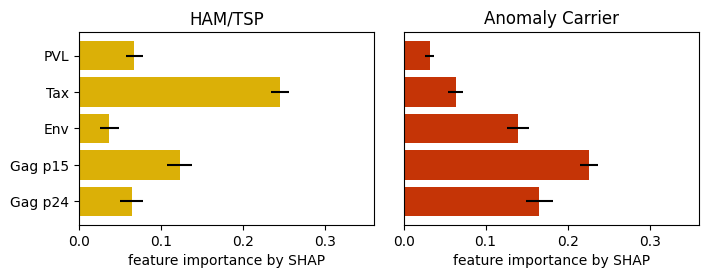

In [24]:
f_subjects = ["PVL", "Tax", "Env", "Gag p15", "Gag p24"]
b_ml_name_dict = {'ExtraTrees' : 0}
subgroup_name_dict = {0 : 'HAM/TSP', 1 : 'Anomaly Carrier'}
subgroup_color_dict = {'non-Anomaly Carrier' : '#58b743', 'ATL' : '#40409C', 'HAM/TSP' : '#dbb007', 'Anomaly Carrier' : "#c53406"}

figure, axis = plt.subplots(1, 2, figsize = (8, 2.5))

for subgroup_idx in subgroup_name_dict.keys():
    
    for b_ml_name in b_ml_name_dict.keys():

        f_scores = np.array([np.median(np.array( fi_all[b_ml_name] )[:, subgroup_idx+2, i]) for i in range(5)])
        f_err = np.array([np.std(np.array( fi_all[b_ml_name] )[:, subgroup_idx+2, i]) for i in range(5)])

        print(f_scores)
        
        axis[subgroup_idx].barh(f_subjects, f_scores, xerr = f_err, color = subgroup_color_dict[ subgroup_name_dict[subgroup_idx] ])
        
        
        axis[subgroup_idx].invert_yaxis()
        axis[subgroup_idx].set_xlabel("feature importance by SHAP", fontsize = 10)
        
        axis[subgroup_idx].set_xlim(0.0, 0.36)
        axis[subgroup_idx].set_xticks([0, 0.1, 0.2, 0.3])
        
        if subgroup_idx != 0:
            axis[subgroup_idx].axes.yaxis.set_visible(False)

        axis[subgroup_idx].set_title(subgroup_name_dict[subgroup_idx])


plt.subplots_adjust(wspace=0.1, hspace=0.9)
plt.show()

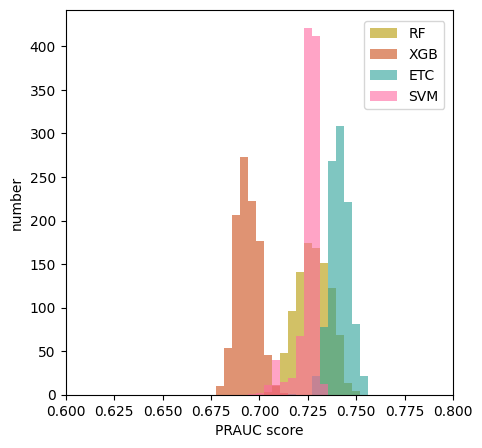

In [25]:
clf_color_dict = {'RandomForest' : '#b59800', 'ExtraTrees' : '#2aa198', 'XGB' : '#cb4b16', 'SVM' : "#FF68A1"}
clf_name_dict = {'RandomForest' : 'RF', 'ExtraTrees' : 'ETC', 'XGB' : 'XGB', 'SVM' : "SVM"}

n_bin = 20
x_max = max([rs_best_ml_dict[j][i]["mean_prauc"] for j in range(len(rs_best_ml_dict)) for i in ["RandomForest", "XGB", "ExtraTrees", "SVM"]])
x_min = min([rs_best_ml_dict[j][i]["mean_prauc"] for j in range(len(rs_best_ml_dict)) for i in ["RandomForest", "XGB", "ExtraTrees", "SVM"]])
bins = np.linspace(x_min, x_max, n_bin)

plt.figure(figsize = (5, 5))

for i in ["RandomForest", "XGB", "ExtraTrees", "SVM"]:

    plt.hist([rs_best_ml_dict[j][i]["mean_prauc"] for j in range(len(rs_best_ml_dict))], bins=bins, alpha = 0.6, label = clf_name_dict[i], color = clf_color_dict[i])

plt.xlim(0.6, 0.8)
plt.ylabel("number")
plt.xlabel("PRAUC score")
plt.legend(bbox_to_anchor=(0.77, 0.97), loc='upper left', borderaxespad=0, fontsize=10)
plt.show()

In [26]:
all_f_scores_rs_group_std = {"RandomForest" : [], "XGB" : [], "ExtraTrees" : [], "SVM" : []}
all_rs_group_list = []

feature_color_dict = {'PVL' : '#e43f59', 'Tax' : '#3f59e4', 'Env' : '#3fe44e', 'Gag p15' : "#e5cb3f", 'Gag p24' : "#ddb1b1"}

for sample_number in range(1, int(rs_number // 10)+1):
    
    # print(sample_number)
    
    rs_idx_list = [i for i in range(rs_number)]
    
    rs_group_list = []
    for _ in range(10):
        rs_group_list.append( random.sample(rs_idx_list, sample_number) )
        for rm_idx in rs_group_list[-1]:
            rs_idx_list.remove(rm_idx)

    for clf_idx in list( fi_all.keys() ):
        
        # print(clf_idx)
        
        f_scores_rs_group = []
        
        for rs_group_idx in rs_group_list:
            
            f_scores = np.array([np.median( fi_all[clf_idx][np.array(rs_group_idx)][:, :, i], axis = 0 ) for i in range(5)])
            
            f_scores_rs_group.append( f_scores.tolist() )
        
        all_f_scores_rs_group_std[clf_idx].append( list( np.array(f_scores_rs_group).std(0).mean(1) ) )

    all_rs_group_list.append( rs_group_list )


/tmp/ipykernel_2084/1435883821.py:54: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  if class_idx == "RandomForest":plt.legend()


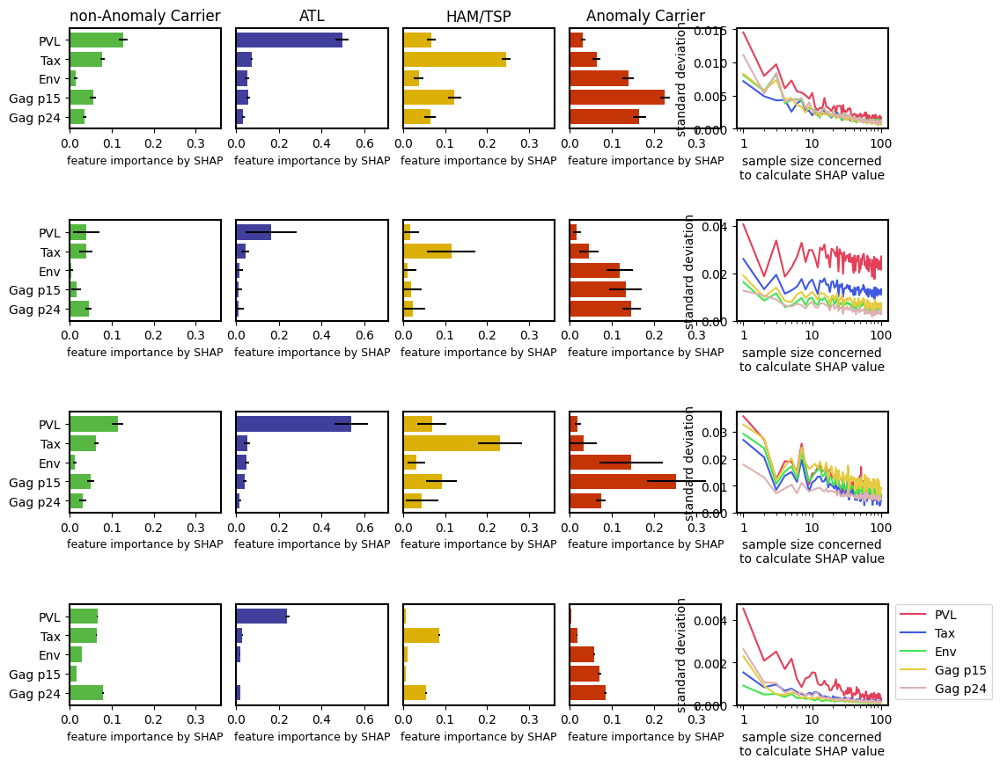

In [27]:
f_subjects = ["PVL", "Tax", "Env", "Gag p15", "Gag p24"]
b_ml_name_dict = {'ExtraTrees' : 0, 'RandomForest' : 1, 'SVM' : 2, 'XGB' : 3}
subgroup_name_dict = {0 : 'non-Anomaly Carrier', 1 : 'ATL', 2 : 'HAM/TSP', 3 : 'Anomaly Carrier'}
subgroup_color_dict = {'non-Anomaly Carrier' : '#58b743', 'ATL' : '#40409C', 'HAM/TSP' : '#dbb007', 'Anomaly Carrier' : "#c53406"}

figure, axis = plt.subplots(4, 5, figsize = (12, 10))

for subgroup_idx in subgroup_name_dict.keys():
    
    for b_ml_name in b_ml_name_dict.keys():
    
        f_scores = np.array([np.median(np.array( fi_all[b_ml_name] )[:, subgroup_idx, i]) for i in range(5)])
        f_err = np.array([np.std(np.array( fi_all[b_ml_name] )[:, subgroup_idx, i]) for i in range(5)])
        
        axis[b_ml_name_dict[b_ml_name], subgroup_idx].barh(f_subjects, f_scores, xerr = f_err, color = subgroup_color_dict[ subgroup_name_dict[subgroup_idx] ])
        
        
        axis[b_ml_name_dict[b_ml_name], subgroup_idx].invert_yaxis()
        axis[b_ml_name_dict[b_ml_name], subgroup_idx].set_xlabel("feature importance by SHAP", fontsize = 9)
        
        if subgroup_name_dict[subgroup_idx] == "ATL":
            axis[b_ml_name_dict[b_ml_name], subgroup_idx].set_xlim(0.0, 0.71)
            axis[b_ml_name_dict[b_ml_name], subgroup_idx].set_xticks([0, 0.2, 0.4, 0.6])
        else:
            axis[b_ml_name_dict[b_ml_name], subgroup_idx].set_xlim(0.0, 0.36)
            axis[b_ml_name_dict[b_ml_name], subgroup_idx].set_xticks([0, 0.1, 0.2, 0.3])
        
        if subgroup_idx != 0:
            axis[b_ml_name_dict[b_ml_name], subgroup_idx].axes.yaxis.set_visible(False)

        if b_ml_name == "ExtraTrees":
            axis[b_ml_name_dict[b_ml_name], subgroup_idx].set_title(subgroup_name_dict[subgroup_idx])
            
        axis[b_ml_name_dict[b_ml_name], subgroup_idx].spines["top"].set_linewidth(1.5)
        axis[b_ml_name_dict[b_ml_name], subgroup_idx].spines["left"].set_linewidth(1.5)
        axis[b_ml_name_dict[b_ml_name], subgroup_idx].spines["bottom"].set_linewidth(1.5)
        axis[b_ml_name_dict[b_ml_name], subgroup_idx].spines["right"].set_linewidth(1.5)

x_range_list = [10**n for n in range(len( str(rs_number) ))]
if rs_number == max(x_range_list):x_range_list = x_range_list[:-1]
x_range_str_list = [str(i) for i in x_range_list]

for class_idx in list( fi_all.keys() ):

    axis[ b_ml_name_dict[class_idx], 4 ].plot( np.arange(1, len(all_rs_group_list)+1), np.array(all_f_scores_rs_group_std[class_idx])[:, 0], label = list(feature_color_dict.keys())[0], color = feature_color_dict[ list(feature_color_dict.keys())[0] ] )
    axis[ b_ml_name_dict[class_idx], 4 ].plot( np.arange(1, len(all_rs_group_list)+1), np.array(all_f_scores_rs_group_std[class_idx])[:, 1], label = list(feature_color_dict.keys())[1], color = feature_color_dict[ list(feature_color_dict.keys())[1] ] )
    axis[ b_ml_name_dict[class_idx], 4 ].plot( np.arange(1, len(all_rs_group_list)+1), np.array(all_f_scores_rs_group_std[class_idx])[:, 2], label = list(feature_color_dict.keys())[2], color = feature_color_dict[ list(feature_color_dict.keys())[2] ] )
    axis[ b_ml_name_dict[class_idx], 4 ].plot( np.arange(1, len(all_rs_group_list)+1), np.array(all_f_scores_rs_group_std[class_idx])[:, 3], label = list(feature_color_dict.keys())[3], color = feature_color_dict[ list(feature_color_dict.keys())[3] ] )
    axis[ b_ml_name_dict[class_idx], 4 ].plot( np.arange(1, len(all_rs_group_list)+1), np.array(all_f_scores_rs_group_std[class_idx])[:, 4], label = list(feature_color_dict.keys())[4], color = feature_color_dict[ list(feature_color_dict.keys())[4] ] )
    axis[ b_ml_name_dict[class_idx], 4 ].set_ylim(0,)
    axis[ b_ml_name_dict[class_idx], 4 ].set_xscale("log")
    axis[ b_ml_name_dict[class_idx], 4 ].set_xticks(x_range_list)
    axis[ b_ml_name_dict[class_idx], 4 ].set_xticklabels(x_range_str_list)
    if class_idx == "RandomForest":plt.legend()
    else:pass
    axis[ b_ml_name_dict[class_idx], 4 ].set_xlabel("sample size concerned\nto calculate SHAP value", fontsize = 10)
    axis[ b_ml_name_dict[class_idx], 4 ].set_ylabel("standard deviation")
    axis[ b_ml_name_dict[class_idx], 4 ].spines["top"].set_linewidth(1.5)
    axis[ b_ml_name_dict[class_idx], 4 ].spines["left"].set_linewidth(1.5)
    axis[ b_ml_name_dict[class_idx], 4 ].spines["bottom"].set_linewidth(1.5)
    axis[ b_ml_name_dict[class_idx], 4 ].spines["right"].set_linewidth(1.5)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.subplots_adjust(wspace=0.1, hspace=0.9)
plt.show()